# INN Hotels Project

## Context

A significant number of hotel bookings are called-off due to cancellations or no-shows. The typical reasons for cancellations include change of plans, scheduling conflicts, etc. This is often made easier by the option to do so free of charge or preferably at a low cost which is beneficial to hotel guests but it is a less desirable and possibly revenue-diminishing factor for hotels to deal with. Such losses are particularly high on last-minute cancellations.

The new technologies involving online booking channels have dramatically changed customers’ booking possibilities and behavior. This adds a further dimension to the challenge of how hotels handle cancellations, which are no longer limited to traditional booking and guest characteristics.

The cancellation of bookings impact a hotel on various fronts:
* Loss of resources (revenue) when the hotel cannot resell the room.
* Additional costs of distribution channels by increasing commissions or paying for publicity to help sell these rooms.
* Lowering prices last minute, so the hotel can resell a room, resulting in reducing the profit margin.
* Human resources to make arrangements for the guests.

## Objective
The increasing number of cancellations calls for a Machine Learning based solution that can help in predicting which booking is likely to be canceled. INN Hotels Group has a chain of hotels in Portugal, they are facing problems with the high number of booking cancellations and have reached out to your firm for data-driven solutions. You as a data scientist have to analyze the data provided to find which factors have a high influence on booking cancellations, build a predictive model that can predict which booking is going to be canceled in advance, and help in formulating profitable policies for cancellations and refunds.

## Data Description
The data contains the different attributes of customers' booking details. The detailed data dictionary is given below.


**Data Dictionary**

* Booking_ID: unique identifier of each booking
* no_of_adults: Number of adults
* no_of_children: Number of Children
* no_of_weekend_nights: Number of weekend nights (Saturday or Sunday) the guest stayed or booked to stay at the hotel
* no_of_week_nights: Number of week nights (Monday to Friday) the guest stayed or booked to stay at the hotel
* type_of_meal_plan: Type of meal plan booked by the customer:
    * Not Selected – No meal plan selected
    * Meal Plan 1 – Breakfast
    * Meal Plan 2 – Half board (breakfast and one other meal)
    * Meal Plan 3 – Full board (breakfast, lunch, and dinner)
* required_car_parking_space: Does the customer require a car parking space? (0 - No, 1- Yes)
* room_type_reserved: Type of room reserved by the customer. The values are ciphered (encoded) by INN Hotels.
* lead_time: Number of days between the date of booking and the arrival date
* arrival_year: Year of arrival date
* arrival_month: Month of arrival date
* arrival_date: Date of the month
* market_segment_type: Market segment designation.
* repeated_guest: Is the customer a repeated guest? (0 - No, 1- Yes)
* no_of_previous_cancellations: Number of previous bookings that were canceled by the customer prior to the current booking
* no_of_previous_bookings_not_canceled: Number of previous bookings not canceled by the customer prior to the current booking
* avg_price_per_room: Average price per day of the reservation; prices of the rooms are dynamic. (in euros)
* no_of_special_requests: Total number of special requests made by the customer (e.g. high floor, view from the room, etc)
* booking_status: Flag indicating if the booking was canceled or not.

## Importing necessary libraries and data

In [ ]:
# Installing the libraries with the specified version.
!pip install pandas==1.5.3 numpy==1.25.2 matplotlib==3.7.1 seaborn==0.13.1 scikit-learn==1.2.2 statsmodels==0.14.1 -q --user

**Note**: *After running the above cell, kindly restart the notebook kernel and run all cells sequentially from the start again.*

In [ ]:
# Libraries to help with reading and manipulating data
import pandas as pd
import numpy as np

# libaries to help with data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Removes the limit for the number of displayed columns
pd.set_option("display.max_columns", None)
# Sets the limit for the number of displayed rows
pd.set_option("display.max_rows", 200)
# setting the precision of floating numbers to 5 decimal points
pd.set_option("display.float_format", lambda x: "%.5f" % x)

# Library to split data
from sklearn.model_selection import train_test_split

# To build model for prediction
import statsmodels.stats.api as sms
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.api as sm
from statsmodels.tools.tools import add_constant
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree

# To tune different models
from sklearn.model_selection import GridSearchCV


# To get diferent metric scores
from sklearn.metrics import (
    f1_score,
    accuracy_score,
    recall_score,
    precision_score,
    confusion_matrix,
    roc_auc_score,
    precision_recall_curve,
    roc_curve,
    make_scorer,
)

import warnings
warnings.filterwarnings("ignore")

from statsmodels.tools.sm_exceptions import ConvergenceWarning
warnings.simplefilter("ignore", ConvergenceWarning)

## Data Overview

- Observations
- Sanity checks

In [ ]:
# loading the dataset
data = pd.read_csv("INNHotelsGroup.csv")

# making a copy of the data
df = data.copy()

In [ ]:
# Function to perform the data overview: shape, info, describe, missing vakues, duplicates, head and tail

from IPython.display import display, HTML
def display_dataframe_info(data_display, df_name="Your Dataframe Name", title="Dataframe Information"):
    """
    Displays detailed information about a dataframe using IPython.display and formatting.

    Args:
        data_display: The Pandas DataFrame to analyze.
        title (optional): A title for the displayed information.
        df_name (optional): The name of the dataframe to display after the title.

    Returns:
        None
    """
    display(HTML(f"<h1 style='font-weight: bold'>{title} for {df_name}</h1>"))

    # Display shape, info and description

    display(HTML(f"<p style='font-weight: bold'>Shape:</p>"))
    display(data_display.shape)
    display(HTML(f"<p style='font-weight: bold'>Information:</p>"))
    display(data_display.info())
    display(HTML(f"<p style='font-weight: bold'>Description:</p>"))
    display(data_display.describe(include = "all").T)

    # Display head and tail

    display(HTML(f"<p style='font-weight: bold'>Head (First 5 rows):</p>"))
    display(data_display.head())
    display(HTML(f"<p style='font-weight: bold'>Tail (Last 5 rows):</p>"))
    display(data_display.tail())

    # Display duplicates

    duplicate_count = data_display.duplicated().sum()
    display(HTML(f"<p style='font-weight: bold'>Duplicates:</p>"))
    display(f"Number of duplicate rows: {duplicate_count}")

    # Optionally show specific duplicates

    if duplicate_count > 0:
        display(HTML(f"<p style='font-weight: bold'>Duplicate Rows:</p>"))
        display(data_display[data_display.duplicated()])

    # Display missing values

    display(HTML(f"<p style='font-weight: bold'>Missing Values:</p>"))
    missing_values_df = data_display.isnull().sum().reset_index(name="Count")
    missing_values_df["Percentage"] = (
        missing_values_df["Count"] / data_display.shape[0]
    ) * 100
    top_missing_values = missing_values_df.nlargest(10, "Count").rename(
        columns={"index": "Column Name"}
    )
    display(top_missing_values)


In [ ]:
display_dataframe_info(df,"INN Hotel Booking Project", "INN Hotel Booking Information")

(36275, 19)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36275 entries, 0 to 36274
Data columns (total 19 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Booking_ID                            36275 non-null  object 
 1   no_of_adults                          36275 non-null  int64  
 2   no_of_children                        36275 non-null  int64  
 3   no_of_weekend_nights                  36275 non-null  int64  
 4   no_of_week_nights                     36275 non-null  int64  
 5   type_of_meal_plan                     36275 non-null  object 
 6   required_car_parking_space            36275 non-null  int64  
 7   room_type_reserved                    36275 non-null  object 
 8   lead_time                             36275 non-null  int64  
 9   arrival_year                          36275 non-null  int64  
 10  arrival_month                         36275 non-null  int64  
 11  arrival_date   

None

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Booking_ID,36275,36275,INN00001,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
no_of_adults,36275.00000,NaN,NaN,NaN,1.84496,0.51871,0.00000,2.00000,2.00000,2.00000,4.00000
no_of_children,36275.00000,NaN,NaN,NaN,0.10528,0.40265,0.00000,0.00000,0.00000,0.00000,10.00000
no_of_weekend_nights,36275.00000,NaN,NaN,NaN,0.81072,0.87064,0.00000,0.00000,1.00000,2.00000,7.00000
no_of_week_nights,36275.00000,NaN,NaN,NaN,2.20430,1.41090,0.00000,1.00000,2.00000,3.00000,17.00000
type_of_meal_plan,36275,4,Meal Plan 1,27835,NaN,NaN,NaN,NaN,NaN,NaN,NaN
required_car_parking_space,36275.00000,NaN,NaN,NaN,0.03099,0.17328,0.00000,0.00000,0.00000,0.00000,1.00000
room_type_reserved,36275,7,Room_Type 1,28130,NaN,NaN,NaN,NaN,NaN,NaN,NaN
lead_time,36275.00000,NaN,NaN,NaN,85.23256,85.93082,0.00000,17.00000,57.00000,126.00000,443.00000
arrival_year,36275.00000,NaN,NaN,NaN,2017.82043,0.38384,2017.00000,2018.00000,2018.00000,2018.00000,2018.00000


,Booking_ID,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,arrival_date,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status
0,INN00001,2,0,1,2,Meal Plan 1,0,Room_Type 1,224,2017,10,2,Offline,0,0,0,65.00000,0,Not_Canceled
1,INN00002,2,0,2,3,Not Selected,0,Room_Type 1,5,2018,11,6,Online,0,0,0,106.68000,1,Not_Canceled
2,INN00003,1,0,2,1,Meal Plan 1,0,Room_Type 1,1,2018,2,28,Online,0,0,0,60.00000,0,Canceled
3,INN00004,2,0,0,2,Meal Plan 1,0,Room_Type 1,211,2018,5,20,Online,0,0,0,100.00000,0,Canceled
4,INN00005,2,0,1,1,Not Selected,0,Room_Type 1,48,2018,4,11,Online,0,0,0,94.50000,0,Canceled


,Booking_ID,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,arrival_date,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status
36270,INN36271,3,0,2,6,Meal Plan 1,0,Room_Type 4,85,2018,8,3,Online,0,0,0,167.80000,1,Not_Canceled
36271,INN36272,2,0,1,3,Meal Plan 1,0,Room_Type 1,228,2018,10,17,Online,0,0,0,90.95000,2,Canceled
36272,INN36273,2,0,2,6,Meal Plan 1,0,Room_Type 1,148,2018,7,1,Online,0,0,0,98.39000,2,Not_Canceled
36273,INN36274,2,0,0,3,Not Selected,0,Room_Type 1,63,2018,4,21,Online,0,0,0,94.50000,0,Canceled
36274,INN36275,2,0,1,2,Meal Plan 1,0,Room_Type 1,207,2018,12,30,Offline,0,0,0,161.67000,0,Not_Canceled


'Number of duplicate rows: 0'

,Column Name,Count,Percentage
0,Booking_ID,0,0.00000
1,no_of_adults,0,0.00000
2,no_of_children,0,0.00000
3,no_of_weekend_nights,0,0.00000
4,no_of_week_nights,0,0.00000
5,type_of_meal_plan,0,0.00000
6,required_car_parking_space,0,0.00000
7,room_type_reserved,0,0.00000
8,lead_time,0,0.00000
9,arrival_year,0,0.00000


##### Observations
1.  There are 36,275 rows of data and 19 columns (attributes).
2.  There are no missing values.
3.  There are no duplicated rows.
4.  From data info:
   > 1. We see that every column has 36275 non-null values (hence no missing values).
     2. There are 14 numeric variables (1 float and 13 integer) and 5 object variables.
1. From the data description:
   > 1. `Booking_ID`, is the unique identifier for each booking.
   > 2.  The average `number_of_adults` is 1.8 with a range of 0 to 4.
   > 3.  The average `number_of_children` is 0.11, with a range of 0 to 10.
   > 4.  The average `number_of_weekend_nights` is 0.8, with a range of 0 to 7.
   > 5.  There are 4 `type_of_meal_plan`, `Meal Plan 1` is the most popular with 27,835 bookings selecting this meal plan.
   > 6.  The average `required_car_parking_space` is 0.031 with a range of 0 to 1.
   > 7.  There are 7 `room_type_reserved`, `Room_Type 1` is the most popular, with 28,130 bookings requesting this room type.
   > 8.  The average `lead_time` is 85.2 days, with a range of 0 days to 443 days.
   > 9.  `arrival_year` ranges from 2017 to 2018, this variable is an integer but should be an object.
   > 10.  `arrival_month` ranges from January to December, this variable is an integer but should be an object.
   > 11.  `arrival_date` ranges from 1 to 31, this variable is an integer but should also be an object.
   > 12.  There are 5 `market_segment_type`, `Online` is the most popular with 23,214 booking made online.
   > 13.  `repeated_guest` can be either 0 (no) or 1 (yes). This variable is an integer but it should be an object.
   > 14.  `no_of_previous_cancellations` on average is 0.02 and ranges from 0 to 13.
   > 15.  `no_of_previous_bookings_not_cancelled` on average is 0.15 and ranges from 0 to 58.
   > 16.  `avg_price_per_room` on average is 103.42 euros, with a range of 0 to 540 euros.
   > 17.  `no_of_special_requests` on average is 0.6, with a range of 0 to 5
   > 18.  `booking_status` has 2 unique values with *Not Cancelled* most frequent with 24,390 bookings

### Dropping the columns with unique values

In [ ]:
df = df.drop(["Booking_ID"], axis=1)

## Exploratory Data Analysis (EDA)

- EDA is an important part of any project involving data.
- It is important to investigate and understand the data better before building a model with it.
- A few questions have been mentioned below which will help you approach the analysis in the right manner and generate insights from the data.
- A thorough analysis of the data, in addition to the questions mentioned below, should be done.

**Leading Questions**:
1. What are the busiest months in the hotel?
   > The busiest month in the hotel is month 10, with 5317 bookings
3. Which market segment do most of the guests come from?
   >  Most of the guests come from online, with 64% of the bookings
5. Hotel rates are dynamic and change according to demand and customer demographics. What are the differences in room prices in different market segments?
   > Market segment type Online had the highest average room price rate.  Market segment type Complementary had the lowest average room price rate as expected.  Bookings which were cancelled have a higher average room price rate compared to bookings which were not cancelled, except for market segment type Complementary, where there are no cancellations
7. What percentage of bookings are canceled?
   > 32.8 percent of bookings are cancelled
8. Repeating guests are the guests who stay in the hotel often and are important to brand equity. What percentage of repeating guests cancel?
    > The percentage of repeating guests who cancel is 0.044 %

10. Many guests have special requirements when booking a hotel room. Do these requirements affect booking cancellation
    >Rooms which are not cancelled have a higher amount of special requests?

## Univariate Analysis

In [ ]:
def histogram_boxplot(data, feature, figsize=(15, 10), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (15,10))
    kde: whether to show the density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="violet"
    )  # boxplot will be created and a triangle will indicate the mean value of the column
    sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins
    ) if bins else sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram

In [ ]:
# function to create labeled barplots


def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 2, 6))
    else:
        plt.figure(figsize=(n + 2, 6))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n],
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

In [ ]:
# function to plot a stacked barplot

def stacked_barplot(data, predictor, target):
    """
    Print the category counts and plot a stacked bar chart

    data: dataframe
    predictor: independent variable
    target: target variable
    """
    count = data[predictor].nunique()
    sorter = data[target].value_counts().index[-1]
    tab1 = pd.crosstab(data[predictor], data[target], margins=True).sort_values(
        by=sorter, ascending=False
    )
    print(tab1)
    print("-" * 120)
    tab = pd.crosstab(data[predictor], data[target], normalize="index").sort_values(
        by=sorter, ascending=False
    )
    tab.plot(kind="bar", stacked=True, figsize=(count + 5, 5))
    plt.legend(
        loc="lower left", frameon=False,
    )
    plt.legend(loc="upper left", bbox_to_anchor=(1, 1))
    plt.show()

In [ ]:
### function to plot distributions wrt target


def distribution_plot_wrt_target(data, predictor, target):

    fig, axs = plt.subplots(2, 2, figsize=(12, 10))

    target_uniq = data[target].unique()

    axs[0, 0].set_title("Distribution of target for target=" + str(target_uniq[0]))
    sns.histplot(
        data=data[data[target] == target_uniq[0]],
        x=predictor,
        kde=True,
        ax=axs[0, 0],
        color="teal",
        stat="density",
    )

    axs[0, 1].set_title("Distribution of target for target=" + str(target_uniq[1]))
    sns.histplot(
        data=data[data[target] == target_uniq[1]],
        x=predictor,
        kde=True,
        ax=axs[0, 1],
        color="orange",
        stat="density",
    )

    axs[1, 0].set_title("Boxplot w.r.t target")
    sns.boxplot(data=data, x=target, y=predictor, ax=axs[1, 0], palette="gist_rainbow")

    axs[1, 1].set_title("Boxplot (without outliers) w.r.t target")
    sns.boxplot(
        data=data,
        x=target,
        y=predictor,
        ax=axs[1, 1],
        showfliers=False,
        palette="gist_rainbow",
    )

    plt.tight_layout()
    plt.show()

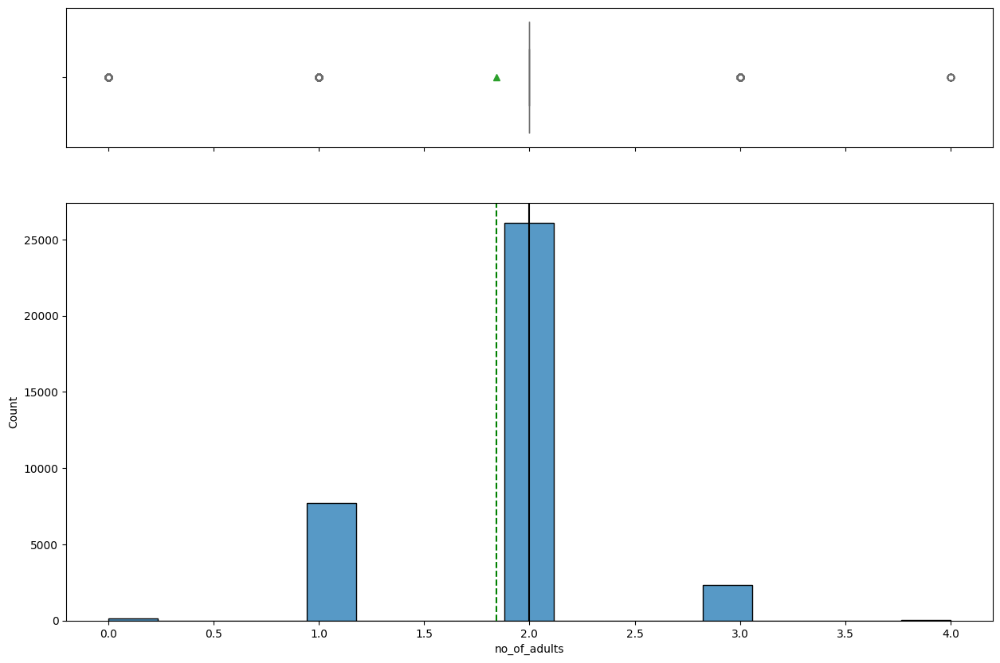

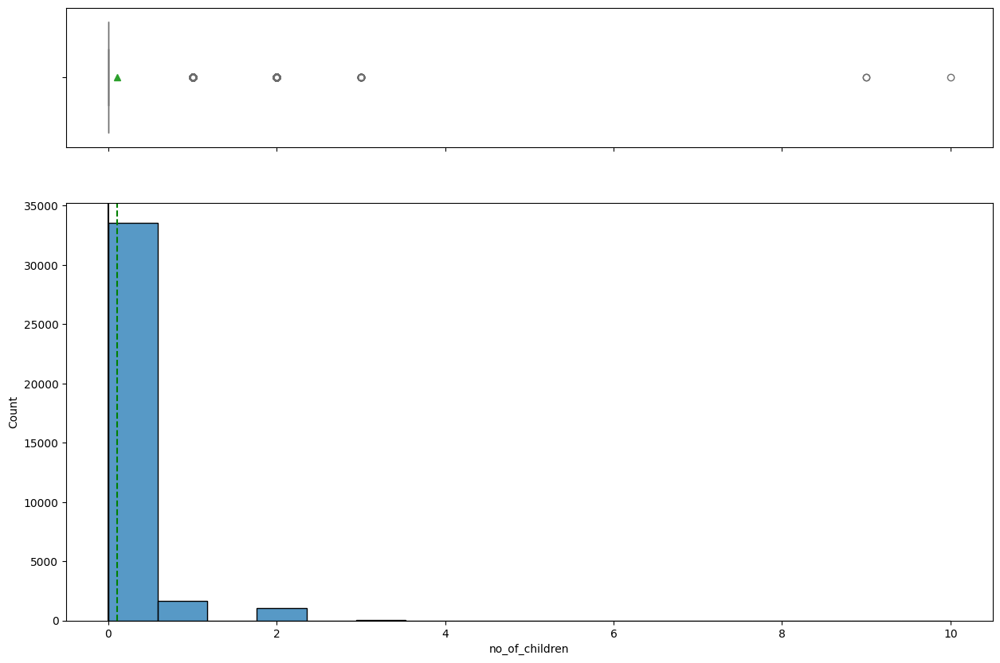

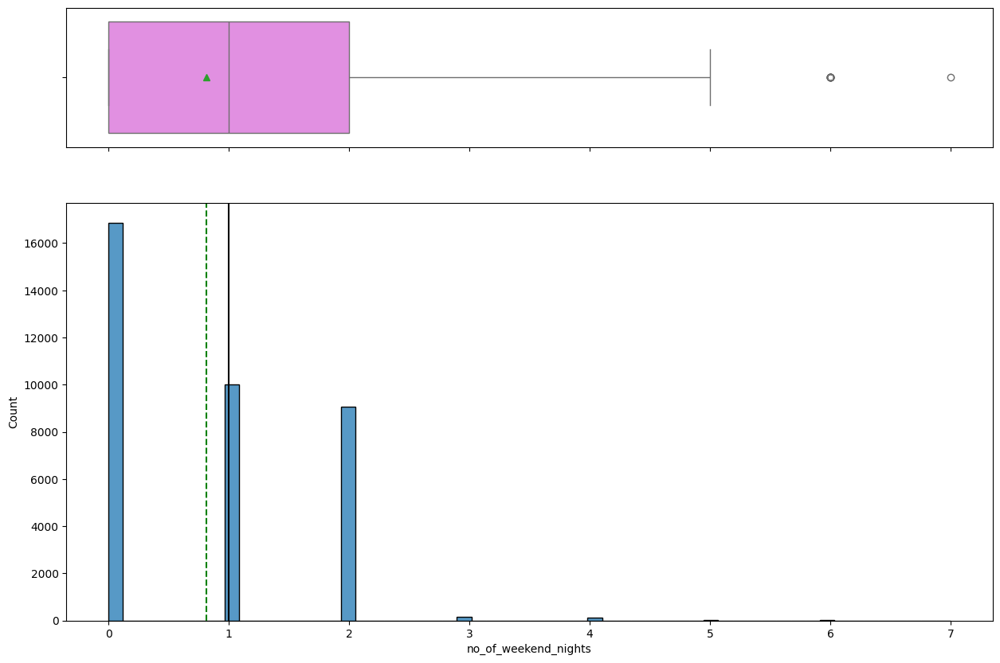

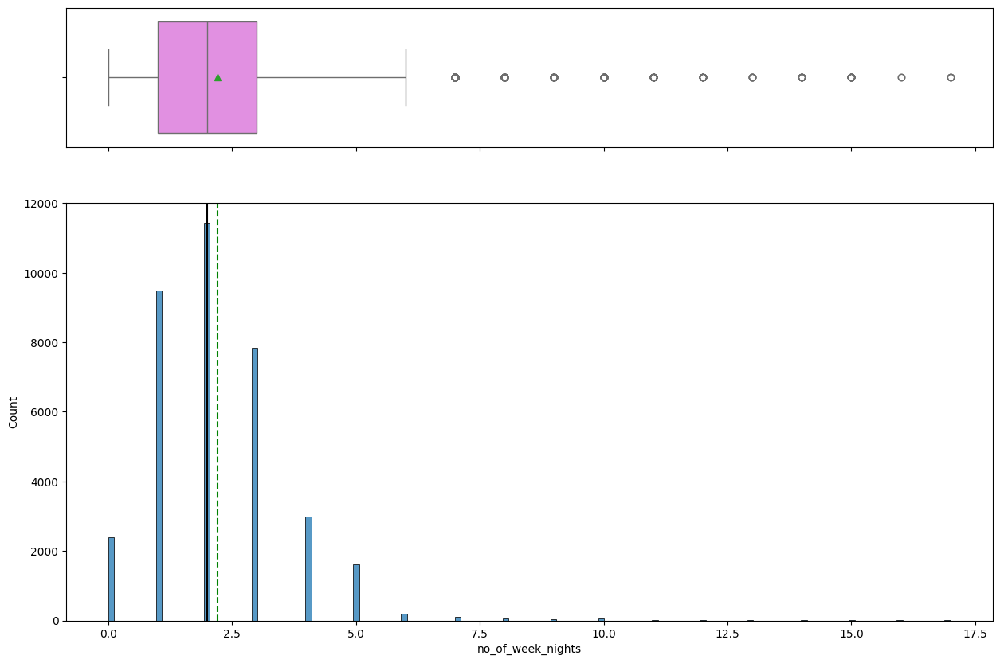

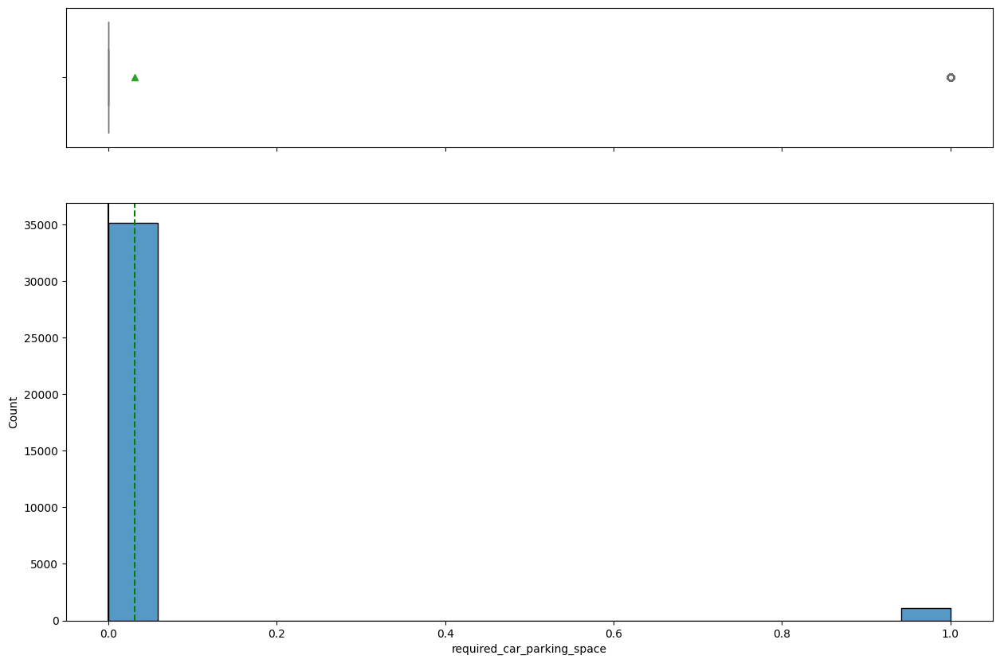

...

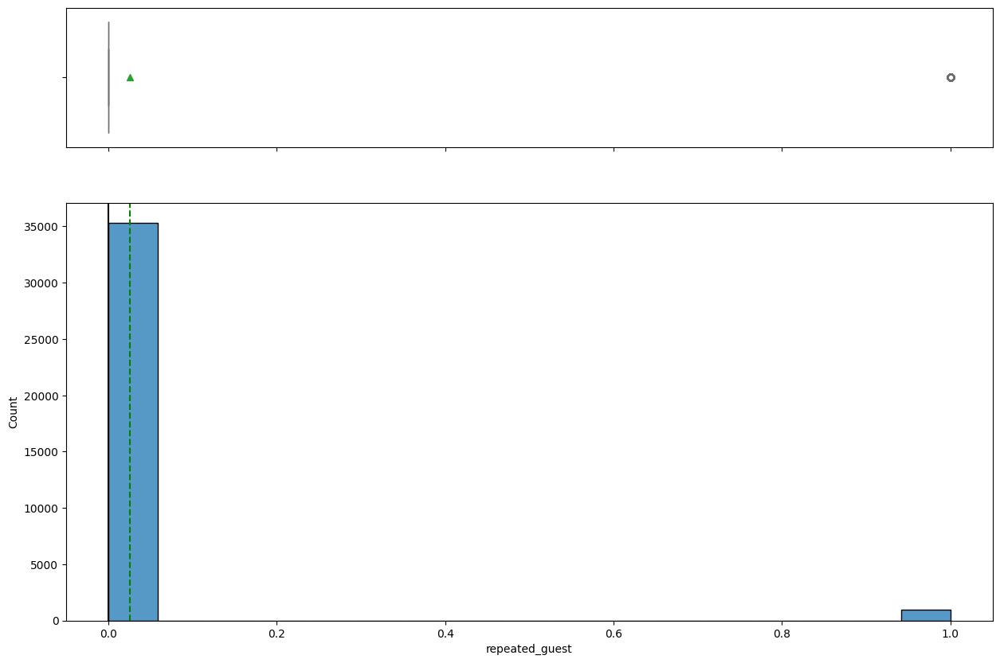

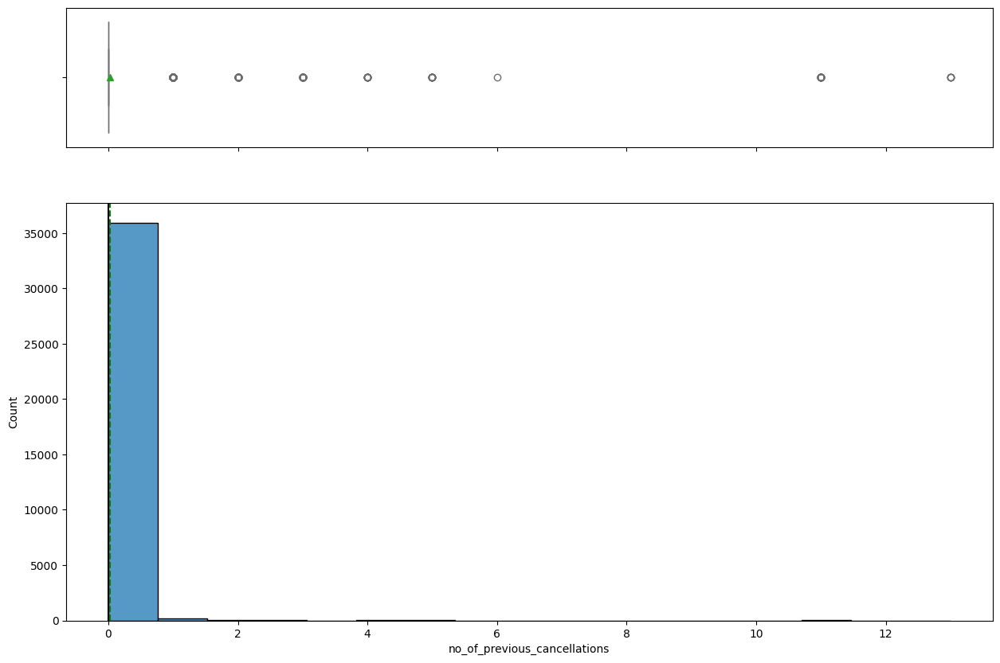

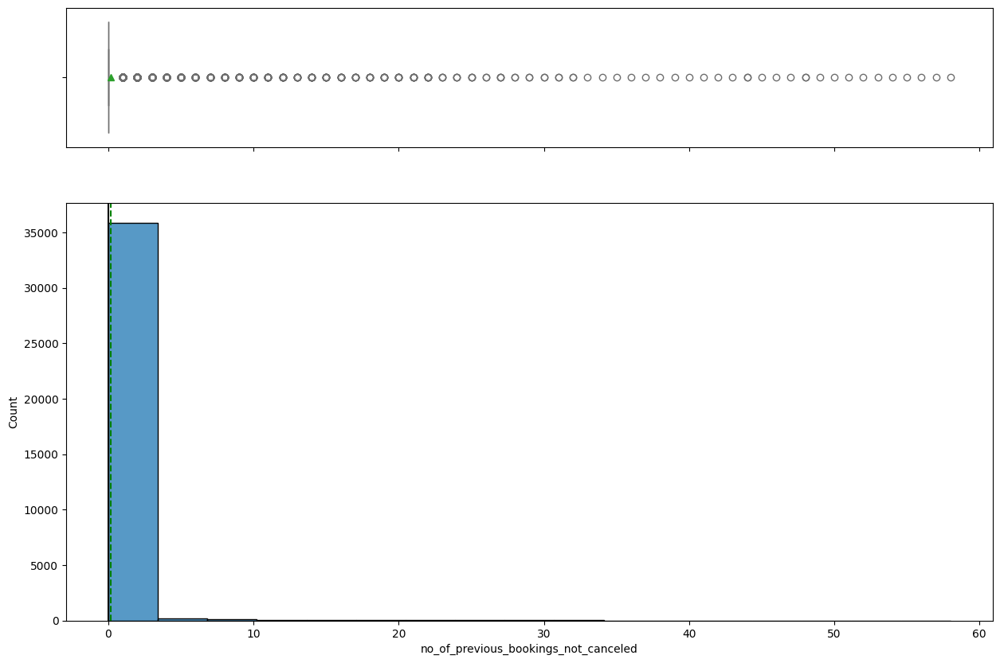

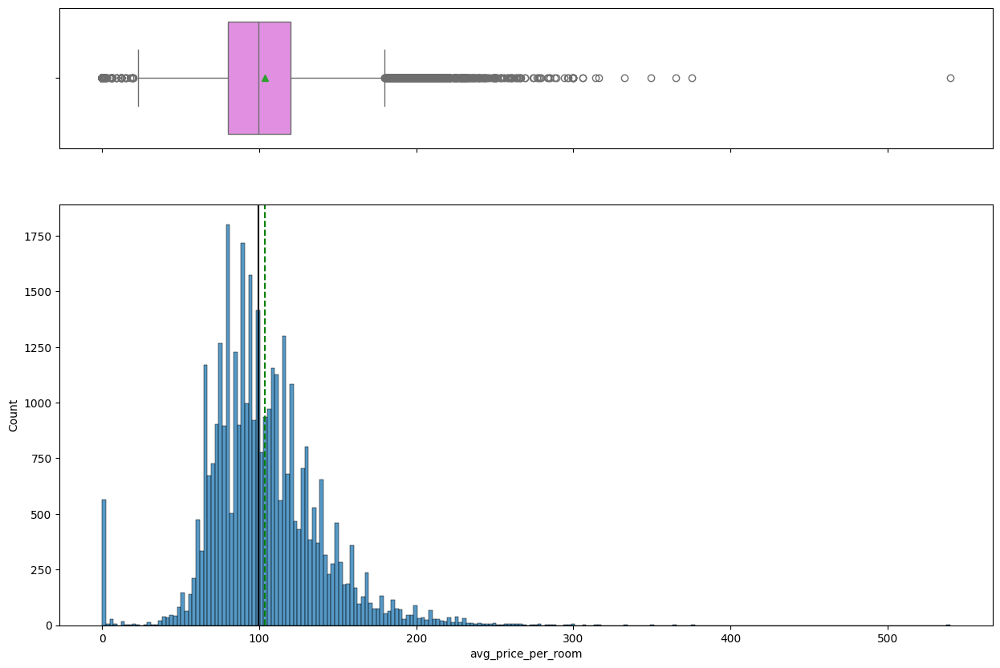

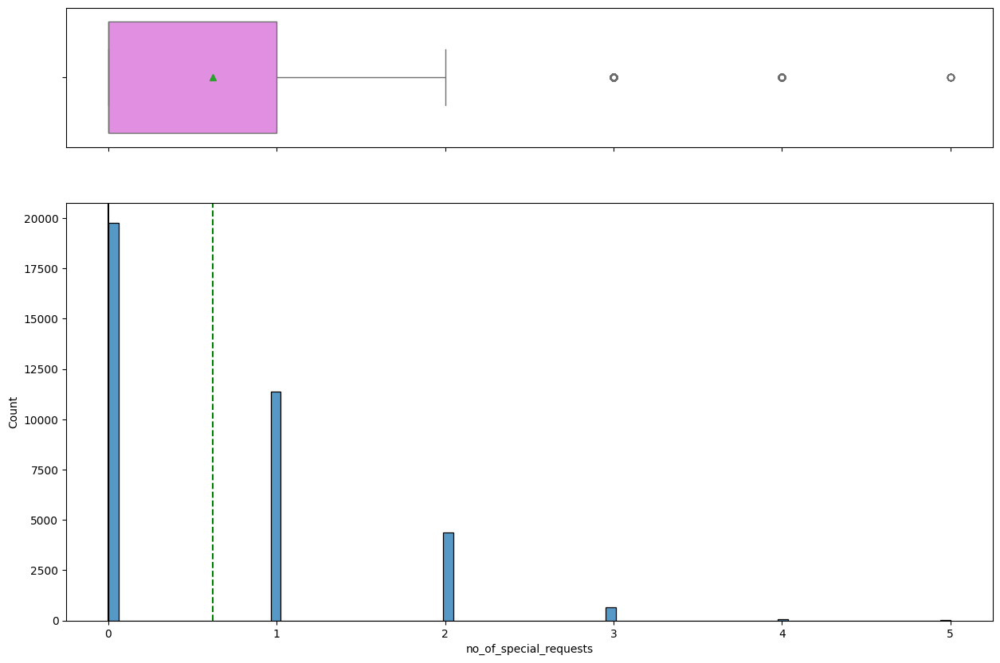

In [ ]:
# loop to plot histogram_plot for numeric variables
num_cols = df.select_dtypes(include = np.number).columns
for col in num_cols:
    histogram_boxplot(df, col)

In [ ]:
df['arrival_month'].value_counts()

10    5317
9     4611
8     3813
6     3203
12    3021
11    2980
7     2920
4     2736
5     2598
3     2358
2     1704
1     1014
Name: arrival_month, dtype: int64

##### Observations
* `no_of_adults`follows a normal distribution with a mean of 2.  From the boxplot we see there is very little variance in this dataset. There are outliers.
* `no_of_children` is right skewed with a mean of 0.  There is very little variance in this dataset.  There are outliers.
* `no_of_weekend_nights` is right skewed with a mean of 1.  There are outliers
* `no_of_week_nights` is right skewed with an approx. mean of 2.  There are outliers
* `required_car_park_space` has a mean of 1.  There are outliers.
* `lead_time` is right skewed with an approximate mean of 50 days.  There are outliers to the right
* There are more bookings in 2018 than on 2017.  There are only 2 years of data available.  In 2017 there were approx. 7000 bookings, in 2018 there just under 30,000 bookings
* Most bookings were done in month 8.  Month 1 had the least amount of bookings.  This data is left skewed
* `arrival_date` on average is 16
* most guests are not repeated guests
* `no_of_previous_cancellations` has a mean of approx. 0.  Most bookings do not have previous cancellations, approx. 35,000.  There are outliers
* `no_of_previous_bookings_not_cancelled` has a mean of approx. 0.  There are outliers.
* `avg_price_pre_room` has a mean of approx. 100 euros.  The data is right skewed.  There are approx 600 bookings with an price of 0 euros.
* Approx. 20,000 bookings had no special requests.  As the number of special requests increased the number of bookings decreased.  The maximum number of special requests was 5

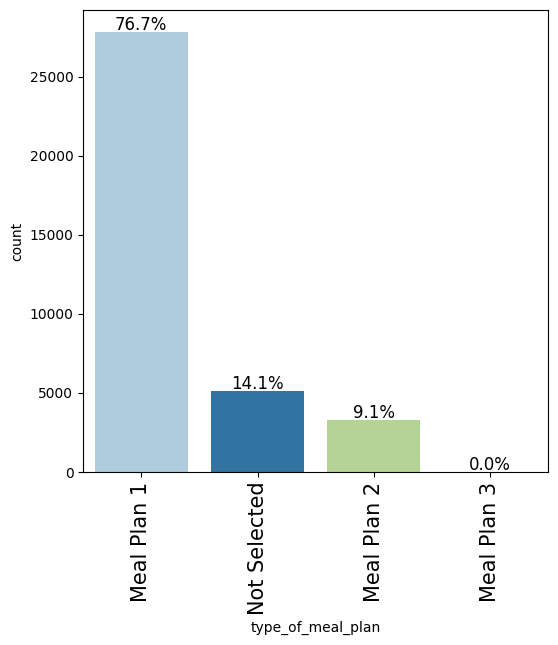

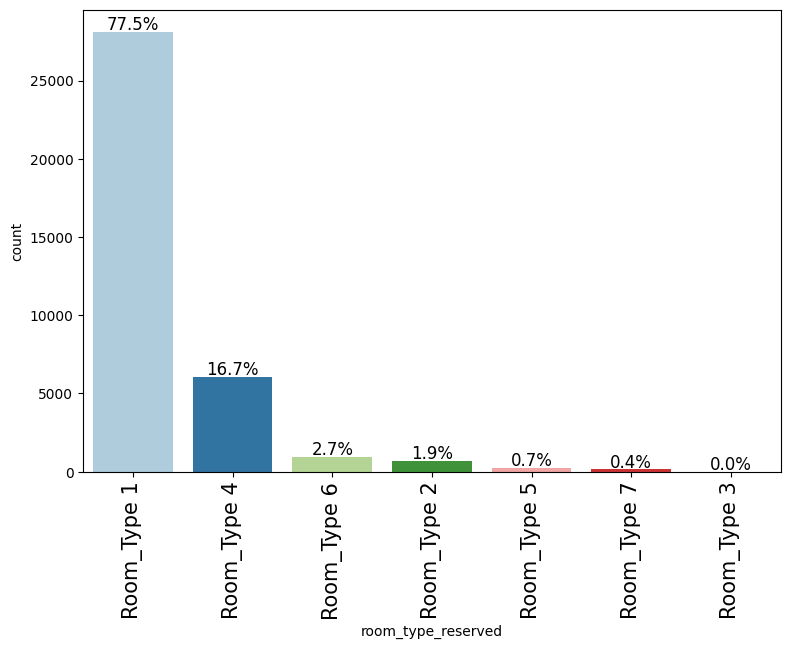

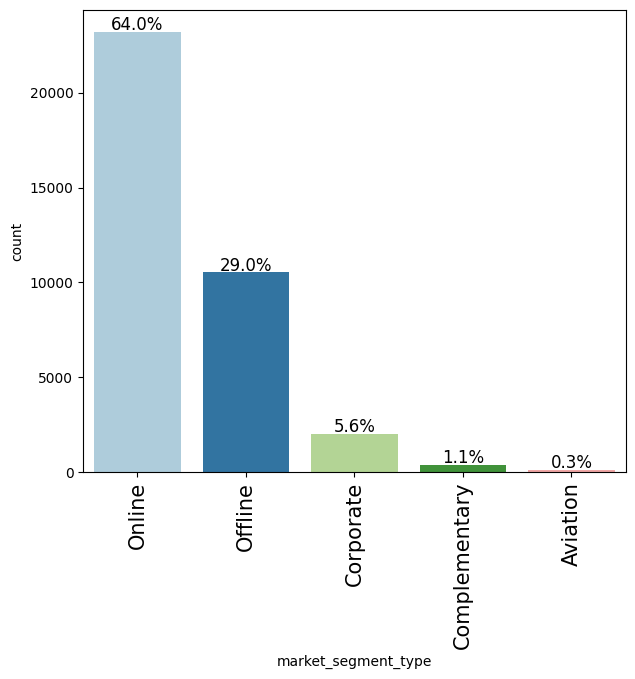

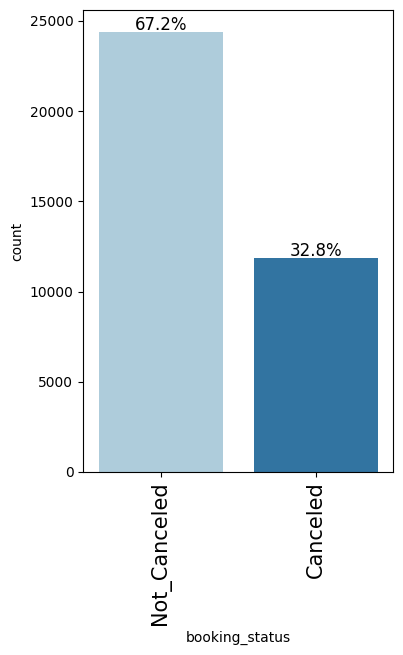

In [ ]:
# loop to plot labeled_barplot for non-numeric variables
non_num_cols = df.select_dtypes(exclude = np.number).columns
#X = df1.drop(["normalized_used_price"], axis=1)
for col in non_num_cols:
    labeled_barplot(df, col, perc=True)

In [ ]:
non_num_cols

Index(['type_of_meal_plan', 'room_type_reserved', 'market_segment_type',
       'booking_status'],
      dtype='object')

#### Examining the `avg_price_per_room` variable as some rooms were 0 euros

In [ ]:
df[(df["avg_price_per_room"]==0)].reset_index()

,index,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,arrival_date,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status
0,63,1,0,0,1,Meal Plan 1,0,Room_Type 1,2,2017,9,10,Complementary,0,0,0,0.00000,1,Not_Canceled
1,145,1,0,0,2,Meal Plan 1,0,Room_Type 1,13,2018,6,1,Complementary,1,3,5,0.00000,1,Not_Canceled
2,209,1,0,0,0,Meal Plan 1,0,Room_Type 1,4,2018,2,27,Complementary,0,0,0,0.00000,1,Not_Canceled
3,266,1,0,0,2,Meal Plan 1,0,Room_Type 1,1,2017,8,12,Complementary,1,0,1,0.00000,1,Not_Canceled
4,267,1,0,2,1,Meal Plan 1,0,Room_Type 1,4,2017,8,23,Complementary,0,0,0,0.00000,1,Not_Canceled
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
540,35983,1,0,0,1,Meal Plan 1,0,Room_Type 7,0,2018,6,7,Complementary,1,4,17,0.00000,1,Not_Canceled
541,36080,1,0,1,1,Meal Plan 1,0,Room_Type 7,0,2018,3,21,Complementary,1,3,15,0.00000,1,Not_Canceled
542,36114,1,0,0,1,Meal Plan 1,0,Room_Type 1,1,2018,3,2,Online,0,0,0,0.00000,0,Not_Canceled
543,36217,2,0,2,1,Meal Plan 1,0,Room_Type 2,3,2017,8,9,Online,0,0,0,0.00000,2,Not_Canceled


* There are 545 rooms with an `avg_price_per_room` of 0 euros.
* We see that some of these ookings are Complementary and hence the price is expected to be 0 euros, however, some are online bookings
* Let us examine the online bookings further

In [ ]:
#Examining avg_price_per_room` by market_segment
zero_price_not_complementary = df[(df["avg_price_per_room"]==0) & (df["market_segment_type"]!= "Complementary")].sort_values('market_segment_type').reset_index()
zero_price_not_complementary.head()

,index,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,arrival_date,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status
0,1046,1,0,0,2,Meal Plan 2,0,Room_Type 1,6,2017,12,10,Online,0,0,0,0.00000,0,Not_Canceled
1,24307,2,0,0,0,Meal Plan 1,0,Room_Type 1,0,2017,11,14,Online,0,0,0,0.00000,2,Not_Canceled
2,24347,1,0,2,2,Meal Plan 1,0,Room_Type 1,116,2018,2,28,Online,0,0,0,0.00000,0,Not_Canceled
3,24653,2,0,0,1,Meal Plan 1,0,Room_Type 1,43,2017,10,23,Online,0,0,0,0.00000,0,Not_Canceled
4,24658,1,0,0,1,Meal Plan 1,0,Room_Type 1,5,2017,10,21,Online,0,0,0,0.00000,0,Not_Canceled


In [ ]:
zero_price_not_complementary.shape

(191, 19)

In [ ]:
zero_price_not_complementary["market_segment_type"].value_counts()

Online    191
Name: market_segment_type, dtype: int64

In [ ]:
zero_price_not_complementary["booking_status"].value_counts()

Not_Canceled    185
Canceled          6
Name: booking_status, dtype: int64

In [ ]:
zero_price_not_complementary.describe(include = "all")

,index,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,arrival_date,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status
count,191.00000,191.00000,191.00000,191.00000,191.00000,191,191.00000,191,191.00000,191.00000,191.00000,191.00000,191,191.00000,191.00000,191.00000,191.00000,191.00000,191
unique,NaN,NaN,NaN,NaN,NaN,3,NaN,6,NaN,NaN,NaN,NaN,1,NaN,NaN,NaN,NaN,NaN,2
top,NaN,NaN,NaN,NaN,NaN,Meal Plan 1,NaN,Room_Type 1,NaN,NaN,NaN,NaN,Online,NaN,NaN,NaN,NaN,NaN,Not_Canceled
freq,NaN,NaN,NaN,NaN,NaN,115,NaN,168,NaN,NaN,NaN,NaN,191,NaN,NaN,NaN,NaN,NaN,185
mean,19269.25131,1.38220,0.05236,0.24607,1.06806,NaN,0.00000,NaN,49.31937,2017.46073,8.30890,14.57592,NaN,0.02618,0.01047,0.02618,0.00000,0.43979,NaN
std,10051.41765,0.51860,0.30328,0.54981,1.00555,NaN,0.00000,NaN,81.70034,0.49977,3.21409,7.64841,NaN,0.16008,0.10206,0.23918,0.00000,0.72205,NaN
min,1046.00000,0.00000,0.00000,0.00000,0.00000,NaN,0.00000,NaN,0.00000,2017.00000,1.00000,1.00000,NaN,0.00000,0.00000,0.00000,0.00000,0.00000,NaN
25%,10949.00000,1.00000,0.00000,0.00000,0.00000,NaN,0.00000,NaN,4.00000,2017.00000,6.00000,9.00000,NaN,0.00000,0.00000,0.00000,0.00000,0.00000,NaN
50%,20701.00000,1.00000,0.00000,0.00000,1.00000,NaN,0.00000,NaN,6.00000,2017.00000,9.00000,14.00000,NaN,0.00000,0.00000,0.00000,0.00000,0.00000,NaN
75%,27370.50000,2.00000,0.00000,0.00000,2.00000,NaN,0.00000,NaN,56.50000,2018.00000,10.00000,21.00000,NaN,0.00000,0.00000,0.00000,0.00000,1.00000,NaN


* There are 191 bookings which are not complementary, and all are Online, 6 bookings was canceled
* Further investigations in needed to determine why these room prices are 0 euros.  It is very probably that they are Complementary bookings entered as Online as opposed a booking made online with 0 price.  Following this these market_segment_types should be changed to Complementary as this would affect the model.  It is noted that there are only 191 bookings of concern, this is small compared to the dataset of 36,275 bookings.  However to preserve the dataset, a decision is made to perform imputation (in the data pre processing stage)

##### Observations
* Around 77% of the bookings requested Meal Plan 1 (breakfast).  14 % of the bookings did not select a meal plan.  The least popular meal plan was Meal Plan 3 (full Board) with 0% bookings and Meal PLan 2 (half-borad) with 9% bookings
* 77.5% of the bookings preferred Room_Type 1, followed by 16.7% who preferred Room_Type 4.  Less than 1% of the bookings preferred Room Types 3, 7 and 5
* 64% of bookings was made with online bookings.  This was the most popular.  Offline bookings was second highest with 29%.  The least amount of bookings was made through Aviation and Complementary.  Co-oprate bookings accounted for 5.6% of the bookings
* 67.2 of the bookings was not cancelled and 32.8% of the bookings was cancelled.

### Bivariate / Multivariate Analysis

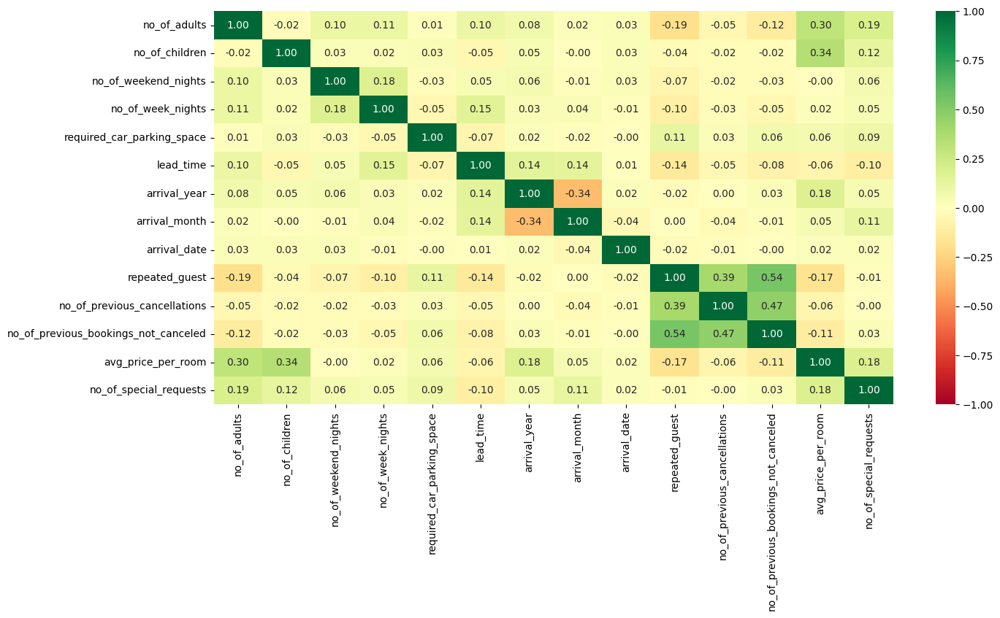

In [ ]:
cols_list = df.select_dtypes(include=np.number).columns.tolist()

plt.figure(figsize=(15, 7))
sns.heatmap(
    df[cols_list].corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="RdYlGn"
)
plt.show()

*  There is a weak correlation between `no_of_previous_bookings_not_cancelled` and `repeated_guest`.  This can be expected as if the person was a guest this means they did not cancel the booking
*  There is also a weak correlation between `no_of_previous_bookings_not_cancelled` and `no_of_previous_cancellations`

**Let's see how the target variable `booking_status` varies across the `no_of_adults`**

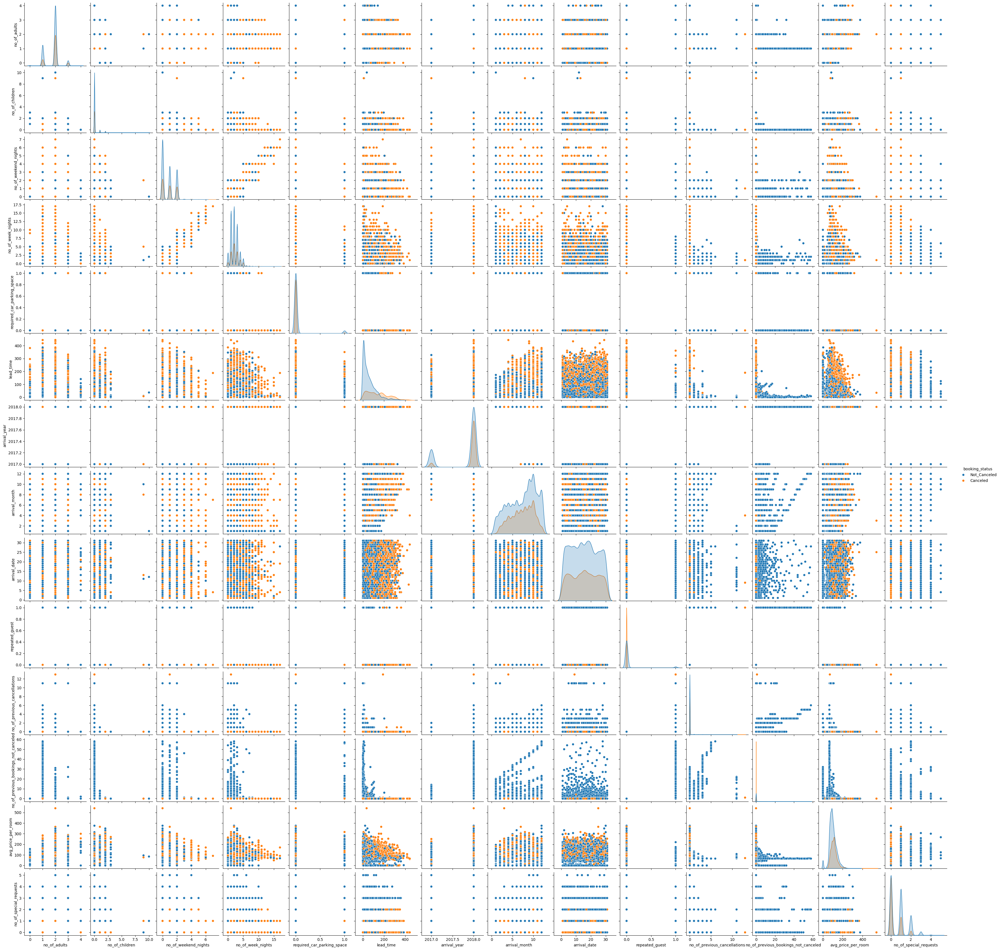

In [ ]:
sns.pairplot(df, hue="booking_status")
plt.show()

booking_status  Canceled  Not_Canceled    All
no_of_adults                                 
All                11885         24390  36275
2                   9119         16989  26108
1                   1856          5839   7695
3                    863          1454   2317
0                     44            95    139
4                      3            13     16
------------------------------------------------------------------------------------------------------------------------


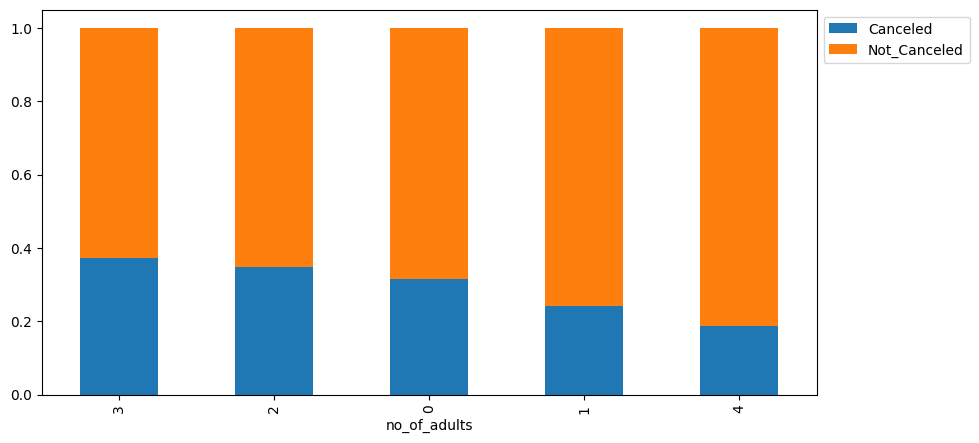

In [ ]:
stacked_barplot(df, "no_of_adults", "booking_status")

*  More cancellations occurs with 3, 2 and 0 adults
*  Rooms booked with 4 adults have the least amount of cancellations

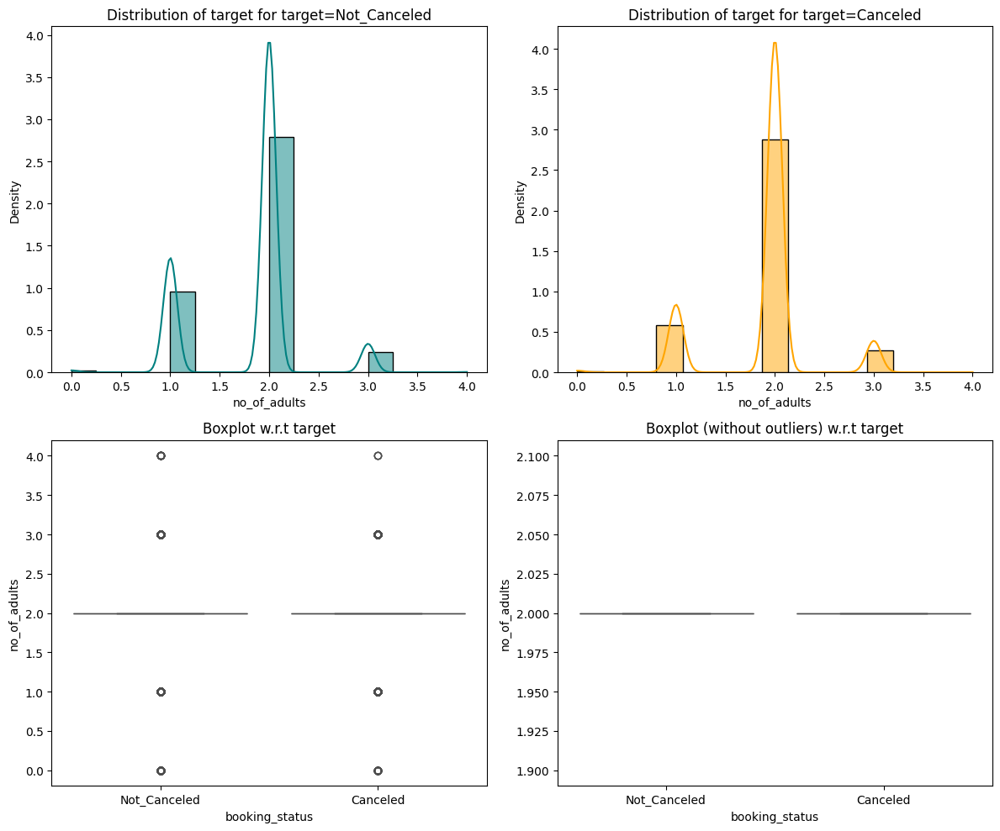

In [ ]:
distribution_plot_wrt_target(data, "no_of_adults", "booking_status")

#### `booking_status` vs `no_of_children`

booking_status  Canceled  Not_Canceled    All
no_of_children                               
All                11885         24390  36275
0                  10882         22695  33577
1                    540          1078   1618
2                    457           601   1058
3                      5            14     19
9                      1             1      2
10                     0             1      1
------------------------------------------------------------------------------------------------------------------------


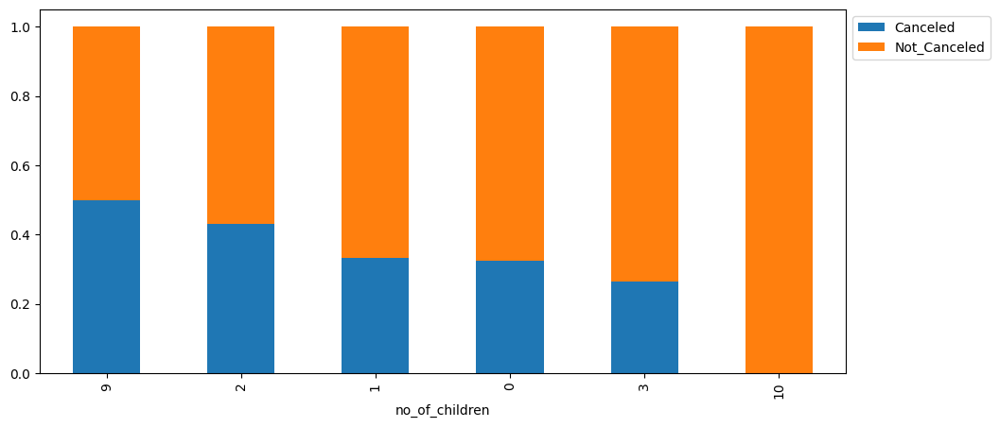

In [ ]:
stacked_barplot(data, "no_of_children", "booking_status")

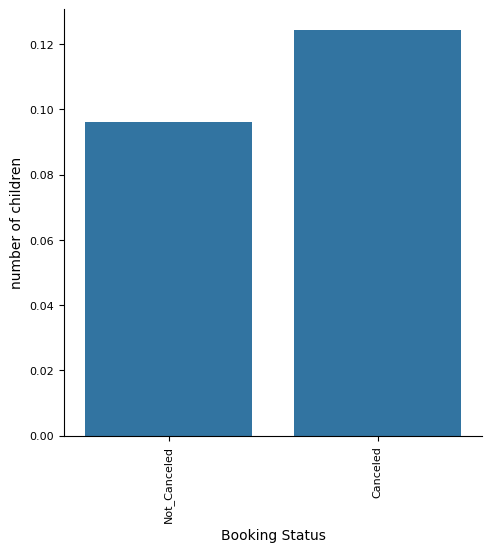

In [ ]:
# plotting brand_name vs days_used

sns.catplot(data=df,x= 'booking_status', y='no_of_children',kind="bar", ci=True)
plt.xlabel("Booking Status",fontsize=10)
plt.ylabel("number of children", fontsize=10)
plt.xticks(fontsize = 8);
plt.yticks(fontsize = 8);
plt.xticks(rotation=90);

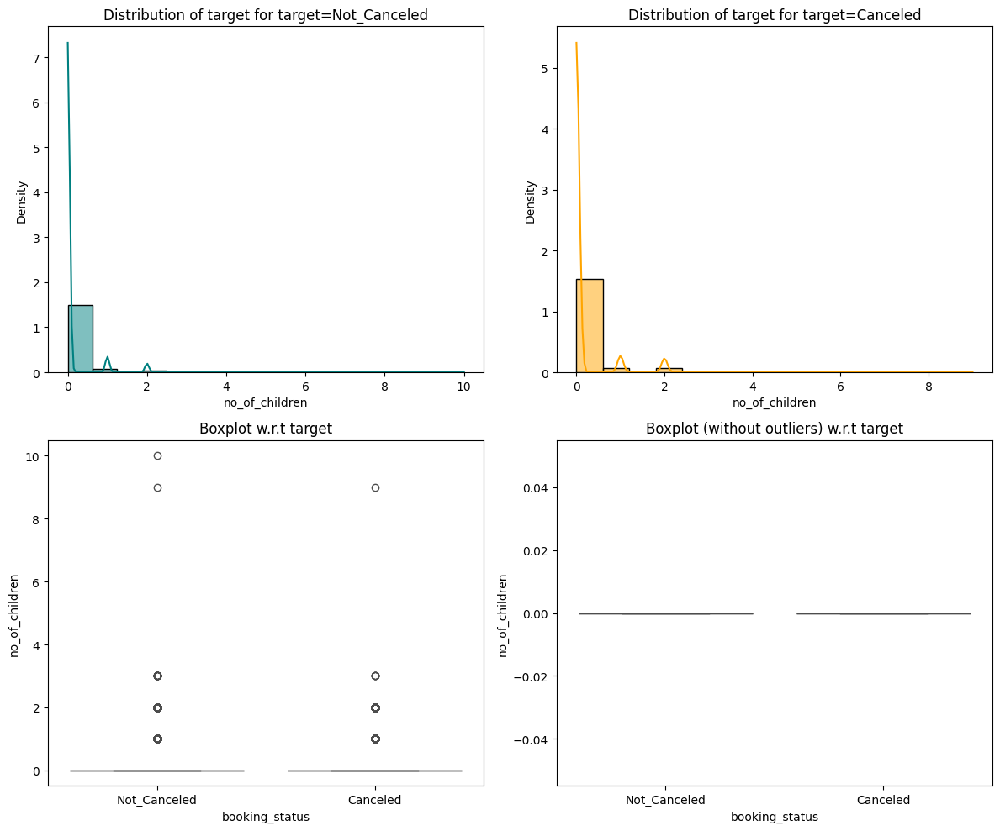

In [ ]:
distribution_plot_wrt_target(data, "no_of_children", "booking_status")

*  Most calcellations occurs where there are 9 children, followed by 2 children

#### `booking_status` vs `no_of_weekend_nights`

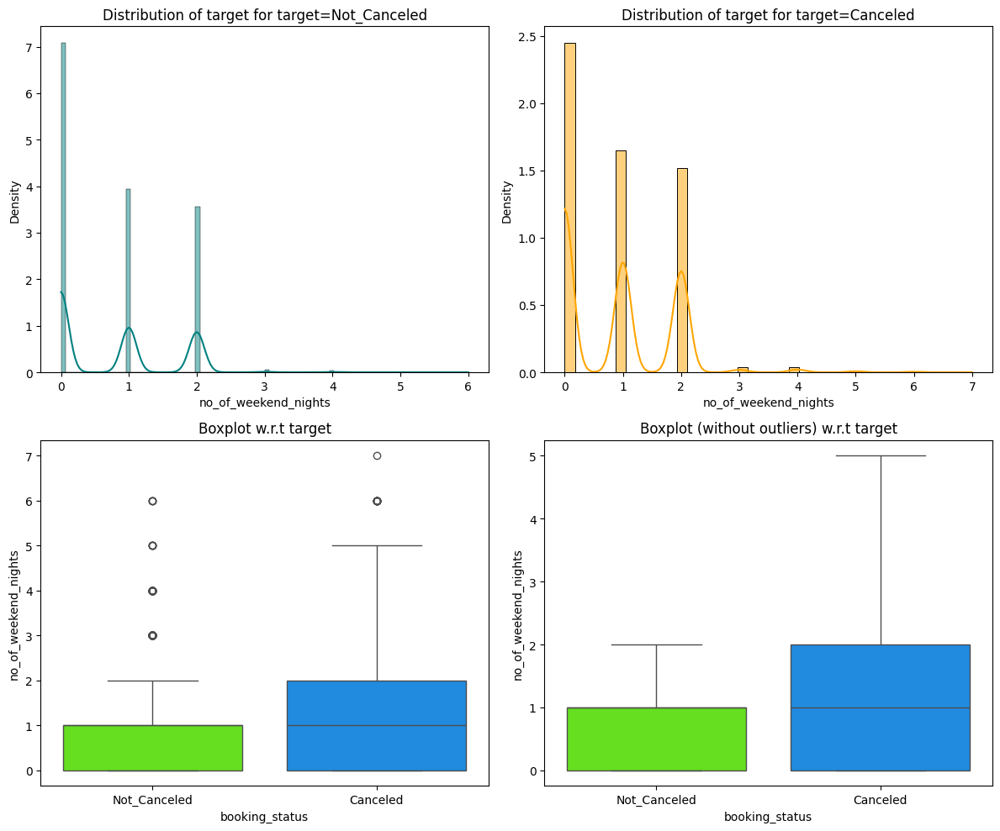

In [ ]:
distribution_plot_wrt_target(data, "no_of_weekend_nights", "booking_status")

* 0, 1 and 2 weekend nights tend to have more cancellations.
* The majority of bookings not cancelled are 0, 1 and 2 nights

#### `booking_status` vs `no_of_week_nights`

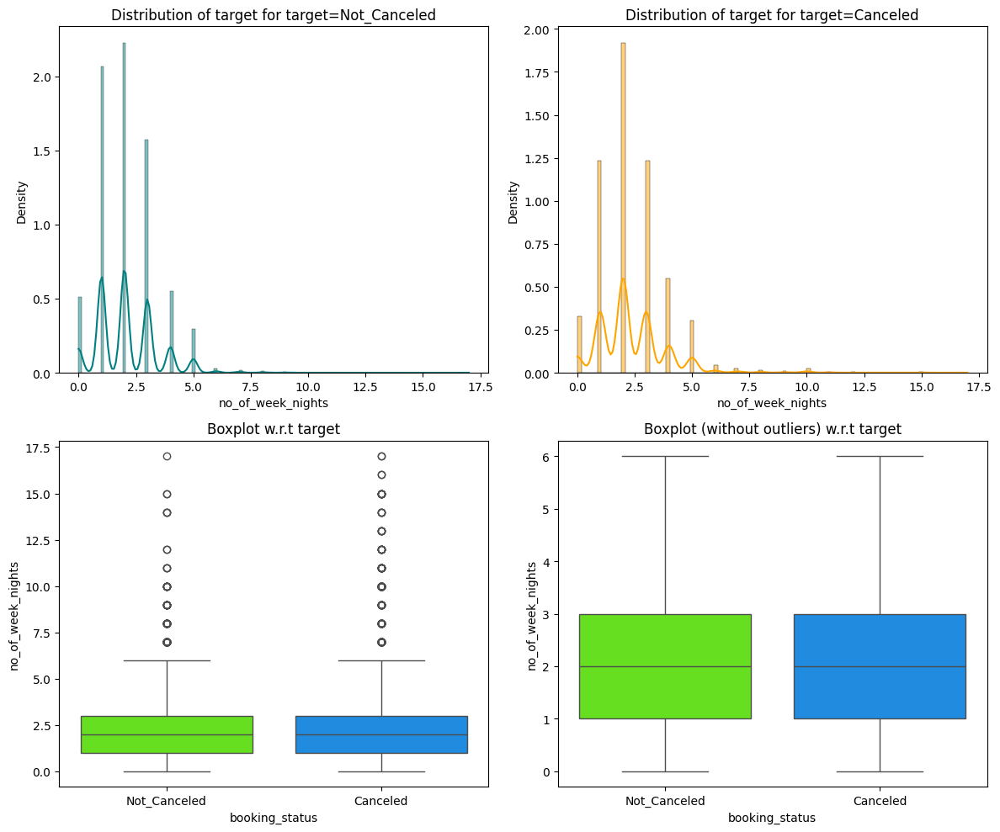

In [ ]:
distribution_plot_wrt_target(data, "no_of_week_nights", "booking_status")

* There is no difference in the `no_of_week_nights` cancelled and not cancelled.  Both have a majority in 1,2 and 3 nights

#### `booking_status` vs `type_of_meal_plan`

booking_status     Canceled  Not_Canceled    All
type_of_meal_plan                               
All                   11885         24390  36275
Meal Plan 1            8679         19156  27835
Not Selected           1699          3431   5130
Meal Plan 2            1506          1799   3305
Meal Plan 3               1             4      5
------------------------------------------------------------------------------------------------------------------------


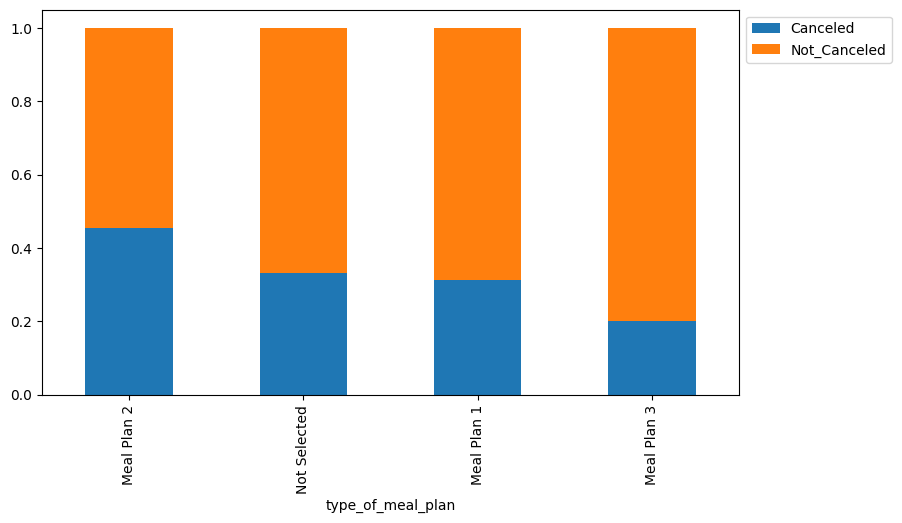

In [ ]:
stacked_barplot(data, "type_of_meal_plan", "booking_status")

* The majority of cancellations was for bookings with Meal Plan 2.
* The majority of non cancellations was for Meal Plan 3

#### `booking_status` vs `required_car_parking_space`

booking_status              Canceled  Not_Canceled    All
required_car_parking_space                               
All                            11885         24390  36275
0                              11771         23380  35151
1                                114          1010   1124
------------------------------------------------------------------------------------------------------------------------


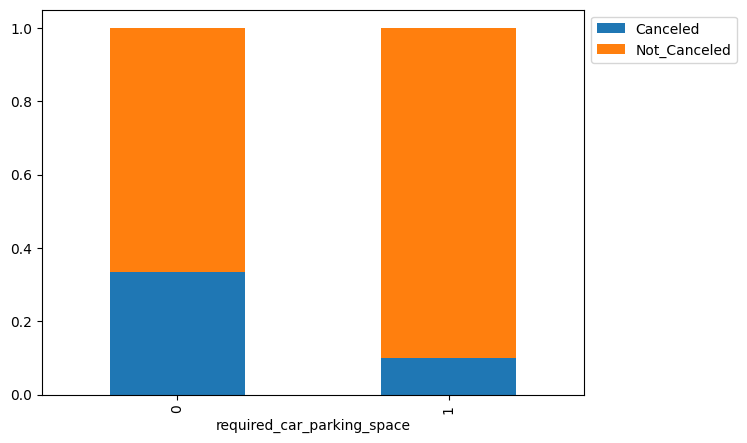

In [ ]:
stacked_barplot(data, "required_car_parking_space", "booking_status")

* The majority of cancellations was done for bookings with no required car park space
* For the not cancelled bookings, the majority of the bookings did not require a carpark

#### `booking_status` vs `room_type_reserved`

booking_status      Canceled  Not_Canceled    All
room_type_reserved                               
All                    11885         24390  36275
Room_Type 1             9072         19058  28130
Room_Type 4             2069          3988   6057
Room_Type 6              406           560    966
Room_Type 2              228           464    692
Room_Type 5               72           193    265
Room_Type 7               36           122    158
Room_Type 3                2             5      7
------------------------------------------------------------------------------------------------------------------------


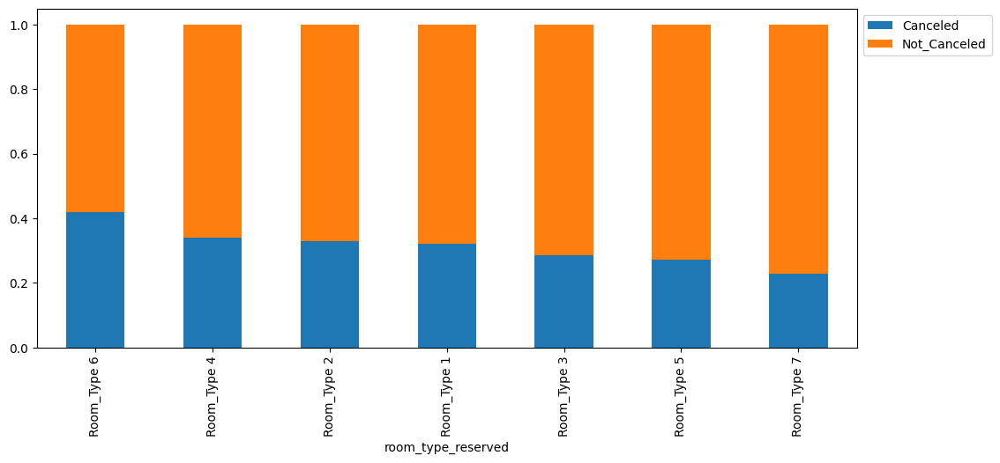

In [ ]:
stacked_barplot(data, "room_type_reserved", "booking_status")

* `Room_type 6` had the most cancellations, whereas `Room_type 7` had the least cancellations

#### `booking_status` vs `lead_time`

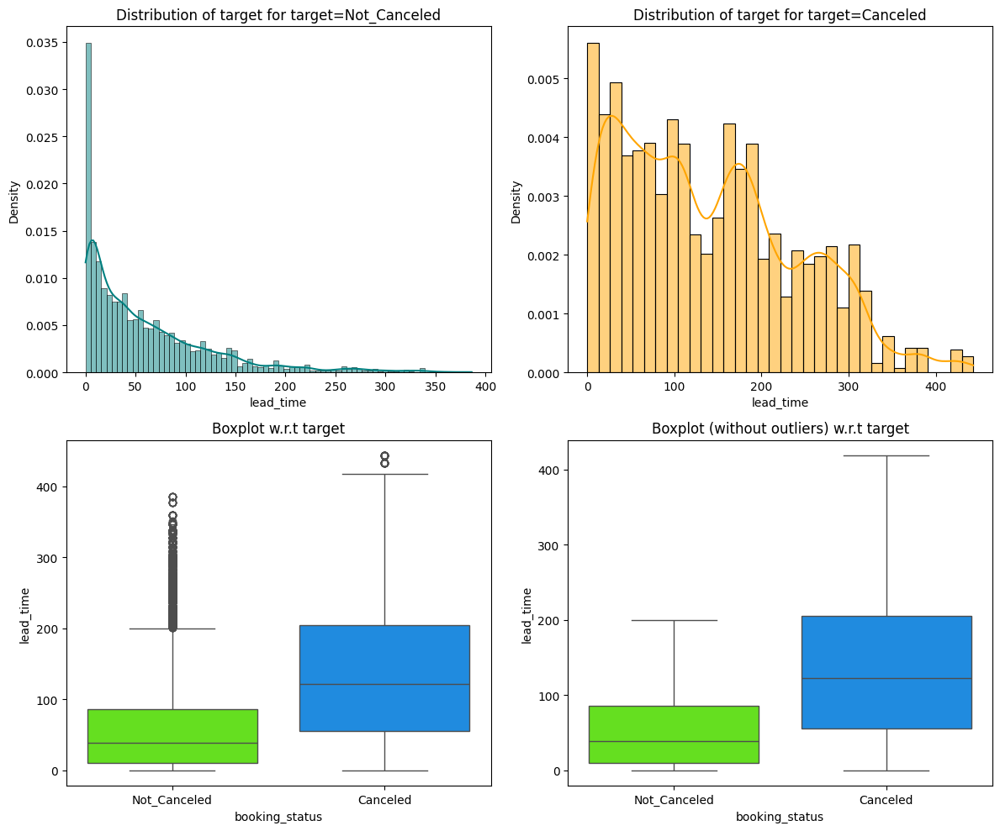

In [ ]:
distribution_plot_wrt_target(data, "lead_time", "booking_status")

* The `Not_Canceled` reservations had a lower lead time with an average of about 50 days
* `Canceled` reservations had higher lead time with an average of approximately 125 days

#### `booking_status` vs `arrival_year`

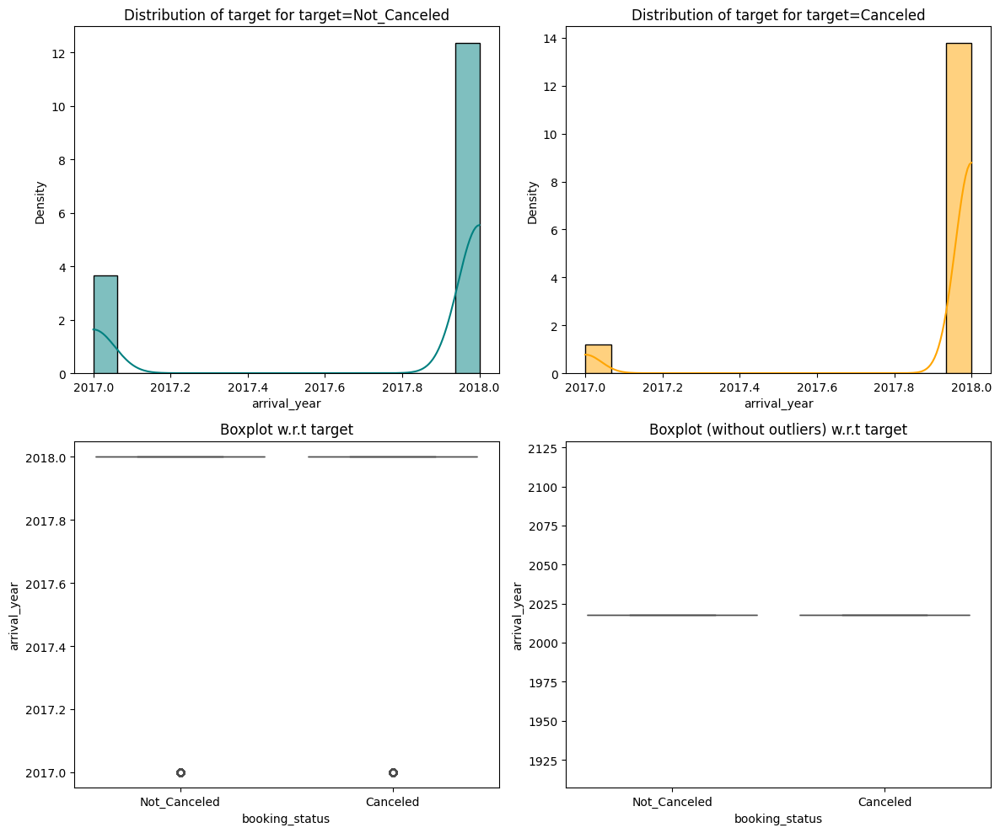

In [ ]:
distribution_plot_wrt_target(data, "arrival_year", "booking_status")

In [ ]:
df.loc[df['booking_status']=="Canceled"]["arrival_year"].value_counts()

2018    10924
2017      961
Name: arrival_year, dtype: int64

In [ ]:
df["arrival_year"].value_counts()

2018    29761
2017     6514
Name: arrival_year, dtype: int64

* 2018 had more canceled and not canceled bookings, this is expected as approx 30,000 of the 36,275 bookings was made in 2018

#### `booking_status` vs `arrival_month`

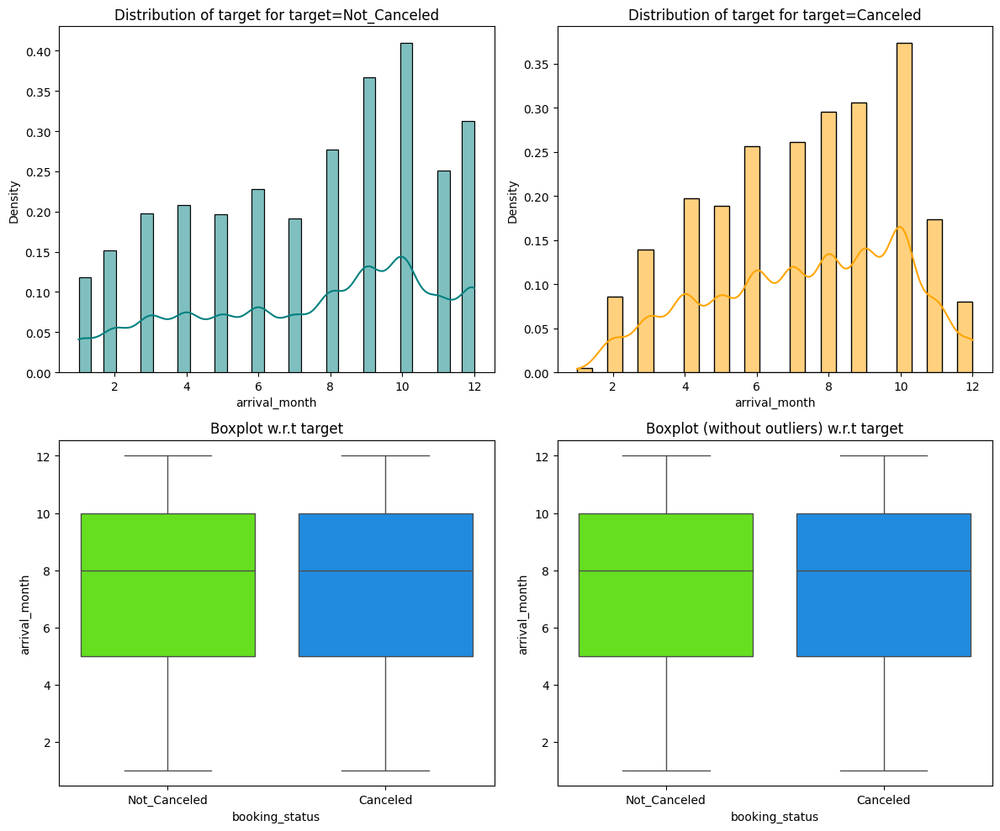

In [ ]:
distribution_plot_wrt_target(data, "arrival_month", "booking_status")

* Month 10 has the most amount of bookings
* Month 1 has the least amountog bookings

#### `booking_status` vs `arrival_month`

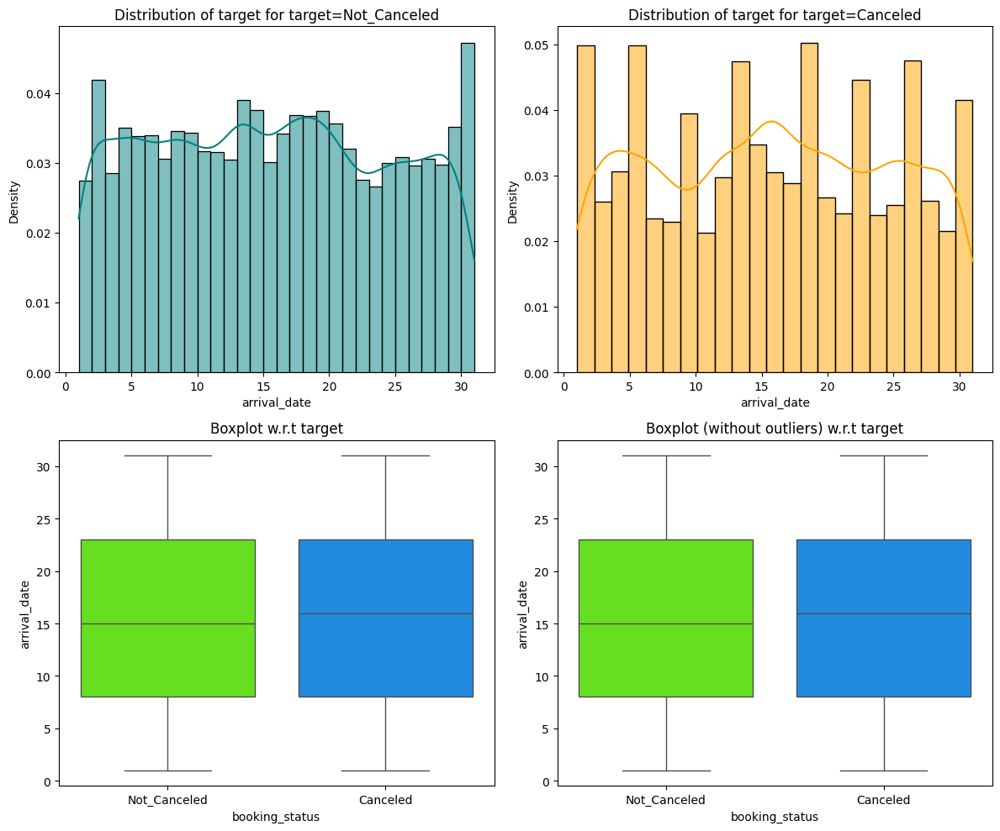

In [ ]:
distribution_plot_wrt_target(data, "arrival_date", "booking_status")

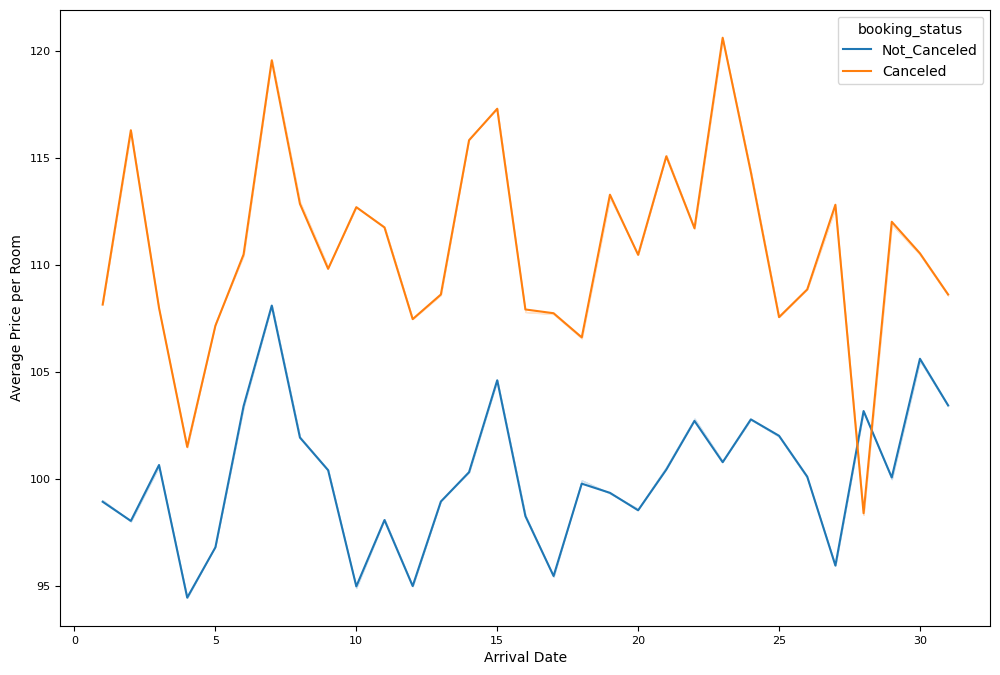

In [ ]:
plt.figure(figsize=(12,8))
sns.lineplot(data=df, x="arrival_date", y="avg_price_per_room", ci=False, color="red", hue="booking_status")
plt.xlabel("Arrival Date",fontsize=10)
plt.ylabel("Average Price per Room", fontsize=10)
plt.xticks(fontsize = 8);
plt.yticks(fontsize = 8);
#plt.xticks(rotation=90);

* The `arrival_date` for the cancelled and not cancelled reservations are about the same
* The canceled reservations tend to have a higher price, except for around the 29th of the month where the `avg_price_per_room` was lower for the cancelled bookings

#### `booking_status` vs `market_segment_type`

booking_status       Canceled  Not_Canceled    All
market_segment_type                               
All                     11885         24390  36275
Online                   8475         14739  23214
Offline                  3153          7375  10528
Corporate                 220          1797   2017
Aviation                   37            88    125
Complementary               0           391    391
------------------------------------------------------------------------------------------------------------------------


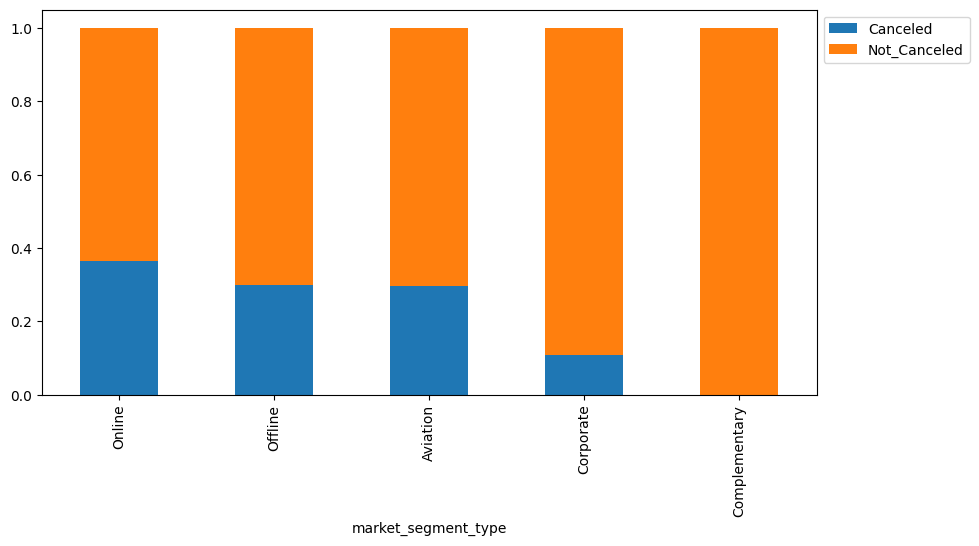

In [ ]:
stacked_barplot(data, "market_segment_type", "booking_status")

* Online had the majority of cancellations, this is expected as omline had the most amount of bookings
* There were no cancellations for Complementary bookings

#### `booking_status` vs `repeated_guest`

booking_status  Canceled  Not_Canceled    All
repeated_guest                               
All                11885         24390  36275
0                  11869         23476  35345
1                     16           914    930
------------------------------------------------------------------------------------------------------------------------


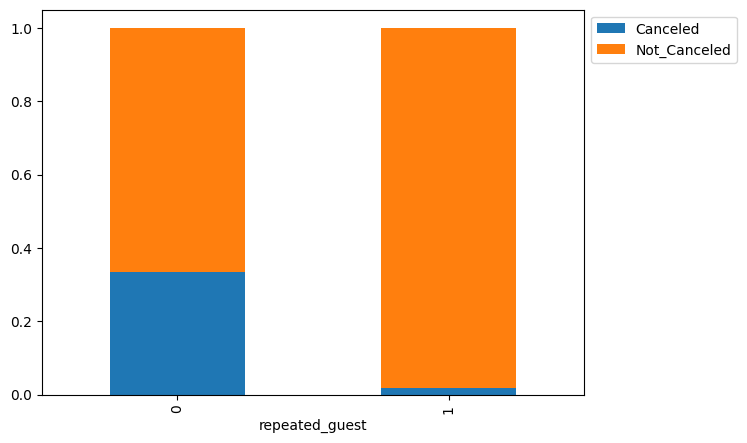

In [ ]:
stacked_barplot(data, "repeated_guest", "booking_status")

* Repeated guests tend to not cancel bookings.

In [ ]:
repeated_guests = df[(df["repeated_guest"] == 1) & (df["booking_status"] == "Canceled")]
print ("The percentage of repeating guests who cancel is",round((repeated_guests.shape[0]/df.shape[0])*100, 3), "%")

The percentage of repeating guests who cancel is 0.044 %


#### `booking_status` vs `no_of_previous_cancellations`

booking_status                Canceled  Not_Canceled    All
no_of_previous_cancellations                               
All                              11885         24390  36275
0                                11869         24068  35937
1                                   11           187    198
13                                   4             0      4
3                                    1            42     43
2                                    0            46     46
4                                    0            10     10
5                                    0            11     11
6                                    0             1      1
11                                   0            25     25
------------------------------------------------------------------------------------------------------------------------


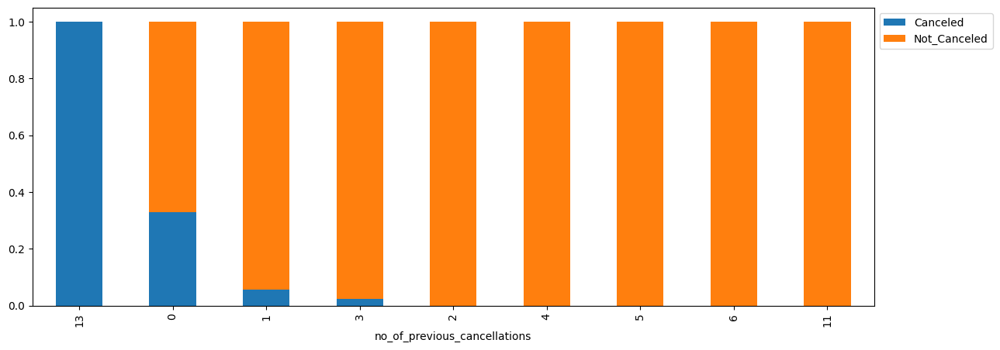

In [ ]:
stacked_barplot(data, "no_of_previous_cancellations", "booking_status")

* When the `no_of_previuous_cancellations` was 13 there was 100% canceled bookings
* When the `no_of_previuous_cancellations` was 2, 4, 5, 6, and 11 there was 0% canceled bookings

#### `booking_status` vs `no_of_previous_bookings_not_canceled`

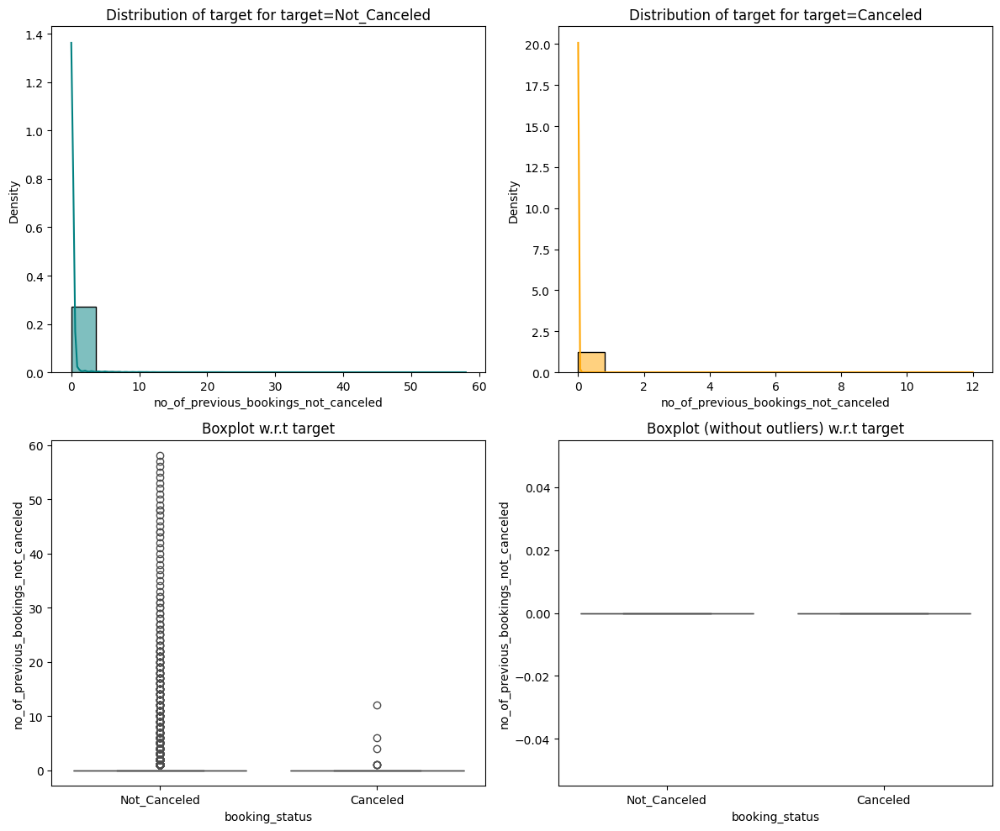

In [ ]:
distribution_plot_wrt_target(data, "no_of_previous_bookings_not_canceled", "booking_status")

In [ ]:
df.loc[df['booking_status']=="Canceled"]["no_of_previous_bookings_not_canceled"].value_counts(normalize=True)

0    0.99941
1    0.00034
6    0.00008
12   0.00008
4    0.00008
Name: no_of_previous_bookings_not_canceled, dtype: float64

* The majority of cancelled bookings had 0 previous cancelled bookings.  This is expected as 99% of the bookings which were cancelled had 0 previously cancelled bookings

#### `booking_status` vs `avg_price_per_room`

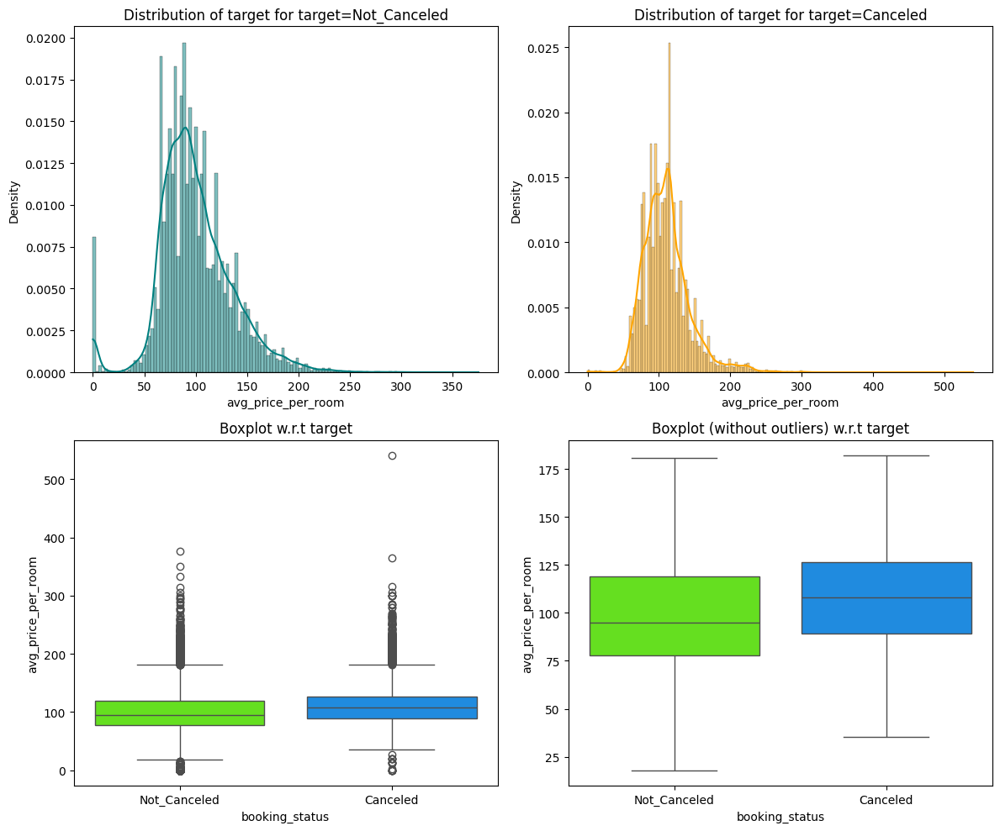

In [ ]:
distribution_plot_wrt_target(data, "avg_price_per_room", "booking_status")

* The average price per room of the cancelled bookings was generally higher than for the rooms which was not cancelled.

#### `booking_status` vs `no_of_special_requests`

booking_status          Canceled  Not_Canceled    All
no_of_special_requests                               
All                        11885         24390  36275
0                           8545         11232  19777
1                           2703          8670  11373
2                            637          3727   4364
3                              0           675    675
4                              0            78     78
5                              0             8      8
------------------------------------------------------------------------------------------------------------------------


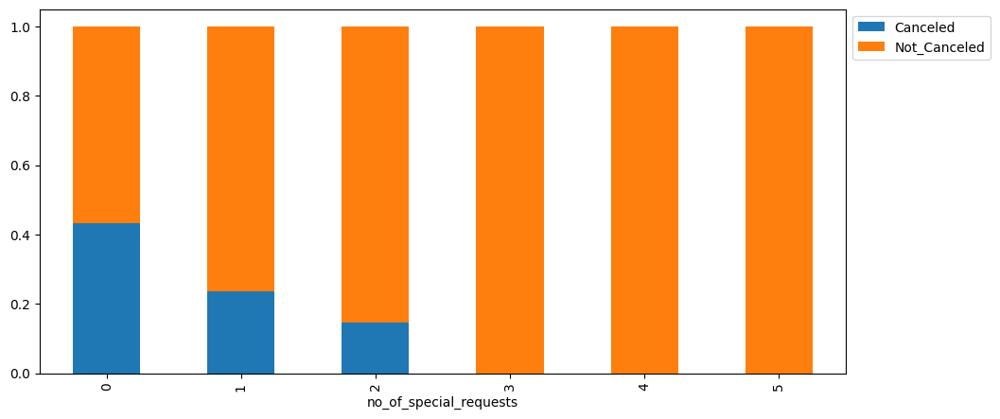

In [ ]:
stacked_barplot(data, "no_of_special_requests", "booking_status")

<Figure size 1200x900 with 0 Axes>

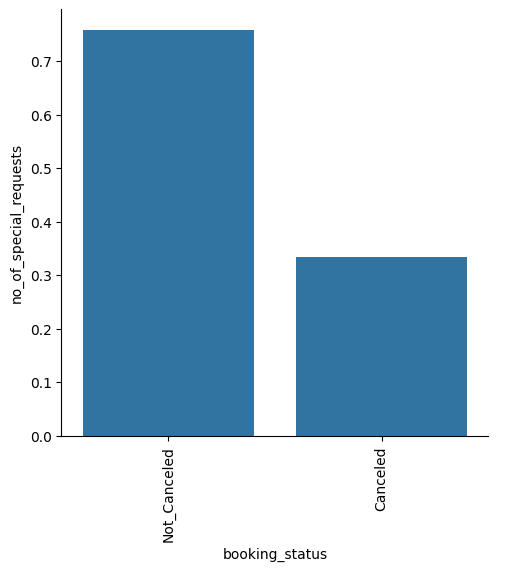

In [ ]:
plt.figure(figsize=(12,9))
sns.catplot(data=df,x = 'booking_status' , y = 'no_of_special_requests', kind = "bar"  ,ci = False);
plt.xticks( rotation=90);
plt.show()

In [ ]:
df.loc[df['booking_status']=="Canceled"]["no_of_special_requests"].value_counts(normalize=True)

0   0.71897
1   0.22743
2   0.05360
Name: no_of_special_requests, dtype: float64

* Rooms which are not cancelled have a higher amount of special requests

#### `no_of_adults` vs `no_of_weekend_nights`

no_of_adults            0     1      2     3   4    All
no_of_weekend_nights                                   
All                   139  7695  26108  2317  16  36275
0                      60  4467  11447   890   8  16872
1                      30  1833   7443   685   4   9995
2                      48  1287   7022   710   4   9071
3                       1    36     99    17   0    153
4                       0    37     80    12   0    129
5                       0    21     10     3   0     34
6                       0    14      6     0   0     20
7                       0     0      1     0   0      1
------------------------------------------------------------------------------------------------------------------------


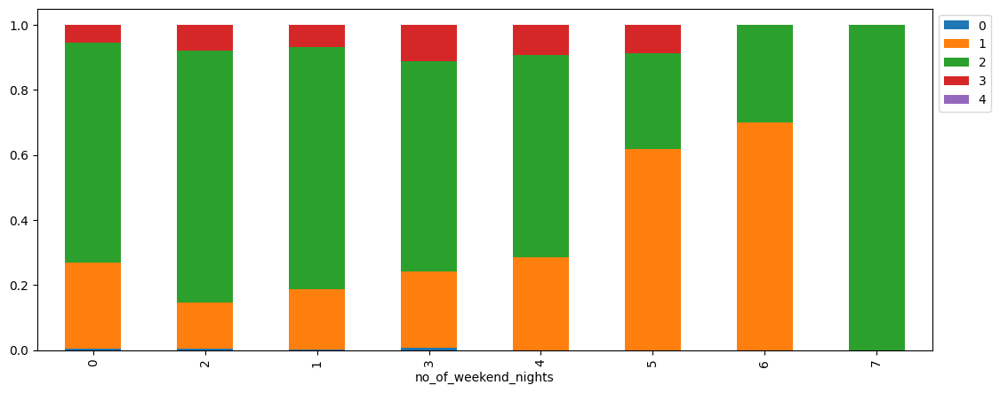

In [ ]:
stacked_barplot(data, "no_of_weekend_nights", "no_of_adults")

#### `no_of_adults` vs `no_of_week_nights`

<Figure size 1200x900 with 0 Axes>

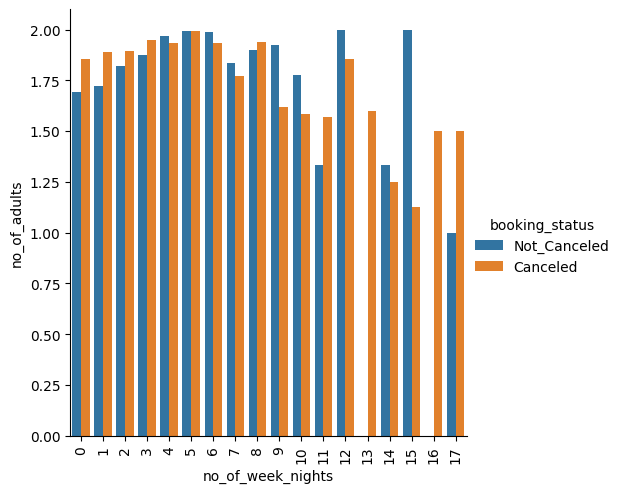

In [ ]:
plt.figure(figsize=(12,9))
sns.catplot(data=df,x = 'no_of_week_nights' , y = 'no_of_adults', kind = "bar" , hue="booking_status" ,ci = False);
plt.xticks( rotation=90);
plt.show()

#### `no_of_adults` vs `type_of_meal_plan`

no_of_adults         0     1      2     3   4    All
type_of_meal_plan                                   
Meal Plan 1        137  6469  19050  2163  16  27835
All                139  7695  26108  2317  16  36275
Meal Plan 2          2   535   2645   123   0   3305
Meal Plan 3          0     0      5     0   0      5
Not Selected         0   691   4408    31   0   5130
------------------------------------------------------------------------------------------------------------------------


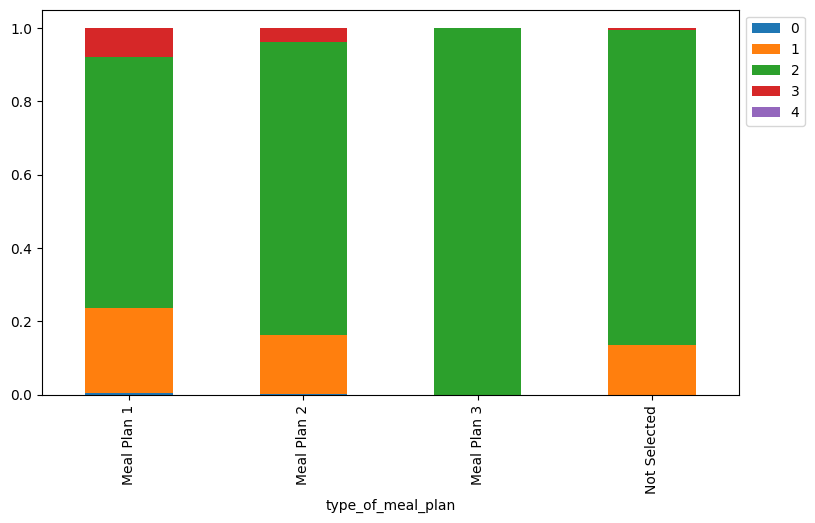

In [ ]:
stacked_barplot(data, "type_of_meal_plan", "no_of_adults")

* Meal plan 3 is most popular with 2 adults
* When the booking has 1 adults, they then to favor Meal Plan 1
* When there are 3 adults, they tend to make bookings with either Meal PLan 1 or Meal Plan 2

#### `no_of_adults` vs `required_car_parking_space`

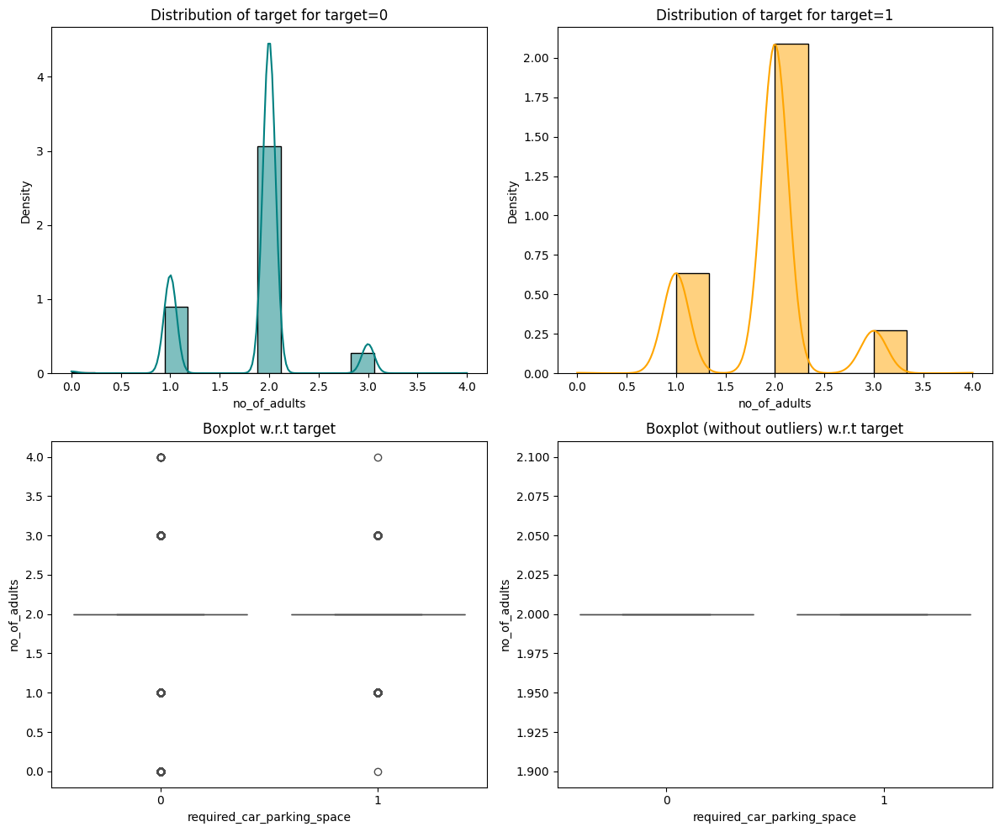

In [ ]:
distribution_plot_wrt_target(data, "no_of_adults", "required_car_parking_space")

* Bookings which required a car parking space was mostly with 2 adults, followed by 1 adult

In [ ]:
#### `no_of_adults` vs `room_type_reserved`

room_type_reserved  Room_Type 1  Room_Type 2  Room_Type 3  Room_Type 4  \
no_of_adults                                                             
All                       28130          692            7         6057   
2                         20710          532            4         3746   
1                          6936           26            3          573   
0                             3          133            0            0   
3                           481            1            0         1737   
4                             0            0            0            1   

room_type_reserved  Room_Type 5  Room_Type 6  Room_Type 7    All  
no_of_adults                                                      
All                         265          966          158  36275  
2                           135          882           99  26108  
1                           100           42           15   7695  
0                             0            2            1    139  
3    

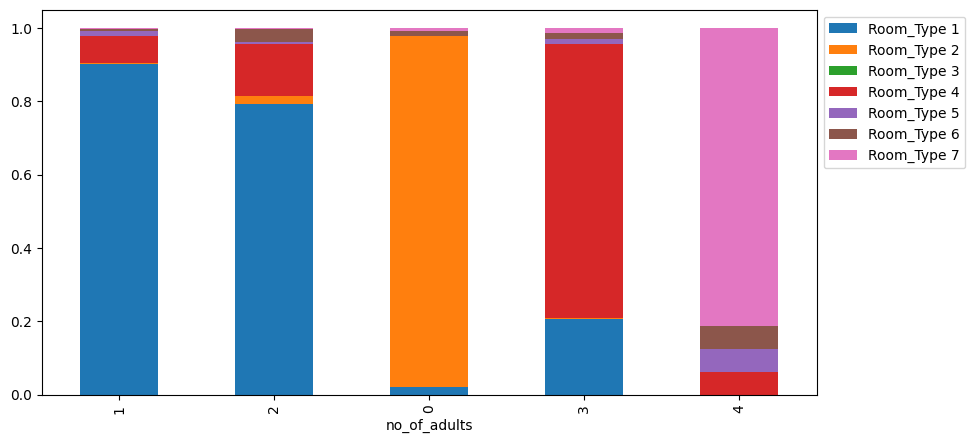

In [ ]:
stacked_barplot(data, "no_of_adults", "room_type_reserved")

* Room Type 1 is most popular with 1 and 2 adults.
* Room Type 2 is most popular with 0 adults
* Room Type 4 is most popualr with 3 adults
* Room Type 7 is most popular with 4 adults

#### `no_of_adults` vs `lead_time`

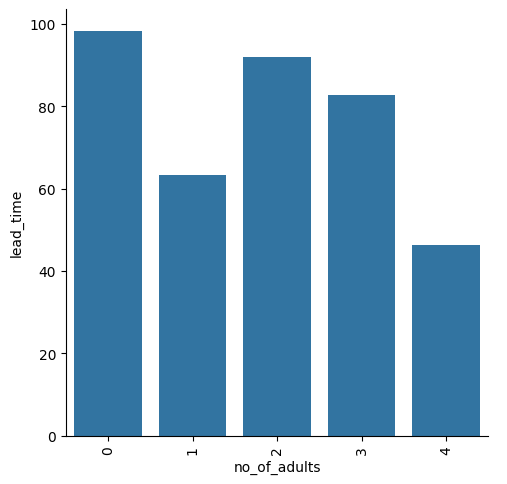

In [ ]:
sns.catplot(data=df,x = 'no_of_adults' , y = 'lead_time', kind = "bar", ci = False);
plt.xticks(rotation=90);
plt.show()

* The lead time for 0 and 2 adults is the greatest
*  The lead time for 4 adults is the least

#### `no_of_adults` vs `arrival_year`

arrival_year  2017   2018    All
no_of_adults                    
All           6514  29761  36275
2             4772  21336  26108
1             1638   6057   7695
3               94   2223   2317
0               10    129    139
4                0     16     16
------------------------------------------------------------------------------------------------------------------------


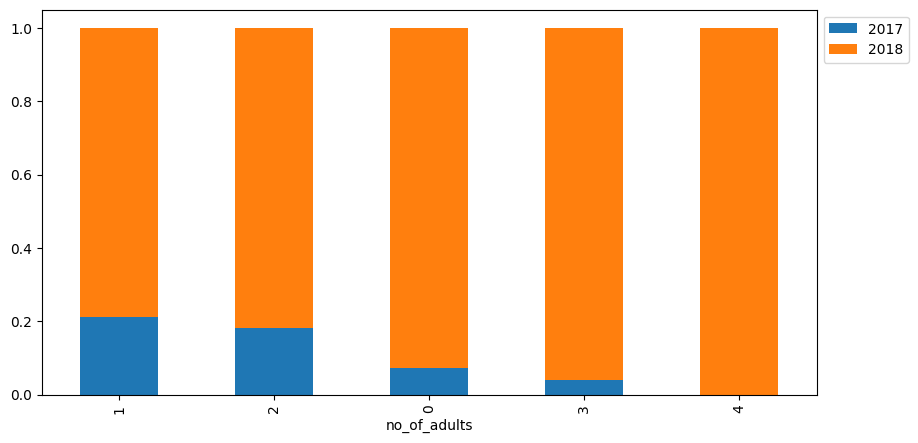

In [ ]:
stacked_barplot(data, "no_of_adults", "arrival_year")

* In 2017, most bookings had 2 adults
* In 2017 there were no bookings for 4 adults
* The majority of bookings was in 2018

#### `no_of_adults` vs `arrival_month`

arrival_month     1     2     3     4     5     6     7     8     9    10  \
no_of_adults                                                                
All            1014  1704  2358  2736  2598  3203  2920  3813  4611  5317   
2               616  1035  1758  2087  1890  2115  2078  3002  3481  3732   
1               374   578   430   460   551   905   428   360   914  1334   
3                15    80   162   180   149   176   397   425   203   234   
0                 9    11     8     8     7     7    13    23    11    16   
4                 0     0     0     1     1     0     4     3     2     1   

arrival_month    11    12    All  
no_of_adults                      
All            2980  3021  36275  
2              2030  2284  26108  
1               864   497   7695  
3                80   216   2317  
0                 6    20    139  
4                 0     4     16  
-------------------------------------------------------------------------------------------------------

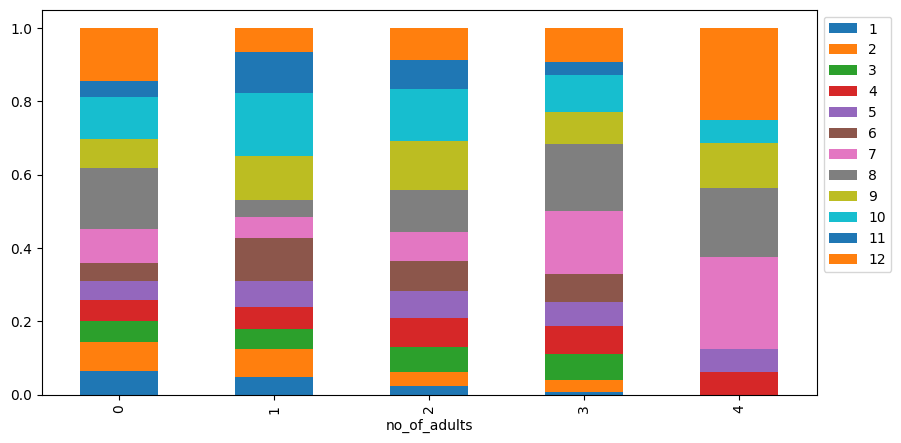

In [ ]:
stacked_barplot(data, "no_of_adults", "arrival_month")

* When the booking had 4 adults, month 2 and Month 7 was more popular
* When the booking had 3 adults month 7 and month 8 was more popular
* When the booking had 0 adults months 8 and 2 w2as most popular
* When the booking had 1 adult month 10 was most popular
* When the booking had 2 adults, months 9 and 10 was most popular

#### `no_of_adults` vs `arrival_date`

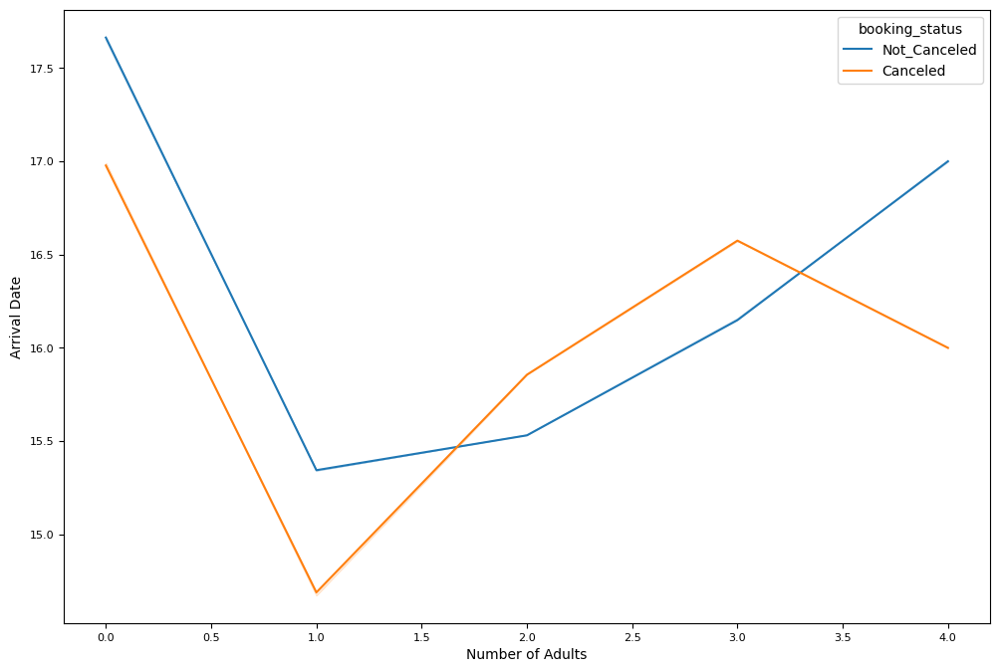

In [ ]:
plt.figure(figsize=(12,8))
sns.lineplot(data=df, x="no_of_adults", y="arrival_date", ci=False, color="red", hue = "booking_status")
plt.xlabel("Number of Adults",fontsize=10)
plt.ylabel("Arrival Date", fontsize=10)
plt.xticks(fontsize = 8);
plt.yticks(fontsize = 8);
#plt.xticks(rotation=90);

* Booking with 1 adult tend to favor the middle of the month


#### `no_of_adults` vs `market_segment_type`

market_segment_type  Aviation  Complementary  Corporate  Offline  Online  \
no_of_adults                                                               
All                       125            391       2017    10528   23214   
1                         123            199       1566     2634    3173   
2                           2            184        438     7598   17886   
0                           0              4          0        1     134   
3                           0              3         13      295    2006   
4                           0              1          0        0      15   

market_segment_type    All  
no_of_adults                
All                  36275  
1                     7695  
2                    26108  
0                      139  
3                     2317  
4                       16  
------------------------------------------------------------------------------------------------------------------------


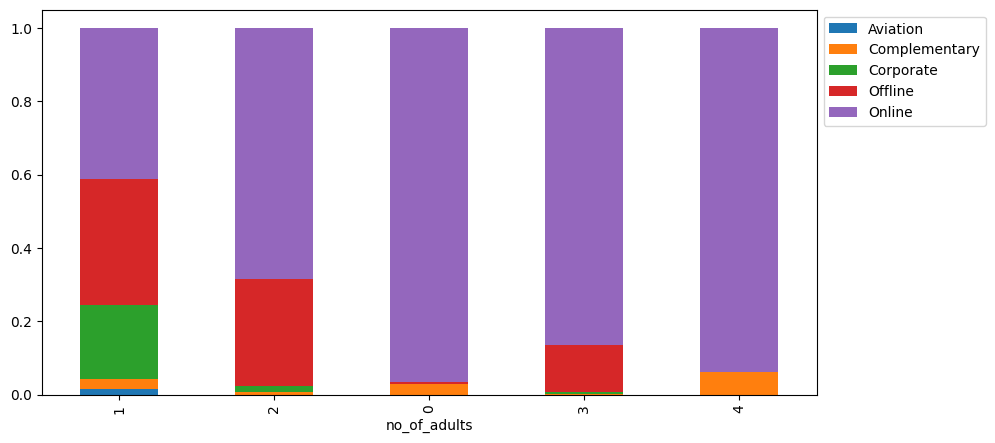

In [ ]:
stacked_barplot(data, "no_of_adults", "market_segment_type")

* When the booking has 1 adult bookings are generally made online adn offline
* When the booking has 0,2,3 and 4 adults, bookings are generally made online
* Most offline bookings are made with 1 and 2 adults in the booking

#### `no_of_adults` vs `repeated_guest`

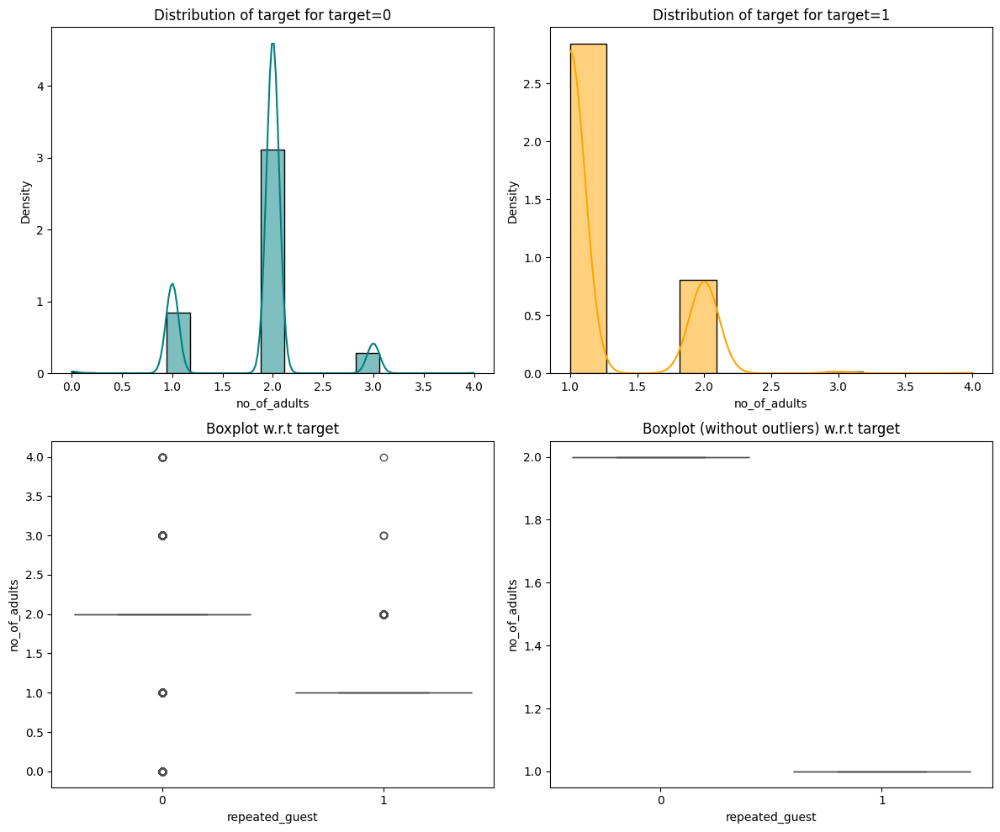

In [ ]:
distribution_plot_wrt_target(data, "no_of_adults", "repeated_guest")

* the majority of repaeted guests are with bookings with 1 and 2 adults

#### `no_of_adults` vs `no_of_previous_cancellations`

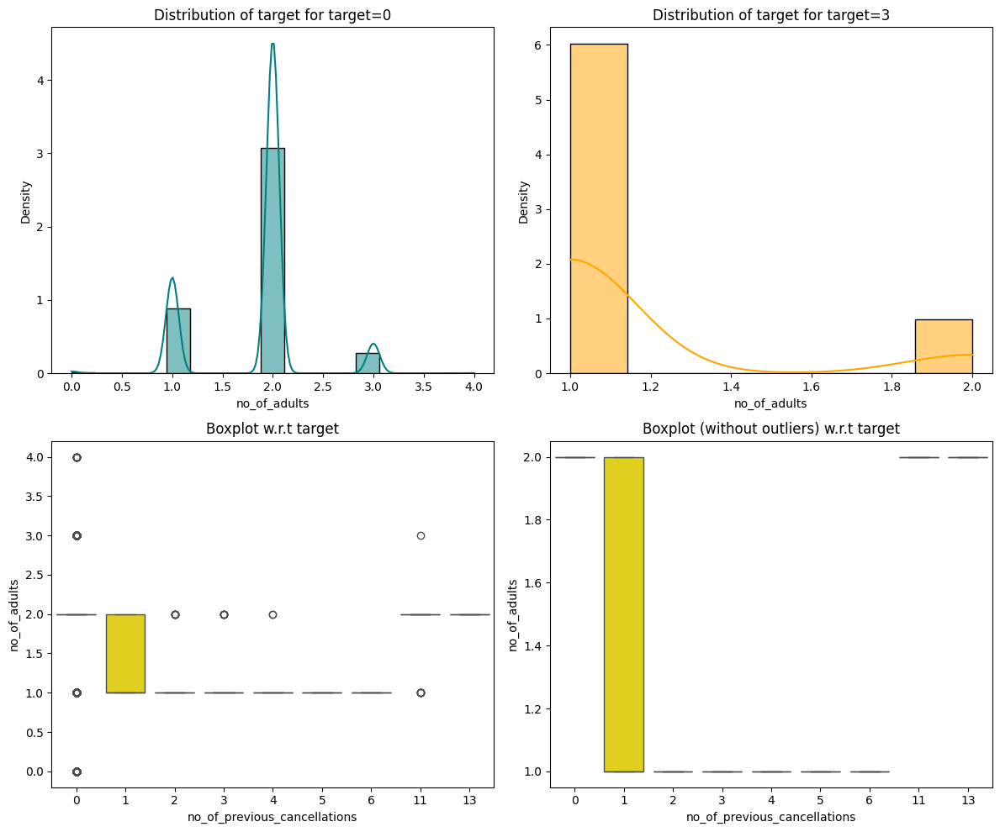

In [ ]:
distribution_plot_wrt_target(data, "no_of_adults", "no_of_previous_cancellations")

In [ ]:
df['no_of_previous_cancellations'].value_counts()

0     35937
1       198
2        46
3        43
11       25
5        11
4        10
13        4
6         1
Name: no_of_previous_cancellations, dtype: int64

* For for bookings which were cancelled, `no_of_previous_cancellations` was highest for bookings with 1 adult
* For for bookings which were not cancelled, `no_of_previous_cancellations` was highest for bookings with 2 adults

#### `no_of_adults` vs `no_of_previous_bookings_not_canceled`

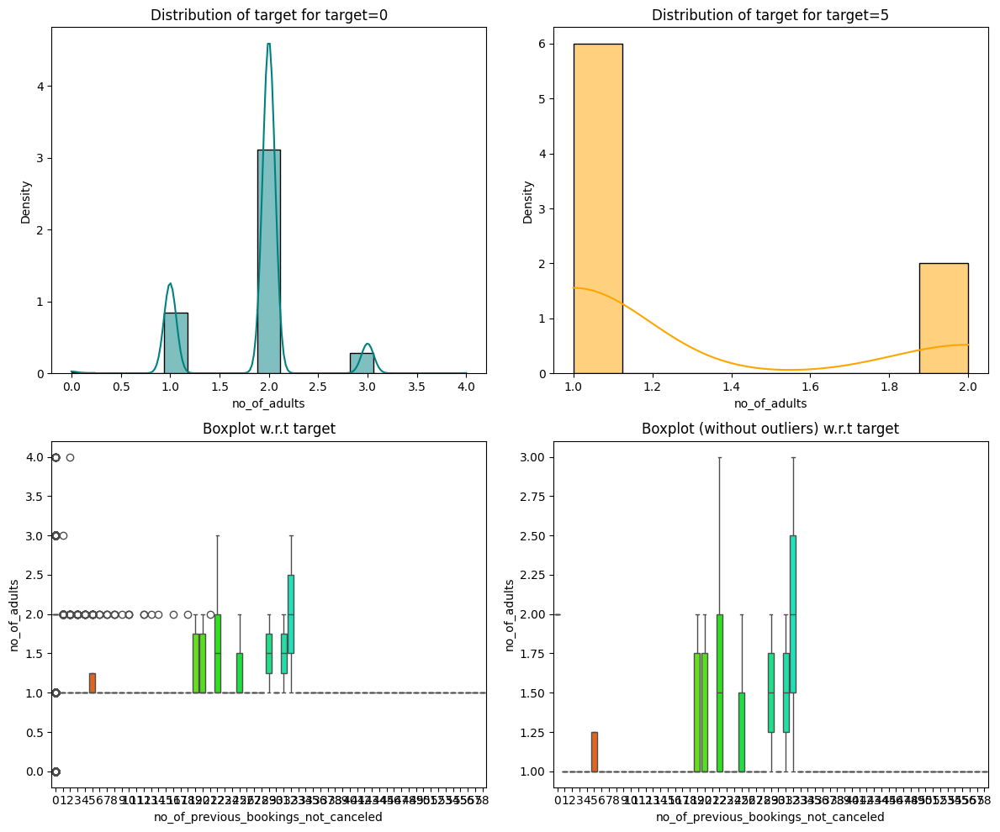

In [ ]:
distribution_plot_wrt_target(data, "no_of_adults", "no_of_previous_bookings_not_canceled")

* For for bookings which were  cancelled, `no_of_previous_bookings_not_canceled` was highest for bookings with 1 adult
* For for bookings which were not cancelled, `no_of_previous_bookings_not_canceled` was highest for bookings with 2 adults

#### `no_of_adults` vs `avg_price_per_room`

<Figure size 1200x900 with 0 Axes>

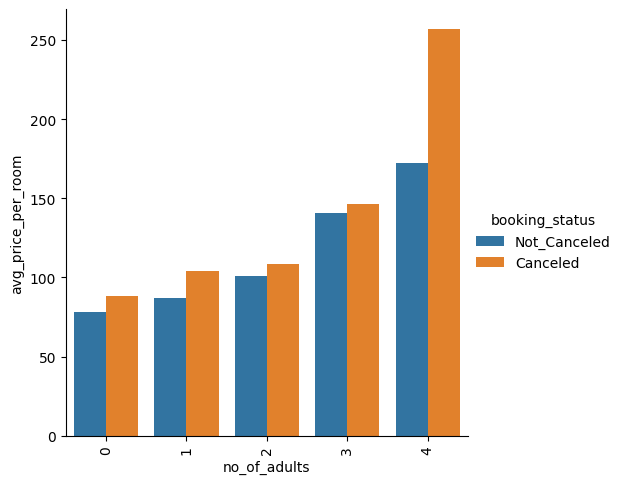

In [ ]:
plt.figure(figsize=(12,9))
sns.catplot(data=df,x = 'no_of_adults' , y = 'avg_price_per_room', kind = "bar" , hue="booking_status" ,ci = False);
plt.xticks( rotation=90);
plt.show()

* On average, the `avg_price_per_room` is higher for all bookings
* As expected the `avg_price_per_room` increases as the number of adults increases.
* There is a considerable difference between the `avg_price_per_room` for 4 adults for bookings which were cancelled and not cancelled

#### `no_of_adults` vs `no_of_special_requests`

<Figure size 1200x900 with 0 Axes>

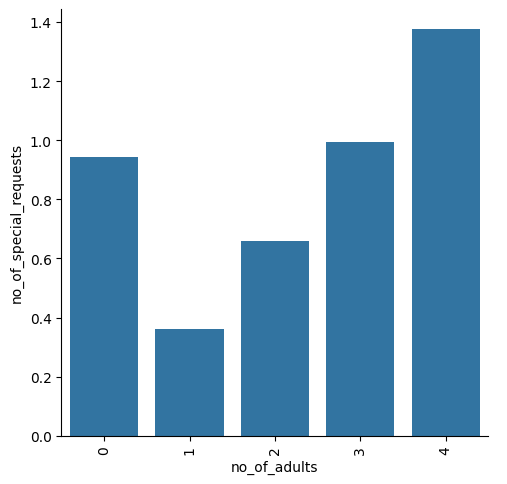

In [ ]:
plt.figure(figsize=(12,9))
sns.catplot(data=df,x = 'no_of_adults' , y = 'no_of_special_requests', kind = "bar" ,ci = False);
plt.xticks( rotation=90);
plt.show()

* `no_of_special_requests` was the most for bookings with 0 and 4 adults
* `no_of_special_requests` was the least for bookings with 1 adult

#### `no_of_children` vs `no_of_weekend_nights`

<Figure size 1200x900 with 0 Axes>

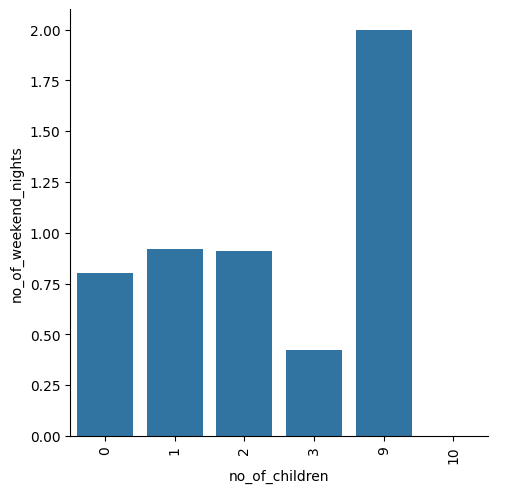

In [ ]:
plt.figure(figsize=(12,9))
sns.catplot(data=df,x = 'no_of_children' , y = 'no_of_weekend_nights', kind = "bar" ,ci = False);
plt.xticks( rotation=90);
plt.show()

* Bookings with 9 children then to spend 2 weekend nights on average

#### `no_of_children` vs `no_of_week_nights`

<Figure size 1200x900 with 0 Axes>

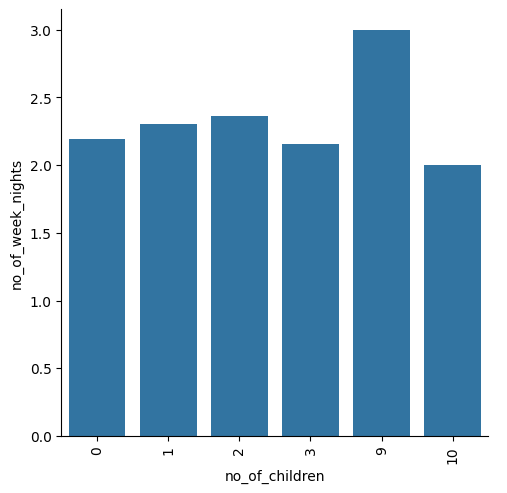

In [ ]:
plt.figure(figsize=(12,9))
sns.catplot(data=df,x = 'no_of_children' , y = 'no_of_week_nights', kind = "bar" ,ci = False);
plt.xticks( rotation=90);
plt.show()

* Bookings made with 9 children tend to spend the most amount of week nights

#### `no_of_children` vs `type_of_meal_plan`

type_of_meal_plan  Meal Plan 1  Meal Plan 2  Meal Plan 3  Not Selected    All
no_of_children                                                               
0                        25420         3134            5          5018  33577
All                      27835         3305            5          5130  36275
1                         1422          106            0            90   1618
2                          974           62            0            22   1058
3                           16            3            0             0     19
9                            2            0            0             0      2
10                           1            0            0             0      1
------------------------------------------------------------------------------------------------------------------------


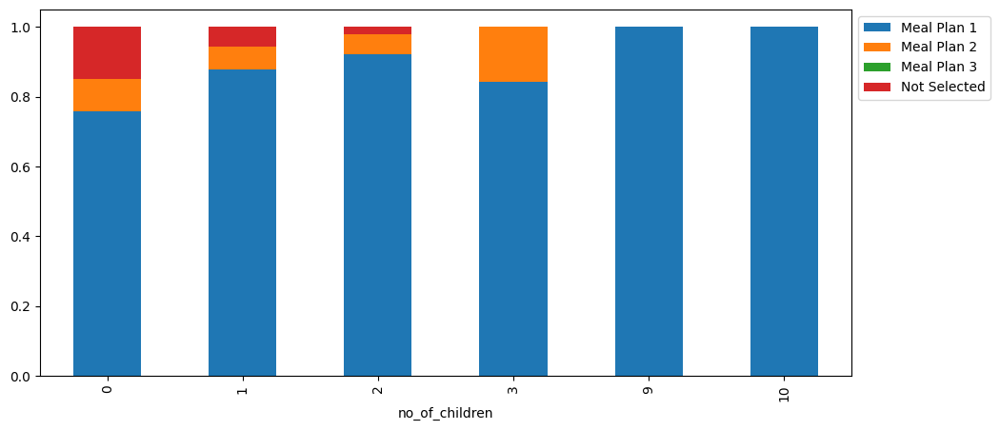

In [ ]:
stacked_barplot(data, "no_of_children", "type_of_meal_plan")

* Meal Plan 1 is the most preferred meal for all bookings
* Meal Plan 3 is most popular where there are 0 children in the booking

#### `no_of_children` vs `required_car_parking_space`

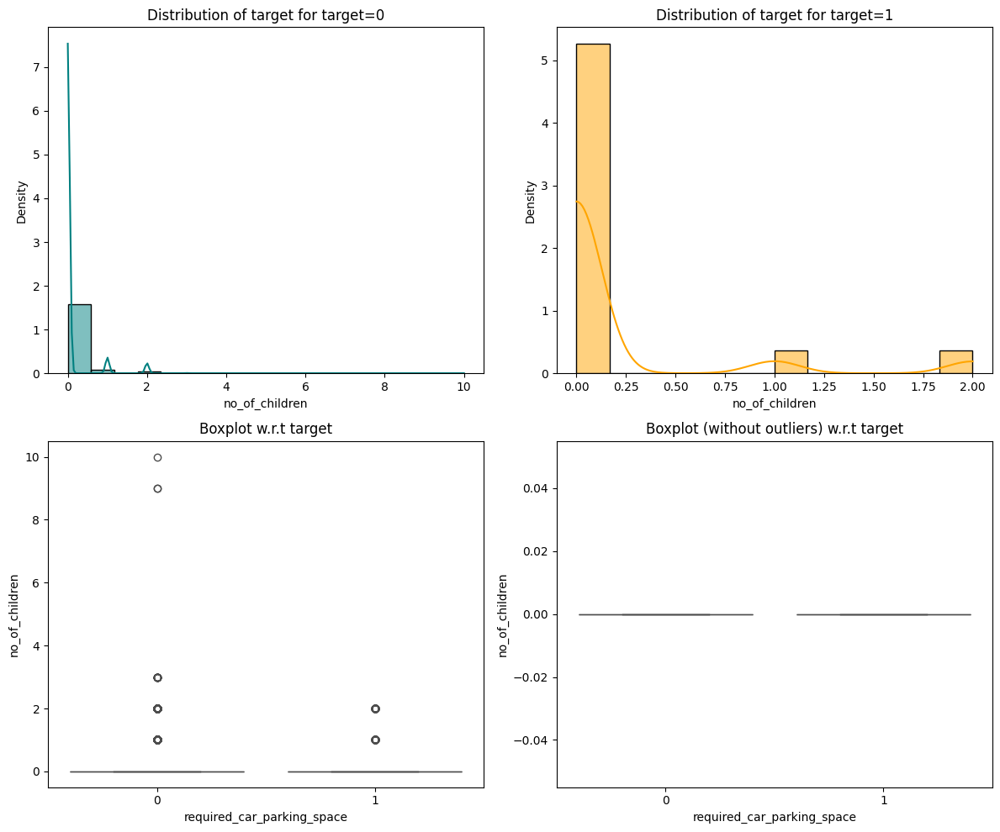

In [ ]:
distribution_plot_wrt_target(data, "no_of_children", "required_car_parking_space")

* bookings with 0 children then to have more requests for a car park space

#### `no_of_children` vs `room_type_reserved`

room_type_reserved  Room_Type 1  Room_Type 2  Room_Type 3  Room_Type 4  \
no_of_children                                                           
0                         26785          482            7         5850   
All                       28130          692            7         6057   
1                          1309           25            0          191   
2                            34          179            0           15   
3                             1            5            0            0   
9                             1            1            0            0   
10                            0            0            0            1   

room_type_reserved  Room_Type 5  Room_Type 6  Room_Type 7    All  
no_of_children                                                    
0                           241          121           91  33577  
All                         265          966          158  36275  
1                            13           64           16   1618 

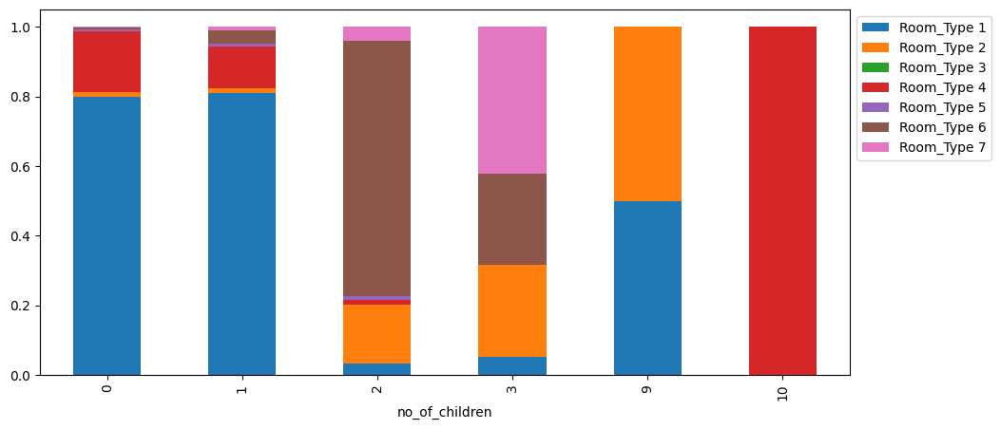

In [ ]:
stacked_barplot(data, "no_of_children", "room_type_reserved")

* When the number of children is 10, room type 4 is most popular
* When the number of children is 0 or 1, room type 1 is most popular
* When the number of children is 9, room type 1 and 2 is most popular
* When the number of children is 2, room type 6 is most popular
* When the number of children is 3, room type 7 is most popular

#### `no_of_children` vs `lead_time`

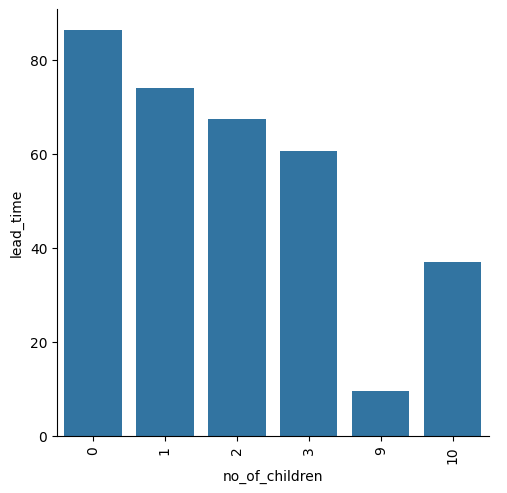

In [ ]:
sns.catplot(data=df,x = 'no_of_children' , y = 'lead_time', kind = "bar", ci = False);
plt.xticks(rotation=90);
plt.show()

* For bookings which have between 0 to 9 children, the avg lead time decreases as the number of children increase.  However avg lead time increased to approx 40 when the number of children in 10

#### `no_of_children` vs `arrival_year`

arrival_year    2017   2018    All
no_of_children                    
All             6514  29761  36275
0               6247  27330  33577
2                133    925   1058
1                126   1492   1618
3                  6     13     19
9                  2      0      2
10                 0      1      1
------------------------------------------------------------------------------------------------------------------------


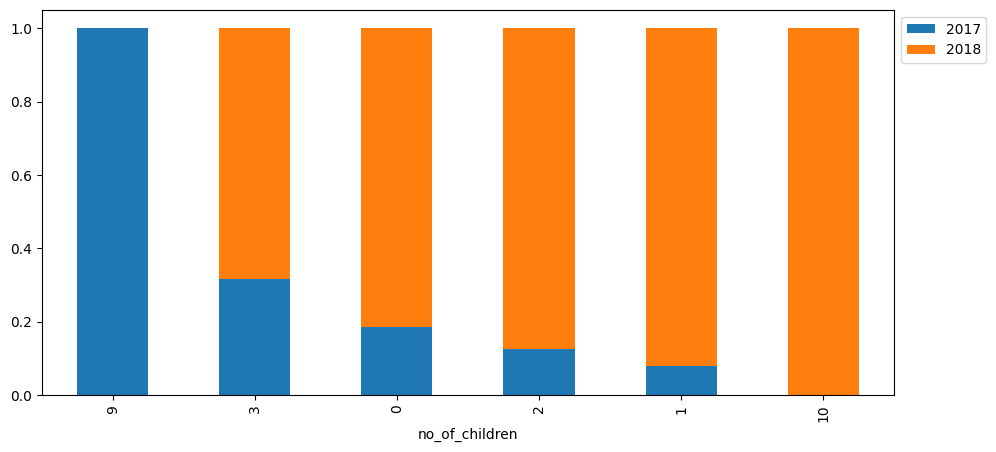

In [ ]:
stacked_barplot(data, "no_of_children", "arrival_year")

* All bookings with 9 children occurred in 2017
* All bookings with 10 children occurred in 2018
* The majority of all the other bookings was made in 2018

#### `no_of_children` vs `arrival_month`

arrival_month      1     2     3     4     5     6     7     8     9    10  \
no_of_children                                                               
All             1014  1704  2358  2736  2598  3203  2920  3813  4611  5317   
0                972  1584  2178  2522  2439  3049  2539  3284  4388  5036   
2                 22    50    60    95    71    54   123   208   119   112   
1                 19    69   119   118    88    99   256   313   104   168   
10                 1     0     0     0     0     0     0     0     0     0   
3                  0     1     1     1     0     1     2     7     0     0   
9                  0     0     0     0     0     0     0     1     0     1   

arrival_month     11    12    All  
no_of_children                     
All             2980  3021  36275  
0               2862  2724  33577  
2                 34   110   1058  
1                 84   181   1618  
10                 0     0      1  
3                  0     6     19  
9        

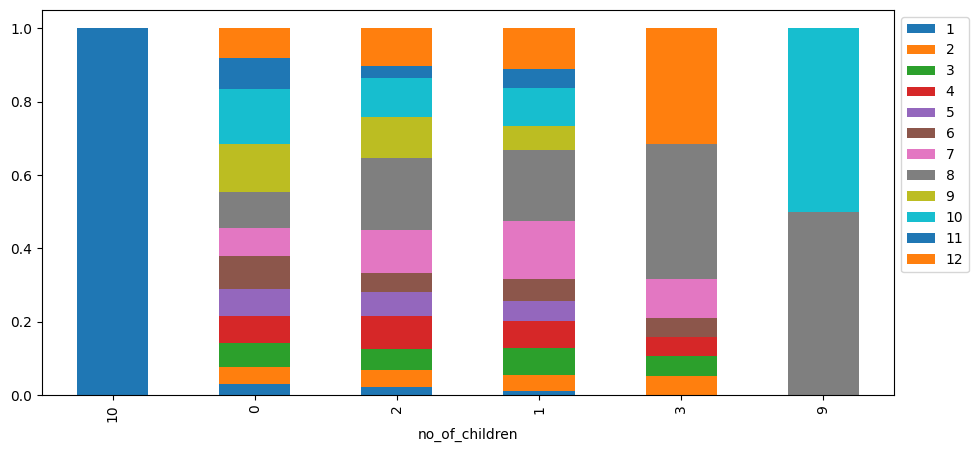

In [ ]:
stacked_barplot(data, "no_of_children", "arrival_month")

* When there is 0 children in the booking the most popular arrival month is 10
* When there is 1 child in the booking the most popular arrival months are 7 and 8
* When there are 2 children in the booking the most popular arrival month is 8
* When there are 3 children in the booking the most popular arrival month is 8
* When there are 9 children in the booking the most popular arrival month is 8 and 10
* When there are 10 children in the booking the most popular arrival month is 1

#### `no_of_children` vs `arrival_date`

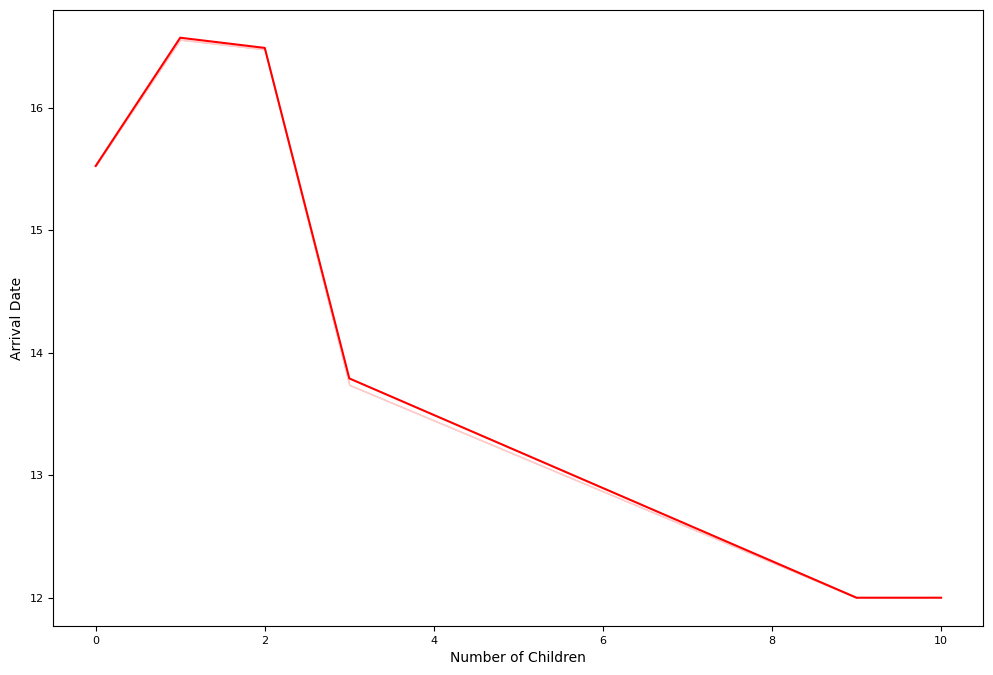

In [ ]:
plt.figure(figsize=(12,8))
sns.lineplot(data=df, x="no_of_children", y="arrival_date", ci=False, color="red")
plt.xlabel("Number of Children",fontsize=10)
plt.ylabel("Arrival Date", fontsize=10)
plt.xticks(fontsize = 8);
plt.yticks(fontsize = 8);
#plt.xticks(rotation=90);

* In general the `arrival_date` decreases as the number of children increases
* Most of the `arrival_date` is after the 12th of the month
* Bookings with 1 or 2 children tend to have the latest arrival dates

#### `no_of_children` vs `market_segment_type`

market_segment_type  Aviation  Complementary  Corporate  Offline  Online  \
no_of_children                                                             
0                         125            357       2007    10320   20768   
All                       125            391       2017    10528   23214   
1                           0             21          7      195    1395   
2                           0             11          2       12    1033   
3                           0              2          0        1      16   
9                           0              0          1        0       1   
10                          0              0          0        0       1   

market_segment_type    All  
no_of_children              
0                    33577  
All                  36275  
1                     1618  
2                     1058  
3                       19  
9                        2  
10                       1  
------------------------------------------------------

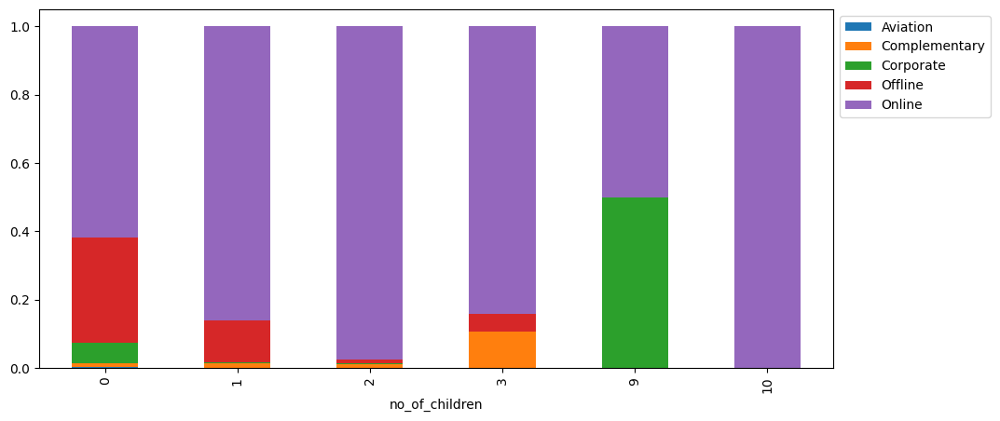

In [ ]:
stacked_barplot(data, "no_of_children", "market_segment_type")

* For bookings with 9 children, Online and Corporate are the most popular market segment types
* For the remaining bookings, Online was the most popular market segment type
* Offline bookings was most popular for bookings with 0 children
* Complementary was most popular with booking with 3 children

#### `no_of_children` vs `repeated_guest`

repeated_guest      0    1    All
no_of_children                   
All             35345  930  36275
0               32660  917  33577
1                1606   12   1618
2                1057    1   1058
3                  19    0     19
9                   2    0      2
10                  1    0      1
------------------------------------------------------------------------------------------------------------------------


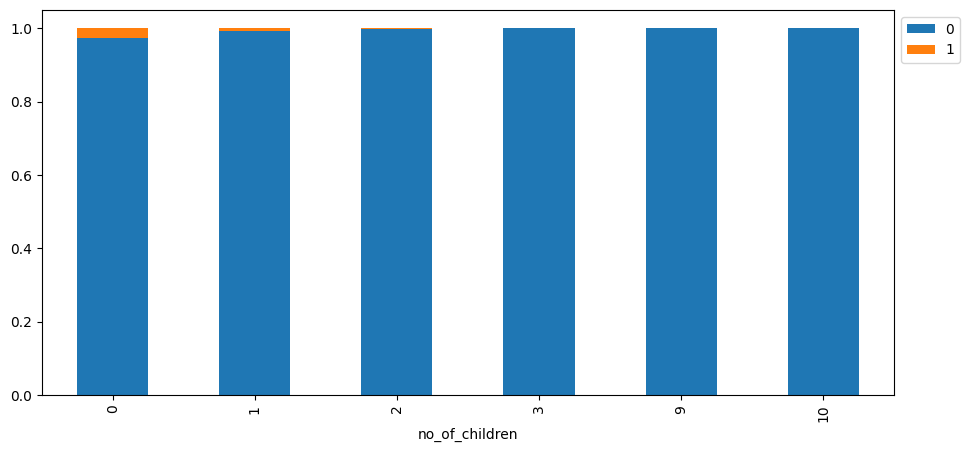

In [ ]:
stacked_barplot(data, "no_of_children", "repeated_guest")

* The maximum number of repeated guests was in bookings with 0 children

#### `no_of_children` vs `no_of_previous_cancellations`

no_of_previous_cancellations      0    1   2   3   4   5  6  11  13    All
no_of_children                                                            
0                             33240  197  46  43  10  11  1  25   4  33577
All                           35937  198  46  43  10  11  1  25   4  36275
1                              1617    1   0   0   0   0  0   0   0   1618
2                              1058    0   0   0   0   0  0   0   0   1058
3                                19    0   0   0   0   0  0   0   0     19
9                                 2    0   0   0   0   0  0   0   0      2
10                                1    0   0   0   0   0  0   0   0      1
------------------------------------------------------------------------------------------------------------------------


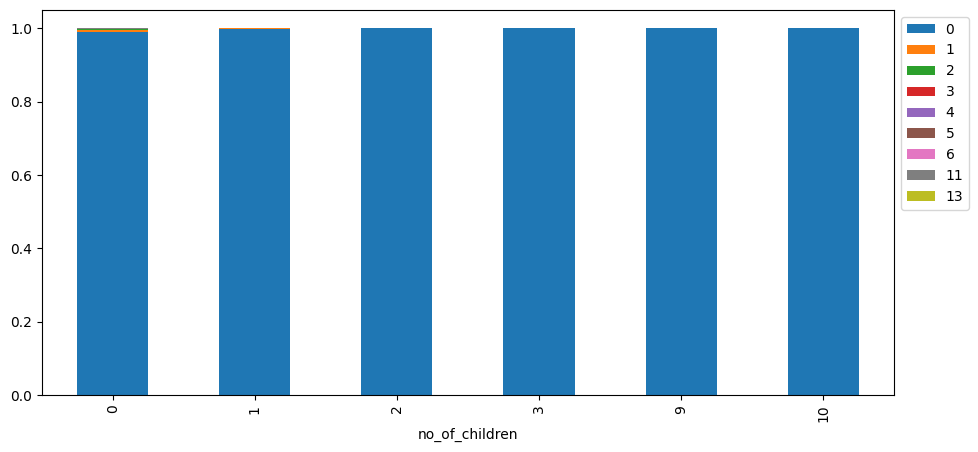

In [ ]:
stacked_barplot(data, "no_of_children", "no_of_previous_cancellations")

* The majority of ookings has 0 previous cancellations

#### `no_of_children` vs `no_of_previous_bookings_not_canceled`

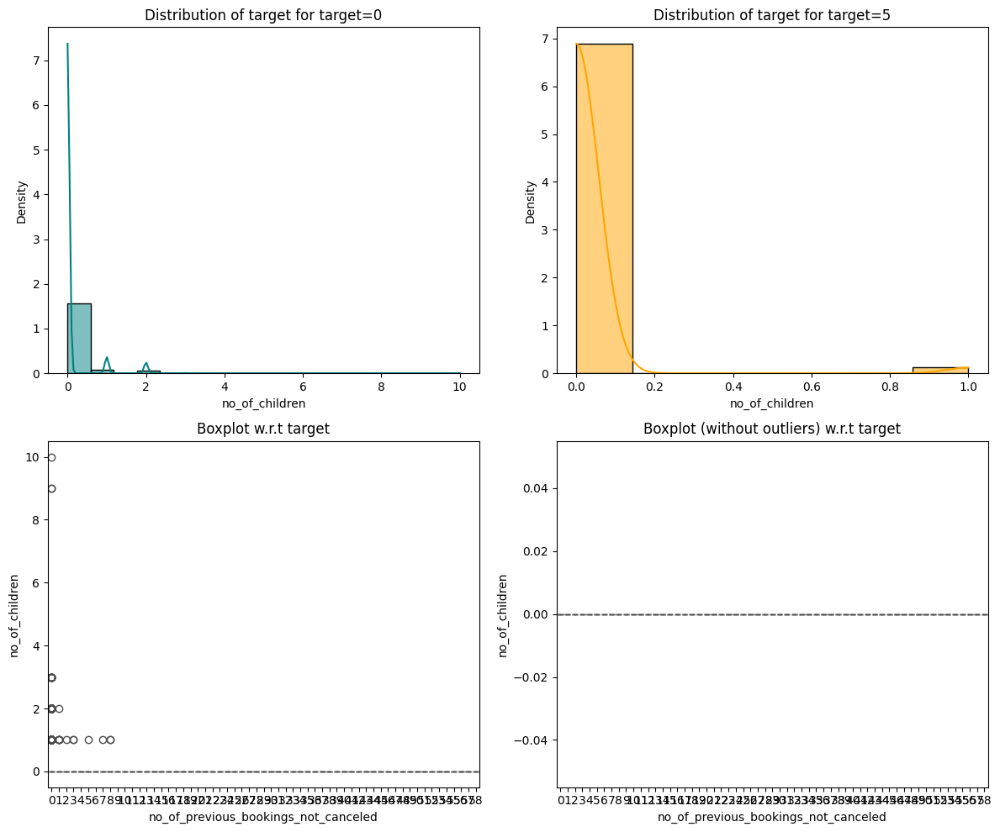

In [ ]:
distribution_plot_wrt_target(data, "no_of_children", "no_of_previous_bookings_not_canceled")

* The majority of bookings that was not previously cancelled had 0 children in the booking

#### `no_of_children` vs `avg_price_per_room`

<Figure size 1200x900 with 0 Axes>

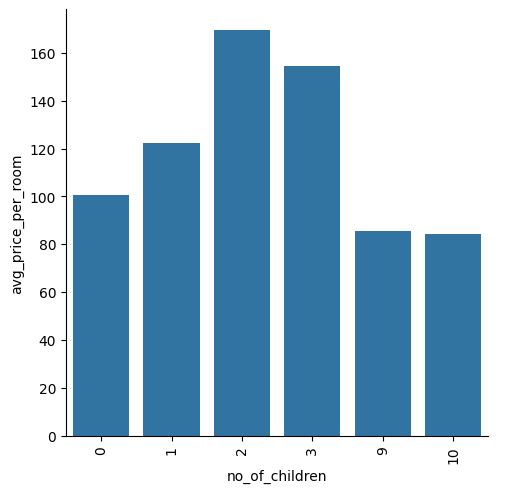

In [ ]:
plt.figure(figsize=(12,9))
sns.catplot(data=df,x = 'no_of_children' , y = 'avg_price_per_room', kind = "bar" ,ci = False);
plt.xticks( rotation=90);
plt.show()

<Figure size 1200x900 with 0 Axes>

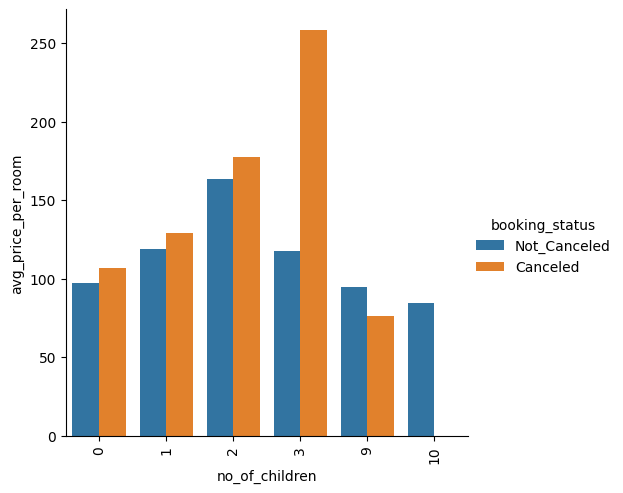

In [ ]:
plt.figure(figsize=(12,9))
sns.catplot(data=df,x = 'no_of_children' , y = 'avg_price_per_room', kind = "bar" , hue="booking_status" ,ci = False);
plt.xticks( rotation=90);
plt.show()

* The `avg_price_per_room` is highest when there are 2 children in the booking
* The `avg_price_per_room` is lowest when there are 9 or 10 children in the booking
* There is a considerable difference in the price of the room for bookings which was cancelled and not cancelled when the number of children was 3
* When the booking had 9 children the average price per room was less for the cancelled bookings than for the not cancelled bookings

#### `no_of_children` vs `no_of_special_requests`

<Figure size 1200x900 with 0 Axes>

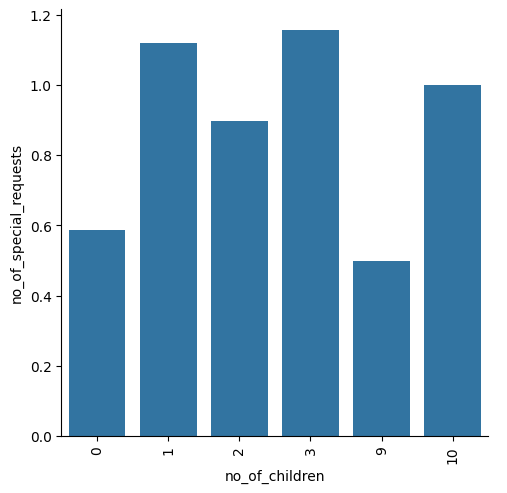

In [ ]:
plt.figure(figsize=(12,9))
sns.catplot(data=df,x = 'no_of_children' , y = 'no_of_special_requests', kind = "bar" ,ci = False);
plt.xticks( rotation=90);
plt.show()

* Bookings with 1 and 3 children tend to have more `no_of_special_requests`

#### `no_of_weekend_nights` vs `no_of_week_nights`

<Figure size 1200x900 with 0 Axes>

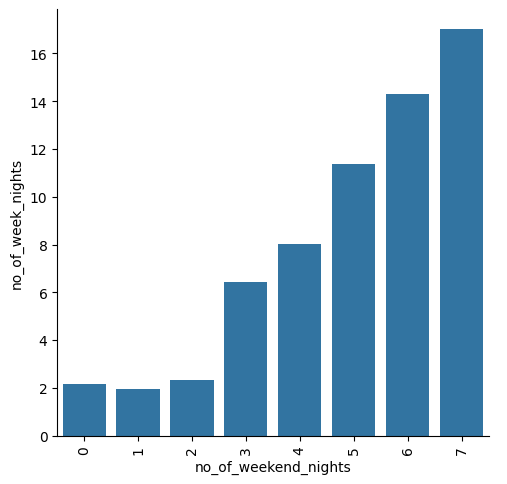

In [ ]:
plt.figure(figsize=(12,9))
sns.catplot(data=df,x = 'no_of_weekend_nights' , y = 'no_of_week_nights', kind = "bar" ,ci = False);
plt.xticks( rotation=90);
plt.show()

* As the number of weekend nights increases, the number of week nights also increases. This is understandable

#### `no_of_weekend_nights` vs `required_car_parking_space`

required_car_parking_space      0     1    All
no_of_weekend_nights                          
All                         35151  1124  36275
0                           16271   601  16872
1                            9682   313   9995
2                            8867   204   9071
3                             149     4    153
4                             127     2    129
5                              34     0     34
6                              20     0     20
7                               1     0      1
------------------------------------------------------------------------------------------------------------------------


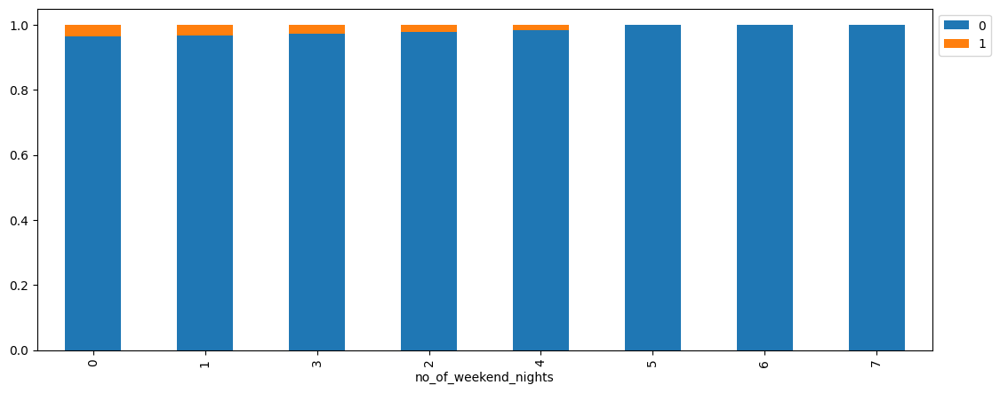

In [ ]:
stacked_barplot(data, "no_of_weekend_nights", "required_car_parking_space")

* Car parking space was requested for bookings made for 0 to 4 weekend nights
* Most of the bookings which requested car parking spaces was for 0 weekend nights

#### `no_of_weekend_nights` vs `room_type_reserved`

room_type_reserved    Room_Type 1  Room_Type 2  Room_Type 3  Room_Type 4  \
no_of_weekend_nights                                                       
All                         28130          692            7         6057   
1                            7732          173            4         1705   
0                           13493          286            3         2456   
2                            6685          229            0         1807   
3                             102            4            0           38   
4                              77            0            0           39   
5                              26            0            0            7   
6                              14            0            0            5   
7                               1            0            0            0   

room_type_reserved    Room_Type 5  Room_Type 6  Room_Type 7    All  
no_of_weekend_nights                                                
All                      

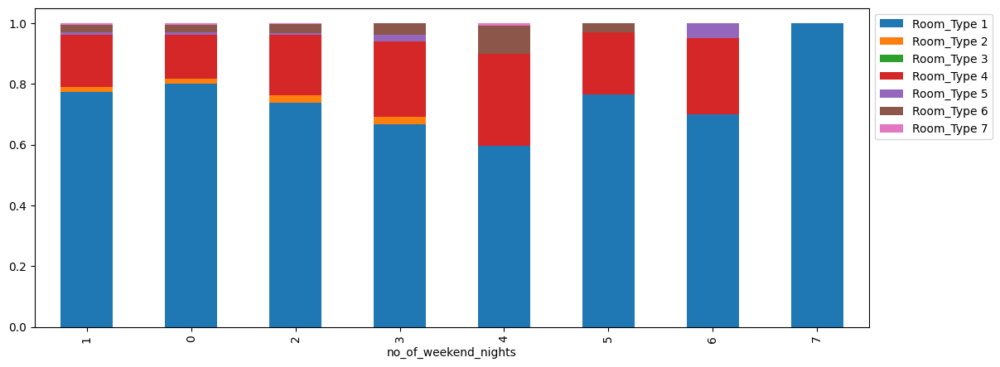

In [ ]:
stacked_barplot(data, "no_of_weekend_nights", "room_type_reserved")

*  For all the bookings Room Type 1 was the most requested.
*  Room Type 4 was most popu;ar in bookings mae for 4 nights
*  Room Type 5 is most popular in in bookings made for 6 weekend nights
*  Room Type 5 was most popular in rooms booked for 4 nights

#### `no_of_weekend_nights` vs `lead_time`

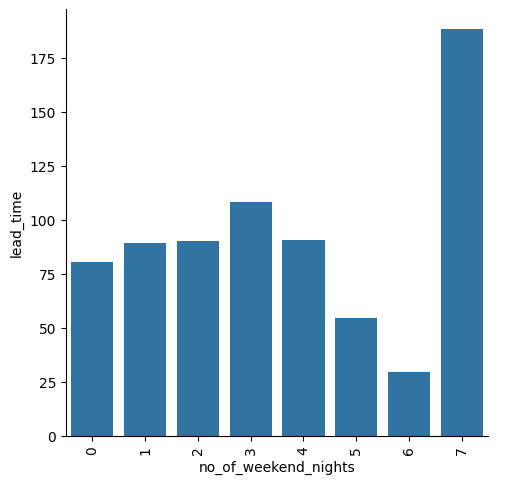

In [ ]:
sns.catplot(data=df,x = 'no_of_weekend_nights' , y = 'lead_time', kind = "bar", ci = False);
plt.xticks(rotation=90);
plt.show()

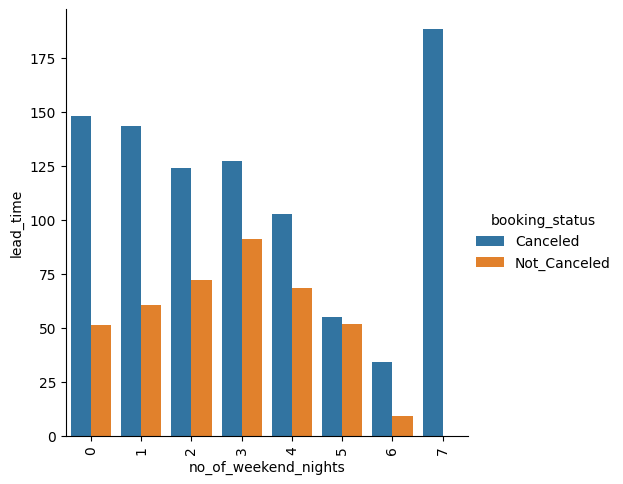

In [ ]:
sns.catplot(data=df,x = 'no_of_weekend_nights' , y = 'lead_time', kind = "bar", hue = "booking_status", ci = False);
plt.xticks(rotation=90);
plt.show()

* Bookings made for 7 weekend nights had the most lead time, all bookings ws cancelled
* Bookings made for 6 weekend nights have the least lead time
* In general cancelled bookings have a higher lead time
* For bookings with 0 or 1 weekend nights and ws cancelled the lead time as approx 3 times the lead time of the booking which was not cancelled

#### `no_of_weekend_nights` vs `arrival_year`

arrival_year          2017   2018    All
no_of_weekend_nights                    
All                   6514  29761  36275
0                     3513  13359  16872
2                     1501   7570   9071
1                     1457   8538   9995
3                       28    125    153
4                        9    120    129
5                        5     29     34
6                        1     19     20
7                        0      1      1
------------------------------------------------------------------------------------------------------------------------


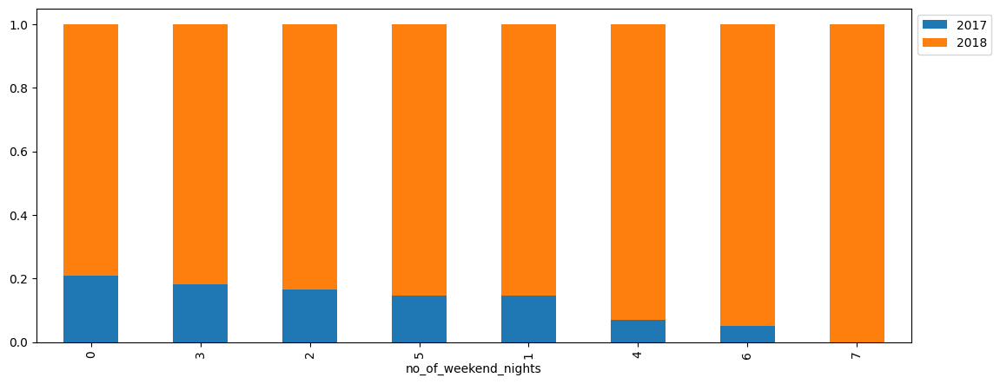

In [ ]:
stacked_barplot(data, "no_of_weekend_nights", "arrival_year")

* The majority of bookings was made in 2018
* In 2018 the most bookings was for 0 weekend nights

#### `no_of_weekend_nights` vs `arrival_month`

arrival_month            1     2     3     4     5     6     7     8     9  \
no_of_weekend_nights                                                         
All                   1014  1704  2358  2736  2598  3203  2920  3813  4611   
0                      535   800  1009  1163  1180  1777  1162  1703  2240   
2                      245   487   604   784   587   525   937  1092  1004   
1                      219   395   734   775   804   888   758   953  1343   
4                        6    10     5     4     5     9    19    24    12   
5                        4     1     0     1    11     0     6     4     2   
6                        3     4     3     1     1     0     0     2     0   
3                        2     7     3     8    10     4    37    35    10   
7                        0     0     0     0     0     0     1     0     0   

arrival_month           10    11    12    All  
no_of_weekend_nights                           
All                   5317  2980  3021  36275

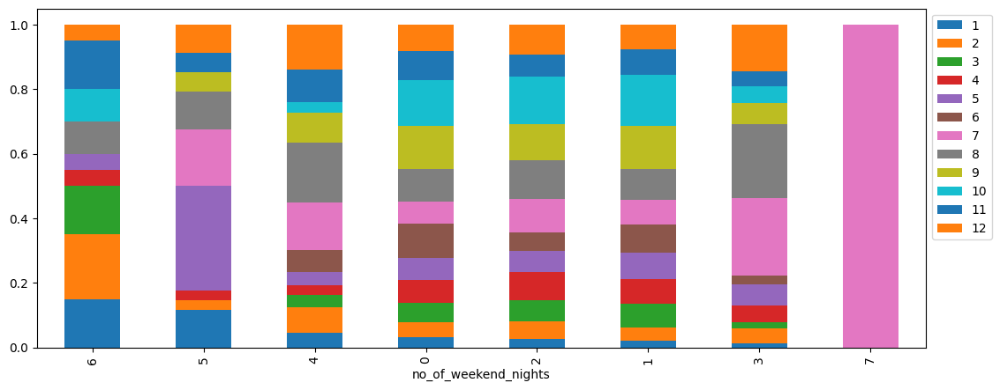

In [ ]:
stacked_barplot(data, "no_of_weekend_nights", "arrival_month")

*  Bookings with 0 weekend nights are more popular in month 9 and 10
*  Bookings with 1 weekend nights are more popular in month 10
*  Bookings with 2 weekend nights are more popular in month 10
*  Bookings with 3 weekend nights are more popular in month 7
*  Bookings with 4 weekend nights are more popular in month 8
*  Bookings with 5 weekend nights are more popular in month 5
*  Bookings with 6 weekend nights are more popular in month 2
*  Bookings with 7 weekend nights are more popular in month 7

#### `no_of_weekend_nights` vs `arrival_date`

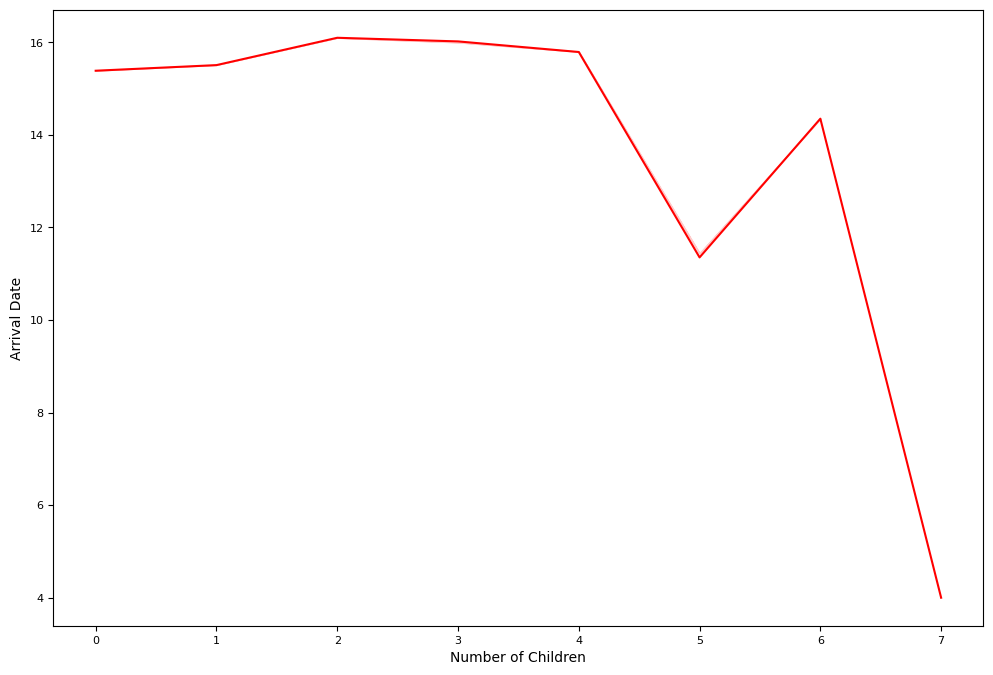

In [ ]:
plt.figure(figsize=(12,8))
sns.lineplot(data=df, x="no_of_weekend_nights", y="arrival_date", ci=False, color="red")
plt.xlabel("Number of Children",fontsize=10)
plt.ylabel("Arrival Date", fontsize=10)
plt.xticks(fontsize = 8);
plt.yticks(fontsize = 8);
#plt.xticks(rotation=90);

* Arrival date tend to be higher when the number of children is less
* Arrival date tend to be lower when the number of children are more

#### `no_of_weekend_nights` vs `market_segment_type`

no_of_weekend_nights      0     1     2    3    4   5   6  7    All
market_segment_type                                                
Online                 9831  6678  6424  126  117  20  17  1  23214
All                   16872  9995  9071  153  129  34  20  1  36275
Aviation                 56    35    18    2    2  12   0  0    125
Complementary           289    77    24    0    1   0   0  0    391
Corporate              1360   477   165   10    2   0   3  0   2017
Offline                5336  2728  2440   15    7   2   0  0  10528
------------------------------------------------------------------------------------------------------------------------


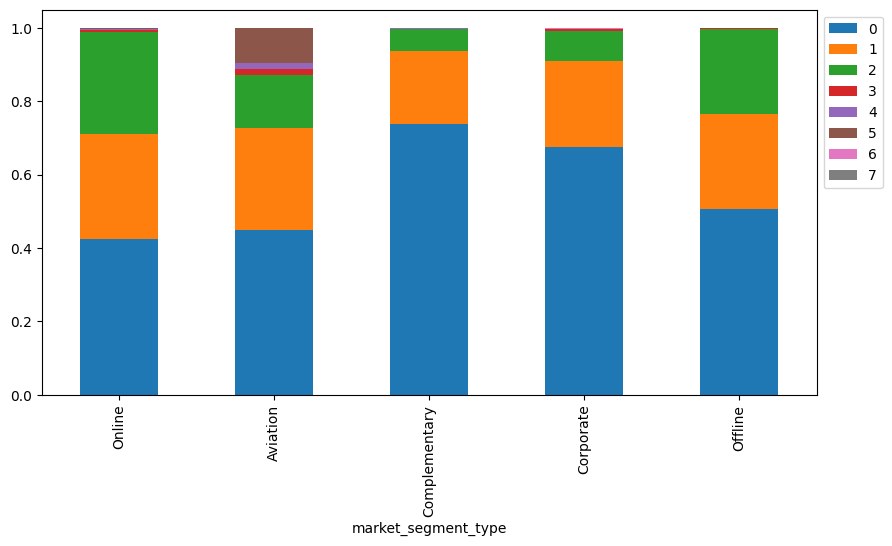

In [ ]:
stacked_barplot(data, "market_segment_type", "no_of_weekend_nights")

*  Majority of bookings are made online
*  Additionally, O weekend nights was the majority in each segment type

#### `no_of_weekend_nights` vs `repeated_guest`

repeated_guest            0    1    All
no_of_weekend_nights                   
All                   35345  930  36275
0                     16266  606  16872
1                      9762  233   9995
2                      8983   88   9071
3                       151    2    153
4                       128    1    129
5                        34    0     34
6                        20    0     20
7                         1    0      1
------------------------------------------------------------------------------------------------------------------------


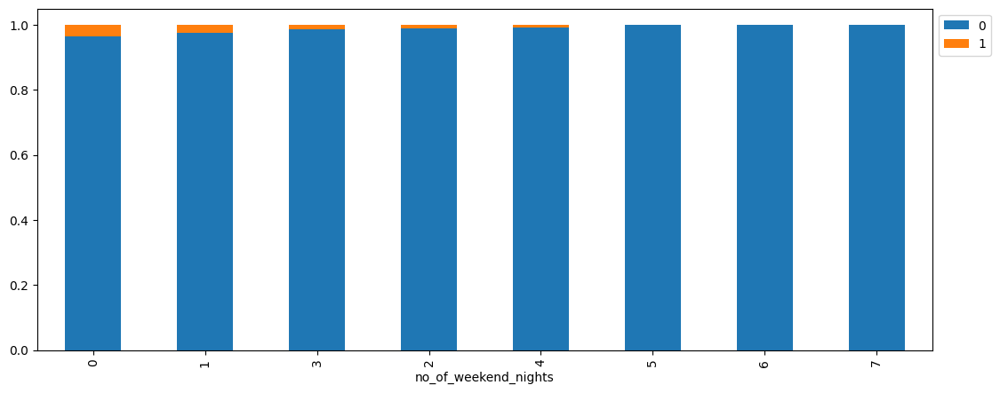

In [ ]:
stacked_barplot(data, "no_of_weekend_nights", "repeated_guest")

* Bookings with 0 to 4 weekend nights have the most repeated guests

#### `no_of_weekend_nights` vs `no_of_previous_cancellations`

no_of_previous_cancellations      0    1   2   3   4   5  6  11  13    All
no_of_weekend_nights                                                      
0                             16658  131  26  27   6   4  1  19   0  16872
All                           35937  198  46  43  10  11  1  25   4  36275
1                              9925   35  14   8   2   3  0   4   4   9995
2                              9018   32   6   8   1   4  0   2   0   9071
3                               152    0   0   0   1   0  0   0   0    153
4                               129    0   0   0   0   0  0   0   0    129
5                                34    0   0   0   0   0  0   0   0     34
6                                20    0   0   0   0   0  0   0   0     20
7                                 1    0   0   0   0   0  0   0   0      1
------------------------------------------------------------------------------------------------------------------------


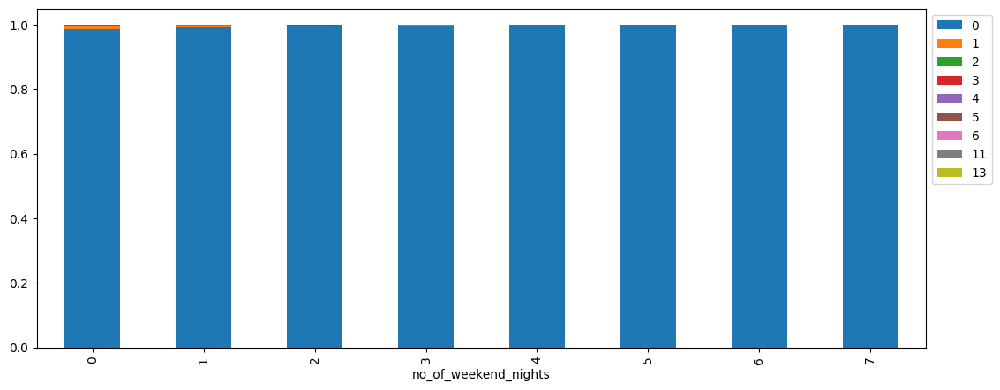

In [ ]:
stacked_barplot(data, "no_of_weekend_nights", "no_of_previous_cancellations")

* The majority of bookings had 0 previous cancellations

#### `no_of_weekend_nights` vs `no_of_previous_bookings_not_canceled`

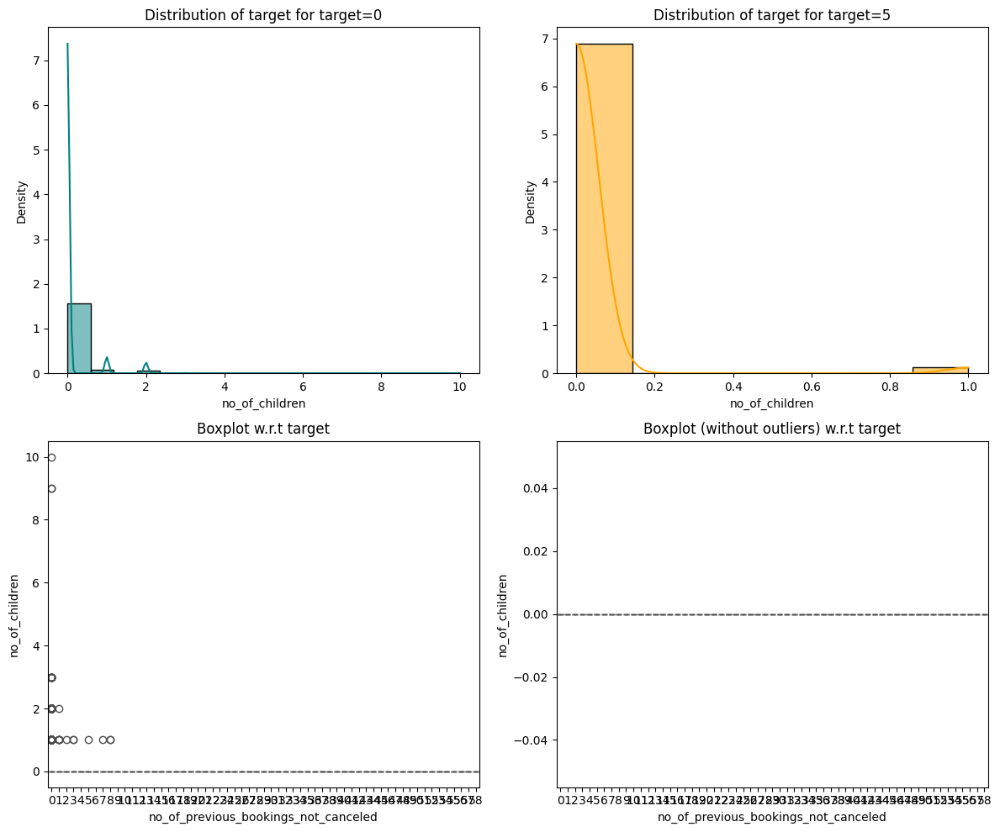

In [ ]:
distribution_plot_wrt_target(data, "no_of_children", "no_of_previous_bookings_not_canceled")

* Number of previous bookings not cancelled is highest with 0 children

#### `no_of_weekend_nights` vs `avg_price_per_room`

<Figure size 1200x900 with 0 Axes>

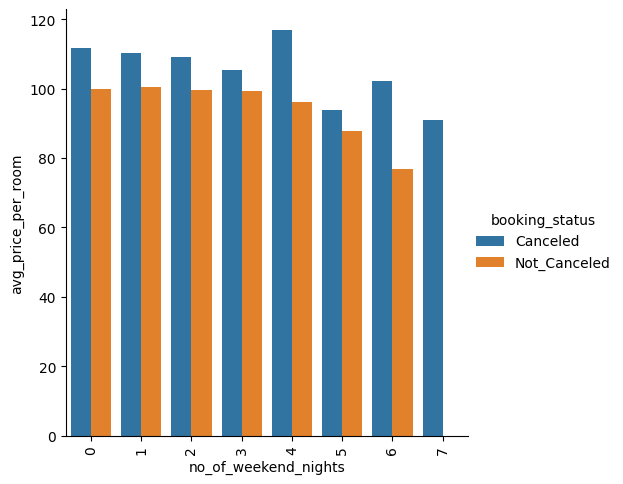

In [ ]:
plt.figure(figsize=(12,9))
sns.catplot(data=df,x = 'no_of_weekend_nights' , y = 'avg_price_per_room', kind = "bar" , hue="booking_status" ,ci = False);
plt.xticks( rotation=90);
plt.show()

* The avg price per room for the bkkoings which were cancelled was higher than the bookings which was not cancelled

#### `no_of_weekend_nights` vs `no_of_special_requests`

<Figure size 1200x900 with 0 Axes>

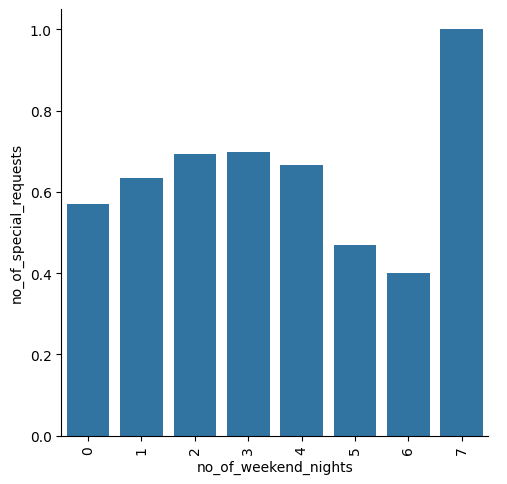

In [ ]:
plt.figure(figsize=(12,9))
sns.catplot(data=df,x = 'no_of_weekend_nights' , y = 'no_of_special_requests', kind = "bar" ,ci = False);
plt.xticks( rotation=90);
plt.show()

<Figure size 1200x900 with 0 Axes>

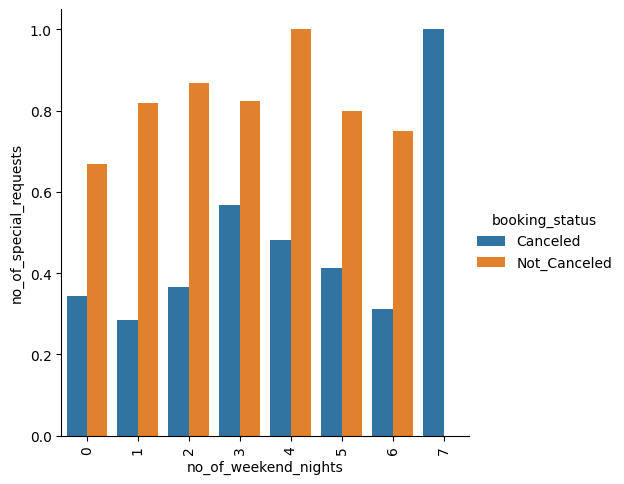

In [ ]:
plt.figure(figsize=(12,9))
sns.catplot(data=df,x = 'no_of_weekend_nights' , y = 'no_of_special_requests', kind = "bar", hue="booking_status" ,ci = False);
plt.xticks( rotation=90);
plt.show()

* Rooms with 2, 3, 4 and 7 weekend nights tend to have more special requests
* Bookings which were cancelled tend to have less special requests than bookings which were not cancelled

#### `no_of_week_nights` vs `type_of_meal_plan`

type_of_meal_plan  Meal Plan 1  Meal Plan 2  Meal Plan 3  Not Selected    All
no_of_week_nights                                                            
All                      27835         3305            5          5130  36275
1                         6908          873            3          1704   9488
2                         8547         1550            1          1346  11444
3                         6572          402            1           864   7839
11                          13            1            0             3     17
17                           3            0            0             0      3
16                           1            0            0             1      2
15                           5            0            0             5     10
14                           6            0            0             1      7
13                           3            0            0             2      5
12                           6            0            0        

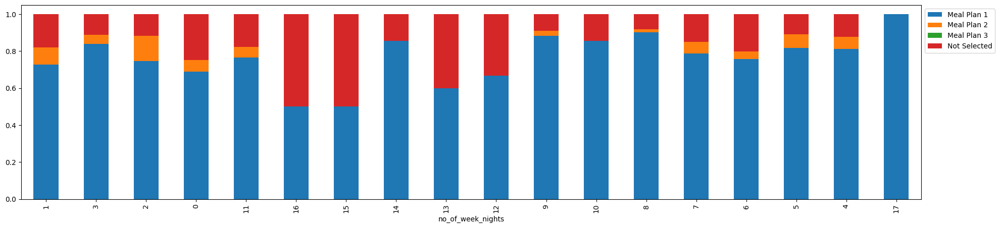

In [ ]:
stacked_barplot(data, "no_of_week_nights", "type_of_meal_plan")

* Meal Plan 1 is the most popular
* Meal PLan 2 is most popular for bookings with 2 nights
* Meal Plan not selected is most popular for 1 night

#### `no_of_week_nights` vs `required_car_parking_space`

required_car_parking_space      0     1    All
no_of_week_nights                             
All                         35151  1124  36275
1                            9055   433   9488
2                           11144   300  11444
3                            7661   178   7839
0                            2280   107   2387
4                            2924    66   2990
5                            1578    36   1614
6                             188     1    189
7                             112     1    113
10                             61     1     62
11                             16     1     17
8                              62     0     62
12                              9     0      9
13                              5     0      5
14                              7     0      7
15                             10     0     10
16                              2     0      2
17                              3     0      3
9                              34     0     34
-------------

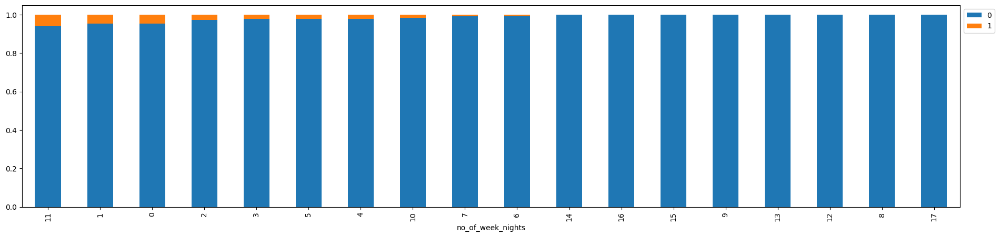

In [ ]:
stacked_barplot(data, "no_of_week_nights", "required_car_parking_space")

* The bookings with a larger number of week nights bookings do not require a car parking space
* Bookings made with 1 and 2 week night have the most requests for a car parking space

#### `no_of_week_nights` vs `room_type_reserved`

no_of_week_nights      0     1      2     3     4     5    6    7   8   9  10  \
room_type_reserved                                                              
All                 2387  9488  11444  7839  2990  1614  189  113  62  34  62   
Room_Type 1         2058  7620   9111  5845  2094  1044  139   81  38  21  38   
Room_Type 4          231  1271   1723  1553   707   457   41   25  16   8  14   
Room_Type 2           22   187    215   161    62    35    2    2   2   2   2   
Room_Type 3            0     3      3     0     0     1    0    0   0   0   0   
Room_Type 5           27    68     79    47    23    18    0    0   2   0   0   
Room_Type 6           39   288    266   206    92    52    6    4   3   3   7   
Room_Type 7           10    51     47    27    12     7    1    1   1   0   1   

no_of_week_nights   11  12  13  14  15  16  17    All  
room_type_reserved                                     
All                 17   9   5   7  10   2   3  36275  
Room_Type 1         1

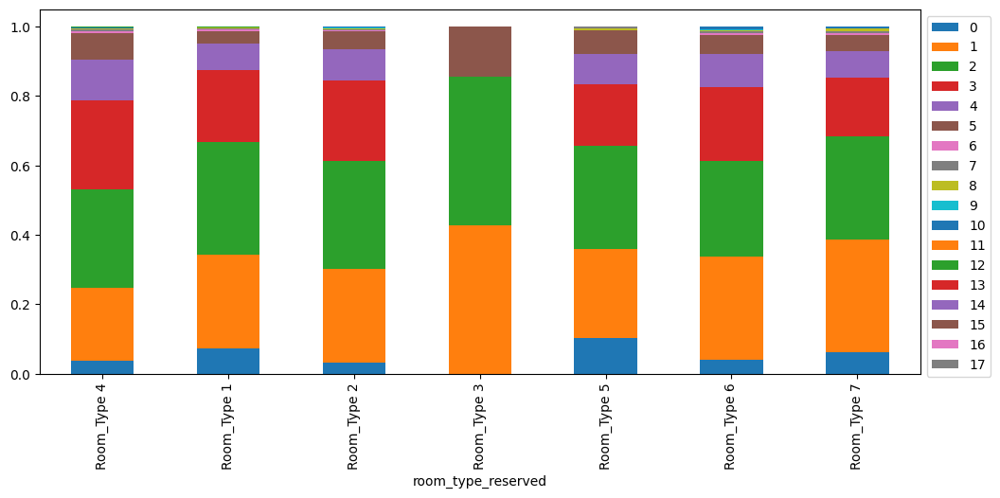

In [ ]:
stacked_barplot(data, "room_type_reserved", "no_of_week_nights")

*  For Bookings made for Room Type 1, 2 weeknights was most popular
*  For Bookings made for Room Type 2, 1 and 2 weeknights was most popular
*  For Bookings made for Room Type 3, 1 weeknights was most popular
*  For Bookings made for Room Type 4, 2 and 3 weeknights was most popular
*  For Bookings made for Room Type 5, 2 and 3 weeknights was most popular
*  For Bookings made for Room Type 6, 2 and 3 weeknights was most popular
*  For Bookings made for Room Type 7, 2 and 3 weeknights was most popular

#### `no_of_week_nights` vs `lead_time`

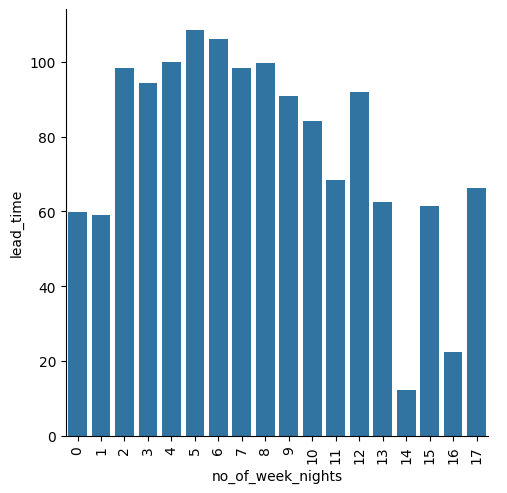

In [ ]:
sns.catplot(data=df,x = 'no_of_week_nights' , y = 'lead_time', kind = "bar", ci = False);
plt.xticks(rotation=90);
plt.show()

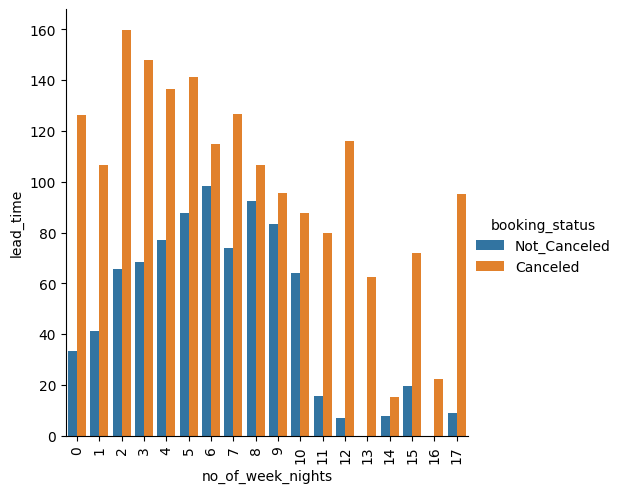

In [ ]:
sns.catplot(data=df,x = 'no_of_week_nights' , y = 'lead_time', kind = "bar", hue = "booking_status", ci = False);
plt.xticks(rotation=90);
plt.show()

* Bookings made for 5 and 6 week nights had the most lead time.
* Bookings made for 14 week nights have the least lead time
* In general cancelled bookings have a higher lead time

#### `no_of_week_nights` vs `arrival_year`

arrival_year       2017   2018    All
no_of_week_nights                    
All                6514  29761  36275
2                  2428   9016  11444
1                  1766   7722   9488
3                  1172   6667   7839
4                   486   2504   2990
0                   379   2008   2387
5                   209   1405   1614
7                    23     90    113
6                    22    167    189
8                     8     54     62
10                    6     56     62
9                     6     28     34
15                    4      6     10
11                    2     15     17
12                    2      7      9
13                    1      4      5
14                    0      7      7
16                    0      2      2
17                    0      3      3
------------------------------------------------------------------------------------------------------------------------


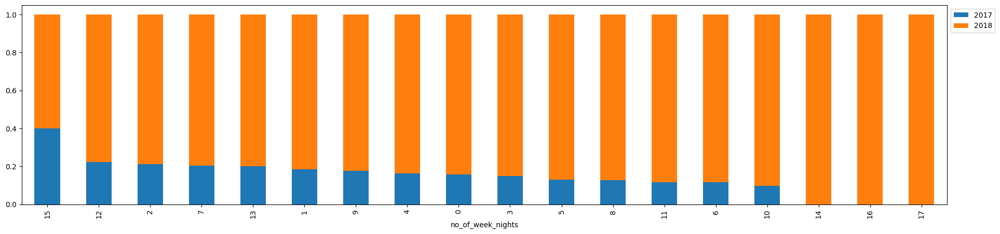

In [ ]:
stacked_barplot(data, "no_of_week_nights", "arrival_year")

* The majority of bookings was made in 2018
* In 2017 the most bookings was for 2 weekend nights

#### `no_of_week_nights` vs `arrival_month`

no_of_week_nights     0     1      2     3     4     5    6    7   8   9  10  \
arrival_month                                                                  
All                2387  9488  11444  7839  2990  1614  189  113  62  34  62   
2                    89   654    464   305   113    48   11    7   3   4   1   
3                   108   556    744   596   213   113    8    7   6   1   2   
1                    75   397    273   174    48    27    5    1   2   1   2   
4                   190   850    776   553   260    84    8    5   3   2   3   
5                   168   654    799   686   208    63    2    3   1   1  12   
6                   185   780   1233   692   204    81   13    8   4   1   1   
7                   149   874    832   436   318   214   38   26  15   3   7   
8                   223  1035   1099   703   367   295   41   14   9   7  13   
9                   384  1019   1695   964   298   207   23    8   4   0   5   
10                  494  1294   1717  12

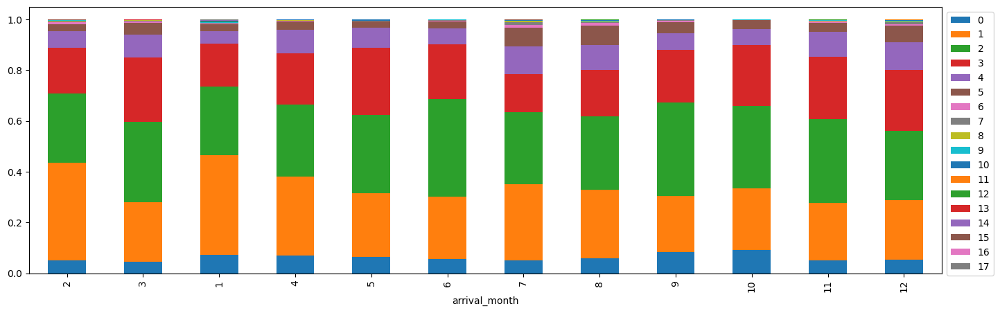

In [ ]:
stacked_barplot(data, "arrival_month", "no_of_week_nights")

*  1 and 2 week nights form the majority of bookings, followed by 3 week nights

#### `no_of_week_nights` vs `arrival_date`

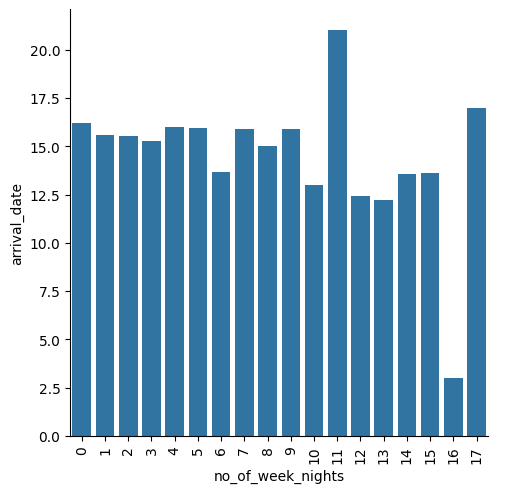

In [ ]:
sns.catplot(data=df,x = 'no_of_week_nights' , y = 'arrival_date', kind = "bar", ci = False);
plt.xticks(rotation=90);
plt.show()

* On average the arrival date is between the 12th to the 16th of the month.
* Bookings with 11 and 17 week nights tend to have larger arrival dates

#### `no_of_week_nights` vs `market_segment_type`

no_of_week_nights       0     1      2     3     4     5    6    7   8   9  \
market_segment_type                                                          
Online               1630  5906   6617  5149  2239  1242  152   98  57  29   
All                  2387  9488  11444  7839  2990  1614  189  113  62  34   
Aviation                9    38     32    21     5     3    2    0   3   0   
Complementary          58   225     87    13     2     3    0    2   0   0   
Corporate             249   949    526   240    25    18    4    2   0   1   
Offline               441  2370   4182  2416   719   348   31   11   2   4   

no_of_week_nights    10  11  12  13  14  15  16  17    All  
market_segment_type                                         
Online               48  16   8   3   7   9   2   2  23214  
All                  62  17   9   5   7  10   2   3  36275  
Aviation             11   1   0   0   0   0   0   0    125  
Complementary         1   0   0   0   0   0   0   0    391  
Corporate

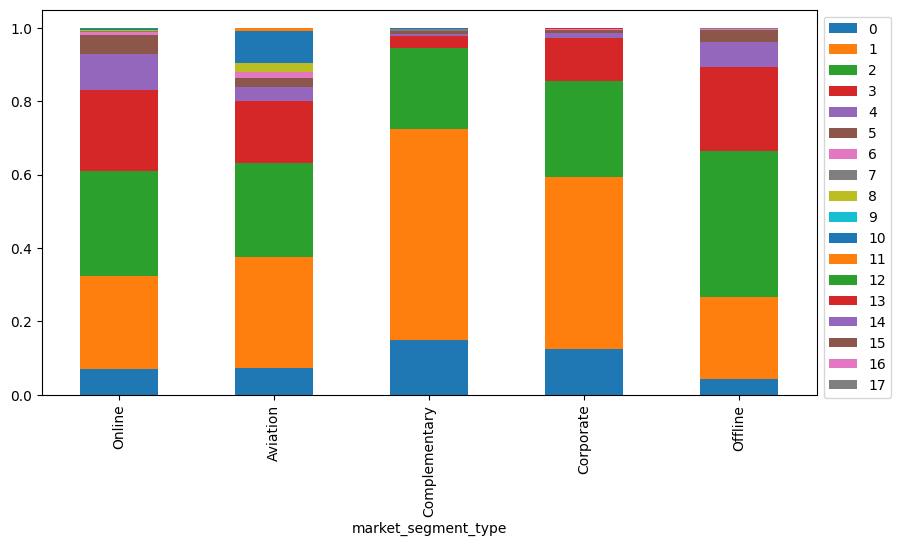

In [ ]:
stacked_barplot(data, "market_segment_type", "no_of_week_nights")

*  Majority of bookings are made online
*  Majority of Complementary and Corporate bookings was made for 1 night
*  Majority of Offline bookings was made for 2 nights
*  Online bookings was mostly made for 1, 2 and 3 nights
*  The majority of Aviation bookings was for 1 and 2 nights

#### `no_of_week_nights` vs `repeated_guest`

repeated_guest         0    1    All
no_of_week_nights                   
All                35345  930  36275
1                   9013  475   9488
2                  11266  178  11444
0                   2233  154   2387
3                   7738  101   7839
4                   2981    9   2990
5                   1605    9   1614
7                    111    2    113
6                    188    1    189
8                     61    1     62
10                    62    0     62
11                    17    0     17
12                     9    0      9
13                     5    0      5
14                     7    0      7
15                    10    0     10
16                     2    0      2
17                     3    0      3
9                     34    0     34
------------------------------------------------------------------------------------------------------------------------


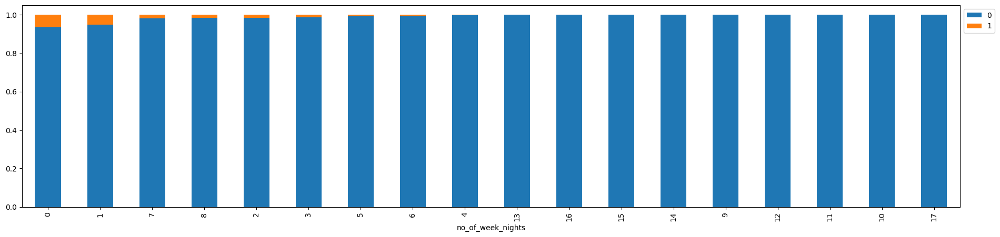

In [ ]:
stacked_barplot(data, "no_of_week_nights", "repeated_guest")

* Bookings with 0 to 3 week nights have the most repeated guests

#### `no_of_week_nights` vs `no_of_previous_cancellations`

no_of_previous_cancellations      0    1   2   3   4   5  6  11  13    All
no_of_weekend_nights                                                      
0                             16658  131  26  27   6   4  1  19   0  16872
All                           35937  198  46  43  10  11  1  25   4  36275
1                              9925   35  14   8   2   3  0   4   4   9995
2                              9018   32   6   8   1   4  0   2   0   9071
3                               152    0   0   0   1   0  0   0   0    153
4                               129    0   0   0   0   0  0   0   0    129
5                                34    0   0   0   0   0  0   0   0     34
6                                20    0   0   0   0   0  0   0   0     20
7                                 1    0   0   0   0   0  0   0   0      1
------------------------------------------------------------------------------------------------------------------------


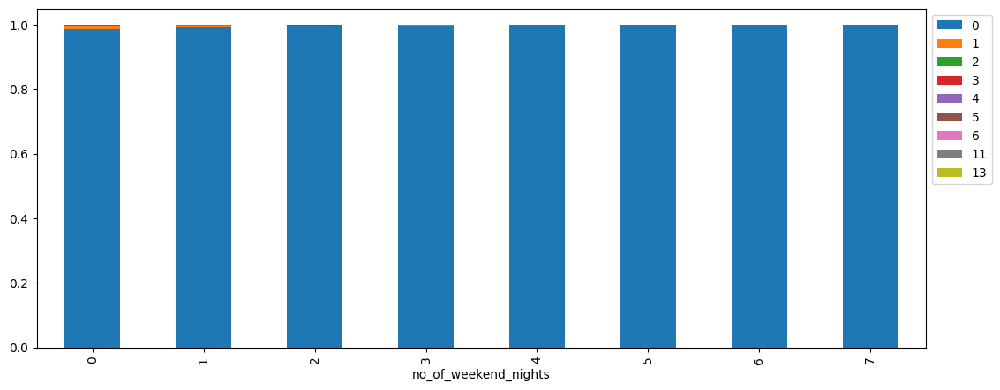

In [ ]:
stacked_barplot(data, "no_of_weekend_nights", "no_of_previous_cancellations")

* The majority of bookings had 0 previous cancellations

#### `no_of_week_nights` vs `no_of_previous_bookings_not_canceled`

no_of_previous_cancellations      0    1   2   3   4   5  6  11  13    All
no_of_week_nights                                                         
All                           35937  198  46  43  10  11  1  25   4  36275
2                             11368   37  15   8   2   3  1  10   0  11444
10                               62    0   0   0   0   0  0   0   0     62
17                                3    0   0   0   0   0  0   0   0      3
16                                2    0   0   0   0   0  0   0   0      2
15                               10    0   0   0   0   0  0   0   0     10
14                                7    0   0   0   0   0  0   0   0      7
13                                5    0   0   0   0   0  0   0   0      5
12                                9    0   0   0   0   0  0   0   0      9
11                               17    0   0   0   0   0  0   0   0     17
0                              2345   32   5   3   0   1  0   1   0   2387
1                        

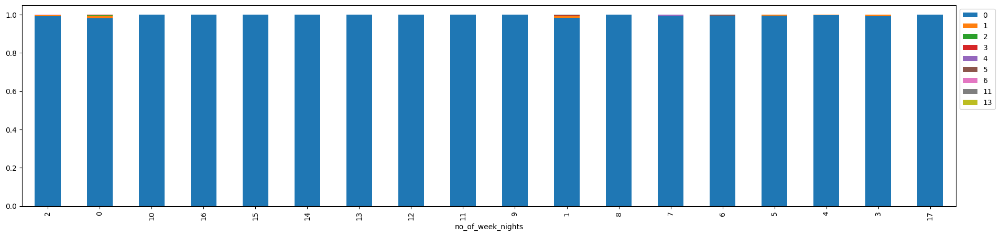

In [ ]:
stacked_barplot(data, "no_of_week_nights", "no_of_previous_cancellations")

* Bookings with 1, 2 amnd 3 week nights had the most amount of cancellations

#### `no_of_week_nights` vs `avg_price_per_room`

<Figure size 1200x900 with 0 Axes>

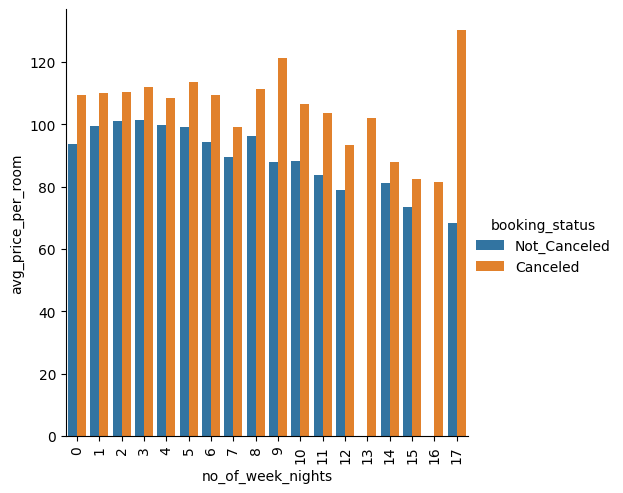

In [ ]:
plt.figure(figsize=(12,9))
sns.catplot(data=df,x = 'no_of_week_nights' , y = 'avg_price_per_room', kind = "bar" , hue="booking_status" ,ci = False);
plt.xticks( rotation=90);
plt.show()

* The avg price per room for the bookings which were cancelled was higher than the bookings which was not cancelled

#### `no_of_week_nights` vs `no_of_special_requests`

<Figure size 1200x900 with 0 Axes>

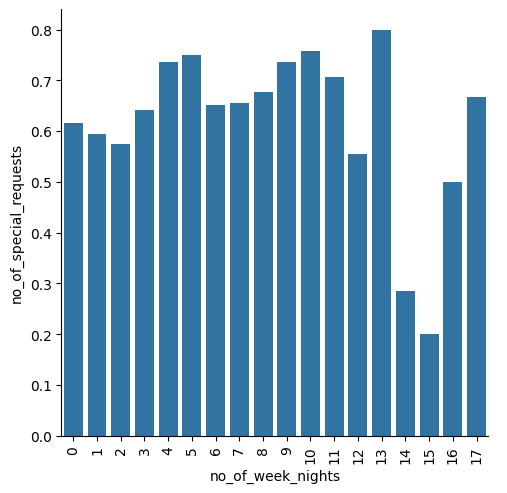

In [ ]:
plt.figure(figsize=(12,9))
sns.catplot(data=df,x = 'no_of_week_nights' , y = 'no_of_special_requests', kind = "bar" ,ci = False);
plt.xticks( rotation=90);
plt.show()

<Figure size 1200x900 with 0 Axes>

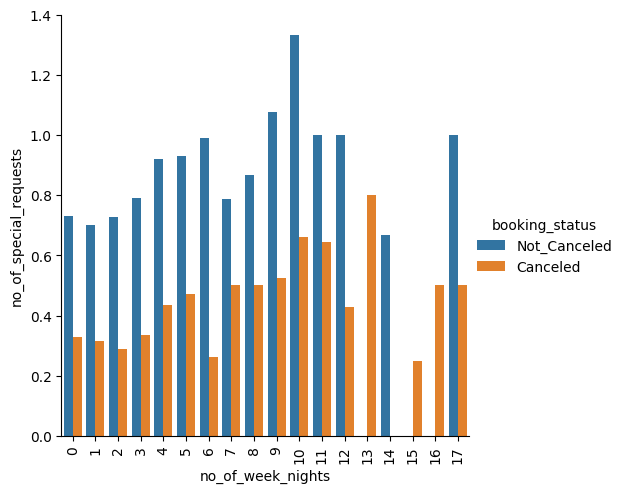

In [ ]:
plt.figure(figsize=(12,9))
sns.catplot(data=df,x = 'no_of_week_nights' , y = 'no_of_special_requests', kind = "bar", hue="booking_status" ,ci = False);
plt.xticks( rotation=90);
plt.show()

* Rooms with 13, 4, 5 and 10 week nights tend to have more special requests
* Bookings which were cancelled tend to have a less special requests than bookings which were not cancelled

required_car_parking_space      0     1    All
type_of_meal_plan                             
All                         35151  1124  36275
Meal Plan 1                 26906   929  27835
Not Selected                 4981   149   5130
Meal Plan 2                  3260    45   3305
Meal Plan 3                     4     1      5
------------------------------------------------------------------------------------------------------------------------


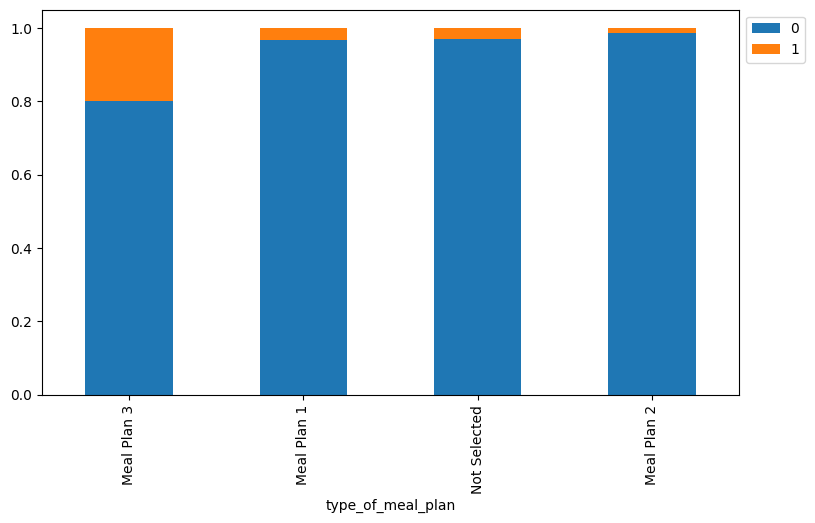

In [ ]:
stacked_barplot(data, "type_of_meal_plan", "required_car_parking_space")

* Bookings which requested a parking sapce tend to book Meal Pan 1

#### `type_of_meal_plan` vs `room_type_reserved`

type_of_meal_plan   Meal Plan 1  Meal Plan 2  Meal Plan 3  Not Selected    All
room_type_reserved                                                            
All                       27835         3305            5          5130  36275
Room_Type 7                 152            2            3             1    158
Room_Type 1               20157         2934            1          5038  28130
Room_Type 4                5748          273            1            35   6057
Room_Type 2                 653           16            0            23    692
Room_Type 3                   5            0            0             2      7
Room_Type 5                 242           14            0             9    265
Room_Type 6                 878           66            0            22    966
------------------------------------------------------------------------------------------------------------------------


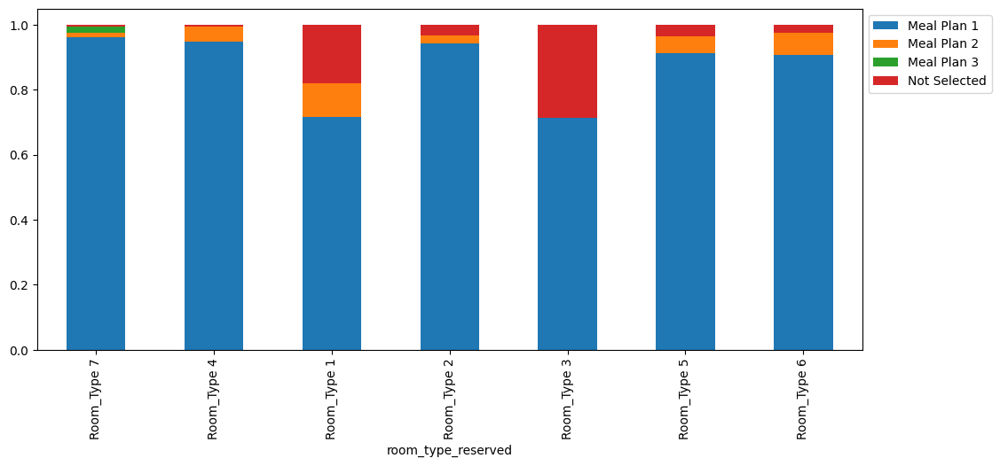

In [ ]:
stacked_barplot(data, "room_type_reserved", "type_of_meal_plan")

*  Meal Plan 1 was most popular for all room types
*  Meal Plan 2 was most popular for Room Type 1
*  Meal Plan Not Selected was most common for Room Type 1

#### `type_of_meal_plan` vs `lead_time`

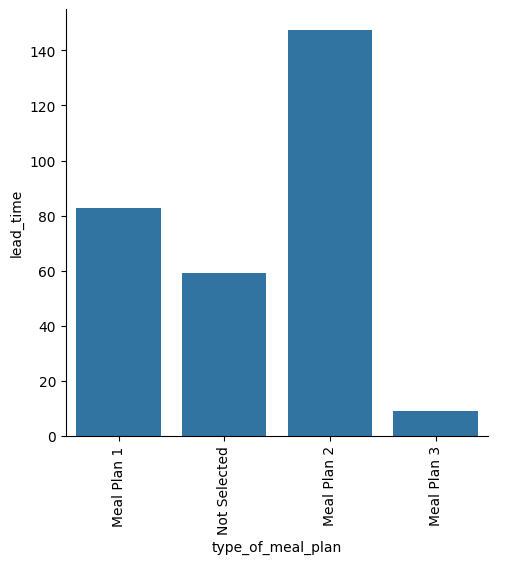

In [ ]:
sns.catplot(data=df,x = 'type_of_meal_plan' , y = 'lead_time', kind = "bar", ci = False);
plt.xticks(rotation=90);
plt.show()

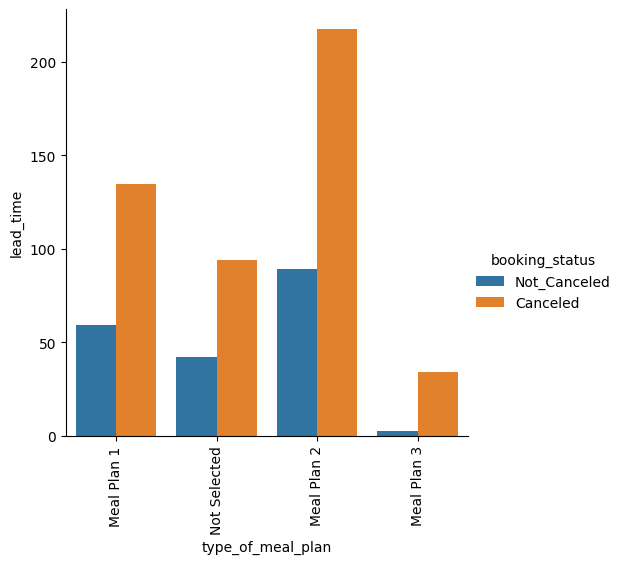

In [ ]:
sns.catplot(data=df,x = 'type_of_meal_plan' , y = 'lead_time', kind = "bar", hue = "booking_status", ci = False);
plt.xticks(rotation=90);
plt.show()

* Bookings made for Meal Plan 2 had the highest lead time.
* In general cancelled bookings have a higher lead time

#### `type_of_meal_plan` vs `arrival_year`

arrival_year       2017   2018    All
type_of_meal_plan                    
All                6514  29761  36275
Meal Plan 1        4892  22943  27835
Meal Plan 2        1274   2031   3305
Not Selected        347   4783   5130
Meal Plan 3           1      4      5
------------------------------------------------------------------------------------------------------------------------


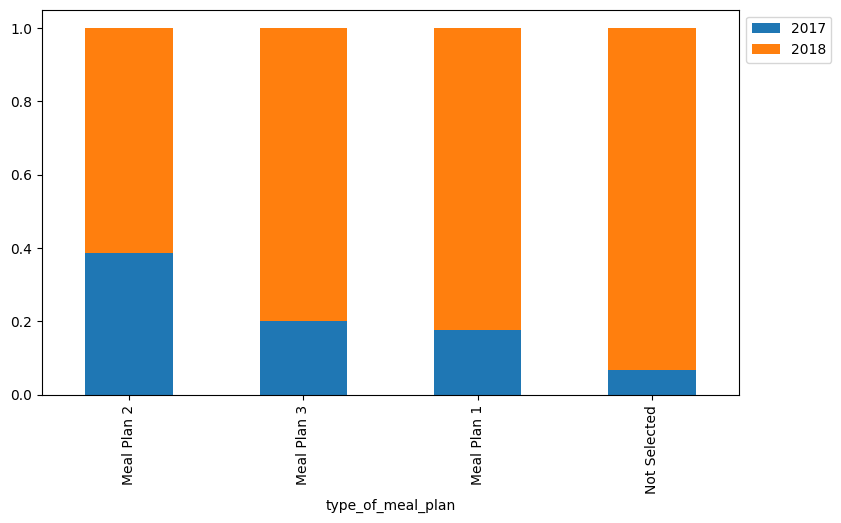

In [ ]:
stacked_barplot(data, "type_of_meal_plan", "arrival_year")

* The majority of bookings was made in 2018
* In 2017 the most bookings was for Meal Plan 1

#### `type_of_meal_plan` vs `arrival_month`

arrival_month         1     2     3     4     5     6     7     8     9    10  \
type_of_meal_plan                                                               
All                1014  1704  2358  2736  2598  3203  2920  3813  4611  5317   
Meal Plan 1         818  1405  1815  2143  2126  2524  2045  2699  3346  4170   
Not Selected        138   266   398   399   356   378   432   554   556   590   
Meal Plan 2          57    33   144   193   116   300   443   560   708   557   
Meal Plan 3           1     0     1     1     0     1     0     0     1     0   

arrival_month        11    12    All  
type_of_meal_plan                     
All                2980  3021  36275  
Meal Plan 1        2405  2339  27835  
Not Selected        521   542   5130  
Meal Plan 2          54   140   3305  
Meal Plan 3           0     0      5  
------------------------------------------------------------------------------------------------------------------------


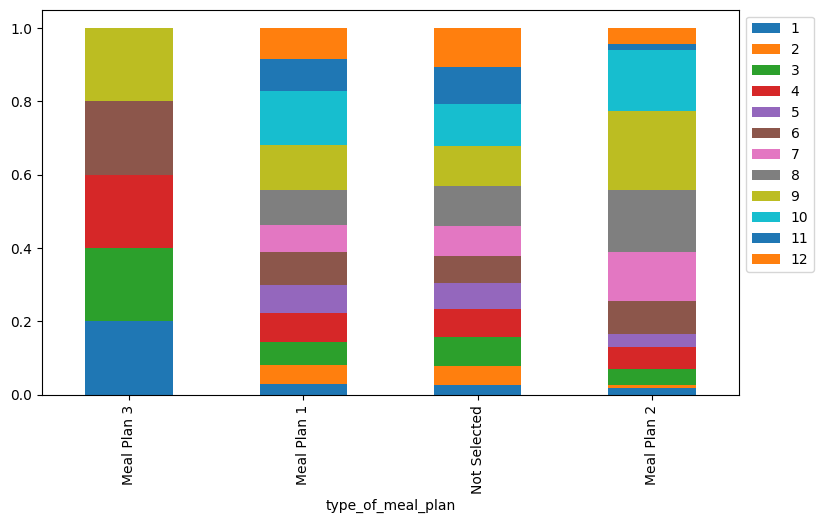

In [ ]:
stacked_barplot(data, "type_of_meal_plan", "arrival_month")

*  Meal Plan 3 is most popular in Months 1,3,4,6,and 9
*  Meal Plan 1 is most popular in month 10
*  Meal Plan Not Selected is more popular in months 8,9,10,12
*  Meal Plan 2 is most popular in month 9
  

#### `type_of_meal_plan` vs `arrival_date`

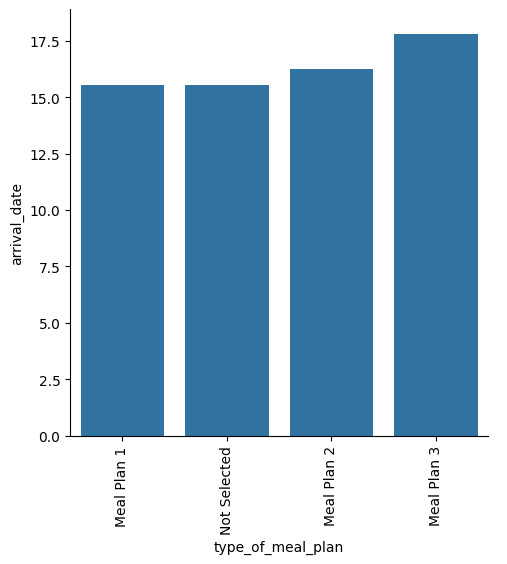

In [ ]:
sns.catplot(data=df,x = 'type_of_meal_plan' , y = 'arrival_date', kind = "bar", ci = False);
plt.xticks(rotation=90);
plt.show()

* Meal Plan 3 is more popular for arrival dates around the 17th of the month

#### `type_of_meal_plan` vs `market_segment_type`

type_of_meal_plan    Meal Plan 1  Meal Plan 2  Meal Plan 3  Not Selected  \
market_segment_type                                                        
All                        27835         3305            5          5130   
Complementary                370           11            4             6   
Offline                     7988         2365            1           174   
Aviation                     125            0            0             0   
Corporate                   1996            6            0            15   
Online                     17356          923            0          4935   

type_of_meal_plan      All  
market_segment_type         
All                  36275  
Complementary          391  
Offline              10528  
Aviation               125  
Corporate             2017  
Online               23214  
------------------------------------------------------------------------------------------------------------------------


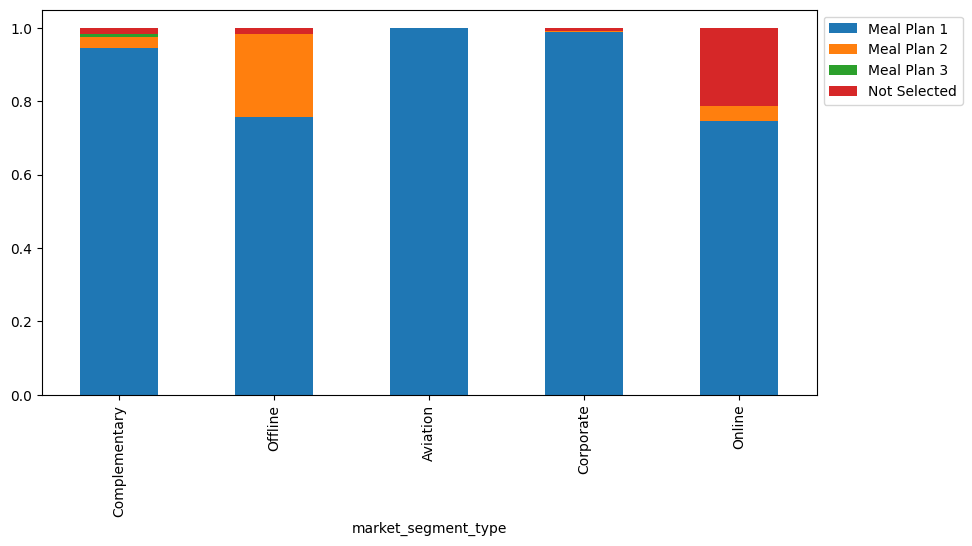

In [ ]:
stacked_barplot(data, "market_segment_type", "type_of_meal_plan")

*  Majority of bookings are made online
*  For bookings made online, meal plan Not Selected was approx one quarter of the bookings
*  For bookings made offline, meal plan 2 was approx one quarter of the bookings

#### `type_of_meal_plan` vs `repeated_guest`

repeated_guest         0    1    All
type_of_meal_plan                   
All                35345  930  36275
Meal Plan 1        26945  890  27835
Not Selected        5100   30   5130
Meal Plan 2         3296    9   3305
Meal Plan 3            4    1      5
------------------------------------------------------------------------------------------------------------------------


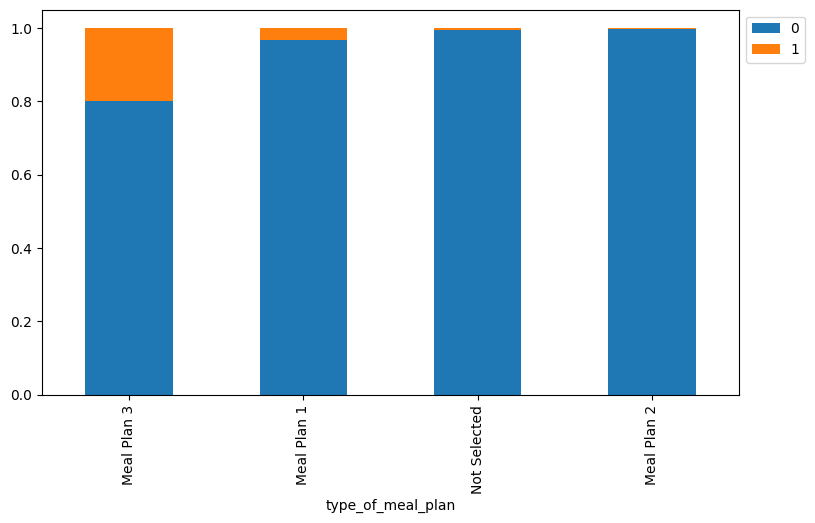

In [ ]:
stacked_barplot(data, "type_of_meal_plan", "repeated_guest")

* The majority of repeated guests chose Meal Plan 1

#### `type_of_meal_plan` vs `no_of_previous_cancellations`

no_of_previous_cancellations      0    1   2   3   4   5  6  11  13    All
type_of_meal_plan                                                         
Meal Plan 1                   27511  192  46  43  10  11  1  17   4  27835
All                           35937  198  46  43  10  11  1  25   4  36275
Meal Plan 2                    3301    4   0   0   0   0  0   0   0   3305
Meal Plan 3                       5    0   0   0   0   0  0   0   0      5
Not Selected                   5120    2   0   0   0   0  0   8   0   5130
------------------------------------------------------------------------------------------------------------------------


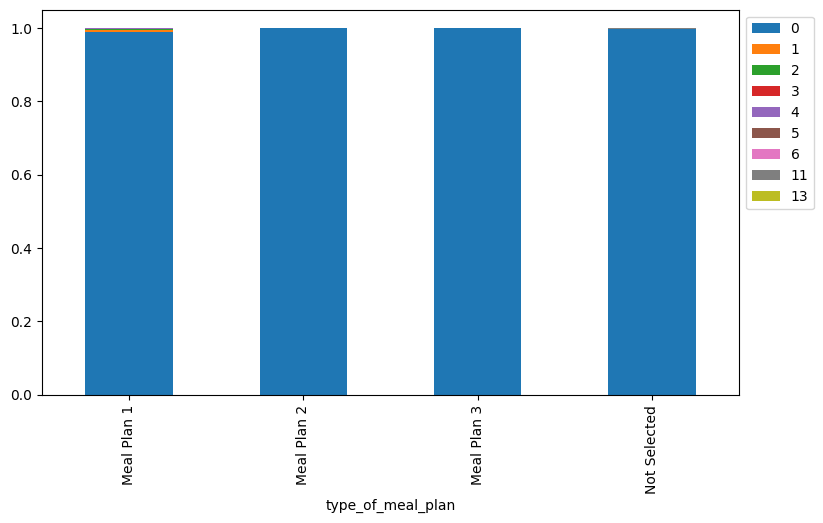

In [ ]:
stacked_barplot(data, "type_of_meal_plan", "no_of_previous_cancellations")

* Meal Plan 1 was most frequent option for bookings which had previous cancellations

#### `no_of_previous_bookings_not_canceled` vs `type_of_meal_plan`

no_of_previous_bookings_not_canceled      0    1    2   3   4   5   6   7   8  \
type_of_meal_plan                                                               
Meal Plan 1                           27055  212  107  79  63  56  35  24  23   
All                                   35463  228  112  80  65  60  36  24  23   
Meal Plan 2                            3299    3    1   1   0   1   0   0   0   
Meal Plan 3                               4    0    1   0   0   0   0   0   0   
Not Selected                           5105   13    3   0   2   3   1   0   0   

no_of_previous_bookings_not_canceled   9  10  11  12  13  14  15  16  17  18  \
type_of_meal_plan                                                              
Meal Plan 1                           19  18  15  12   7   9   8   7   6   6   
All                                   19  19  15  12   7   9   8   7   6   6   
Meal Plan 2                            0   0   0   0   0   0   0   0   0   0   
Meal Plan 3                     

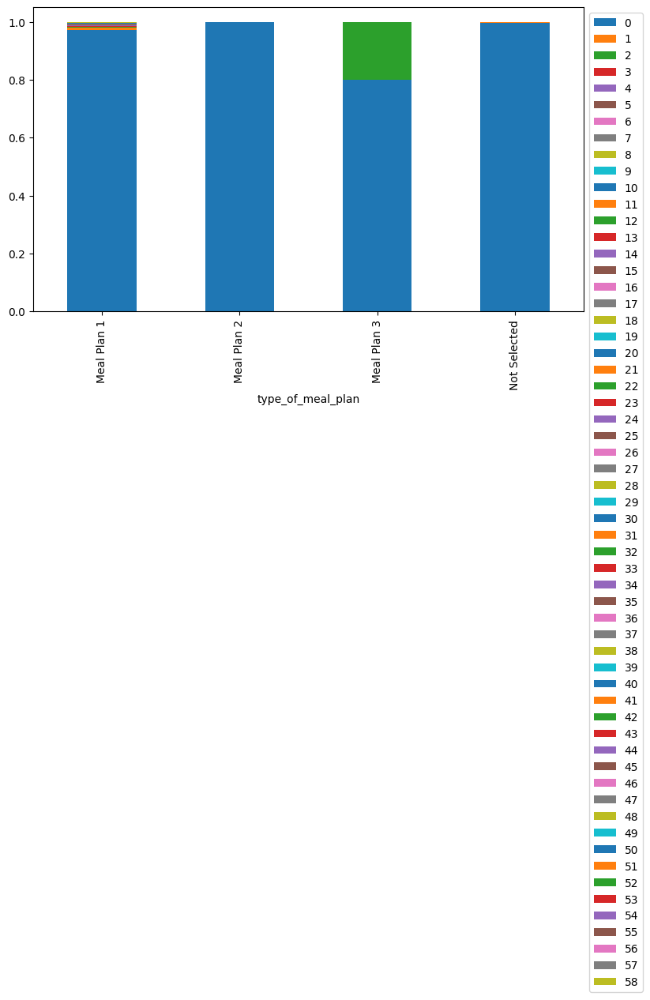

In [ ]:
stacked_barplot(data, "type_of_meal_plan", "no_of_previous_bookings_not_canceled")

* For bookings made where there were previous bookings, Meal PLan 1 was the most popular

#### `type_of_meal_plan` vs `avg_price_per_room`

<Figure size 1200x900 with 0 Axes>

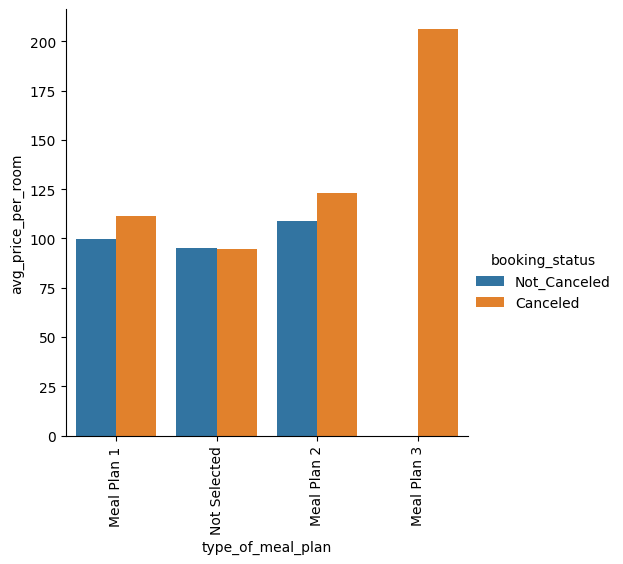

In [ ]:
plt.figure(figsize=(12,9))
sns.catplot(data=df,x = 'type_of_meal_plan' , y = 'avg_price_per_room', kind = "bar" , hue="booking_status" ,ci = False);
plt.xticks( rotation=90);
plt.show()

* The avg price per room for the bookings which were cancelled was higher than the bookings which was not cancelled, except for meal plan Not Selected where the average room prices was approx the same
* Bookings for meal Pan 3 had the highest averahe room price

#### `type_of_meal_plan` vs `no_of_special_requests`

<Figure size 1200x900 with 0 Axes>

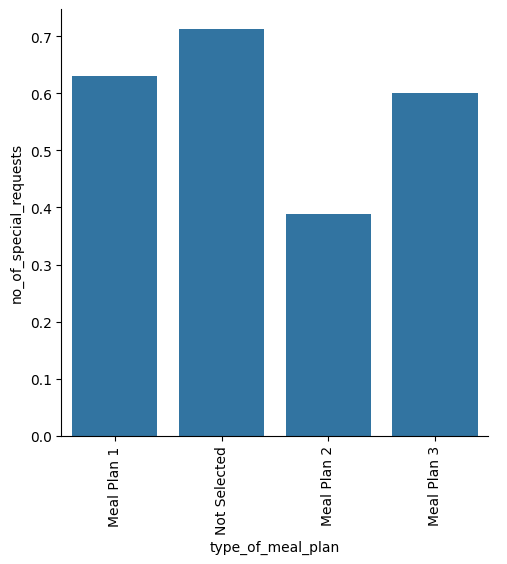

In [ ]:
plt.figure(figsize=(12,9))
sns.catplot(data=df,x = 'type_of_meal_plan' , y = 'no_of_special_requests', kind = "bar" ,ci = False);
plt.xticks( rotation=90);
plt.show()

<Figure size 1200x900 with 0 Axes>

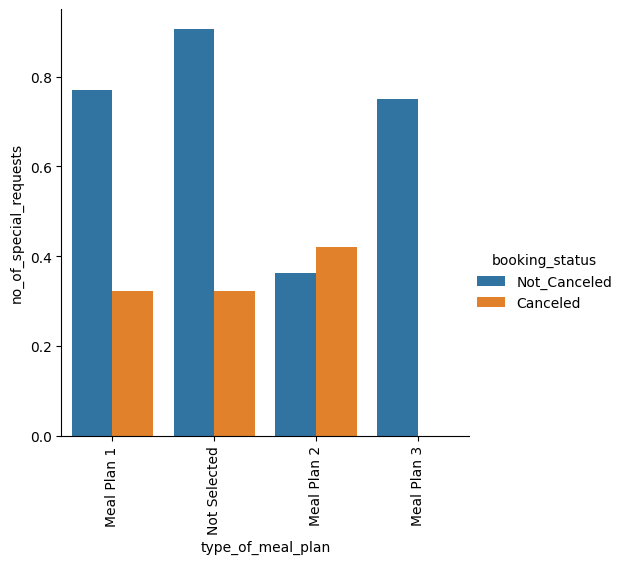

In [ ]:
plt.figure(figsize=(12,9))
sns.catplot(data=df,x = 'type_of_meal_plan' , y = 'no_of_special_requests', kind = "bar", hue="booking_status" ,ci = False);
plt.xticks( rotation=90);
plt.show()

* Bookings with Meal Plan Not Selected had the highest number of special requests
* Bookings with Mean Plan 1 and 3 had approx. the same amount of special requests
* Bookings which were cancelled tend to have a less special requests than bookings which were not cancelled

#### `required_car_parking_space` vs `room_type_reserved`

room_type_reserved          Room_Type 1  Room_Type 2  Room_Type 3  \
required_car_parking_space                                          
0                                 27351          658            7   
All                               28130          692            7   
1                                   779           34            0   

room_type_reserved          Room_Type 4  Room_Type 5  Room_Type 6  \
required_car_parking_space                                          
0                                  5829          259          900   
All                                6057          265          966   
1                                   228            6           66   

room_type_reserved          Room_Type 7    All  
required_car_parking_space                      
0                                   147  35151  
All                                 158  36275  
1                                    11   1124  
---------------------------------------------------------------

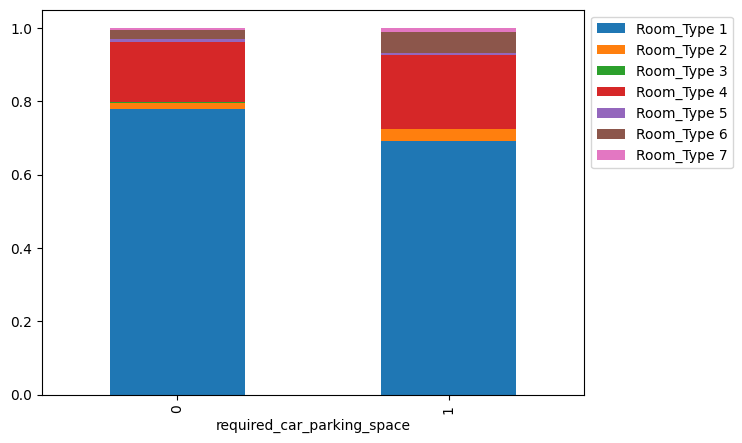

In [ ]:
stacked_barplot(data, "required_car_parking_space", "room_type_reserved")

* Room type 1 was most popular for ookings which required a car parking space

#### `required_car_parking_space` vs `lead_time`

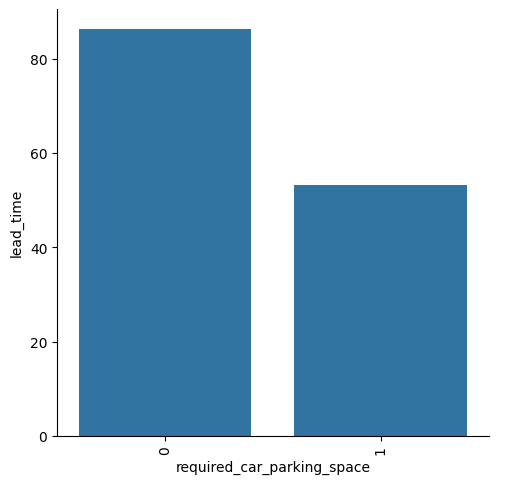

In [ ]:
sns.catplot(data=df,x = 'required_car_parking_space' , y = 'lead_time', kind = "bar", ci = False);
plt.xticks(rotation=90);
plt.show()

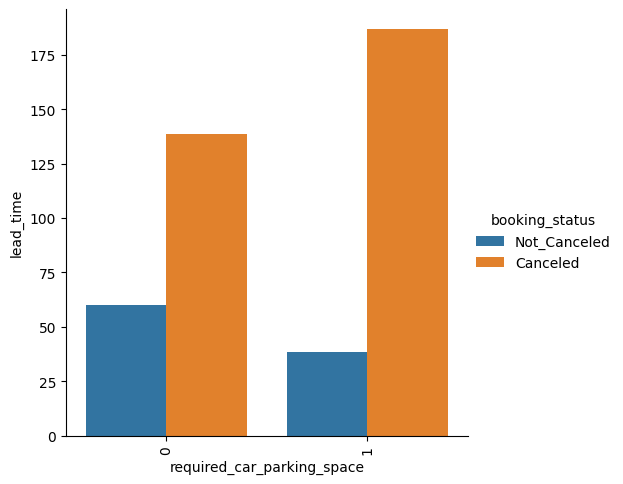

In [ ]:
sns.catplot(data=df,x = 'required_car_parking_space' , y = 'lead_time', kind = "bar", hue = "booking_status", ci = False);
plt.xticks(rotation=90);
plt.show()

* Bookings which did not require a car parking space had a larger lead time.
* In general cancelled bookings have a higher lead time

#### `required_car_parking_space` vs `arrival_year`

arrival_year                2017   2018    All
required_car_parking_space                    
All                         6514  29761  36275
0                           6350  28801  35151
1                            164    960   1124
------------------------------------------------------------------------------------------------------------------------


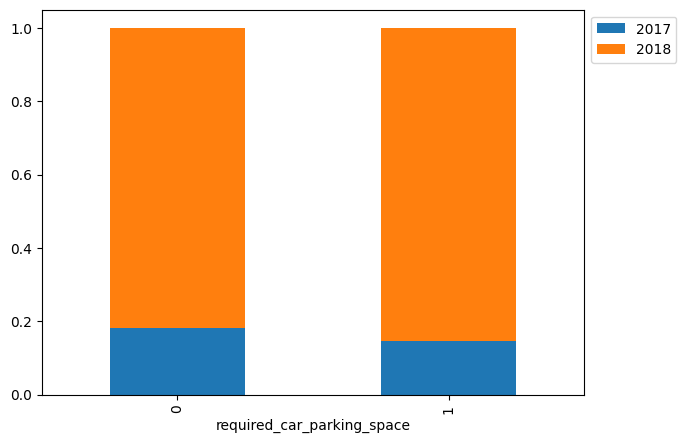

In [ ]:
stacked_barplot(data, "required_car_parking_space", "arrival_year")

* The majority of bookings was made in 2018
* Most of the bookings requiring car parking space was in 2018

#### `required_car_parking_space` vs `arrival_month`

arrival_month                  1     2     3     4     5     6     7     8  \
required_car_parking_space                                                   
All                         1014  1704  2358  2736  2598  3203  2920  3813   
0                            960  1651  2263  2671  2533  3130  2802  3591   
1                             54    53    95    65    65    73   118   222   

arrival_month                  9    10    11    12    All  
required_car_parking_space                                 
All                         4611  5317  2980  3021  36275  
0                           4510  5223  2898  2919  35151  
1                            101    94    82   102   1124  
------------------------------------------------------------------------------------------------------------------------


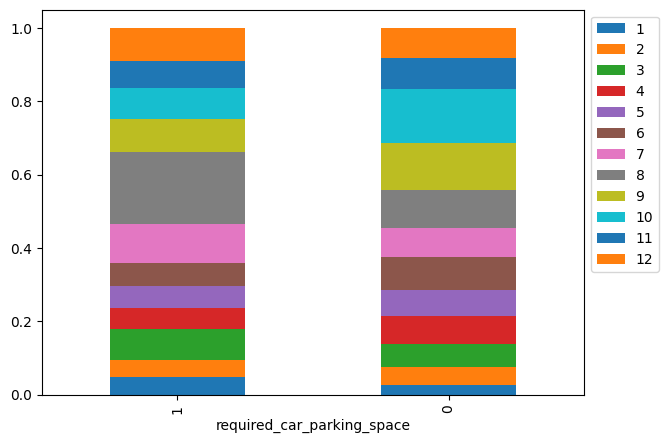

In [ ]:
stacked_barplot(data, "required_car_parking_space", "arrival_month")

*  Bookings requiring car parking space was more frequent in month 8

#### `required_car_parking_space` vs `arrival_date`

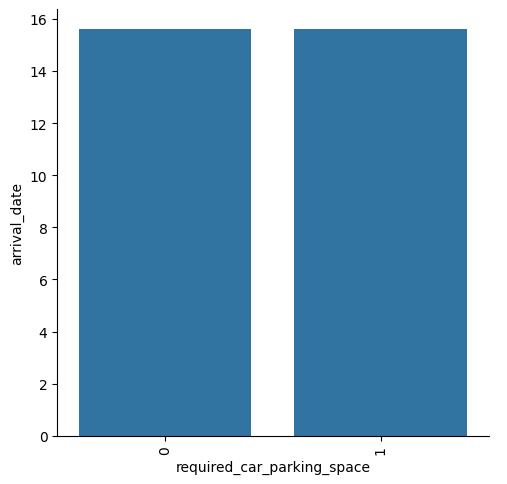

In [ ]:
sns.catplot(data=df,x = 'required_car_parking_space' , y = 'arrival_date', kind = "bar", ci = False);
plt.xticks(rotation=90);
plt.show()

* Arrival Date does not seem to be affected by car parking space requirements

#### `required_car_parking_space` vs `market_segment_type`

required_car_parking_space      0     1    All
market_segment_type                           
All                         35151  1124  36275
Online                      22345   869  23214
Corporate                    1833   184   2017
Offline                     10494    34  10528
Complementary                 360    31    391
Aviation                      119     6    125
------------------------------------------------------------------------------------------------------------------------


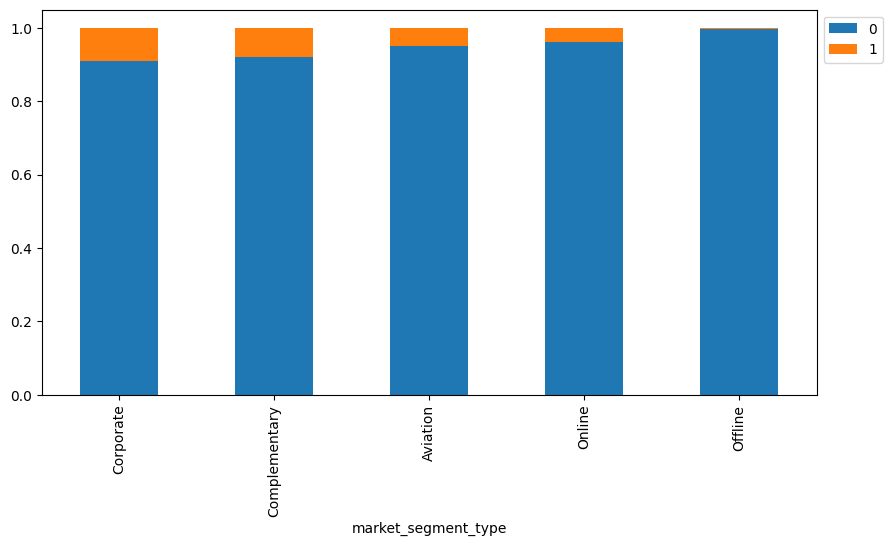

In [ ]:
stacked_barplot(data, "market_segment_type", "required_car_parking_space")

*  Majority of bookings are made online
*  A small percentage of bookings made in all market segments require car parking spaces

#### `required_car_parking_space` vs `repeated_guest`

repeated_guest                  0    1    All
required_car_parking_space                   
All                         35345  930  36275
0                           34360  791  35151
1                             985  139   1124
------------------------------------------------------------------------------------------------------------------------


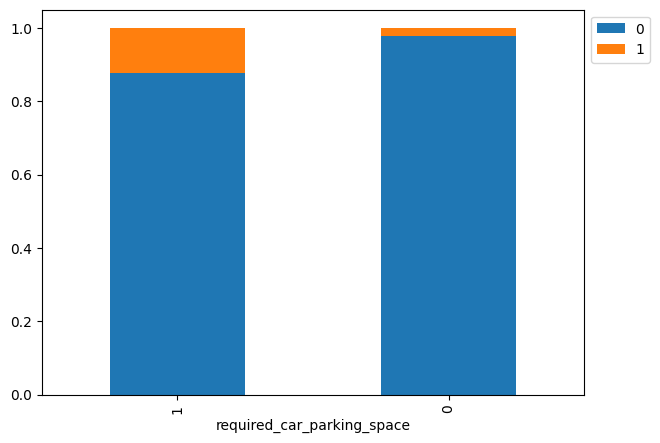

In [ ]:
stacked_barplot(data, "required_car_parking_space", "repeated_guest")

* The majority of repeated guests did not require a car parking space

#### `required_car_parking_space` vs `no_of_previous_cancellations`

no_of_previous_cancellations      0    1   2   3   4   5  6  11  13    All
required_car_parking_space                                                
0                             34843  185  42  36   9   9  1  22   4  35151
All                           35937  198  46  43  10  11  1  25   4  36275
1                              1094   13   4   7   1   2  0   3   0   1124
------------------------------------------------------------------------------------------------------------------------


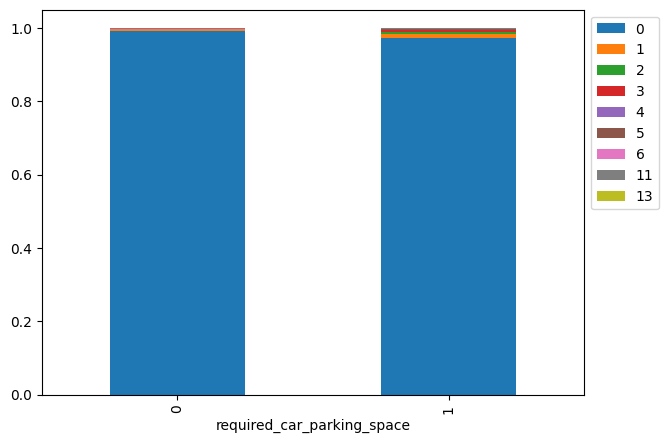

In [ ]:
stacked_barplot(data, "required_car_parking_space", "no_of_previous_cancellations")

* The majority of bookings which had previous cancellations did not require a car parking space

#### `no_of_previous_bookings_not_canceled` vs `required_car_parking_space`

no_of_previous_bookings_not_canceled      0    1    2   3   4   5   6   7   8  \
required_car_parking_space                                                      
1                                       989   29   24  18  11  13   5   4   5   
All                                   35463  228  112  80  65  60  36  24  23   
0                                     34474  199   88  62  54  47  31  20  18   

no_of_previous_bookings_not_canceled   9  10  11  12  13  14  15  16  17  18  \
required_car_parking_space                                                     
1                                      3   5   3   1   1   0   1   0   0   2   
All                                   19  19  15  12   7   9   8   7   6   6   
0                                     16  14  12  11   6   9   7   7   6   4   

no_of_previous_bookings_not_canceled  19  20  21  22  23  24  25  26  27  28  \
required_car_parking_space                                                     
1                                

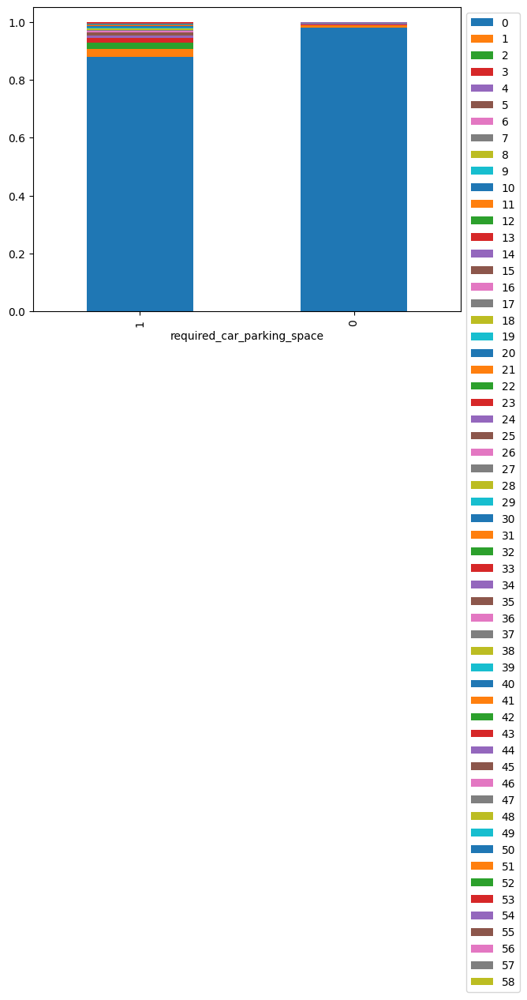

In [ ]:
stacked_barplot(data, "required_car_parking_space", "no_of_previous_bookings_not_canceled")

* In general car parking space was not preferred for bookings made where there were previous bookings.

#### `required_car_parking_space` vs `avg_price_per_room`

<Figure size 1200x900 with 0 Axes>

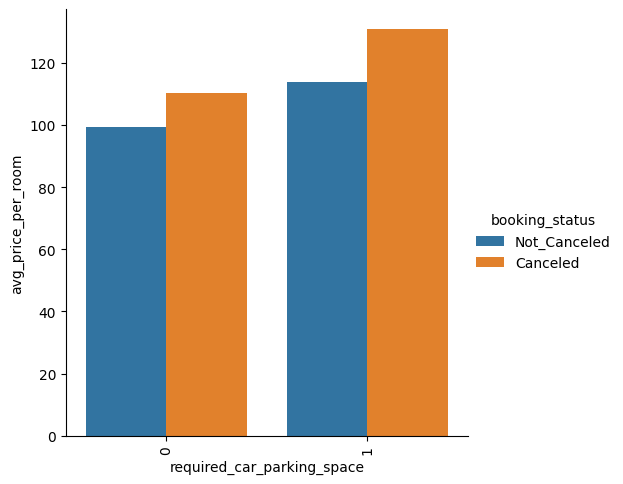

In [ ]:
plt.figure(figsize=(12,9))
sns.catplot(data=df,x = 'required_car_parking_space' , y = 'avg_price_per_room', kind = "bar" , hue="booking_status" ,ci = False);
plt.xticks( rotation=90);
plt.show()

* The avg price per room for the bookings which were cancelled was higher than the bookings which was not cancelled.
* Bookings which required a car parking space tend to have a larger `avg_room_price`

#### `required_car_parking_space` vs `no_of_special_requests`

<Figure size 1200x900 with 0 Axes>

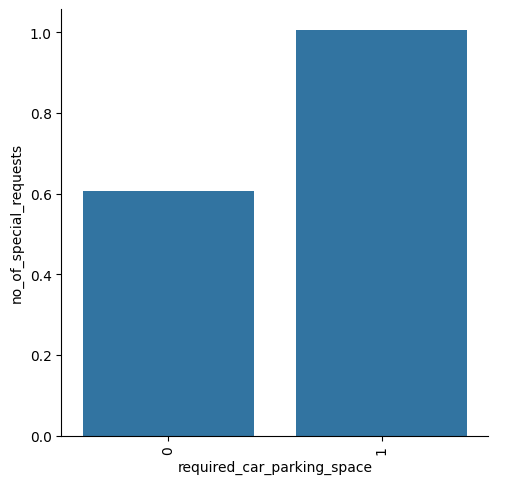

In [ ]:
plt.figure(figsize=(12,9))
sns.catplot(data=df,x = 'required_car_parking_space' , y = 'no_of_special_requests', kind = "bar" ,ci = False);
plt.xticks( rotation=90);
plt.show()

<Figure size 1200x900 with 0 Axes>

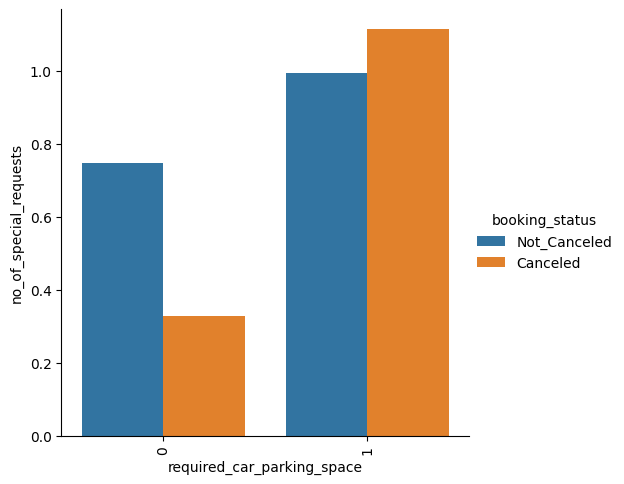

In [ ]:
plt.figure(figsize=(12,9))
sns.catplot(data=df,x = 'required_car_parking_space' , y = 'no_of_special_requests', kind = "bar", hue="booking_status" ,ci = False);
plt.xticks( rotation=90);
plt.show()

* Bookings which required car parking space had more number of special requests
* Bookings which required a car park and was cancelled had a higher `avg_price_per_room` compared to bookings which required a car park and did not cancel
* The opposite can be seen with bookings which required a car park, the cancelled bookings had a lower `avg_price_per_room` compared to those which were not cancelled

#### `room_type_reserved` vs `lead_time`

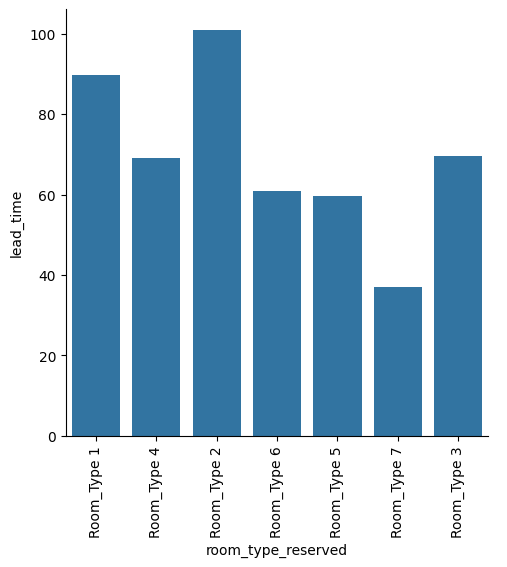

In [ ]:
sns.catplot(data=df,x = 'room_type_reserved' , y = 'lead_time', kind = "bar", ci = False);
plt.xticks(rotation=90);
plt.show()

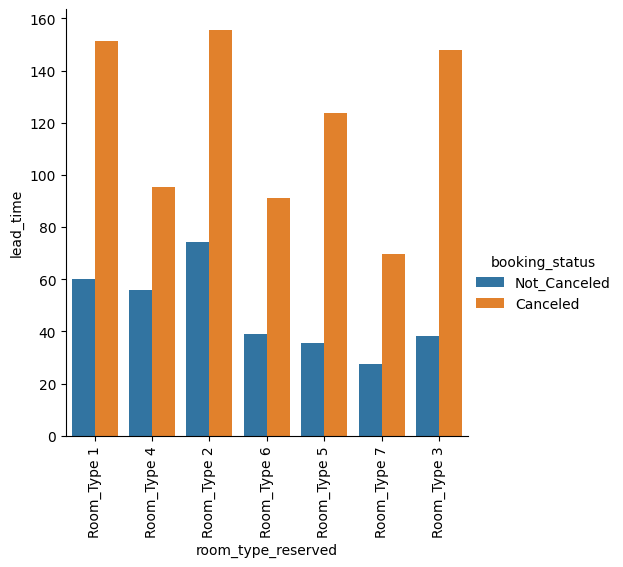

In [ ]:
sns.catplot(data=df,x = 'room_type_reserved' , y = 'lead_time', kind = "bar", hue = "booking_status", ci = False);
plt.xticks(rotation=90);
plt.show()

* Room Type 2 has the highest lead time
* In general cancelled bookings have a higher lead time
* Room Types 1,2 and 3 has the most cancellations

#### `room_type_reserved` vs `arrival_year`

arrival_year        2017   2018    All
room_type_reserved                    
All                 6514  29761  36275
Room_Type 1         5655  22475  28130
Room_Type 4          544   5513   6057
Room_Type 2          147    545    692
Room_Type 6          132    834    966
Room_Type 5           20    245    265
Room_Type 7           13    145    158
Room_Type 3            3      4      7
------------------------------------------------------------------------------------------------------------------------


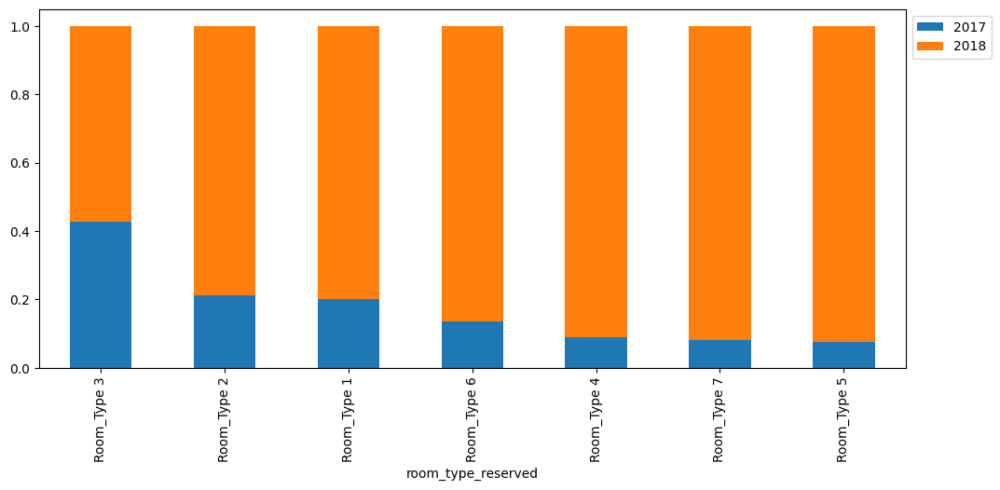

In [ ]:
stacked_barplot(data, "room_type_reserved", "arrival_year")

* The majority of bookings was made in 2018
* In 2017 Room Type 1 was most popular

#### `room_type_reserved` vs `arrival_month`

arrival_month          1     2     3     4     5     6     7     8     9  \
room_type_reserved                                                         
All                 1014  1704  2358  2736  2598  3203  2920  3813  4611   
Room_Type 1          864  1384  1807  1998  1883  2596  2127  2830  3630   
Room_Type 4           82   211   420   578   572   494   585   658   736   
Room_Type 2           50    51    64    44    24    36    72   100    52   
Room_Type 6           12    33    48    93    82    52    88   172   124   
Room_Type 5            3    20    12    15    22    15    27    27    51   
Room_Type 7            3     5     7     8    15     9    21    26    18   
Room_Type 3            0     0     0     0     0     1     0     0     0   

arrival_month         10    11    12    All  
room_type_reserved                           
All                 5317  2980  3021  36275  
Room_Type 1         4210  2492  2309  28130  
Room_Type 4          855   393   473   6057  
Room_Type

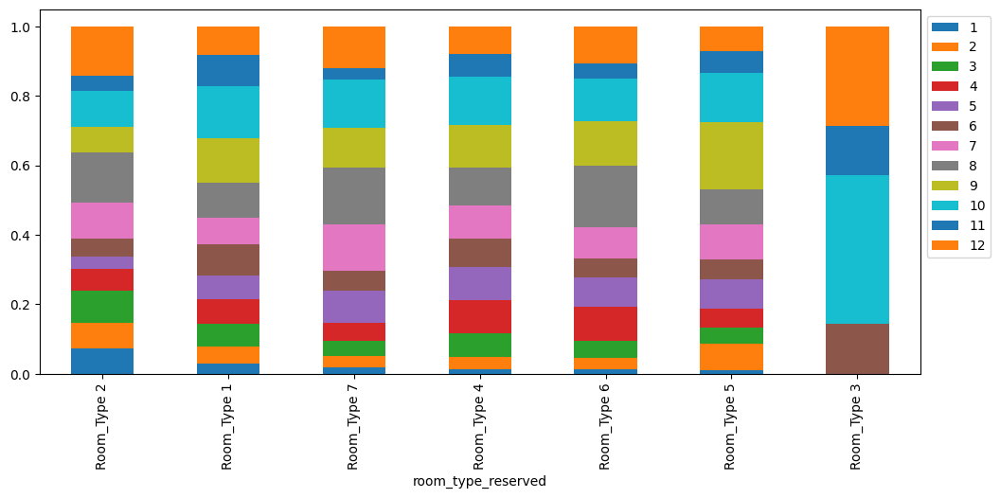

In [ ]:
stacked_barplot(data, "room_type_reserved", "arrival_month")

*  Room Type 2, 5,3, and 7 was more popular in month 10
*  Room Type 1, 4 and 6 was more popular in months 9 and 10

#### `room_type_reserved` vs `arrival_date`

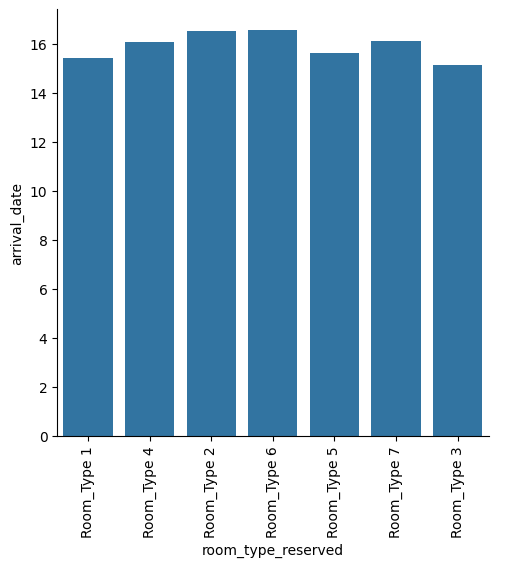

In [ ]:
sns.catplot(data=df,x = 'room_type_reserved' , y = 'arrival_date', kind = "bar", ci = False);
plt.xticks(rotation=90);
plt.show()

* Arrival Date does not seem to be affected by room type

#### `room_type_reserved` vs `market_segment_type`

room_type_reserved   Room_Type 1  Room_Type 2  Room_Type 3  Room_Type 4  \
market_segment_type                                                       
All                        28130          692            7         6057   
Complementary                247           20            2           52   
Offline                     9747           57            2          613   
Online                     16243          613            2         5228   
Corporate                   1833            2            1           99   
Aviation                      60            0            0           65   

room_type_reserved   Room_Type 5  Room_Type 6  Room_Type 7    All  
market_segment_type                                                
All                          265          966          158  36275  
Complementary                 17           14           39    391  
Offline                       81           23            5  10528  
Online                        93          926          109 

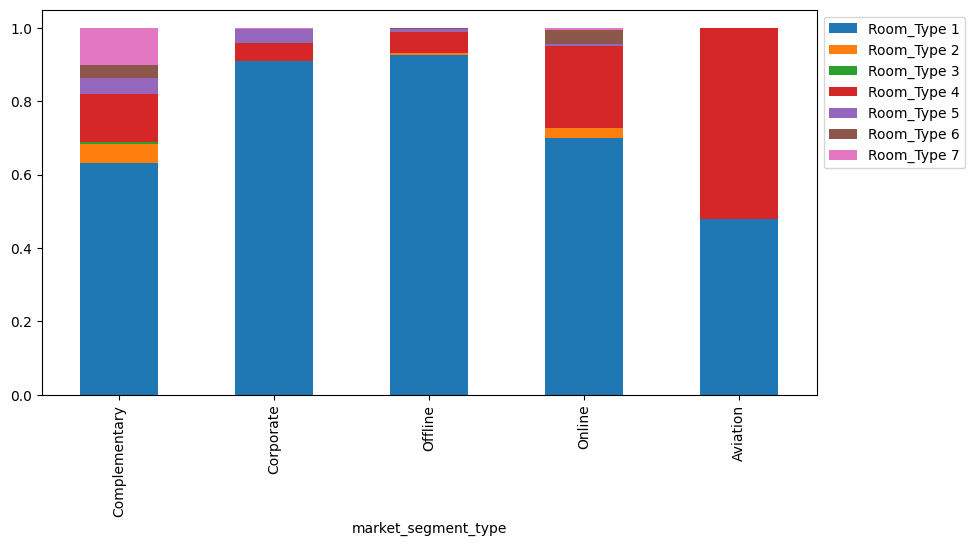

In [ ]:
stacked_barplot(data, "market_segment_type", "room_type_reserved")

*  Majority of bookings are made online
*  Majority of bookings prefer room type 1
*  Aviation Bookings are alomst equally distributed between Room Types 4 and 1
*  Approx, one quarter of online bookings prefer room type 4

#### `room_type_reserved` vs `repeated_guest`

repeated_guest          0    1    All
room_type_reserved                   
All                 35345  930  36275
Room_Type 1         27322  808  28130
Room_Type 4          5990   67   6057
Room_Type 7           137   21    158
Room_Type 5           248   17    265
Room_Type 6           956   10    966
Room_Type 2           685    7    692
Room_Type 3             7    0      7
------------------------------------------------------------------------------------------------------------------------


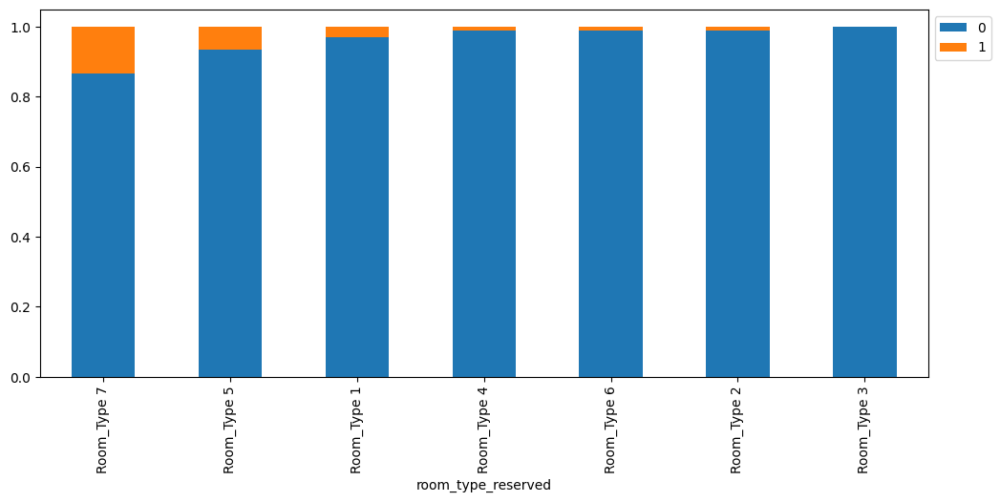

In [ ]:
stacked_barplot(data, "room_type_reserved", "repeated_guest")

* The majority of repeated guests prefer room type 1

#### `room_type_reserved` vs `no_of_previous_cancellations`

no_of_previous_cancellations      0    1   2   3   4   5  6  11  13    All
room_type_reserved                                                        
Room_Type 1                   27821  191  40  37   5  11  1  20   4  28130
All                           35937  198  46  43  10  11  1  25   4  36275
Room_Type 2                     692    0   0   0   0   0  0   0   0    692
Room_Type 3                       7    0   0   0   0   0  0   0   0      7
Room_Type 4                    6043    5   4   0   0   0  0   5   0   6057
Room_Type 5                     262    2   0   1   0   0  0   0   0    265
Room_Type 6                     964    0   0   2   0   0  0   0   0    966
Room_Type 7                     148    0   2   3   5   0  0   0   0    158
------------------------------------------------------------------------------------------------------------------------


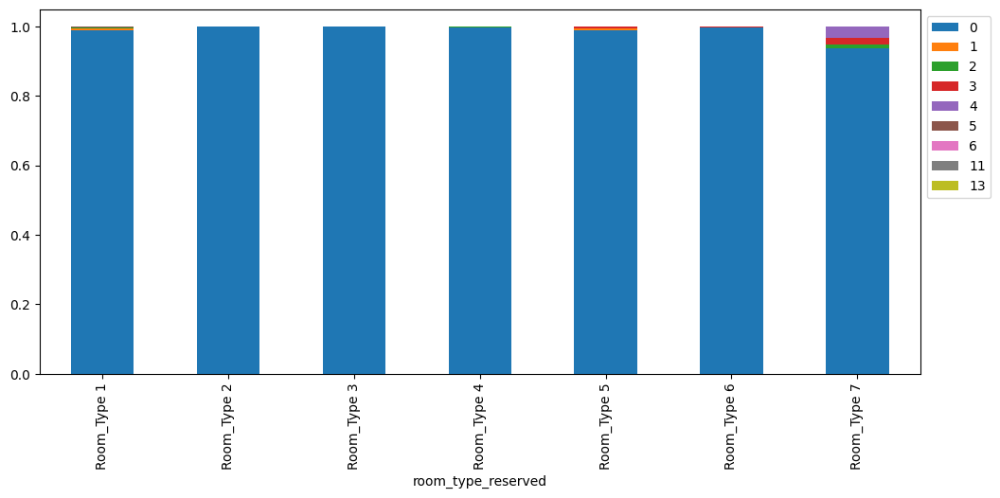

In [ ]:
stacked_barplot(data, "room_type_reserved", "no_of_previous_cancellations")

* The majority of bookings which had previous cancellations preferred room type 1

#### `no_of_previous_bookings_not_canceled` vs `room_type_reserved`

no_of_previous_bookings_not_canceled      0    1    2   3   4   5   6   7   8  \
room_type_reserved                                                              
Room_Type 1                           27436  193   96  65  61  49  34  22  21   
All                                   35463  228  112  80  65  60  36  24  23   
Room_Type 2                             685    0    1   4   0   2   0   0   0   
Room_Type 3                               7    0    0   0   0   0   0   0   0   
Room_Type 4                            5993   24    9   7   2   7   2   1   0   
Room_Type 5                             249    2    3   2   1   2   0   0   0   
Room_Type 6                             956    4    0   1   0   0   0   0   1   
Room_Type 7                             137    5    3   1   1   0   0   1   1   

no_of_previous_bookings_not_canceled   9  10  11  12  13  14  15  16  17  18  \
room_type_reserved                                                             
Room_Type 1                  

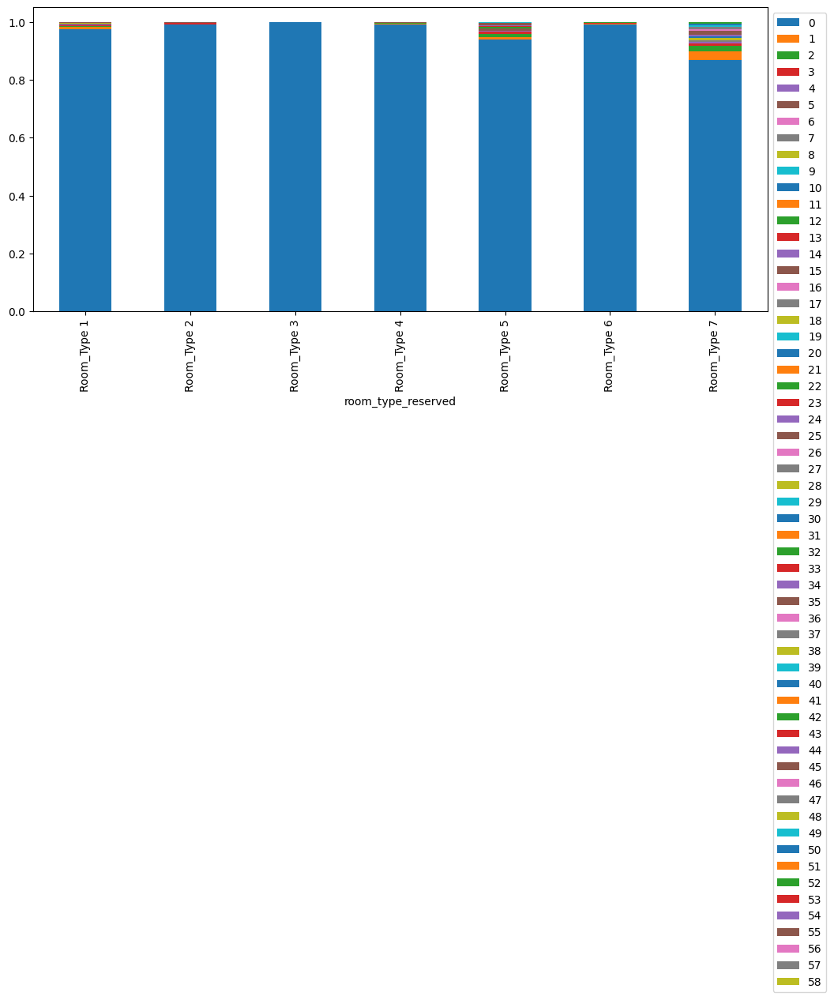

In [ ]:
stacked_barplot(data, "room_type_reserved", "no_of_previous_bookings_not_canceled")

* In general room type 1 was preferred for bookings made where there were previous bookings.

#### `room_type_reserved` vs `avg_price_per_room`

<Figure size 1200x900 with 0 Axes>

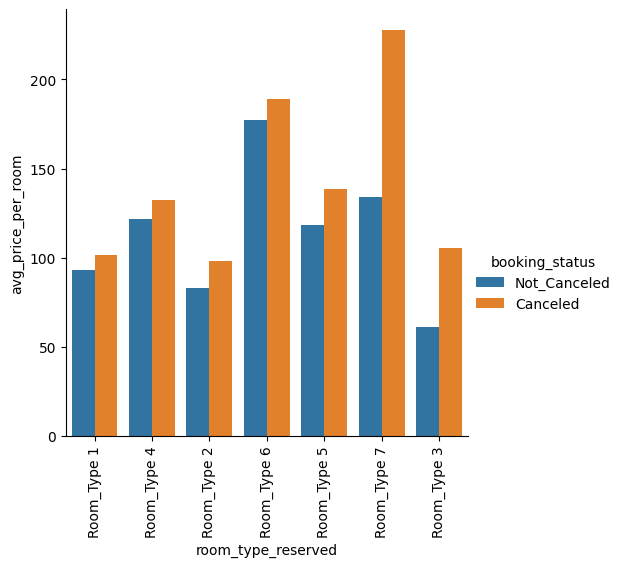

In [ ]:
plt.figure(figsize=(12,9))
sns.catplot(data=df,x = 'room_type_reserved' , y = 'avg_price_per_room', kind = "bar" , hue="booking_status" ,ci = False);
plt.xticks( rotation=90);
plt.show()

* The avg price per room for the bookings which were cancelled was higher than the bookings which was not cancelled.
* Room type 6 in general have the highest `avg_price-per_room`
* Room type 7 had the highest `avg_price-per_room` for a cancelled room

#### `room_type_reserved` vs `no_of_special_requests`

<Figure size 1200x900 with 0 Axes>

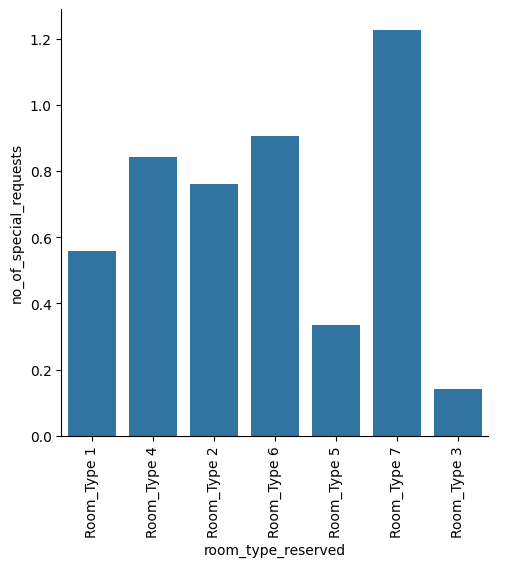

In [ ]:
plt.figure(figsize=(12,9))
sns.catplot(data=df,x = 'room_type_reserved' , y = 'no_of_special_requests', kind = "bar" ,ci = False);
plt.xticks( rotation=90);
plt.show()

<Figure size 1200x900 with 0 Axes>

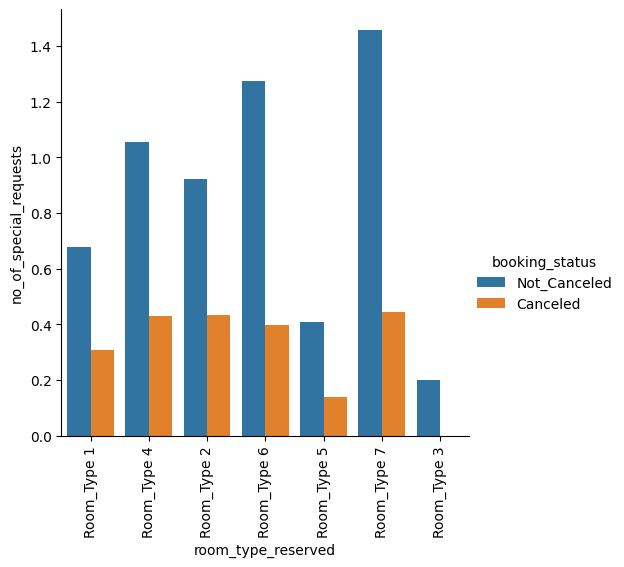

In [ ]:
plt.figure(figsize=(12,9))
sns.catplot(data=df,x = 'room_type_reserved' , y = 'no_of_special_requests', kind = "bar", hue="booking_status" ,ci = False);
plt.xticks( rotation=90);
plt.show()

* Bookings which were cancelled had fewer special requests
* Room type 7 had the most amount of special requests
* Room type 3 had the least amount of special requests

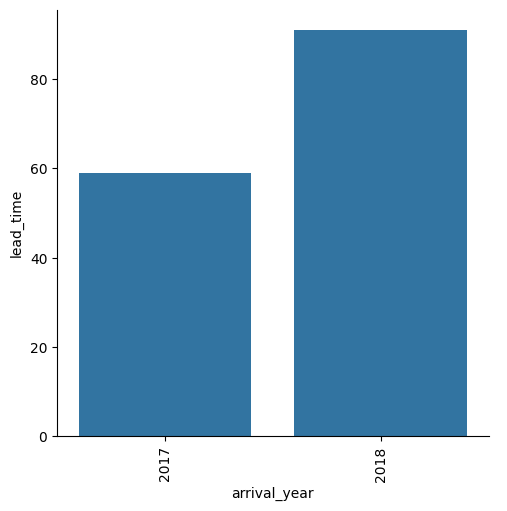

In [ ]:
sns.catplot(data=df,x = 'arrival_year' , y = 'lead_time', kind = "bar" , ci = False);
plt.xticks(rotation=90);
plt.show()

* The majority of bookings was made in 2018
* In 2017 the `lead_time` was less than in 2018

#### `lead_time` vs `arrival_month`

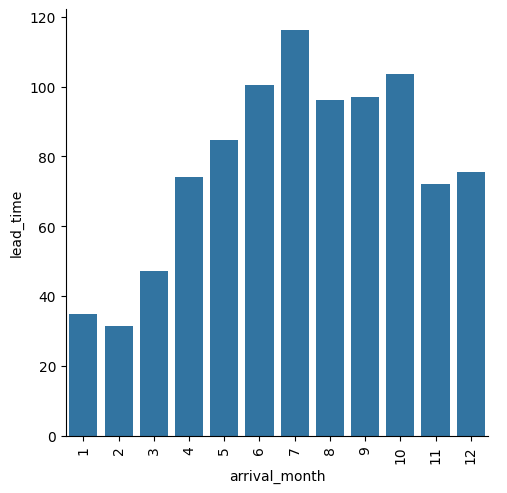

In [ ]:
sns.catplot(data=df,x = 'arrival_month' , y = 'lead_time', kind = "bar" , ci = False);
plt.xticks(rotation=90);
plt.show()

*  Month 7 had the highest lead time
*  Month 2 had the lowest lead time

#### `lead_time` vs `arrival_date`

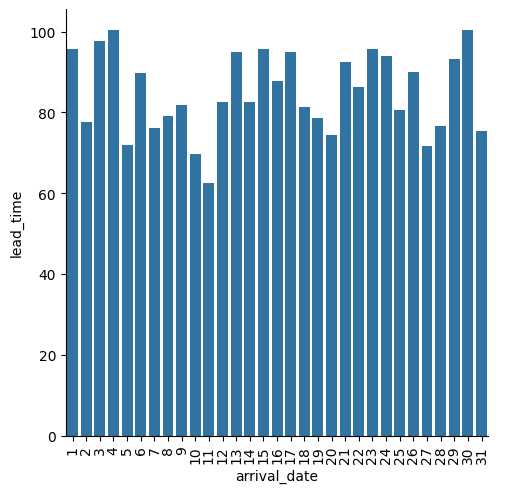

In [ ]:
sns.catplot(data=df,x = 'arrival_date' , y = 'lead_time', kind = "bar" , ci = False);
plt.xticks(rotation=90);
plt.show()

* Bookings with `arrival_date` as 11 has the lowest lead time
* Bookings with `arrival_date` as 4 or 30 has the highest lead time

#### `lead_time` vs `market_segment_type`

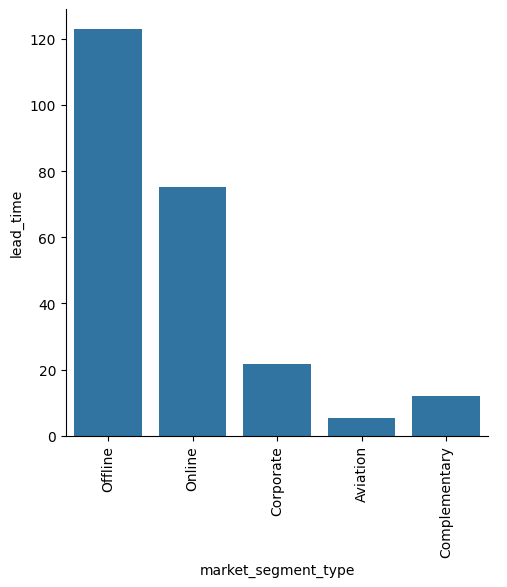

In [ ]:
sns.catplot(data=df,x = 'market_segment_type' , y = 'lead_time', kind = "bar" , ci = False);
plt.xticks(rotation=90);
plt.show()

*  Bookings with the highest lead time was made offline
*  Bookings with the lowest lead time was made by Aviation

#### `lead_time` vs `repeated_guest`

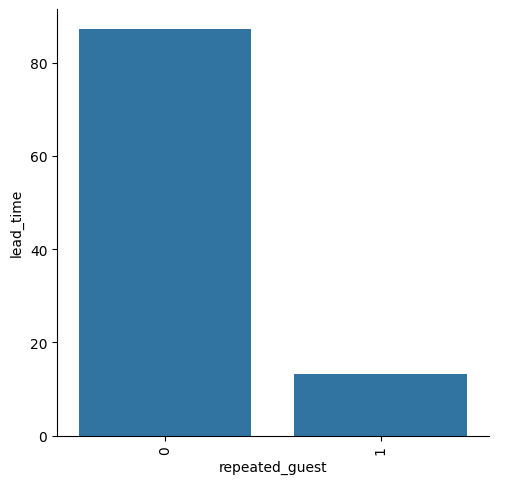

In [ ]:
sns.catplot(data=df,x = 'repeated_guest' , y = 'lead_time', kind = "bar" , ci = False);
plt.xticks(rotation=90);
plt.show()

* The highest lead times was found on bookings where the guests was not a repeated guests

#### `lead_time` vs `no_of_previous_cancellations`

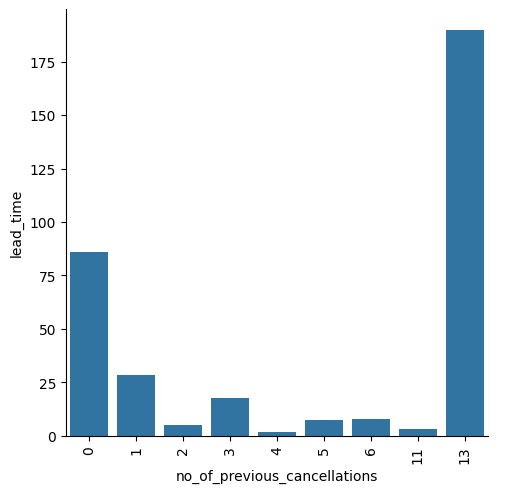

In [ ]:
sns.catplot(data=df,x = 'no_of_previous_cancellations' , y = 'lead_time', kind = "bar" , ci = False);
plt.xticks(rotation=90);
plt.show()

* In bookings with 13 previous cancellations, lead time was the greatest
* In bookings with 4 previous cancellations, lead time was the smallest

#### `lead_time` vs `room_type_reserved`

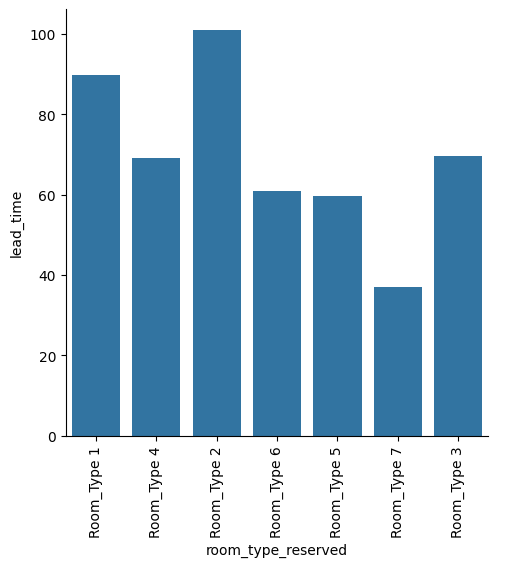

In [ ]:
sns.catplot(data=df,x = 'room_type_reserved' , y = 'lead_time', kind = "bar" , ci = False);
plt.xticks(rotation=90);
plt.show()

* Room type 2 had the largest lead time
* Room time 7 had the lowest lead time

#### `lead_time` vs `avg_price_per_room`

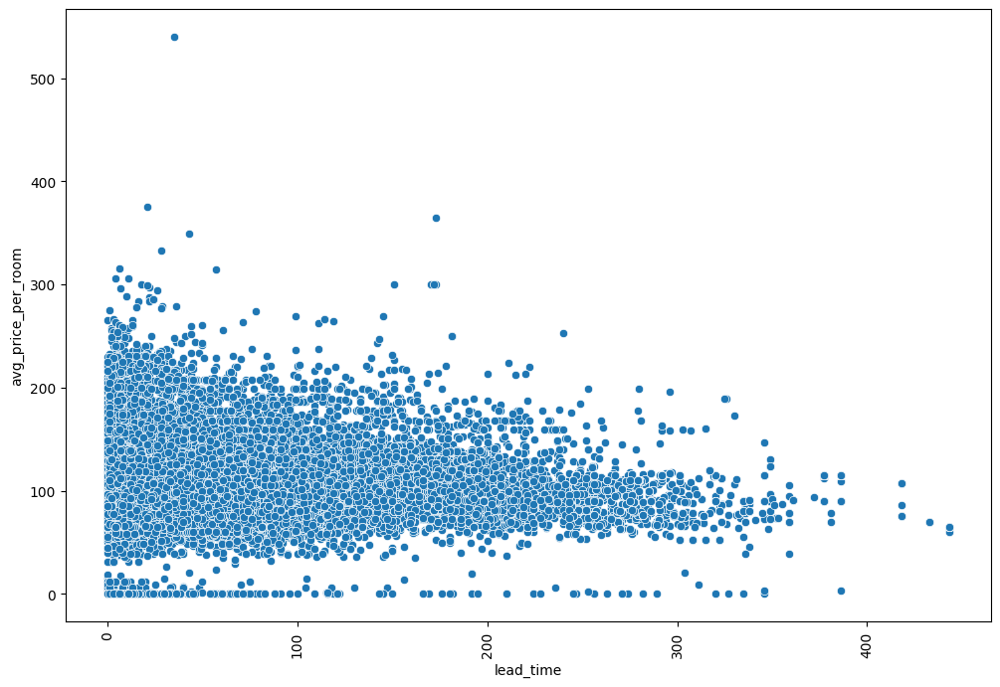

In [ ]:
plt.figure(figsize=(12, 8))
sns.scatterplot(data=df,x = 'lead_time' , y = 'avg_price_per_room');
plt.xticks(rotation=90);
plt.show()

* There does not appear to be a relationship between lead time adn average price per room

#### `lead_time` vs `no_of_special_requests`

<Figure size 1200x900 with 0 Axes>

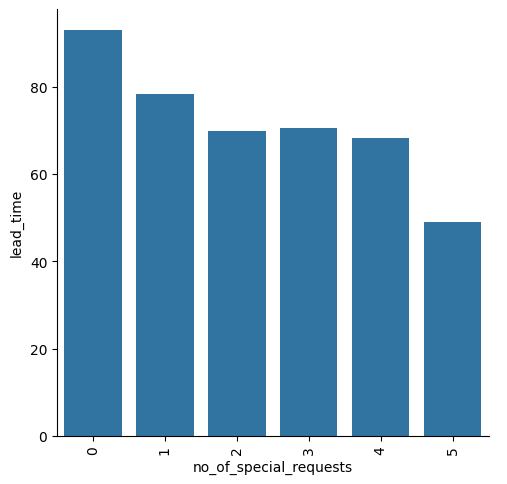

In [ ]:
plt.figure(figsize=(12,9))
sns.catplot(data=df,x = 'no_of_special_requests' , y = 'lead_time', kind = "bar" ,ci = False);
plt.xticks( rotation=90);
plt.show()

<Figure size 1200x900 with 0 Axes>

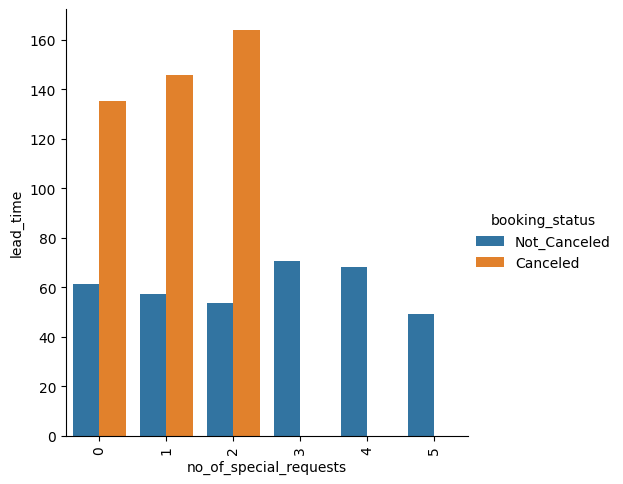

In [ ]:
plt.figure(figsize=(12,9))
sns.catplot(data=df,x = 'no_of_special_requests' , y = 'lead_time', kind = "bar", hue="booking_status" ,ci = False);
plt.xticks( rotation=90);
plt.show()

* Bookings with 0 special requests had the highest lead times
* Bookings with special requests 3,4 and 5 did not have cancelled bookings
* Cancelled bookings had a higher lead time

#### `arrival_year` vs `arrival_month`

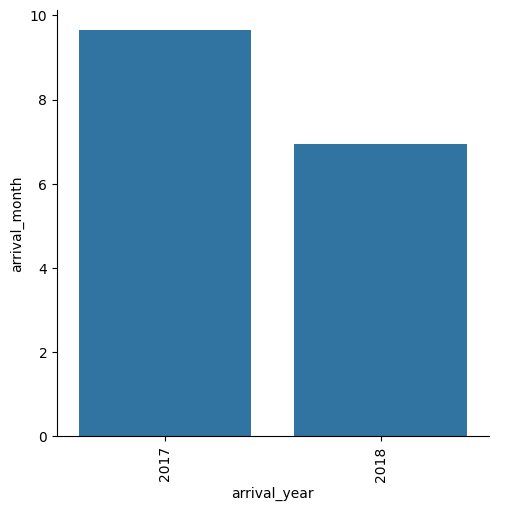

In [ ]:
sns.catplot(data=df,x = 'arrival_year' , y = 'arrival_month', kind = "bar" , ci = False);
plt.xticks(rotation=90);
plt.show()

*  In general in 2017 the arrival month was approx 10
*  In general in 2018 the arrival month was approx 6

#### `arrival_year` vs `arrival_date`

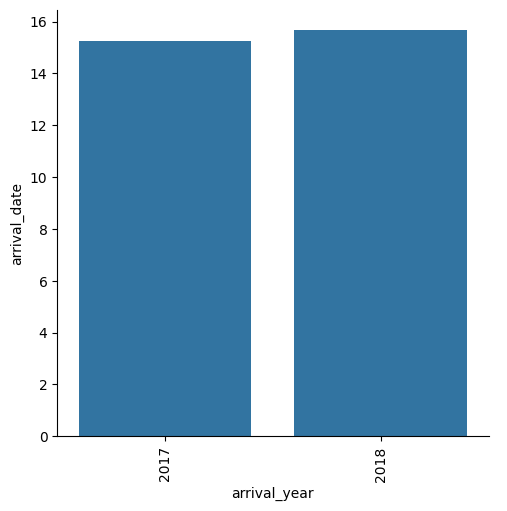

In [ ]:
sns.catplot(data=df,x = 'arrival_year' , y = 'arrival_date', kind = "bar" , ci = False);
plt.xticks(rotation=90);
plt.show()

* There is not much difference in `arrival_date` when compared to `arrival_year`

#### `arrival_year` vs `market_segment_type`

market_segment_type  Aviation  Complementary  Corporate  Offline  Online  \
arrival_year                                                               
2018                      125            252       1519     7602   20263   
All                       125            391       2017    10528   23214   
2017                        0            139        498     2926    2951   

market_segment_type    All  
arrival_year                
2018                 29761  
All                  36275  
2017                  6514  
------------------------------------------------------------------------------------------------------------------------


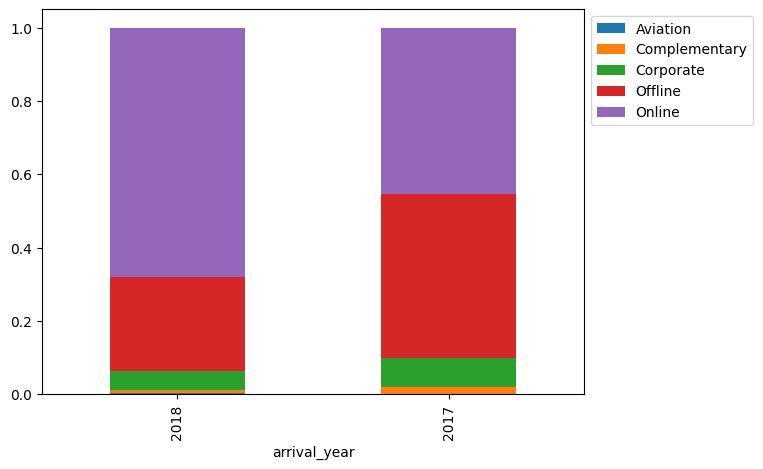

In [ ]:
stacked_barplot(data, "arrival_year", "market_segment_type")

* Online bookings was more prevalant in 2018
* Online and Offline booking was prevalant on 2017

#### `arrival_year` vs `repeated_guest`

repeated_guest      0    1    All
arrival_year                     
All             35345  930  36275
2018            29038  723  29761
2017             6307  207   6514
------------------------------------------------------------------------------------------------------------------------


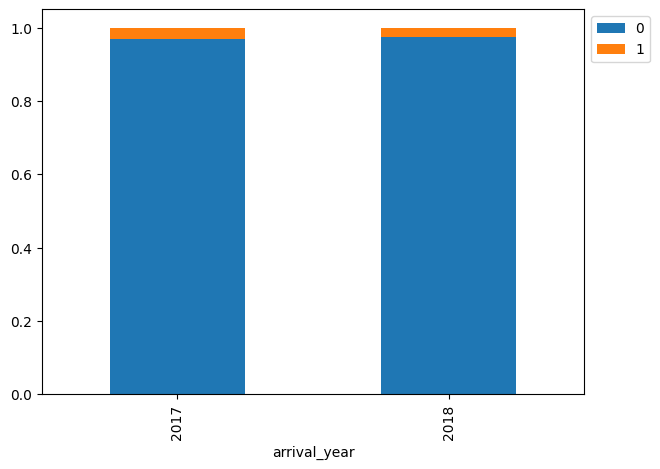

In [ ]:
stacked_barplot(data, "arrival_year", "repeated_guest")

* Percentages of repeated guests were approx the same in 2017 and 2018

#### `arrival_year` vs `no_of_previous_cancellations`

arrival_year                  2017   2018    All
no_of_previous_cancellations                    
All                           6514  29761  36275
0                             6395  29542  35937
1                              106     92    198
2                               13     33     46
3                                0     43     43
4                                0     10     10
5                                0     11     11
6                                0      1      1
11                               0     25     25
13                               0      4      4
------------------------------------------------------------------------------------------------------------------------


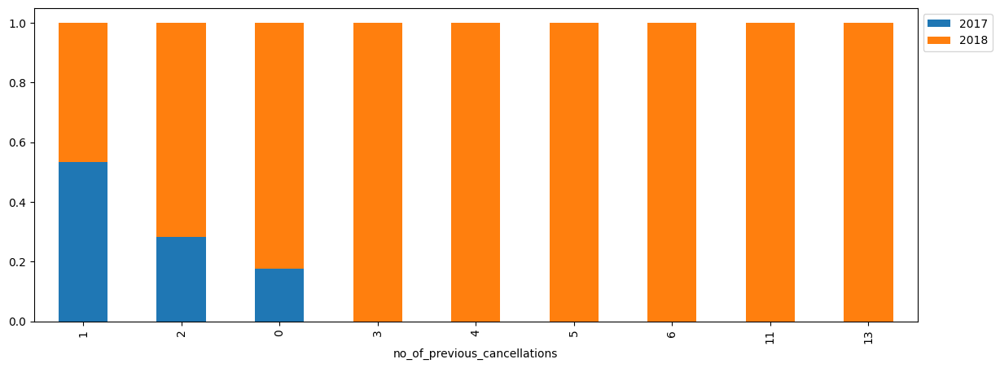

In [ ]:
stacked_barplot(data, "no_of_previous_cancellations", "arrival_year")

* Bookings which had 1 previous cancellation were approx the same amount in 2017 and 2018
* Approx one third of bookings which had 2 previous cancellations was in 2017
* Approx one fifth of bookings which had 0 previous cancellations was in 2017
* In 2017 the number of previous cancellation was eith er 0, 1 or 2

#### `arrival_year` vs `no_of_previous_bookings_not_canceled`

no_of_previous_bookings_not_canceled      0    1    2   3   4   5   6   7   8  \
arrival_year                                                                    
2018                                  29061  180   92  68  60  53  32  20  20   
All                                   35463  228  112  80  65  60  36  24  23   
2017                                   6402   48   20  12   5   7   4   4   3   

no_of_previous_bookings_not_canceled   9  10  11  12  13  14  15  16  17  18  \
arrival_year                                                                   
2018                                  17  17  13  11   6   8   8   7   6   6   
All                                   19  19  15  12   7   9   8   7   6   6   
2017                                   2   2   2   1   1   1   0   0   0   0   

no_of_previous_bookings_not_canceled  19  20  21  22  23  24  25  26  27  28  \
arrival_year                                                                   
2018                             

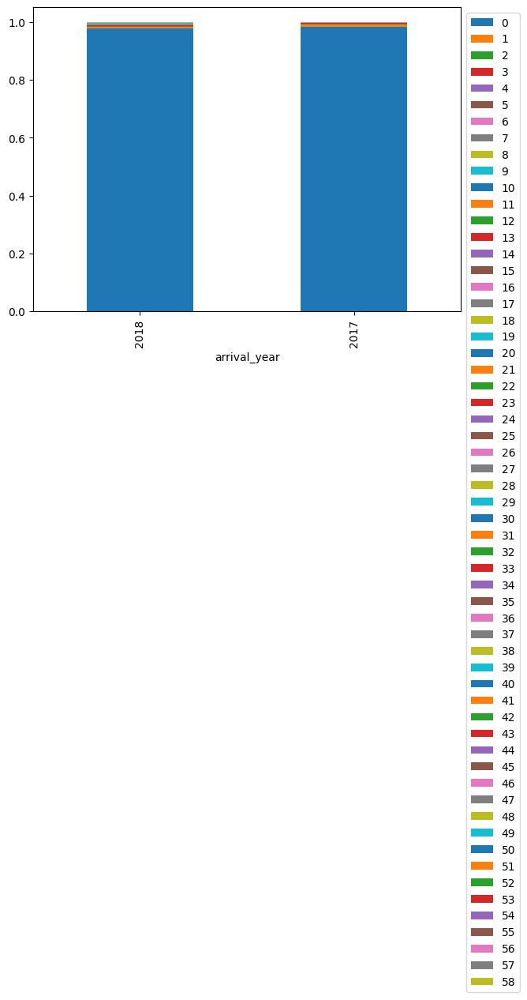

In [ ]:
stacked_barplot(data, "arrival_year", "no_of_previous_bookings_not_canceled")

* 2018 had higher number of bookings which had previous bookings not cancelled

#### `arrival_year` vs `avg_price_per_room`

<Figure size 1200x900 with 0 Axes>

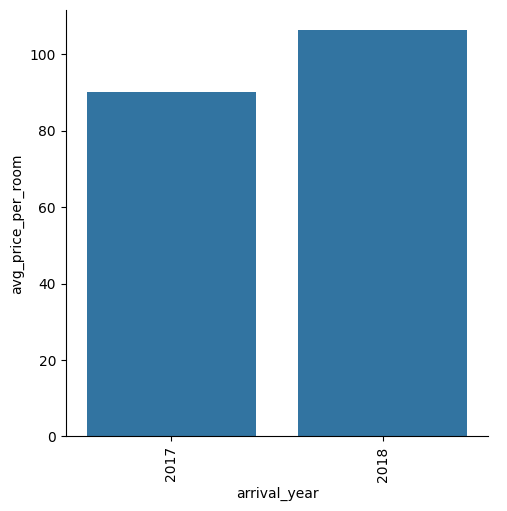

In [ ]:
plt.figure(figsize=(12,9))
sns.catplot(data=df,x = 'arrival_year' , y = 'avg_price_per_room', kind = "bar" ,ci = False);
plt.xticks( rotation=90);
plt.show()

* In general 2018 had higher room prices

#### `arrival_year` vs `no_of_special_requests`

<Figure size 1200x900 with 0 Axes>

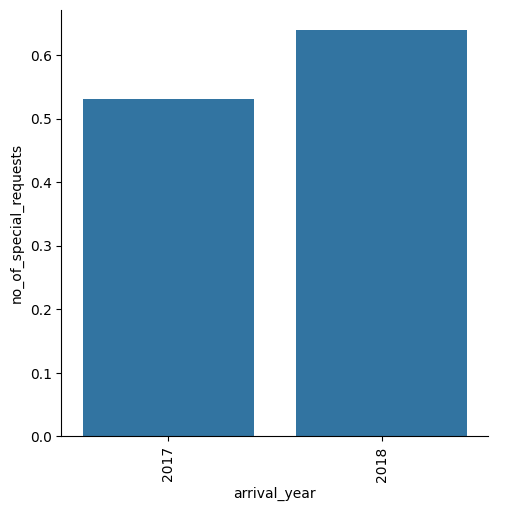

In [ ]:
plt.figure(figsize=(12,9))
sns.catplot(data=df,x = 'arrival_year' , y = 'no_of_special_requests', kind = "bar" ,ci = False);
plt.xticks( rotation=90);
plt.show()

<Figure size 1200x900 with 0 Axes>

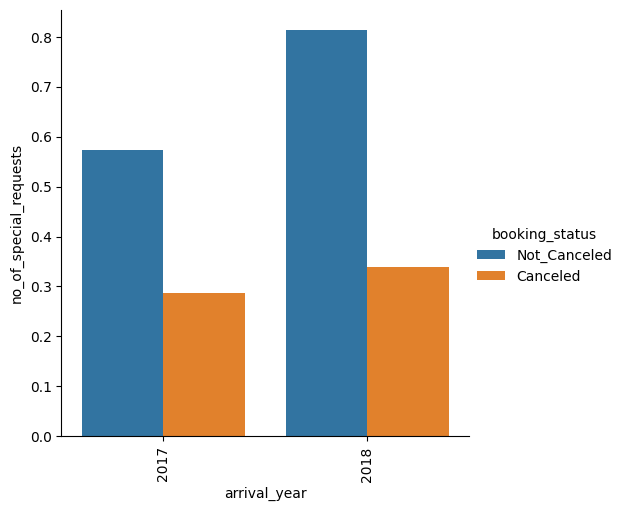

In [ ]:
plt.figure(figsize=(12,9))
sns.catplot(data=df,x = 'arrival_year' , y = 'no_of_special_requests', kind = "bar", hue="booking_status" ,ci = False);
plt.xticks( rotation=90);
plt.show()

* 2018 in general had more special requests
* in 2018, the bookings which were cancelled and not cancelled had more special requests than in 2017

#### `arrival_month` vs `arrival_date`

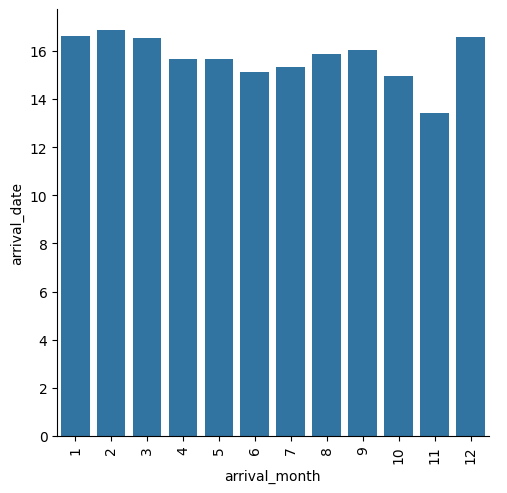

In [ ]:
sns.catplot(data=df,x = 'arrival_month' , y = 'arrival_date', kind = "bar" , ci = False);
plt.xticks(rotation=90);
plt.show()

* On the 11th month bookings tend to be earlier in the month

#### `arrival_month` vs `market_segment_type`

market_segment_type  Aviation  Complementary  Corporate  Offline  Online  \
arrival_month                                                              
All                       125            391       2017    10528   23214   
5                          29             23        219      651    1676   
10                         29             45        221     2068    2954   
4                          25             12         65      661    1973   
9                          18             52        258     1592    2691   
11                         12             44        235      801    1888   
6                           6             21         99     1371    1706   
3                           3             23        167      538    1627   
7                           2             18        113      638    2149   
2                           1             18        206      438    1041   
1                           0             30        106      314     564   
8           

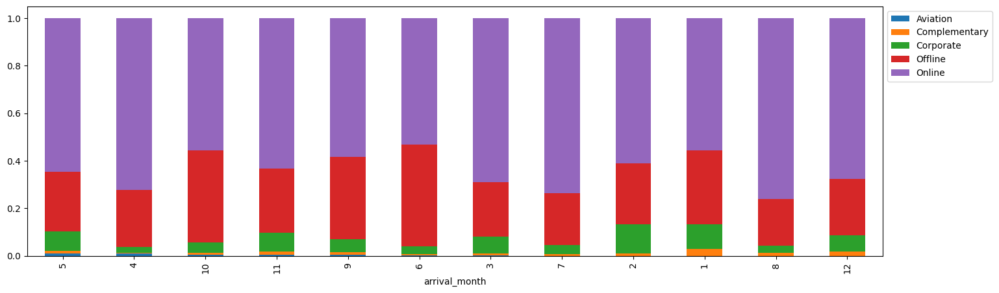

In [ ]:
stacked_barplot(data, "arrival_month", "market_segment_type")

* Online bookings were most prevalent in all months
* Offline bookings was also very prevalent in month 10 and month 6

#### `arrival_month` vs `repeated_guest`

repeated_guest      0    1    All
arrival_month                    
All             35345  930  36275
10               5174  143   5317
12               2888  133   3021
11               2870  110   2980
9                4503  108   4611
3                2283   75   2358
1                 940   74   1014
5                2535   63   2598
2                1645   59   1704
6                3148   55   3203
4                2686   50   2736
7                2880   40   2920
8                3793   20   3813
------------------------------------------------------------------------------------------------------------------------


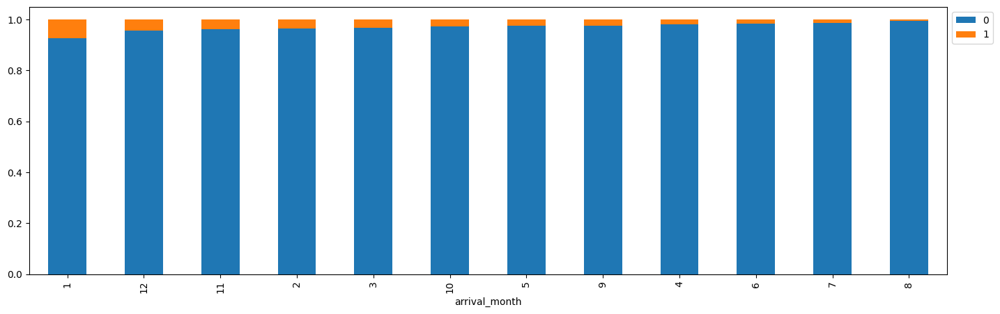

In [ ]:
stacked_barplot(data, "arrival_month", "repeated_guest")

* Percentages of repeated guests were most prevalent in month 1

#### `arrival_month` vs `no_of_previous_cancellations`

<Figure size 1200x900 with 0 Axes>

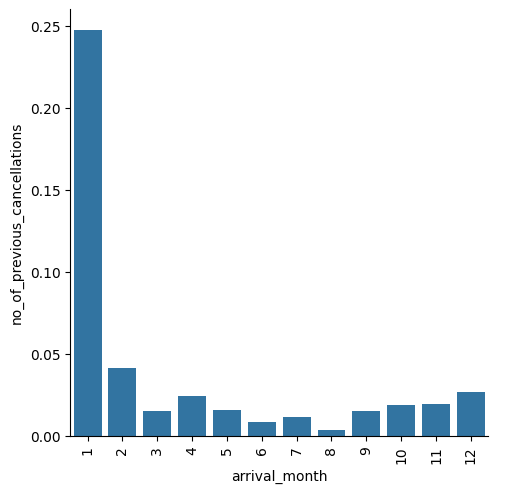

In [ ]:
plt.figure(figsize=(12,9))
sns.catplot(data=df,x = 'arrival_month' , y = 'no_of_previous_cancellations', kind = "bar" ,ci = False);
plt.xticks( rotation=90);
plt.show()

arrival_month                    1     2     3     4     5     6     7     8  \
no_of_previous_cancellations                                                   
All                           1014  1704  2358  2736  2598  3203  2920  3813   
0                              981  1686  2338  2723  2579  3187  2903  3805   
11                              21     4     0     0     0     0     0     0   
2                                6     6     6     0     4     2     4     0   
1                                5     5     9     6     7    10     7     5   
3                                1     3     5     3     6     3     6     3   
4                                0     0     0     0     2     1     0     0   
5                                0     0     0     0     0     0     0     0   
6                                0     0     0     0     0     0     0     0   
13                               0     0     0     4     0     0     0     0   

arrival_month                    9    1

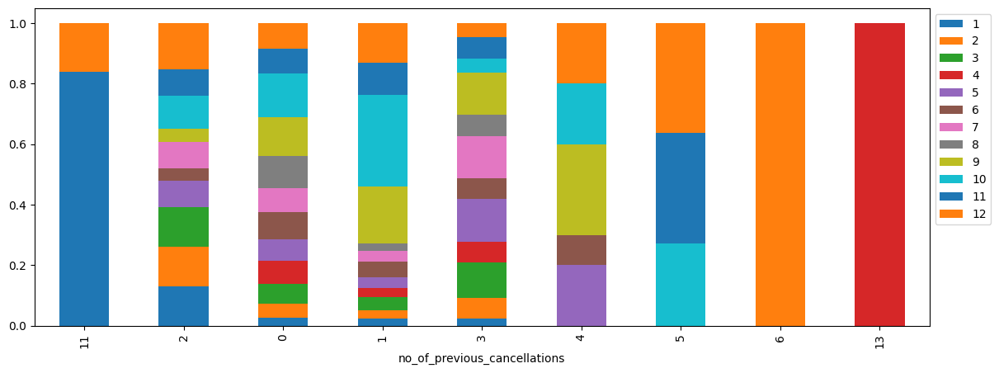

In [ ]:
stacked_barplot(data, "no_of_previous_cancellations", "arrival_month")

* Month 1 had the highest cancellation rate
* Month 8 had the lowest
* Bookings with 13 previous cncellations was in month 4
* Bookings with 11 previous cncellations was in months 2 and 1
* Bookings with 6 previous cncellations was in months 2 and 10
* Bookings with 5 previous cncellations was in months 1, 2 and 4

#### `arrival_month` vs `no_of_previous_bookings_not_canceled`

<Figure size 1200x900 with 0 Axes>

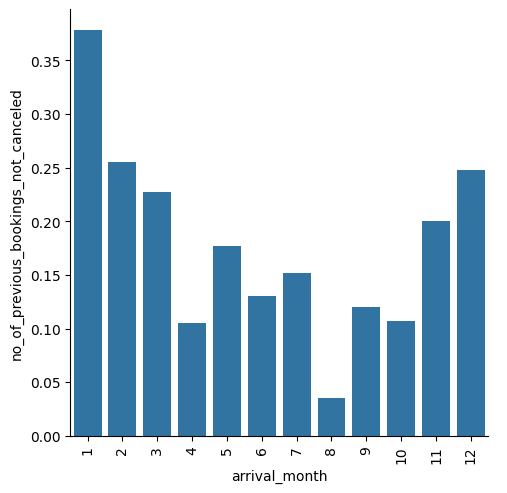

In [ ]:
plt.figure(figsize=(12,9))
sns.catplot(data=df,x = 'arrival_month' , y = 'no_of_previous_bookings_not_canceled', kind = "bar" ,ci = False);
plt.xticks( rotation=90);
plt.show()

* Month 1 had the highest rate of bookings where the previous bookings was not cancelled

#### `arrival_month` vs `avg_price_per_room`

<Figure size 1200x900 with 0 Axes>

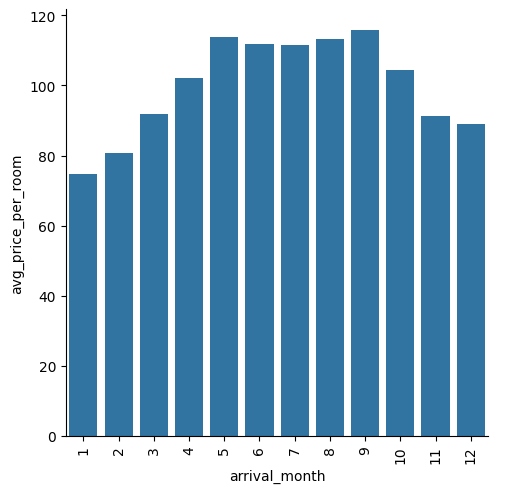

In [ ]:
plt.figure(figsize=(12,9))
sns.catplot(data=df,x = 'arrival_month' , y = 'avg_price_per_room', kind = "bar" ,ci = False);
plt.xticks( rotation=90);
plt.show()

* Month 5 and month 9 tend to have higher prices in room rates

#### `arrival_month` vs `no_of_special_requests`

<Figure size 1200x900 with 0 Axes>

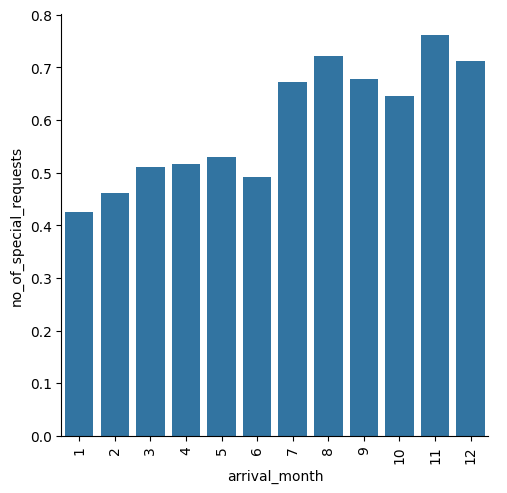

In [ ]:
plt.figure(figsize=(12,9))
sns.catplot(data=df,x = 'arrival_month' , y = 'no_of_special_requests', kind = "bar" ,ci = False);
plt.xticks( rotation=90);
plt.show()

<Figure size 1200x900 with 0 Axes>

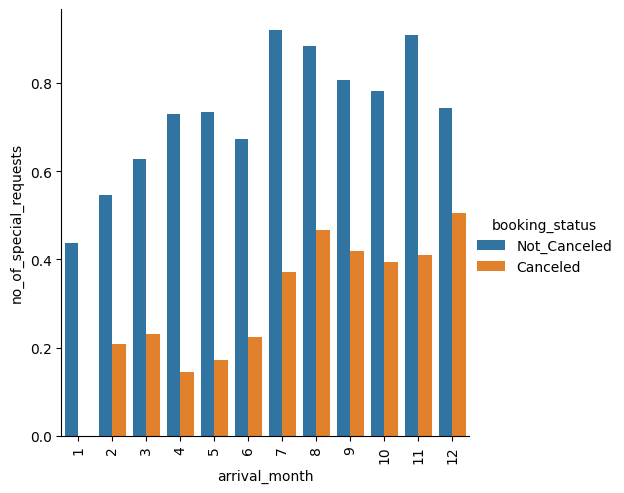

In [ ]:
plt.figure(figsize=(12,9))
sns.catplot(data=df,x = 'arrival_month' , y = 'no_of_special_requests', kind = "bar", hue="booking_status" ,ci = False);
plt.xticks( rotation=90);
plt.show()

* Month 11 in general had more special requests
* The bookings which were cancelled had less special requests than those bookings which was not cancelled, except in month 1 where there were no cancellations

market_segment_type  Aviation  Complementary  Corporate  Offline  Online  \
arrival_date                                                               
All                       125            391       2017    10528   23214   
9                          12             14         89      301     714   
19                         10             10        186      404     717   
20                          9             14         72      408     778   
26                          9             10         52      264     811   
10                          9             23         57      296     704   
12                          9             15         60      314     806   
11                          8             19         64      236     771   
2                           8             13         87      410     813   
30                          8              8         34      409     757   
7                           6             14         62      186     842   
4           

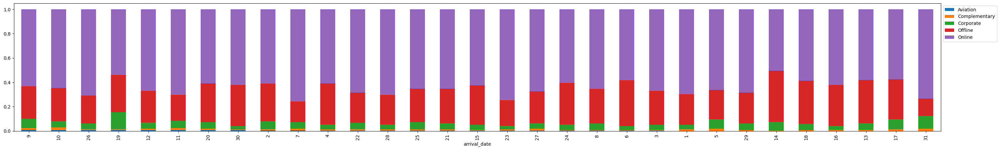

In [ ]:
stacked_barplot(data, "arrival_date", "market_segment_type")

* Online bookings were most prevalent in all arrival dates
* Offline bookings was also very prevalent for all arrival dates

#### `arrival_date` vs `repeated_guest`

arrival_date       1     2     3     4     5     6     7     8     9    10  \
repeated_guest                                                               
All             1133  1331  1098  1327  1154  1273  1110  1198  1130  1089   
0               1104  1308  1074  1290  1114  1207  1083  1166  1098  1052   
1                 29    23    24    37    40    66    27    32    32    37   

arrival_date      11    12    13    14    15    16    17    18    19    20  \
repeated_guest                                                               
All             1098  1204  1358  1242  1273  1306  1345  1260  1327  1281   
0               1068  1173  1320  1207  1241  1288  1314  1236  1290  1225   
1                 30    31    38    35    32    18    31    24    37    56   

arrival_date      21    22   23    24    25    26    27    28    29    30  \
repeated_guest                                                              
All             1158  1023  990  1103  1146  1146  1059  1129  1

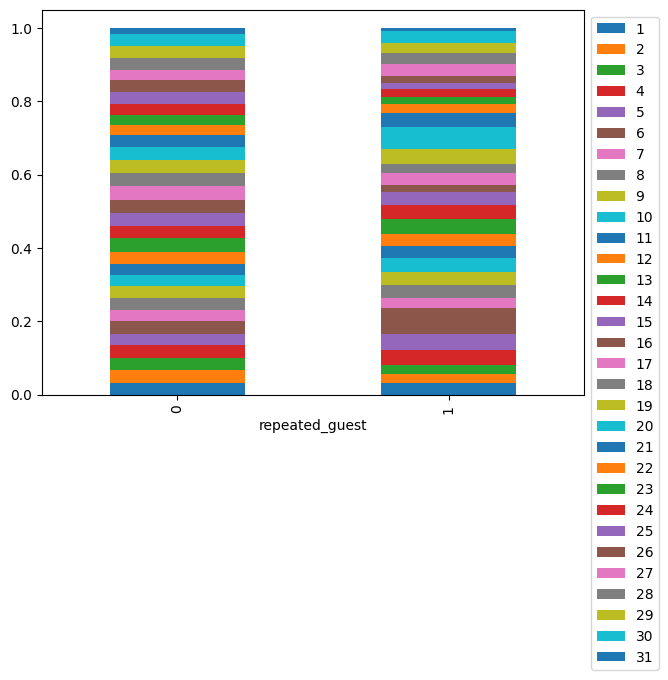

In [ ]:
stacked_barplot(data, "repeated_guest", "arrival_date")

*`arrival_date` did not seem to affect repeated guests

#### `arrival_date` vs `no_of_previous_cancellations`

<Figure size 1200x900 with 0 Axes>

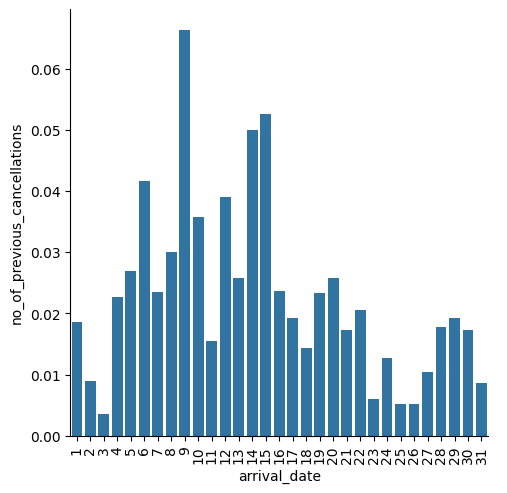

In [ ]:
plt.figure(figsize=(12,9))
sns.catplot(data=df,x = 'arrival_date' , y = 'no_of_previous_cancellations', kind = "bar" ,ci = False);
plt.xticks( rotation=90);
plt.show()

* bookings made on the 9th tend to have more previous cancellations

* Month 1 had the highest cancellation rate
* Month 8 had the lowest
* Bookings with 13 previous cncellations was in month 4
* Bookings with 11 previous cncellations was in months 2 and 1
* Bookings with 6 previous cncellations was in months 2 and 10
* Bookings with 5 previous cncellations was in months 1, 2 and 4

#### `arrival_date` vs `no_of_previous_bookings_not_canceled`

<Figure size 1200x900 with 0 Axes>

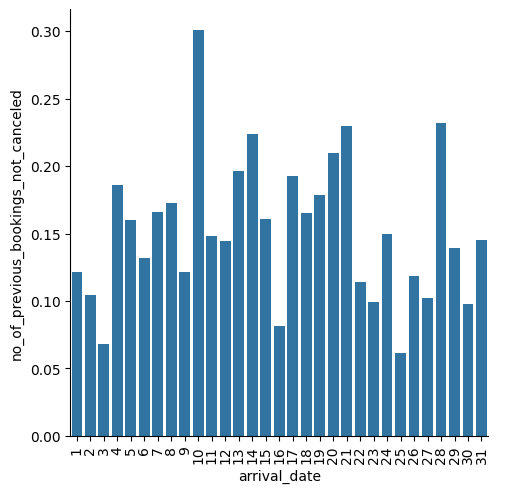

In [ ]:
plt.figure(figsize=(12,9))
sns.catplot(data=df,x = 'arrival_date' , y = 'no_of_previous_bookings_not_canceled', kind = "bar" ,ci = False);
plt.xticks( rotation=90);
plt.show()

* on the 10th of the month there was the highest rate of bookings where the previous bookings was not cancelled

#### `arrival_date` vs `avg_price_per_room`

<Figure size 1200x900 with 0 Axes>

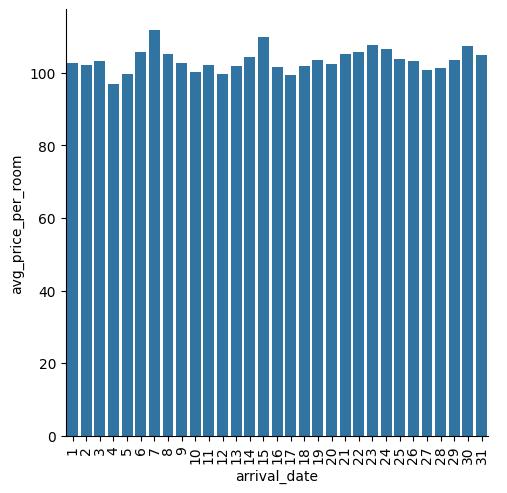

In [ ]:
plt.figure(figsize=(12,9))
sns.catplot(data=df,x = 'arrival_date' , y = 'avg_price_per_room', kind = "bar" ,ci = False);
plt.xticks( rotation=90);
plt.show()

* The 7th and 15th tend to have higher prices in room rates

#### `arrival_date` vs `no_of_special_requests`

<Figure size 1200x900 with 0 Axes>

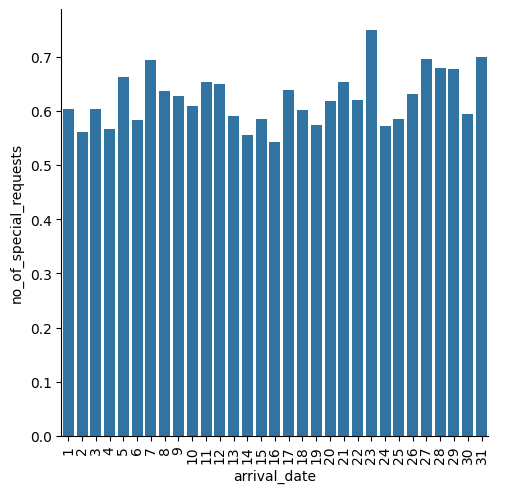

In [ ]:
plt.figure(figsize=(12,9))
sns.catplot(data=df,x = 'arrival_date' , y = 'no_of_special_requests', kind = "bar" ,ci = False);
plt.xticks( rotation=90);
plt.show()

<Figure size 1200x900 with 0 Axes>

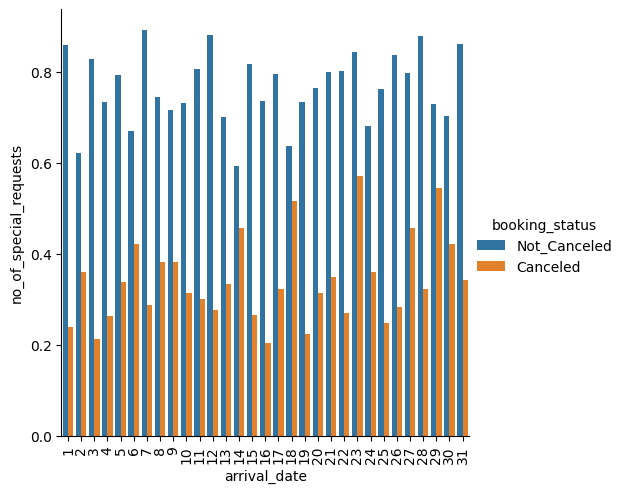

In [ ]:
plt.figure(figsize=(12,9))
sns.catplot(data=df,x = 'arrival_date' , y = 'no_of_special_requests', kind = "bar", hue="booking_status" ,ci = False);
plt.xticks( rotation=90);
plt.show()

* Arrival dte of the 23rd in general had more special requests
* The bookings which were cancelled had less special requests than those bookings which was not cancelled.

#### `market_segment_type` vs `repeated_guest`

market_segment_type  Aviation  Complementary  Corporate  Offline  Online  \
arrival_date                                                               
All                       125            391       2017    10528   23214   
9                          12             14         89      301     714   
19                         10             10        186      404     717   
20                          9             14         72      408     778   
26                          9             10         52      264     811   
10                          9             23         57      296     704   
12                          9             15         60      314     806   
11                          8             19         64      236     771   
2                           8             13         87      410     813   
30                          8              8         34      409     757   
7                           6             14         62      186     842   
4           

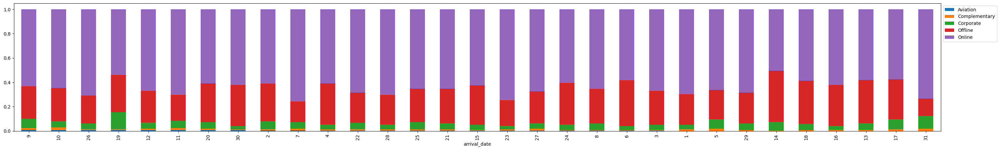

In [ ]:
stacked_barplot(data, "arrival_date", "market_segment_type")

* Online and Offline bookings were most prevalent accross all dates

#### `market_segment_type` vs `no_of_previous_cancellations`

<Figure size 1200x900 with 0 Axes>

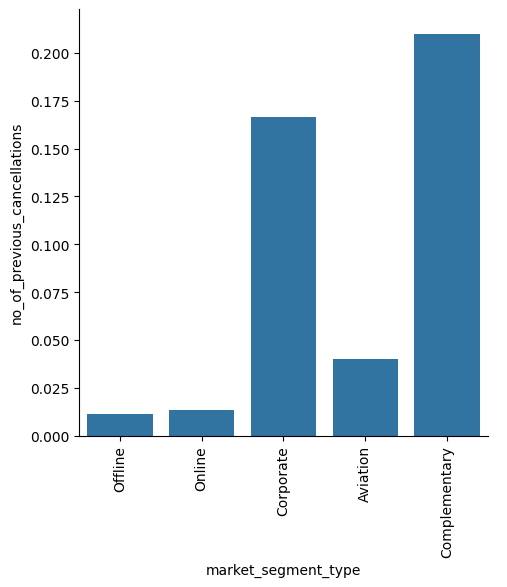

In [ ]:
plt.figure(figsize=(12,9))
sns.catplot(data=df,x = 'market_segment_type' , y = 'no_of_previous_cancellations', kind = "bar" ,ci = False);
plt.xticks( rotation=90);
plt.show()

* bookings made by complementary and corporate had the highest previous cancellation rates
* Online and Offline bookings had the least previous cancellation rates

* Month 1 had the highest cancellation rate
* Month 8 had the lowest
* Bookings with 13 previous cncellations was in month 4
* Bookings with 11 previous cncellations was in months 2 and 1
* Bookings with 6 previous cncellations was in months 2 and 10
* Bookings with 5 previous cncellations was in months 1, 2 and 4

#### `market_segment_type` vs `no_of_previous_bookings_not_canceled`

<Figure size 1200x900 with 0 Axes>

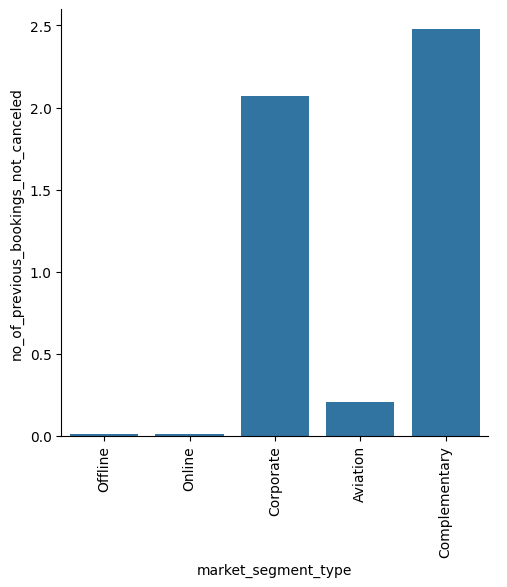

In [ ]:
plt.figure(figsize=(12,9))
sns.catplot(data=df,x = 'market_segment_type' , y = 'no_of_previous_bookings_not_canceled', kind = "bar" ,ci = False);
plt.xticks( rotation=90);
plt.show()

* Corporate and Complementary market segment bookings had the highest rate of previous bookings not cancelled
* Offline and Online had the lowest rate of previous bookings not cancelled

#### `market_segment_type` vs `avg_price_per_room`

<Figure size 1200x900 with 0 Axes>

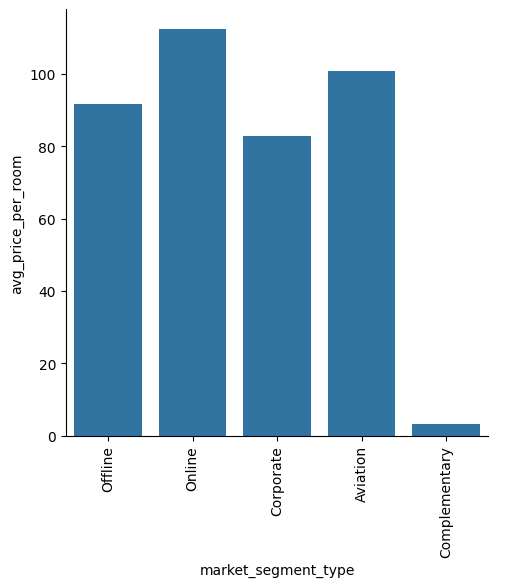

In [ ]:
plt.figure(figsize=(12,9))
sns.catplot(data=df,x = 'market_segment_type' , y = 'avg_price_per_room', kind = "bar" ,ci = False);
plt.xticks( rotation=90);
plt.show()

<Figure size 1200x900 with 0 Axes>

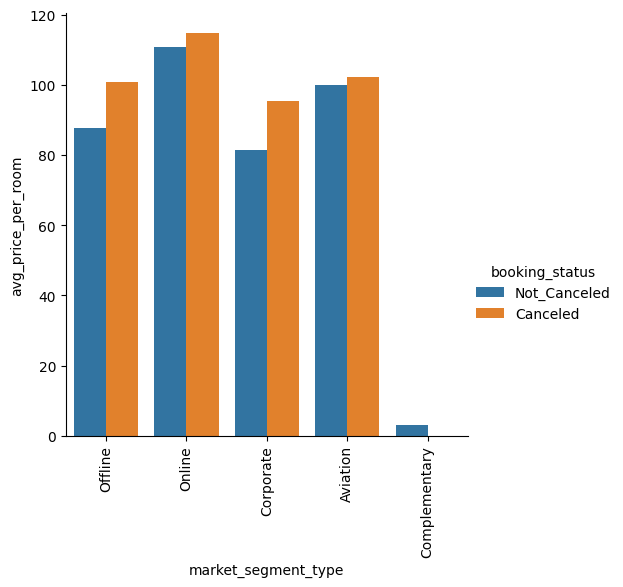

In [ ]:
plt.figure(figsize=(12,9))
sns.catplot(data=df,x = 'market_segment_type' , y = 'avg_price_per_room', kind = "bar" ,hue = "booking_status", ci = False);
plt.xticks( rotation=90);
plt.show()

* Market segment type Online had the highest `avg_price_per_room` rate
* Market segment type Complementary had the lowest `avg_price_per_room` rate as expected
* Bookings which were cancelled have a higher `avg_price_per_room' compared to bookings which were not cancelled, except for market segment type Complementary, where there are no cancellations

#### `market_segment_type` vs `no_of_special_requests`

<Figure size 1200x900 with 0 Axes>

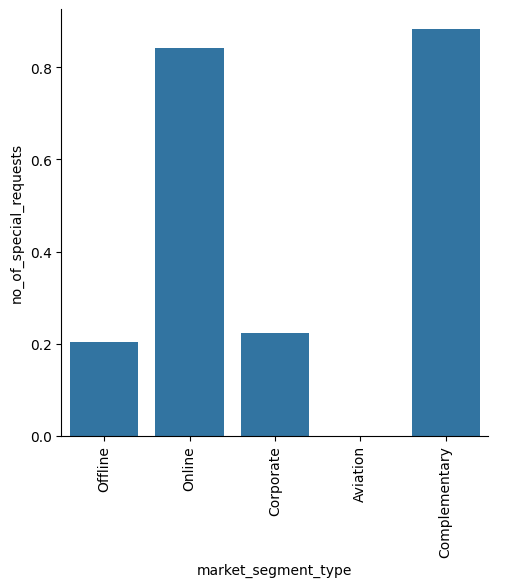

In [ ]:
plt.figure(figsize=(12,9))
sns.catplot(data=df,x = 'market_segment_type' , y = 'no_of_special_requests', kind = "bar" ,ci = False);
plt.xticks( rotation=90);
plt.show()

* Complementary and Online had the most amount of special requests
* Aviation had the least amount of special requests

#### `repeated_guest` vs `no_of_previous_cancellations`

repeated_guest                    0    1    All
no_of_previous_cancellations                   
All                           35345  930  36275
0                             35345  592  35937
1                                 0  198    198
2                                 0   46     46
3                                 0   43     43
11                                0   25     25
5                                 0   11     11
4                                 0   10     10
13                                0    4      4
6                                 0    1      1
------------------------------------------------------------------------------------------------------------------------


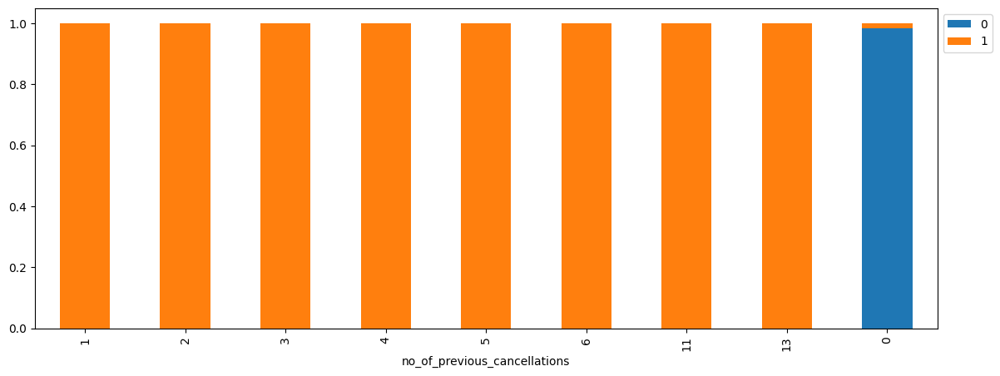

In [ ]:
stacked_barplot(data, "no_of_previous_cancellations", "repeated_guest")

In [ ]:
df['repeated_guest'].value_counts()

0    35345
1      930
Name: repeated_guest, dtype: int64

* The majority of the bookings we not from repeated guests
* Repeated guests had a higher numbers of previous canellations

#### `repeated_guest` vs `no_of_previous_bookings_not_canceled`

no_of_previous_bookings_not_canceled      0    1    2   3   4   5   6   7   8  \
repeated_guest                                                                  
1                                       118  228  112  80  65  60  36  24  23   
All                                   35463  228  112  80  65  60  36  24  23   
0                                     35345    0    0   0   0   0   0   0   0   

no_of_previous_bookings_not_canceled   9  10  11  12  13  14  15  16  17  18  \
repeated_guest                                                                 
1                                     19  19  15  12   7   9   8   7   6   6   
All                                   19  19  15  12   7   9   8   7   6   6   
0                                      0   0   0   0   0   0   0   0   0   0   

no_of_previous_bookings_not_canceled  19  20  21  22  23  24  25  26  27  28  \
repeated_guest                                                                 
1                                

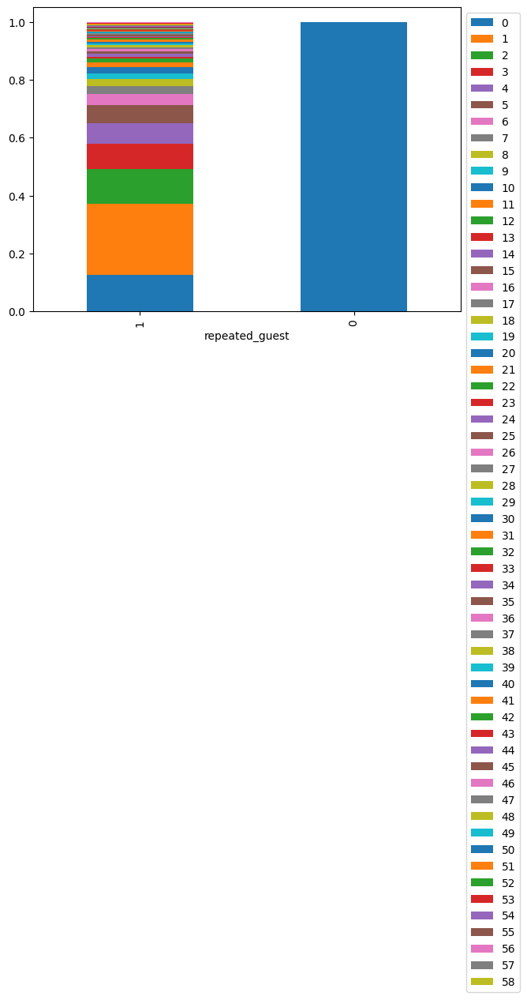

In [ ]:
stacked_barplot(data, "repeated_guest", "no_of_previous_bookings_not_canceled")

* Repeated guests had 0 previous bookings, as expected.

#### `repeated_guest` vs `avg_price_per_room`

<Figure size 1200x900 with 0 Axes>

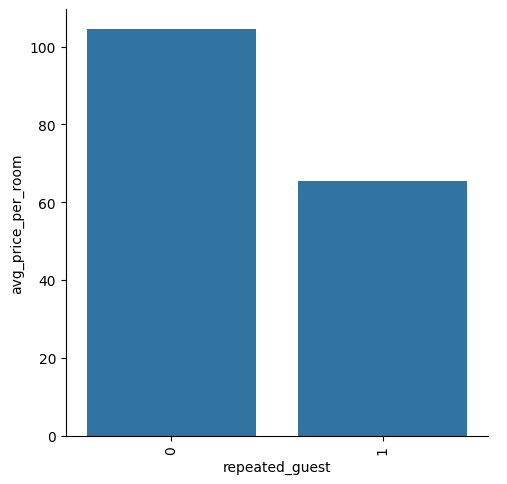

In [ ]:
plt.figure(figsize=(12,9))
sns.catplot(data=df,x = 'repeated_guest' , y = 'avg_price_per_room', kind = "bar" ,ci = False);
plt.xticks( rotation=90);
plt.show()

* `avg_price_per_room` is lower for repeated guests

#### `repeated_guest` vs `no_of_special_requests`

<Figure size 1200x900 with 0 Axes>

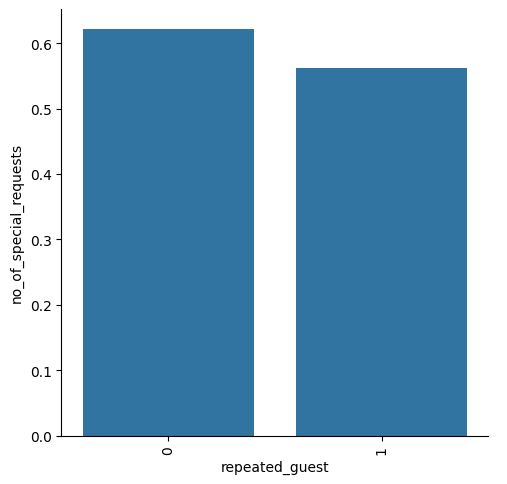

In [ ]:
plt.figure(figsize=(12,9))
sns.catplot(data=df,x = 'repeated_guest' , y = 'no_of_special_requests', kind = "bar" ,ci = False);
plt.xticks( rotation=90);
plt.show()

* Repeated guests tend to have less special requests

#### `no_of_previous_cancellations` vs `no_of_previous_bookings_not_canceled`

<Figure size 1200x800 with 0 Axes>

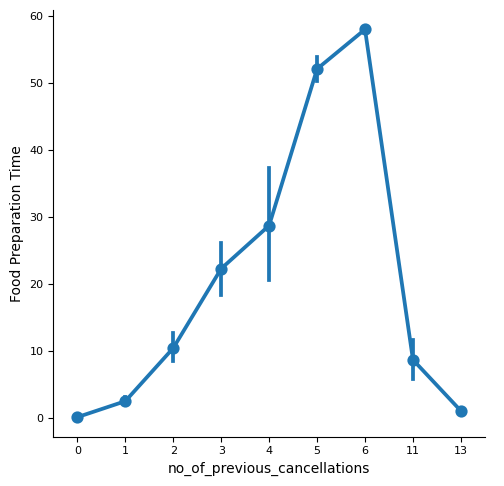

In [ ]:

plt.figure(figsize=(12,8))
sns.catplot(data=df,x= 'no_of_previous_cancellations', y='no_of_previous_bookings_not_canceled', kind = "point")
plt.xlabel("no_of_previous_cancellations",fontsize=10)
plt.ylabel("Food Preparation Time", fontsize=10)
plt.xticks(fontsize = 8);
plt.yticks(fontsize = 8);
#plt.xticks(rotation=90);

* We see that as the `no_of_previous_cancellations` increases so does `no_of_previous_bookings_not_canceled` until bookings with 6 previous cancellations.
* When 'no_of_previous_cancellations' increases more than 6 the `no_of_previous_bookings_not_canceled`  reduces gradually to 0

In [ ]:
df[df['no_of_previous_cancellations'] ==6]

,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,arrival_date,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status
29572,1,0,0,2,Meal Plan 1,0,Room_Type 1,8,2018,12,28,Corporate,1,6,58,65.00000,2,Not_Canceled


#### `no_of_previous_cancellations` vs `avg_price_per_room`

<Figure size 1200x900 with 0 Axes>

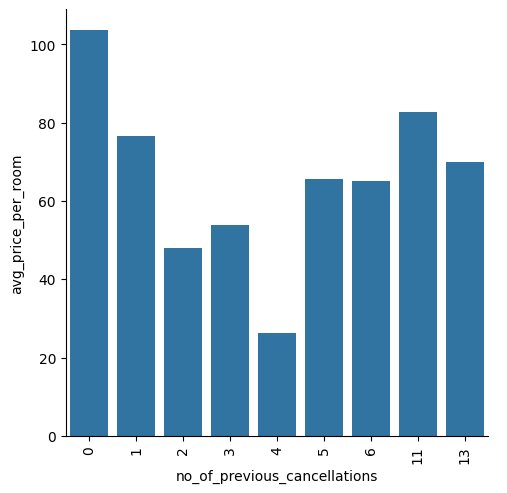

In [ ]:
plt.figure(figsize=(12,9))
sns.catplot(data=df,x = 'no_of_previous_cancellations' , y = 'avg_price_per_room', kind = "bar" ,ci = False);
plt.xticks( rotation=90);
plt.show()

* `avg_price_per_room` is highest when there are 0 previous cancellations

#### `no_of_previous_cancellations` vs `no_of_special_requests`

<Figure size 1200x900 with 0 Axes>

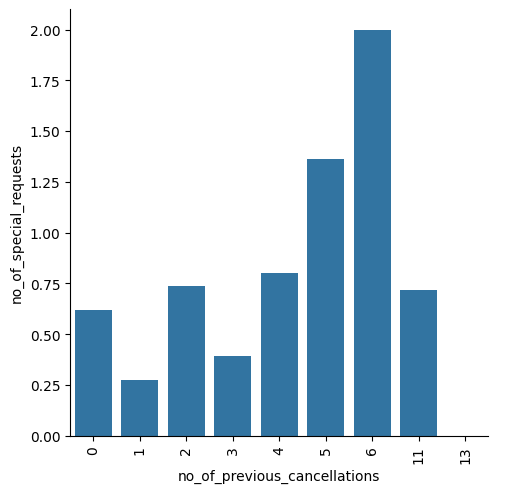

In [ ]:
plt.figure(figsize=(12,9))
sns.catplot(data=df,x = 'no_of_previous_cancellations' , y = 'no_of_special_requests', kind = "bar" ,ci = False);
plt.xticks( rotation=90);
plt.show()

* `no_of_special_requests` is the most when there are 6 previous cancellations
* `no_of_special_requests` is least when there are 13 previous cancellations

`no_of_previous_bookings_not_canceled` vs `avg_price_per_room`

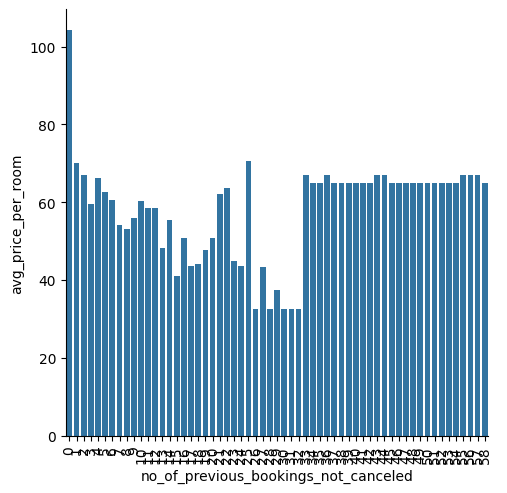

In [ ]:
sns.catplot(data=df,x = 'no_of_previous_bookings_not_canceled' , y = 'avg_price_per_room', kind = "bar" ,ci = False);
plt.xticks( rotation=90);
plt.show()

* `avg_price_per_room` is highest when there are 0 previous bookings not cancelled

#### `no_of_previous_bookings_not_canceled` vs `no_of_special_requests`

<Figure size 1200x900 with 0 Axes>

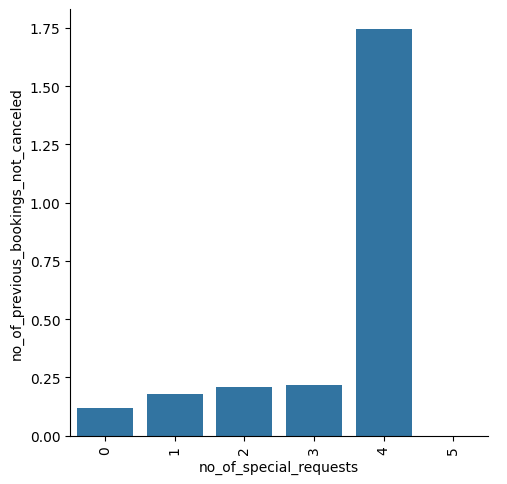

In [ ]:
plt.figure(figsize=(12,9))
sns.catplot(data=df,x = 'no_of_special_requests' , y = 'no_of_previous_bookings_not_canceled', kind = "bar" ,ci = False);
plt.xticks( rotation=90);
plt.show()

* `no_of_special_requests` is the highest when `no_of_previous_bookings_not_canceled` is highest
* `no_of_special_requests` is least when `no_of_previous_bookings_not_canceled` is 0

#### `avg_price_per_room` vs `no_of_special_requests`

<Figure size 1200x900 with 0 Axes>

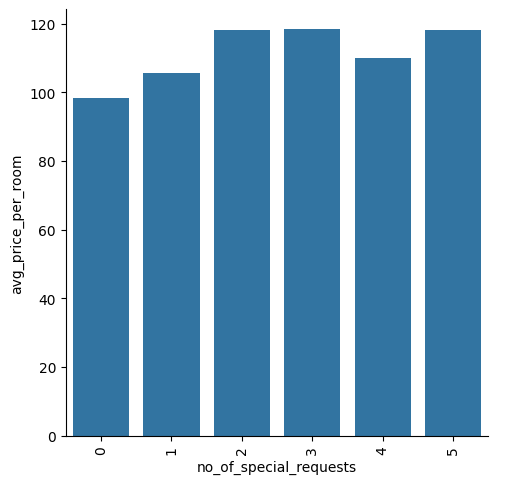

In [ ]:
plt.figure(figsize=(12,9))
sns.catplot(data=df,x = 'no_of_special_requests' , y = 'avg_price_per_room', kind = "bar" ,ci = False);
plt.xticks( rotation=90);
plt.show()

* When `no_of_special_requests` is 2, 3, and 5 the `avg_price_per_room` is highest
* When `no_of_special_requests` is 0 the `avg_price_per_room` is lowest

#### `avg_price_per_room` vs `no_of_special_requests`

<Figure size 1200x900 with 0 Axes>

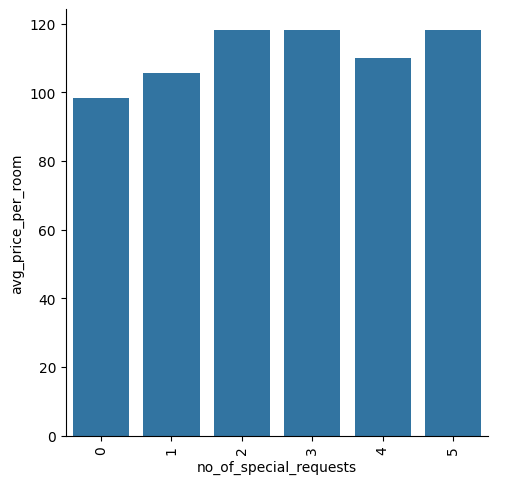

In [ ]:
plt.figure(figsize=(12,9))
sns.catplot(data=df,x = 'no_of_special_requests' , y = 'avg_price_per_room', kind = "bar" ,ci = False);
plt.xticks( rotation=90);
plt.show()

* When `no_of_special_requests` is 2, 3, and 5 the `avg_price_per_room` is highest
* When `no_of_special_requests` is 0 the `avg_price_per_room` is lowest

## Data Preprocessing

- Missing value treatment (if needed)
- Feature engineering (if needed)
- Outlier detection and treatment (if needed)
- Preparing data for modeling
- Any other preprocessing steps (if needed)

In [ ]:
# making a copy of the dataset

df1 = df.copy()


# checking the head of df1 to ensure it was copied without errors
df1.head()


,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,arrival_date,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status
0,2,0,1,2,Meal Plan 1,0,Room_Type 1,224,2017,10,2,Offline,0,0,0,65.00000,0,Not_Canceled
1,2,0,2,3,Not Selected,0,Room_Type 1,5,2018,11,6,Online,0,0,0,106.68000,1,Not_Canceled
2,1,0,2,1,Meal Plan 1,0,Room_Type 1,1,2018,2,28,Online,0,0,0,60.00000,0,Canceled
3,2,0,0,2,Meal Plan 1,0,Room_Type 1,211,2018,5,20,Online,0,0,0,100.00000,0,Canceled
4,2,0,1,1,Not Selected,0,Room_Type 1,48,2018,4,11,Online,0,0,0,94.50000,0,Canceled


In [ ]:
# checking the columns with missing values
df1.isnull().sum()

no_of_adults                            0
no_of_children                          0
no_of_weekend_nights                    0
no_of_week_nights                       0
type_of_meal_plan                       0
required_car_parking_space              0
room_type_reserved                      0
lead_time                               0
arrival_year                            0
arrival_month                           0
arrival_date                            0
market_segment_type                     0
repeated_guest                          0
no_of_previous_cancellations            0
no_of_previous_bookings_not_canceled    0
avg_price_per_room                      0
no_of_special_requests                  0
booking_status                          0
dtype: int64

*  There are no missing values

### Imputing `market_segment` values as discussed in the Univariate Analysis

>As discussed in the Univariate Analysis, there are 191 bookings with a price of 0 euros and was booked Online.  Either the price was incorrect or the market segment was incorrect.  It is more probaby that the market segment was entered incorrectly, hence we will change these values from Online to Complementary

In [ ]:
# finding the rows where the average price per room is 0 euros AND the market segment is not Complementary and replacing the values of the market segment with complementary
df1.loc[(df1["avg_price_per_room"] == 0) & (df1["market_segment_type"] != "Complementary"), "market_segment_type"] = "Complementary"

In [ ]:
# Checking if all the 0 euro rooms are changed to complementary
df1[(df1["avg_price_per_room"]==0) & (df1["market_segment_type"]!= "Complementary")].sort_values('market_segment_type').reset_index()

,index,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,arrival_date,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status


* All the rooms which were 0 euros and Online have been changed to Complementary

### Outlier Detection

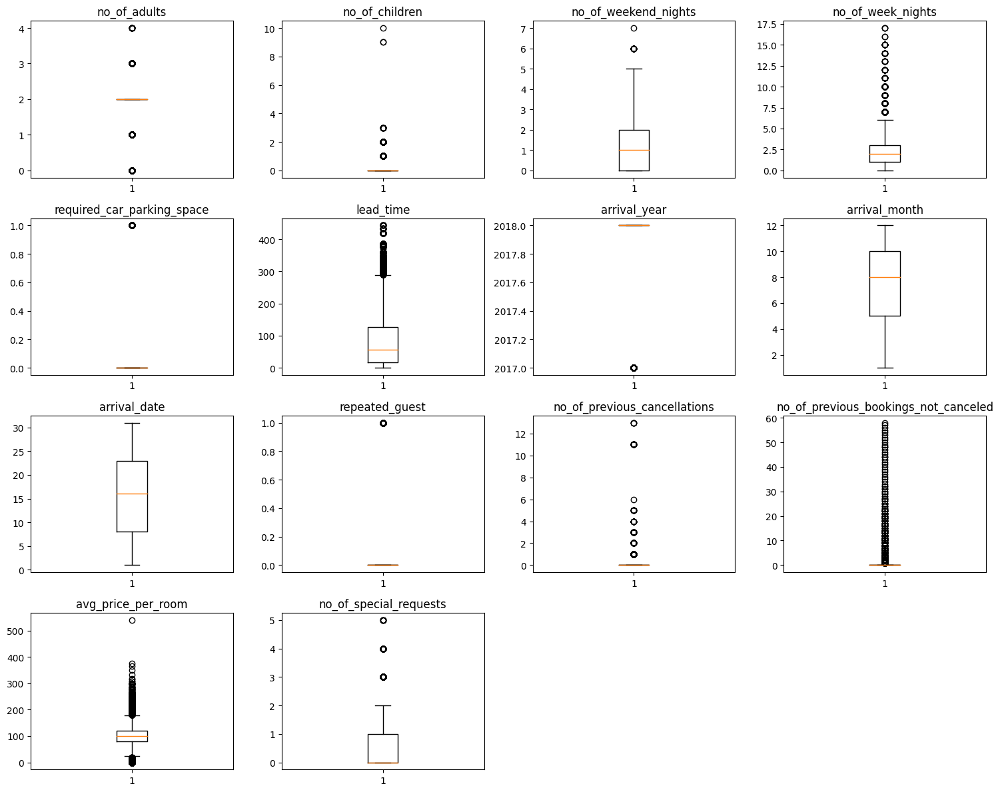

In [ ]:
# outlier detection using boxplot
numeric_columns = df1.select_dtypes(include=np.number).columns.tolist()

plt.figure(figsize=(15, 12))

for i, variable in enumerate(numeric_columns):
    plt.subplot(4, 4, i + 1)
    plt.boxplot(data[variable], whis=1.5)
    plt.tight_layout()
    plt.title(variable)

plt.show()

* Although there are outliers in the dataset, these appear to be explainable, hence we will not treat the outliers

### Data Preparation for Modeling

**Encoding `Not_Canceled` as 0 and `Canceled` as 1 as INN Hotel wants to find a model to predict booking cancellations.**

In [ ]:
df1["booking_status"] = df1["booking_status"].apply(lambda x: 1 if x == "Canceled" else 0)

In [ ]:
df1.head()

,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,arrival_date,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status
0,2,0,1,2,Meal Plan 1,0,Room_Type 1,224,2017,10,2,Offline,0,0,0,65.00000,0,0
1,2,0,2,3,Not Selected,0,Room_Type 1,5,2018,11,6,Online,0,0,0,106.68000,1,0
2,1,0,2,1,Meal Plan 1,0,Room_Type 1,1,2018,2,28,Online,0,0,0,60.00000,0,1
3,2,0,0,2,Meal Plan 1,0,Room_Type 1,211,2018,5,20,Online,0,0,0,100.00000,0,1
4,2,0,1,1,Not Selected,0,Room_Type 1,48,2018,4,11,Online,0,0,0,94.50000,0,1


#### Creating training and test datasets

In [ ]:
# specifying the independent  and dependent variables
X = df1.drop(["booking_status"], axis=1)
Y = df1["booking_status"]

# adding a constant to the independent variables
X = sm.add_constant(X)

# creating dummy variables
X = pd.get_dummies(X, drop_first=True)

# splitting data in train and test sets
X_train, X_test, y_train, y_test = train_test_split(
    X, Y, test_size=0.30, random_state=1
)

In [ ]:
# Checking that sll variables are numeric for the model to run
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36275 entries, 0 to 36274
Data columns (total 28 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   const                                 36275 non-null  float64
 1   no_of_adults                          36275 non-null  int64  
 2   no_of_children                        36275 non-null  int64  
 3   no_of_weekend_nights                  36275 non-null  int64  
 4   no_of_week_nights                     36275 non-null  int64  
 5   required_car_parking_space            36275 non-null  int64  
 6   lead_time                             36275 non-null  int64  
 7   arrival_year                          36275 non-null  int64  
 8   arrival_month                         36275 non-null  int64  
 9   arrival_date                          36275 non-null  int64  
 10  repeated_guest                        36275 non-null  int64  
 11  no_of_previous_

* All variables are of numeric datatype

In [ ]:
# Checking the shape of the training and test data to ensure that they have the same distribution of 1's and 0's
print("Shape of Training set : ", X_train.shape)
print("Shape of test set : ", X_test.shape)
print("Percentage of classes in training set:")
print(y_train.value_counts(normalize=True))
print("Percentage of classes in test set:")
print(y_test.value_counts(normalize=True))

Shape of Training set :  (25392, 28)
Shape of test set :  (10883, 28)
Percentage of classes in training set:
0   0.67064
1   0.32936
Name: booking_status, dtype: float64
Percentage of classes in test set:
0   0.67638
1   0.32362
Name: booking_status, dtype: float64


* We had seen that 67.2% of observations belongs to class 0 (Not Canceled) and 32.87% observations belongs to class 1 (Canceled), and this is preserved in the train and test sets

## EDA

- It is a good idea to explore the data once again after manipulating it.

## Building a Logistic Regression model

- We will now perform logistic regression using statsmodels, a Python module that provides functions for the estimation of many statistical models, as well as for conducting statistical tests, and statistical data exploration.

- Using statsmodels, we will be able to check the statistical validity of our model - identify the significant predictors from p-values that we get for each predictor variable.

In [ ]:
# fitting logistic regression model
logit = sm.Logit(y_train, X_train.astype(float))
lg = logit.fit(disp=False)

print(lg.summary())

                           Logit Regression Results                           
Dep. Variable:         booking_status   No. Observations:                25392
Model:                          Logit   Df Residuals:                    25364
Method:                           MLE   Df Model:                           27
Date:                Thu, 30 May 2024   Pseudo R-squ.:                  0.3298
Time:                        12:53:11   Log-Likelihood:                -10784.
converged:                       True   LL-Null:                       -16091.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                           coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------
const                                 -911.2039    120.774     -7.545      0.000   -1147.916    -674.491
no_of_adults                             0.1094      

**Observations**

- Negative values of the coefficient show that the probability of a booking cancellation decreases with the increase of the corresponding attribute value.

- Positive values of the coefficient show that the probability of a booking cancellation increases with the increase of the corresponding attribute value.

- p-value of a variable indicates if the variable is significant or not. If we consider the significance level to be 0.05 (5%), then any variable with a p-value less than 0.05 would be considered significant.  We see that `arrival_date`, `no_of_previous_bookings_not_canceled `, `type_of_meal_plan_Meal Plan 3`, `room_type_reserved_Room_Type 3`, `market_segment_type_Complementary`, and `market_segment_type_Online` all have high p-values

## Model performance evaluation

**Model can make wrong predictions as**:

1. Predicting a booking would be cancelled but in reality the booking was not cancelled (False Positive).

2. Predicting a booking was not cancelled but in reality the booking was cancelled (False Negative).

**Which case is more important?**

* Both the cases are important as:

  * False Positive - If we predict a booking would be cancelled but actually the booking was not cancelled then INN Hotels would be losing out on potential clients or hence loss of revenue.  INN Hotels may lower the room price and there cound be a possibloe over booking. The resources of the hotel could be misallocated.  This could lead to a customer having negative experience, negative reviewes online, and a bad reputation for the hotel.  Hence it is important that we reduce False Positives

  * False Negative - If we predict a booking would not be cancelled but actually the booking was cancelled this can affect INN Hotels negatively as they may not be able to resell the room in time, leading to revenue loss, there would be unutilized resources as the rooms was prepared for guests who did not show up, there is an increase in operational cost.  There would be an actual loss of revenue as the room could have been rented to someone who would not cancel.  Finally, False Negative predictions can lead to problems in future planning, resource allocations and pricing strategies.  Hence, reducing False Negatives are also inmortant


**How to reduce this loss?**

* We need to reduce both False Negatives and False Positives

* `f1_score` should be maximized as the greater the f1_score, the higher the chances of reducing both False Negatives and False Positives and identifying both the classes correctly
  * fi_score is computed as
  $$f1\_score = \frac{2 * Precision * Recall}{Precision + Recall}$$

**First, let's create functions to calculate different metrics and confusion matrix so that we don't have to use the same code repeatedly for each model.**

* The model_performance_classification_statsmodels function will be used to check the model performance of models.
* The confusion_matrix_statsmodels function will be used to plot confusion matrix.

In [ ]:
# defining a function to compute different metrics to check performance of a classification model built using statsmodels
def model_performance_classification_statsmodels(
    model, predictors, target, threshold=0.5
):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    threshold: threshold for classifying the observation as class 1
    """

    # checking which probabilities are greater than threshold
    pred_temp = model.predict(predictors) > threshold
    # rounding off the above values to get classes
    pred = np.round(pred_temp)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred)  # to compute Recall
    precision = precision_score(target, pred)  # to compute Precision
    f1 = f1_score(target, pred)  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {"Accuracy": acc, "Recall": recall, "Precision": precision, "F1": f1,},
        index=[0],
    )

    return df_perf

In [ ]:
# defining a function to plot the confusion_matrix of a classification model


def confusion_matrix_statsmodels(model, predictors, target, threshold=0.5):
    """
    To plot the confusion_matrix with percentages

    model: classifier
    predictors: independent variables
    target: dependent variable
    threshold: threshold for classifying the observation as class 1
    """
    y_pred = model.predict(predictors) > threshold
    cm = confusion_matrix(target, y_pred)
    labels = np.asarray(
        [
            ["{0:0.0f}".format(item) + "\n{0:.2%}".format(item / cm.flatten().sum())]
            for item in cm.flatten()
        ]
    ).reshape(2, 2)

    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=labels, fmt="")
    plt.ylabel("True label")
    plt.xlabel("Predicted label")

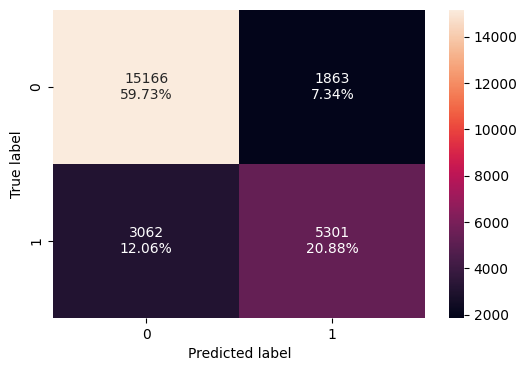

In [ ]:
confusion_matrix_statsmodels(lg, X_train, y_train)

In [ ]:
print("Training performance:")
model_performance_classification_statsmodels(lg, X_train, y_train)

Training performance:


,Accuracy,Recall,Precision,F1
0,0.80604,0.63386,0.73995,0.68281


**Observations**

- The f1_score of the model is ~0.68 and we will try to maximize it further

- The variables used to build the model might contain multicollinearity, which will affect the p-values

* We will have to remove multicollinearity from the data to get reliable coefficients and p-values

## Checking Multicollinearity

- In order to make statistical inferences from a logistic regression model, it is important to ensure that there is no multicollinearity present in the data.
- There are different ways of detecting (or testing for) multicollinearity. One such way is using the Variation Inflation Factor (VIF).

* **Variance  Inflation  factor**:  Variance  inflation  factors  measure  the  inflation  in  the variances of the regression coefficients estimates due to collinearities that exist among the  predictors.  It  is  a  measure  of  how  much  the  variance  of  the  estimated  regression coefficient $\beta_k$ is "inflated" by  the  existence  of  correlation  among  the  predictor variables in the model.

* **General Rule of thumb**:
  - If VIF is 1 then there is no correlation among the $k$th predictor and the remaining predictor variables, and  hence  the variance of $\beta_k$ is not inflated at all
  - If VIF exceeds 5, we say there is moderate multicollinearity
  - If VIF is equal or exceeding 10, it shows signs of high multi-collinearity

* The purpose of the analysis should dictate which threshold to use

In [ ]:
vif_series = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
    dtype=float,
)
print("Series before feature selection: \n\n{}\n".format(vif_series))

Series before feature selection: 

const                                  39467444.88393
no_of_adults                                  1.34825
no_of_children                                1.97909
no_of_weekend_nights                          1.07470
no_of_week_nights                             1.10117
required_car_parking_space                    1.03984
lead_time                                     1.40094
arrival_year                                  1.43082
arrival_month                                 1.28098
arrival_date                                  1.00676
repeated_guest                                1.76735
no_of_previous_cancellations                  1.39455
no_of_previous_bookings_not_canceled          1.64982
avg_price_per_room                            2.28567
no_of_special_requests                        1.24716
type_of_meal_plan_Meal Plan 2                 1.29315
type_of_meal_plan_Meal Plan 3                 1.02216
type_of_meal_plan_Not Selected                1

*  High Multicollnearity values was found in the dummy vaiables for `market_segment_type` and `const`.  We do not consider multicollnearity in the constant. The remaining high multicollnearity are part of dummy variables, there are no treatment necessary for multicollinearity.

### Removing high p-value variables

* For other attributes present in the data, the p-values are high for `arrival_date`, `no_of_previous_bookings_not_canceled `, `type_of_meal_plan_Meal Plan 3`, `room_type_reserved_Room_Type 3`, `market_segment_type_Complementary`, and `market_segment_type_Online`.  We will drop them iteratively as sometimes p-values change after dropping a variable. So, we'll not drop all variables at once.

* Instead, we will do the following repeatedly using a loop:
  - Build a model, check the p-values of the variables, and drop the column with the highest p-value.
  - Create a new model without the dropped feature, check the p-values of the variables, and drop the column with the highest p-value.
  - Repeat the above two steps till there are no columns with p-value > 0.05.


Note: The above process can also be done manually by picking one variable at a time that has a high p-value, dropping it, and building a model again. But that might be a little tedious and using a loop will be more efficient.

In [ ]:
# initial list of columns
cols = X_train.columns.tolist()

# setting an initial max p-value
max_p_value = 1

while len(cols) > 0:
    # defining the train set
    X_train_aux = X_train[cols]

    # fitting the model
    model = sm.Logit(y_train, X_train_aux).fit(disp=False)

    # getting the p-values and the maximum p-value
    p_values = model.pvalues
    max_p_value = max(p_values)

    # name of the variable with maximum p-value
    feature_with_p_max = p_values.idxmax()

    if max_p_value > 0.05:
        cols.remove(feature_with_p_max)
    else:
        break

selected_features = cols
print(selected_features)

['const', 'no_of_adults', 'no_of_children', 'no_of_weekend_nights', 'no_of_week_nights', 'required_car_parking_space', 'lead_time', 'arrival_year', 'arrival_month', 'repeated_guest', 'no_of_previous_cancellations', 'avg_price_per_room', 'no_of_special_requests', 'type_of_meal_plan_Meal Plan 2', 'type_of_meal_plan_Not Selected', 'room_type_reserved_Room_Type 2', 'room_type_reserved_Room_Type 4', 'room_type_reserved_Room_Type 5', 'room_type_reserved_Room_Type 6', 'room_type_reserved_Room_Type 7', 'market_segment_type_Complementary', 'market_segment_type_Corporate', 'market_segment_type_Offline']


In [ ]:
X_train2 = X_train[selected_features]

In [ ]:
logit2 = sm.Logit(y_train, X_train2.astype(float))
lg2 = logit2.fit(disp=False)

print(lg2.summary())

                           Logit Regression Results                           
Dep. Variable:         booking_status   No. Observations:                25392
Model:                          Logit   Df Residuals:                    25369
Method:                           MLE   Df Model:                           22
Date:                Thu, 30 May 2024   Pseudo R-squ.:                  0.3296
Time:                        12:53:25   Log-Likelihood:                -10788.
converged:                       True   LL-Null:                       -16091.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                        coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const                              -913.8477    120.570     -7.579      0.000   -1150.161    -677.535
no_of_adults                          0.1024      0.037      2

**Now no categorical feature has p-value greater than 0.05, so we'll consider the features in *X_train3* as the final ones and *lg3* as final model.**

### Coefficient Interpretations

* Coefficient of `no_of_adults`, `no_of_children`, `no_of_weekend_nights`, `no_of_week_nights`, `lead_time`, `arrival_year`, `no_of_previous_cancellations`, `avg_price_per_room`, `type_of_meal_plan_Meal Plan 2`,`type_of_meal_plan_Not Selected` are all positive.  An increase in these will lead to increase in chances of a booking cancellation.
  
* Coefficient of  `required_car_parking_space`, `arrival_month`, `repeated_guest`, `no_of_special_requests`, `room_type_reserved_Room_Type 2`, `room_type_reserved_Room_Type 4`, `room_type_reserved_Room_Type 5`, `room_type_reserved_Room_Type 6`, `room_type_reserved_Room_Type 7`, `market_segment_type_Complementary`, `market_segment_type_Corporate`, and `market_segment_type_Offline` are all negative increase in these will lead to decrease in chances of a booking cancellation.

**Converting coefficients to odds**

* The coefficients ($\beta$s) of the logistic regression model are in terms of $log(odds)$ and to find the odds, we have to take the exponential of the coefficients
* Therefore, **$odds =  exp(\beta)$**
* The percentage change in odds is given as $(exp(\beta) - 1) * 100$

In [ ]:
# converting coefficients to odds
odds = np.exp(lg2.params)

# finding the percentage change
perc_change_odds = (np.exp(lg2.params) - 1) * 100

# removing limit from number of columns to display
pd.set_option("display.max_columns", None)

# adding the odds to a dataframe
pd.DataFrame({"Odds": odds, "Change_odd%": perc_change_odds}, index=X_train2.columns).T

,const,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,required_car_parking_space,lead_time,arrival_year,arrival_month,repeated_guest,no_of_previous_cancellations,avg_price_per_room,no_of_special_requests,type_of_meal_plan_Meal Plan 2,type_of_meal_plan_Not Selected,room_type_reserved_Room_Type 2,room_type_reserved_Room_Type 4,room_type_reserved_Room_Type 5,room_type_reserved_Room_Type 6,room_type_reserved_Room_Type 7,market_segment_type_Complementary,market_segment_type_Corporate,market_segment_type_Offline
Odds,0.00000,1.10784,1.16952,1.10950,1.03880,0.20454,1.01582,1.57066,0.96062,0.06451,1.25515,1.01832,0.22910,1.21629,1.29962,0.68517,0.76621,0.49590,0.40462,0.26458,0.05969,0.43651,0.16151
Change_odd%,-100.00000,10.78388,16.95205,10.95038,3.87953,-79.54594,1.58230,57.06608,-3.93829,-93.54855,25.51459,1.83160,-77.09004,21.62874,29.96225,-31.48330,-23.37923,-50.40999,-59.53823,-73.54152,-94.03089,-56.34902,-83.84857


**Coefficient interpretations**

* `no_of_adults`: Holding all other features constant a 1 unit change in no_of_adults will increase the odds of a booking cancellation by ~1.11 times or a ~10% increase in odds of a booking cancellation.
* `no_of_children`: Holding all other features constant a 1 unit change in the no_of_children will increase the odds of a booking cancellation by ~1.17 times or a ~17% increase in odds of a booking cancellation
* `no_of_weekend_nights`: Holding all other features constant a 1 unit change in the no_of_weekend_nights will increase the odds of a booking cancellation by ~1.12 times or a ~11% increase in odds of a booking cancellation
* `no_of_week_nights`: Holding all other features constant a 1 unit change in the no_of_week_nights will increase the odds of a booking cancellation by ~1.03 times or a ~3.9% increase in odds of a booking cancellation
* `required_car_parking_space`: Holding all other features constant a 1 unit change in the no_of_week_nights will decrease the odds of a booking cancellation by ~0.20 times or a ~79.55% decrease in odds of a booking cancellation
* `type_of_meal_plan_Meal Plan 2`: The odds of a booking cancellation where a type_of_meal_plan_Meal was Plan 2  is ~0.1.3 times more than the booking where type_of_meal_plan_Meal was Plan 1 or ~21.6% increase in the odds of a booking cancellation than the booking where the type_of_meal_plan_Meal was Plan 1

**Interpretation for other attributes can be done similarly.**

### Checking performance of the new model

**Training set performance**

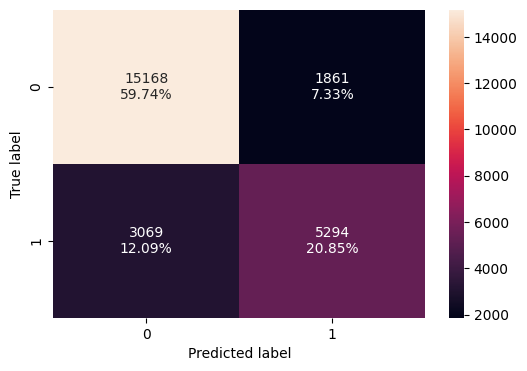

In [ ]:
# creating confusion matrix
confusion_matrix_statsmodels(lg2, X_train2, y_train)

In [ ]:
log_reg_model_train_perf = model_performance_classification_statsmodels(
    lg2, X_train2, y_train
)

print("Training performance:")
log_reg_model_train_perf

Training performance:


,Accuracy,Recall,Precision,F1
0,0.80584,0.63303,0.73990,0.68230


**Test set performance**

- We have to first drop the columns from the test set that were dropped from the training set.

In [ ]:
X_test2 = X_test[list(X_train2.columns)]

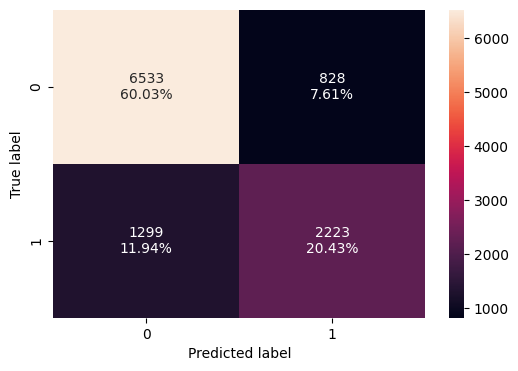

In [ ]:
# creating confusion matrix
confusion_matrix_statsmodels(lg2, X_test2, y_test)

In [ ]:
log_reg_model_test_perf = model_performance_classification_statsmodels(
    lg2, X_test2, y_test
)

print("Test performance:")
log_reg_model_test_perf

Test performance:


,Accuracy,Recall,Precision,F1
0,0.80456,0.63118,0.72861,0.67640


- The model f1_score of ~0.682 and ~0.676 on the train and test sets respectively.  This can be improved.
- As the train and test performances are comparable, the model is not overfitting
- Moving forward we will try to improve the performance of the model

## Model Performance Improvement

* Let's see if the f1_score can be improved further by changing the model threshold
* First, we will check the ROC curve, compute the area under the ROC curve (ROC-AUC), and then use it to find the optimal threshold
* Next, we will check the Precision-Recall curve to find the right balance between precision and recall as our metric of choice is f1_score


### ROC Curve and ROC-AUC

* ROC-AUC on training set

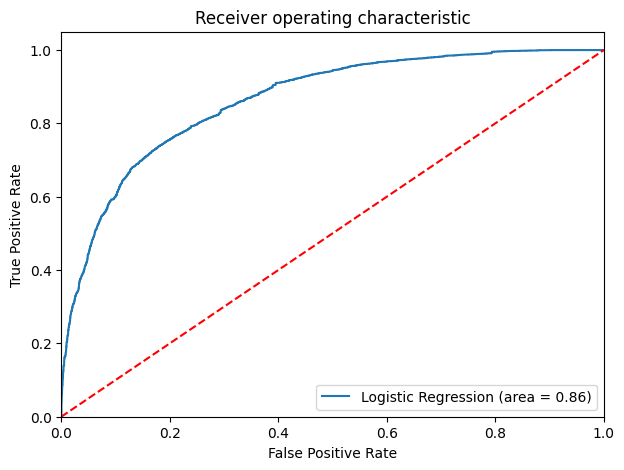

In [ ]:
logit_roc_auc_train = roc_auc_score(y_train, lg2.predict(X_train2))
fpr, tpr, thresholds = roc_curve(y_train, lg2.predict(X_train2))
plt.figure(figsize=(7, 5))
plt.plot(fpr, tpr, label="Logistic Regression (area = %0.2f)" % logit_roc_auc_train)
plt.plot([0, 1], [0, 1], "r--")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver operating characteristic")
plt.legend(loc="lower right")
plt.show()

* Logistic Regression model is giving a good performance on training set.

### Optimal threshold using AUC-ROC curve

In [ ]:
# Optimal threshold as per AUC-ROC curve
# The optimal cut off would be where tpr is high and fpr is low
fpr, tpr, thresholds = roc_curve(y_train, lg2.predict(X_train2))

optimal_idx = np.argmax(tpr - fpr)
optimal_threshold_auc_roc = thresholds[optimal_idx]
print(optimal_threshold_auc_roc)

0.3659611677614054


**Checking model performance on training set**



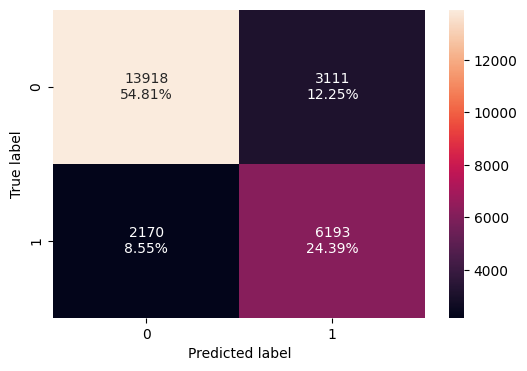

In [ ]:
# creating confusion matrix
confusion_matrix_statsmodels(
    lg2, X_train2, y_train, threshold=optimal_threshold_auc_roc
)

In [ ]:
# checking model performance for this model
log_reg_model_train_perf_threshold_auc_roc = model_performance_classification_statsmodels(
    lg2, X_train2, y_train, threshold=optimal_threshold_auc_roc
)
print("Training performance:")
log_reg_model_train_perf_threshold_auc_roc

Training performance:


,Accuracy,Recall,Precision,F1
0,0.79202,0.74052,0.66563,0.70108


On the training data
* F1 of model has increased from ~0.68 to ~0.70  but precision and accuracy reduced and recall increased.
* The model is still giving a good performance. We can try to improve the model

**Checking model performance on test set**




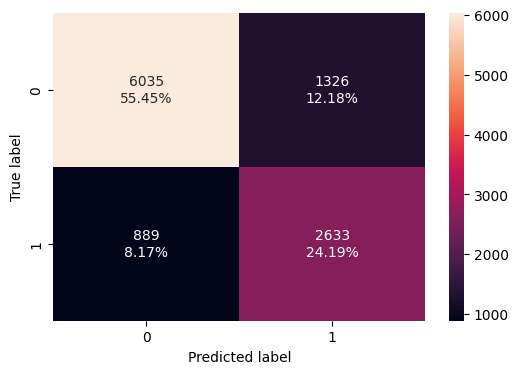

In [ ]:
# creating confusion matrix
confusion_matrix_statsmodels(lg2, X_test2, y_test, threshold=optimal_threshold_auc_roc)

In [ ]:
# checking model performance for this model
log_reg_model_test_perf_threshold_auc_roc = model_performance_classification_statsmodels(
    lg2, X_test2, y_test, threshold=optimal_threshold_auc_roc
)
print("Test performance:")
log_reg_model_test_perf_threshold_auc_roc

Test performance:


,Accuracy,Recall,Precision,F1
0,0.79647,0.74759,0.66507,0.70392


On the test data
* F1 for the test data has increased from ~0.68 to ~0.70  but precision and accuracy reduced and recall increased.
* The model is still giving a good performance. We can try to improve the model

### Precision-Recall Curve

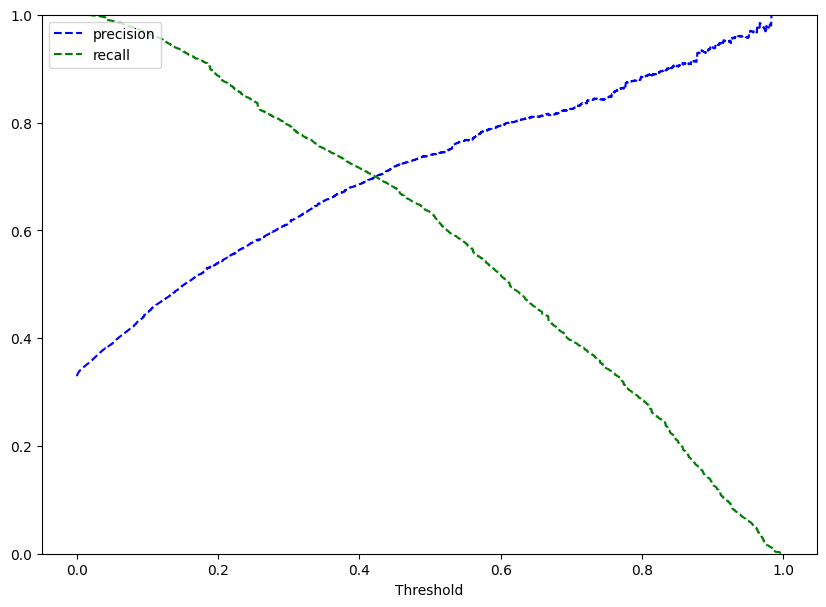

In [ ]:
y_scores = lg2.predict(X_train2)
prec, rec, tre = precision_recall_curve(y_train, y_scores,)


def plot_prec_recall_vs_tresh(precisions, recalls, thresholds):
    plt.plot(thresholds, precisions[:-1], "b--", label="precision")
    plt.plot(thresholds, recalls[:-1], "g--", label="recall")
    plt.xlabel("Threshold")
    plt.legend(loc="upper left")
    plt.ylim([0, 1])


plt.figure(figsize=(10, 7))
plot_prec_recall_vs_tresh(prec, rec, tre)
plt.show()

* At the threshold of 0.41, we get balanced recall and precision.

In [ ]:
# setting the threshold
optimal_threshold_curve = 0.41

**Checking model performance on training set**

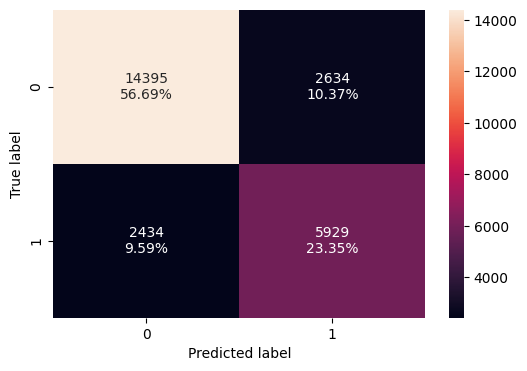

In [ ]:
# creating confusion matrix
confusion_matrix_statsmodels(lg2, X_train2, y_train, threshold=optimal_threshold_curve)

In [ ]:
log_reg_model_train_perf_threshold_curve = model_performance_classification_statsmodels(
    lg2, X_train2, y_train, threshold=optimal_threshold_curve
)
print("Training performance:")
log_reg_model_train_perf_threshold_curve

Training performance:


,Accuracy,Recall,Precision,F1
0,0.80041,0.70896,0.69240,0.70058


* Model is performing well for F1 the training set. Precision is better than in the AUC-ROC curve
* This model found that the optimal threshold was less than the default threashold of 0.5.  We see that recall increased and precision decreased from the first model where the threshold is 0.5.  When the threshold is less than 0.5 it means the model if allowing more false positives.  This leads to loss of opportunity in the business.

Let us see if we can get a better model by looking at Decision Trees

**Checking model performance on test set**

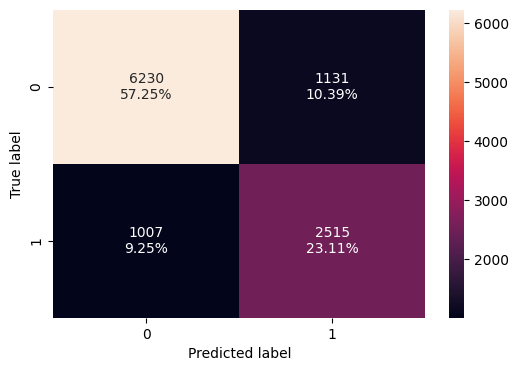

In [ ]:
# creating confusion matrix
confusion_matrix_statsmodels(lg2, X_test2, y_test, threshold=optimal_threshold_curve)

In [ ]:
log_reg_model_test_perf_threshold_curve = model_performance_classification_statsmodels(
    lg2, X_test2, y_test, threshold=optimal_threshold_curve
)
print("Test performance:")
log_reg_model_test_perf_threshold_curve

Test performance:


,Accuracy,Recall,Precision,F1
0,0.80355,0.71408,0.68980,0.70173


## Model Performance Comparison and Final Model Selection

In [ ]:
# training performance comparison

models_train_comp_df = pd.concat(
    [
        log_reg_model_train_perf.T,
        log_reg_model_train_perf_threshold_auc_roc.T,
        log_reg_model_train_perf_threshold_curve.T,
    ],
    axis=1,
)
models_train_comp_df.columns = [
    "Logistic Regression-default Threshold (0.5)",
    "Logistic Regression-0.37 Threshold",
    "Logistic Regression-0.41 Threshold",
]

print("Training performance comparison:")
models_train_comp_df

Training performance comparison:


,Logistic Regression-default Threshold (0.5),Logistic Regression-0.37 Threshold,Logistic Regression-0.41 Threshold
Accuracy,0.80584,0.79202,0.80041
Recall,0.63303,0.74052,0.70896
Precision,0.73990,0.66563,0.69240
F1,0.68230,0.70108,0.70058


In [ ]:
# testing performance comparison

models_test_comp_df = pd.concat(
    [
        log_reg_model_test_perf.T,
        log_reg_model_test_perf_threshold_auc_roc.T,
        log_reg_model_test_perf_threshold_curve.T,
    ],
    axis=1,
)
models_test_comp_df.columns = [
    "Logistic Regression-default Threshold (0.5)",
    "Logistic Regression-0.37 Threshold",
    "Logistic Regression-0.41 Threshold",
]

print("Testing performance comparison:")
models_test_comp_df

Testing performance comparison:


,Logistic Regression-default Threshold (0.5),Logistic Regression-0.37 Threshold,Logistic Regression-0.41 Threshold
Accuracy,0.80456,0.79647,0.80355
Recall,0.63118,0.74759,0.71408
Precision,0.72861,0.66507,0.68980
F1,0.67640,0.70392,0.70173


- Almost all the three models are performing well on both training and test data without the problem of overfitting
- The model with a a threshold of 0.37 (the AUC-ROC Threshold) is giving the best F1 score. This is the best model using this approach.

Now we will build Decision Trees and compare its results to the logistic regression results to determine the best model

## Final Model Summary

* We have been able to build a predictive model that can be used by INN Hotels to predict booking cancellations with an f1_score of 0.70 on the training and test set.

* All the logistic regression models have given a generalized performance on the training and test set.

* The following coefficients if increased will increase the chances of a booking cancellations
> `no_of_adults`, `no_of_children`, `no_of_weekend_nights`, `no_of_week_nights`, `lead_time`, `arrival_year`, `no_of_previous_cancellations`, `avg_price_per_room`, `type_of_meal_plan_Meal Plan 2`, `type_of_meal_plan_Not Selected`, ``

* The following coefficients if increased will decrease the chances of a booking cancellations
> `required_car_parking_space`, `arrival_month`, `repeated_guest`, `no_of_special_requests`, `room_type_reserved_Room_Type 2`, `room_type_reserved_Room_Type 4`,`room_type_reserved_Room_Type 5`, `room_type_reserved_Room_Type 6`, `room_type_reserved_Room_Type 7`, `market_segment_type_Complementary`, `market_segment_type_Corporate`, `market_segment_type_Offline`



## Building a Decision Tree model

### Decision Tree (default)

In [ ]:
model0 = DecisionTreeClassifier(random_state=1)
model0.fit(X_train, y_train)

DecisionTreeClassifier(random_state=1)

### Model Evaluation

> We established above that we are interested in reducing both flase positives and false negatives as they are both revenue diminishing, as well as having other undesirable impacts on the INN Hotel customer relations, reputation, resource allocations and furture planning.  We are interested in the model which gives us the largest F1 score.


In [ ]:
# defining a function to compute different metrics to check performance of a classification model built using sklearn
def model_performance_classification_sklearn(model, predictors, target):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    """

    # predicting using the independent variables
    pred = model.predict(predictors)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred)  # to compute Recall
    precision = precision_score(target, pred)  # to compute Precision
    f1 = f1_score(target, pred)  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {"Accuracy": acc, "Recall": recall, "Precision": precision, "F1": f1,},
        index=[0],
    )

    return df_perf

In [ ]:
def confusion_matrix_sklearn(model, predictors, target):
    """
    To plot the confusion_matrix with percentages

    model: classifier
    predictors: independent variables
    target: dependent variable
    """
    y_pred = model.predict(predictors)
    cm = confusion_matrix(target, y_pred)
    labels = np.asarray(
        [
            ["{0:0.0f}".format(item) + "\n{0:.2%}".format(item / cm.flatten().sum())]
            for item in cm.flatten()
        ]
    ).reshape(2, 2)

    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=labels, fmt="")
    plt.ylabel("True label")
    plt.xlabel("Predicted label")

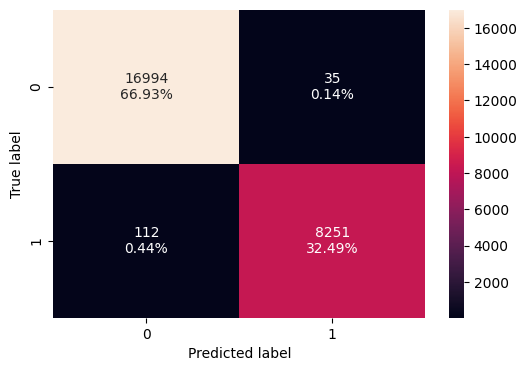

In [ ]:
confusion_matrix_sklearn(model0, X_train, y_train)

In [ ]:
decision_tree_perf_train_without = model_performance_classification_sklearn(
    model0, X_train, y_train
)
decision_tree_perf_train_without

,Accuracy,Recall,Precision,F1
0,0.99421,0.98661,0.99578,0.99117


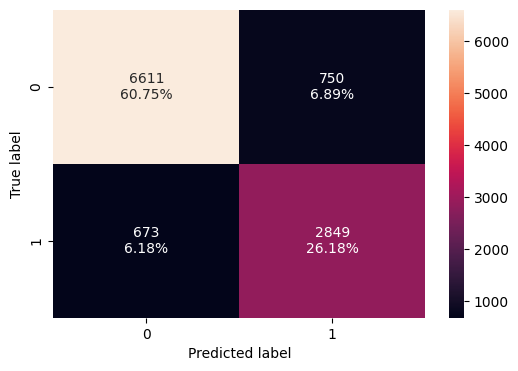

In [ ]:
confusion_matrix_sklearn(model0, X_test, y_test)

In [ ]:
decision_tree_perf_test_without = model_performance_classification_sklearn(
    model0, X_test, y_test
)
decision_tree_perf_test_without

,Accuracy,Recall,Precision,F1
0,0.86925,0.80892,0.79161,0.80017


* We can see that the model is overfitting on the training data and performing well on the test data

### Decision Tree (with class_weights)

* If the frequency of class A is 10% and the frequency of class B is 90%, then class B will become the dominant class and the decision tree will become biased toward the dominant classes

* In this case, we will set class_weight = "balanced", which will automatically adjust the weights to be inversely proportional to the class frequencies in the input data

* class_weight is a hyperparameter for the decision tree classifier

In [ ]:
model = DecisionTreeClassifier(random_state=1, class_weight="balanced")
model.fit(X_train, y_train)

DecisionTreeClassifier(class_weight='balanced', random_state=1)

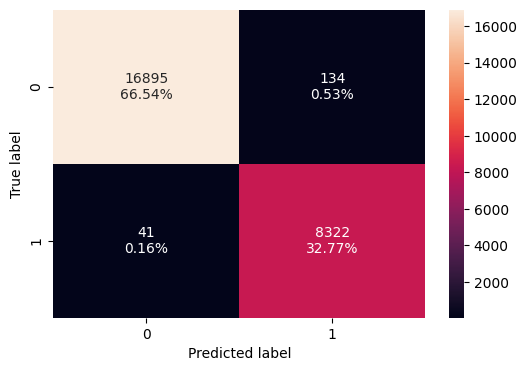

In [ ]:
confusion_matrix_sklearn(model, X_train, y_train)

In [ ]:
decision_tree_perf_train = model_performance_classification_sklearn(
    model, X_train, y_train
)
decision_tree_perf_train

,Accuracy,Recall,Precision,F1
0,0.99311,0.99510,0.98415,0.98960


* The model classifies almost perfectly on the training data, with very minimal errors in the False Positives and False Negatives (less than 1%)
* * As we know a decision tree will continue to grow and classify each data point correctly if no restrictions are applied as the trees will learn all the patterns in the training set.
* This generally leads to overfitting of the model as Decision Tree will perform well on the training set but will fail to replicate the performance on the test set.

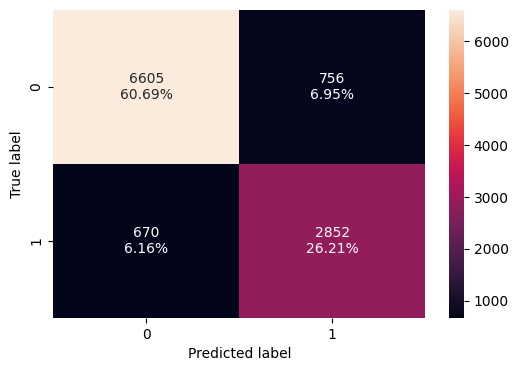

In [ ]:
confusion_matrix_sklearn(model, X_test, y_test)

In [ ]:
decision_tree_perf_test = model_performance_classification_sklearn(
    model, X_test, y_test
)
decision_tree_perf_test

,Accuracy,Recall,Precision,F1
0,0.86897,0.80977,0.79047,0.80000


* As expected, the performance measurements reduced accross all 4 measurements: Accuracy, Recall, Precision and F1.  Although these as good results, we still conculde the model is overfitting because it was almost 100% on the training data and approx. 20% less on the test data

**Let's use pruning techniques to try and reduce overfitting.**

## Do we need to prune the tree? YES

### Decision Tree (Pre-pruning)

**Using GridSearch for Hyperparameter tuning of our tree model**

* Hyperparameter tuning is also tricky in the sense that there is no direct way to calculate how a change in the
  hyperparameter value will reduce the loss of your model, so we usually resort to experimentation. i.e we'll use Grid search
* Grid search is a tuning technique that attempts to compute the optimum values of hyperparameters.
* It is an exhaustive search that is performed on the specific parameter values of a model.
* The parameters of the estimator/model used to apply these methods are optimized by cross-validated grid-search over a parameter grid.

In [ ]:
# Choose the type of classifier.
estimator = DecisionTreeClassifier(random_state=1)

# Grid of parameters to choose from
parameters = {
    "class_weight": [None, "balanced"],
    "max_depth": np.arange(2, 7, 2),
    "max_leaf_nodes": [50, 75, 150, 250],
    "min_samples_split": [10, 30, 50, 70],
}

# Type of scoring used to compare parameter combinations
acc_scorer = make_scorer(f1_score)

# Run the grid search
grid_obj = GridSearchCV(estimator, parameters, scoring=acc_scorer, cv=5)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
estimator = grid_obj.best_estimator_

# Fit the best algorithm to the data.
estimator.fit(X_train, y_train)

DecisionTreeClassifier(class_weight='balanced', max_depth=6, max_leaf_nodes=50,
                       min_samples_split=10, random_state=1)

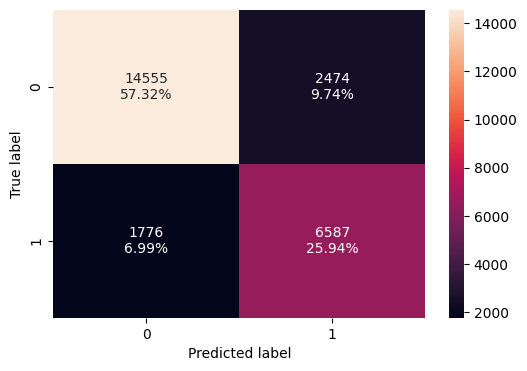

In [ ]:
confusion_matrix_sklearn(estimator, X_train, y_train)

In [ ]:
decision_tree_tune_perf_train = model_performance_classification_sklearn(
    estimator, X_train, y_train
)
decision_tree_tune_perf_train

,Accuracy,Recall,Precision,F1
0,0.83262,0.78764,0.72696,0.75608


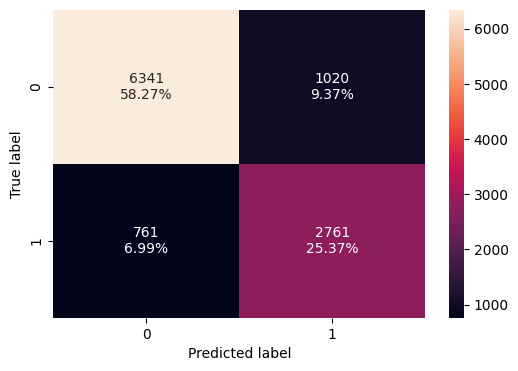

In [ ]:
confusion_matrix_sklearn(estimator, X_test, y_test)

In [ ]:
decision_tree_tune_perf_test = model_performance_classification_sklearn(
    estimator, X_test, y_test
)
decision_tree_tune_perf_test

,Accuracy,Recall,Precision,F1
0,0.83635,0.78393,0.73023,0.75613


* The model is more grneralized now as we can see from the results on the training data.
* The model is no longer overfitting

In [ ]:
feature_names = list(X_train.columns)
importances = estimator.feature_importances_
indices = np.argsort(importances)

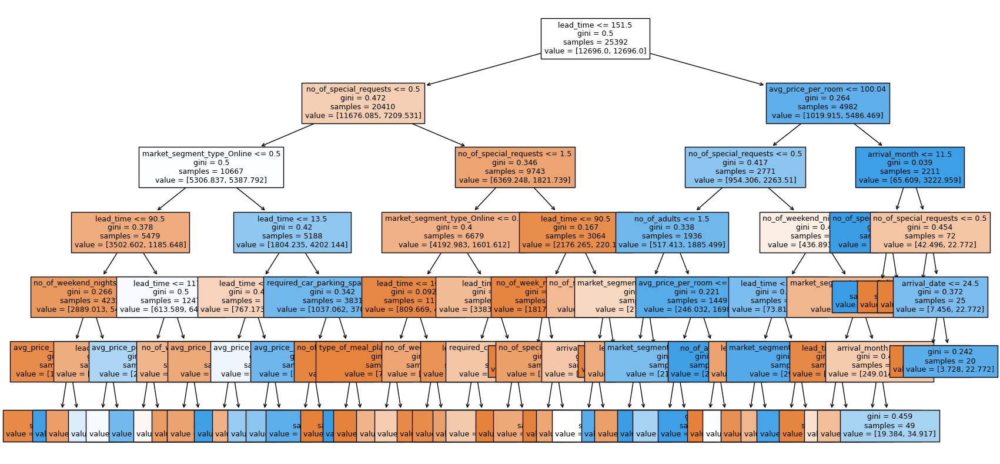

In [ ]:
plt.figure(figsize=(20, 10))
out = tree.plot_tree(
    estimator,
    feature_names=feature_names,
    filled=True,
    fontsize=9,
    node_ids=False,
    class_names=None,
)
# below code will add arrows to the decision tree split if they are missing
for o in out:
    arrow = o.arrow_patch
    if arrow is not None:
        arrow.set_edgecolor("black")
        arrow.set_linewidth(1)
plt.show()


In [ ]:
# Text report showing the rules of a decision tree -
print(tree.export_text(estimator, feature_names=feature_names, show_weights=True))

|--- lead_time <= 151.50
|   |--- no_of_special_requests <= 0.50
|   |   |--- market_segment_type_Online <= 0.50
|   |   |   |--- lead_time <= 90.50
|   |   |   |   |--- no_of_weekend_nights <= 0.50
|   |   |   |   |   |--- avg_price_per_room <= 196.50
|   |   |   |   |   |   |--- weights: [1790.82, 132.08] class: 0
|   |   |   |   |   |--- avg_price_per_room >  196.50
|   |   |   |   |   |   |--- weights: [0.75, 25.81] class: 1
|   |   |   |   |--- no_of_weekend_nights >  0.50
|   |   |   |   |   |--- lead_time <= 68.50
|   |   |   |   |   |   |--- weights: [966.24, 223.16] class: 0
|   |   |   |   |   |--- lead_time >  68.50
|   |   |   |   |   |   |--- weights: [131.22, 160.92] class: 1
|   |   |   |--- lead_time >  90.50
|   |   |   |   |--- lead_time <= 117.50
|   |   |   |   |   |--- avg_price_per_room <= 93.58
|   |   |   |   |   |   |--- weights: [215.46, 227.72] class: 1
|   |   |   |   |   |--- avg_price_per_room >  93.58
|   |   |   |   |   |   |--- weights: [82.76, 285.41] 

**Observations from the pre-pruned tree:**

Using the above extracted decision rules we can make interpretations from the decision tree model like:

* If the `lead_time` is less than or equal to 151.50, the `no_of_special_requests` is less than or equal to 0.5, the `market_segment_type_Online ` is less than or equal to 0.50, the `lead_time` is less than 90.50, the `no_of_weekend_nights` isnless than or equal to 0.50 and the `avg_price_per_room` is greater than 196.50 euros then the booking would most likely be cancelled.

`Interpretations from other decision rules can be made similarly`

**** Looking at which features contributed the most to the model in pre-pruning

In [ ]:
importances = estimator.feature_importances_
importances

array([0.        , 0.02675899, 0.        , 0.02114756, 0.00693642,
       0.01412421, 0.46835802, 0.        , 0.01229549, 0.00075584,
       0.        , 0.        , 0.        , 0.07690475, 0.16591956,
       0.        , 0.        , 0.00072322, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.00726704, 0.19880891])

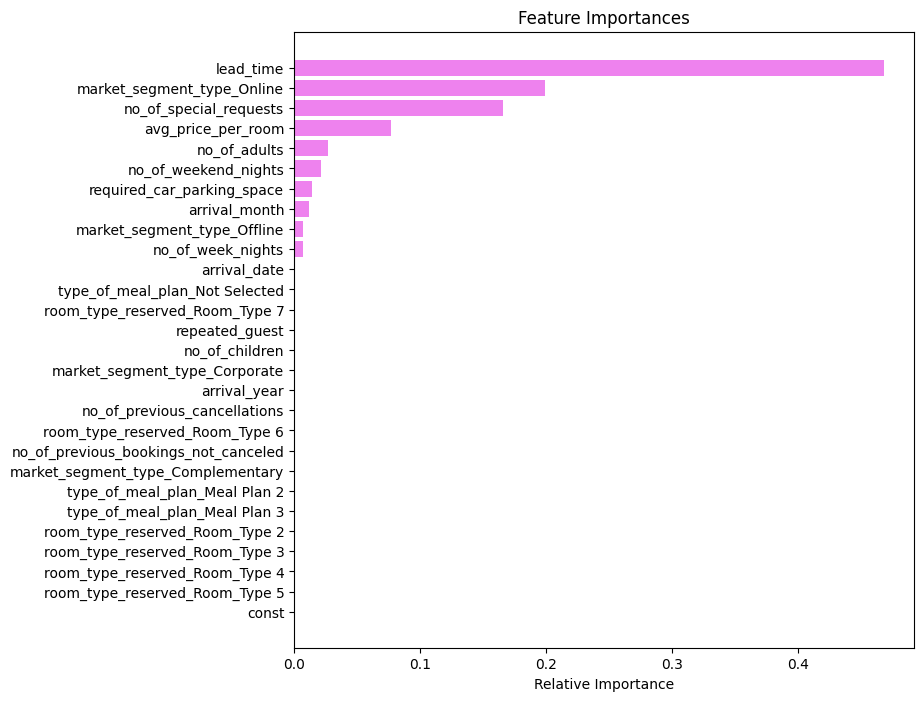

In [ ]:
# importance of features in the tree building

importances = estimator.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(8, 8))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="violet", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

* In the pre pruned decision tree `lead_time` and `market_segment_online` are the most important features

### Decision Tree (Post pruning)

The DecisionTreeClassifier provides parameters such as min_samples_leaf and max_depth to prevent a tree from overfiting. Cost complexity pruning provides another option to control the size of a tree. In DecisionTreeClassifier, this pruning technique is parameterized by the cost complexity parameter, ccp_alpha. Greater values of ccp_alpha increase the number of nodes pruned. Here we only show the effect of ccp_alpha on regularizing the trees and how to choose a ccp_alpha based on validation scores.

**Total impurity of leaves vs effective alphas of pruned tree**

Minimal cost complexity pruning recursively finds the node with the "weakest
link". The weakest link is characterized by an effective alpha, where the
nodes with the smallest effective alpha are pruned first. To get an idea of
what values of ``ccp_alpha`` could be appropriate, scikit-learn provides
`DecisionTreeClassifier.cost_complexity_pruning_path` that returns the
effective alphas and the corresponding total leaf impurities at each step of
the pruning process. As alpha increases, more of the tree is pruned, which
increases the total impurity of its leaves.

In [ ]:
clf = DecisionTreeClassifier(random_state=1, class_weight="balanced")
path = clf.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas, impurities = abs(path.ccp_alphas), path.impurities

In [ ]:
pd.DataFrame(path)

,ccp_alphas,impurities
0,0.00000,0.00838
1,0.00000,0.00838
2,0.00000,0.00838
3,0.00000,0.00838
4,0.00000,0.00838
...,...,...
1827,0.00908,0.32689
1828,0.00980,0.33669
1829,0.01182,0.34851
1830,0.03516,0.41882


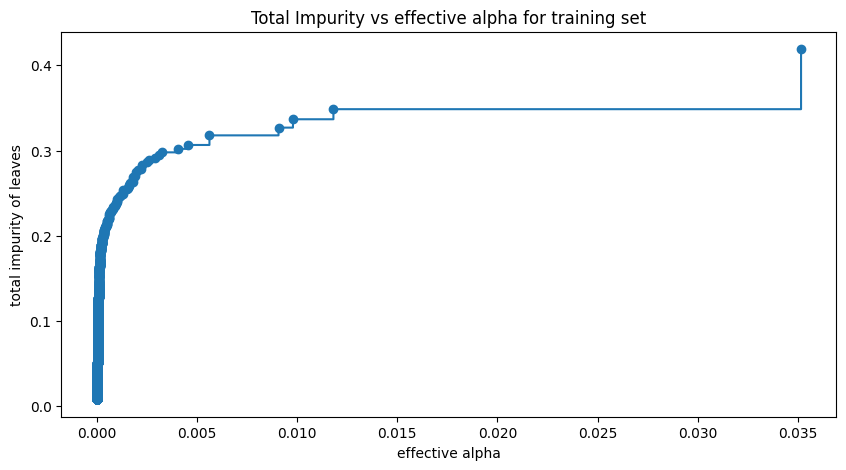

In [ ]:
fig, ax = plt.subplots(figsize=(10, 5))
ax.plot(ccp_alphas[:-1], impurities[:-1], marker="o", drawstyle="steps-post")
ax.set_xlabel("effective alpha")
ax.set_ylabel("total impurity of leaves")
ax.set_title("Total Impurity vs effective alpha for training set")
plt.show()

We see that as effective increases, so does impurity of the leaves, this is becuase the tree is becoming less complex.

Next, we train a decision tree using the effective alphas. The last value
in ``ccp_alphas`` is the alpha value that prunes the whole tree,
leaving the tree, ``clfs[-1]``, with one node.

In [ ]:
clfs = []
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeClassifier(
        random_state=1, ccp_alpha=ccp_alpha, class_weight="balanced"
    )
    clf.fit(X_train, y_train)
    clfs.append(clf)
print(
    "Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
        clfs[-1].tree_.node_count, ccp_alphas[-1]
    )
)

Number of nodes in the last tree is: 1 with ccp_alpha: 0.08117914389136949


For the remainder, we remove the last element in clfs and ccp_alphas, because it is the trivial tree with only one node. Here we show that the number of nodes and tree depth decreases as alpha increases.

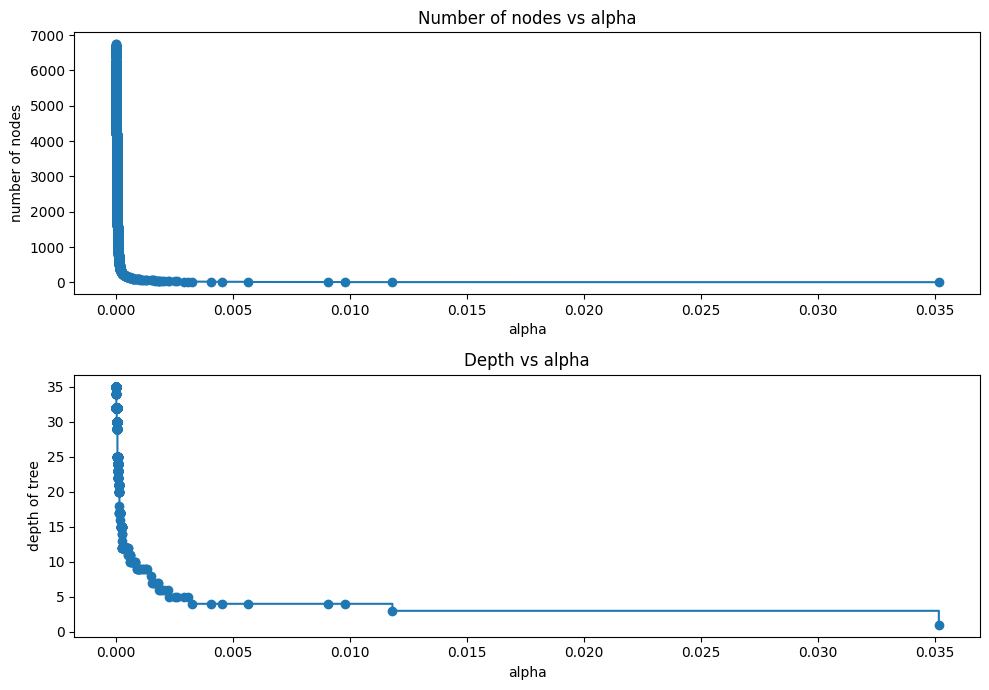

In [ ]:
clfs = clfs[:-1]
ccp_alphas = ccp_alphas[:-1]

node_counts = [clf.tree_.node_count for clf in clfs]
depth = [clf.tree_.max_depth for clf in clfs]
fig, ax = plt.subplots(2, 1, figsize=(10, 7))
ax[0].plot(ccp_alphas, node_counts, marker="o", drawstyle="steps-post")
ax[0].set_xlabel("alpha")
ax[0].set_ylabel("number of nodes")
ax[0].set_title("Number of nodes vs alpha")
ax[1].plot(ccp_alphas, depth, marker="o", drawstyle="steps-post")
ax[1].set_xlabel("alpha")
ax[1].set_ylabel("depth of tree")
ax[1].set_title("Depth vs alpha")
fig.tight_layout()

We see that as alpha increases the depth of the tree decreases (the tree gets smaller) and the number of nodes decreases.  

In [ ]:
# Calculating the f1 score on the training dataset for every training tree created above
f1_train = []
for clf in clfs:
    pred_train = clf.predict(X_train)
    values_train = f1_score(y_train, pred_train)
    f1_train.append(values_train)

In [ ]:
# Calculating the f1 score on the testing dataset
f1_test = []
for clf in clfs:
    pred_test = clf.predict(X_test)
    values_test = f1_score(y_test, pred_test)
    f1_test.append(values_test)

In [ ]:
train_scores = [clf.score(X_train, y_train) for clf in clfs]
test_scores = [clf.score(X_test, y_test) for clf in clfs]

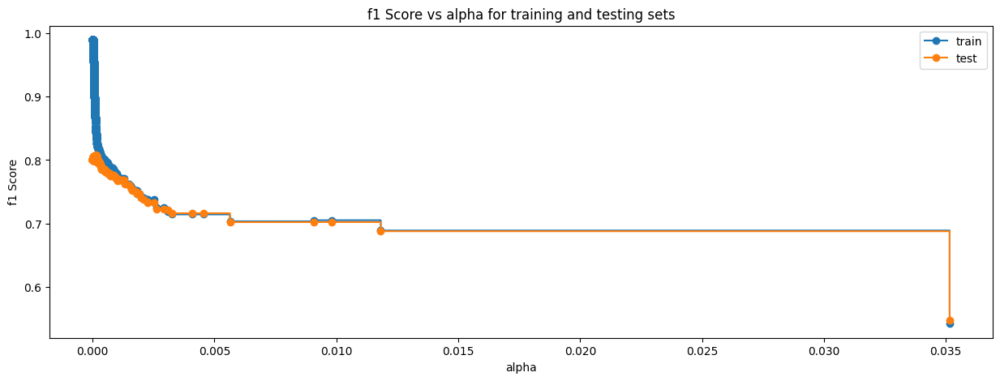

In [ ]:
fig, ax = plt.subplots(figsize=(15, 5))
ax.set_xlabel("alpha")
ax.set_ylabel("f1 Score")
ax.set_title("f1 Score vs alpha for training and testing sets")
ax.plot(
    ccp_alphas, f1_train, marker="o", label="train", drawstyle="steps-post",
)
ax.plot(ccp_alphas, f1_test, marker="o", label="test", drawstyle="steps-post")
ax.legend()
plt.show()

*  we see that as alpha increases the training f1 scores decreases, this is expected because the tree becomes smaller.
*  However, we see that as alpha decreases the f1 score for the test data also decreases. We also saw this result when we calcualted the f1 score of the full tree.  

In [ ]:
# creating the model where we get highest train and test f1 score
index_best_model = np.argmax(f1_test)
best_model = clfs[index_best_model]
print(best_model)

DecisionTreeClassifier(ccp_alpha=0.00014396725712034883,
                       class_weight='balanced', random_state=1)


In [ ]:
# checking the f1 score for the best model
print (f1_test[1641])

0.8075778078484438


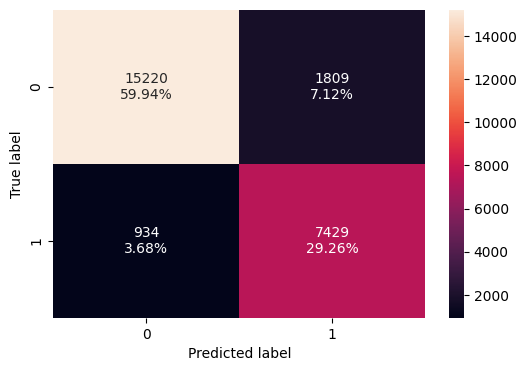

In [ ]:
confusion_matrix_sklearn(best_model, X_train, y_train)

In [ ]:
decision_tree_post_perf_train = model_performance_classification_sklearn(
    best_model, X_train, y_train
)
decision_tree_post_perf_train

,Accuracy,Recall,Precision,F1
0,0.89197,0.88832,0.80418,0.84416


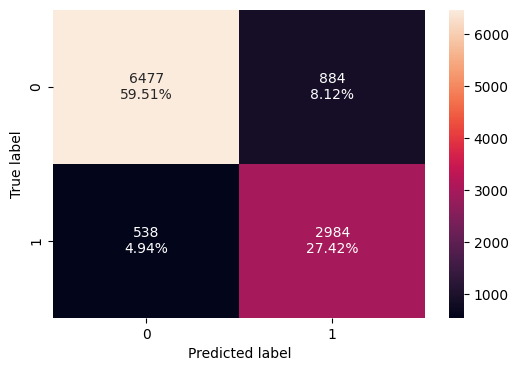

In [ ]:
confusion_matrix_sklearn(best_model, X_test, y_test)

In [ ]:
decision_tree_post_test = model_performance_classification_sklearn(
    best_model, X_test, y_test
)
decision_tree_post_test

,Accuracy,Recall,Precision,F1
0,0.86934,0.84725,0.77146,0.80758


* In the post-pruned tree also, the model is giving a generalized result since the f1 scores on the train set is 0.844 and test data  is 0.80 which shows that the model is able to generalize well on unseen data.

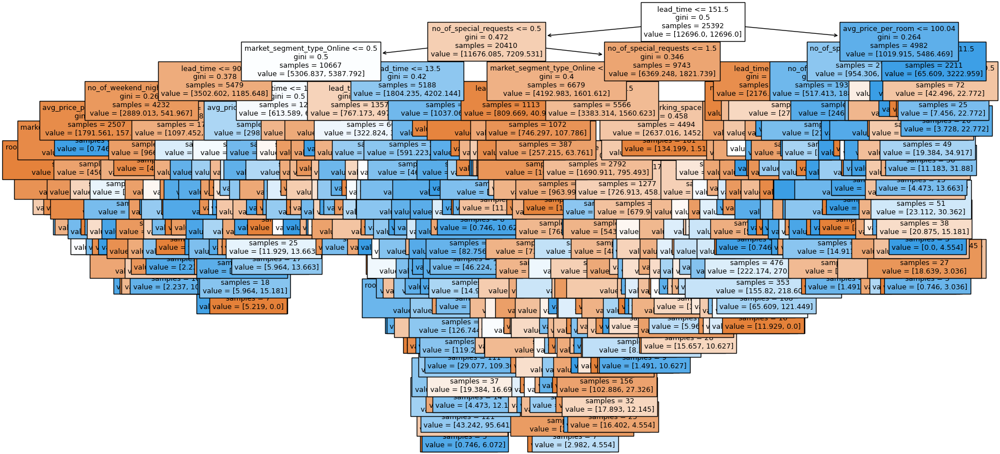

In [ ]:
plt.figure(figsize=(20, 10))

out = tree.plot_tree(
    best_model,
    feature_names=feature_names,
    filled=True,
    fontsize=9,
    node_ids=False,
    class_names=None,
)
for o in out:
    arrow = o.arrow_patch
    if arrow is not None:
        arrow.set_edgecolor("black")
        arrow.set_linewidth(1)
plt.show()

In [ ]:
# Text report showing the rules of a decision tree -

print(tree.export_text(best_model, feature_names=feature_names, show_weights=True))

|--- lead_time <= 151.50
|   |--- no_of_special_requests <= 0.50
|   |   |--- market_segment_type_Online <= 0.50
|   |   |   |--- lead_time <= 90.50
|   |   |   |   |--- no_of_weekend_nights <= 0.50
|   |   |   |   |   |--- avg_price_per_room <= 196.50
|   |   |   |   |   |   |--- market_segment_type_Corporate <= 0.50
|   |   |   |   |   |   |   |--- room_type_reserved_Room_Type 4 <= 0.50
|   |   |   |   |   |   |   |   |--- weights: [1261.47, 3.04] class: 0
|   |   |   |   |   |   |   |--- room_type_reserved_Room_Type 4 >  0.50
|   |   |   |   |   |   |   |   |--- market_segment_type_Offline <= 0.50
|   |   |   |   |   |   |   |   |   |--- weights: [17.89, 10.63] class: 0
|   |   |   |   |   |   |   |   |--- market_segment_type_Offline >  0.50
|   |   |   |   |   |   |   |   |   |--- weights: [61.14, 0.00] class: 0
|   |   |   |   |   |   |--- market_segment_type_Corporate >  0.50
|   |   |   |   |   |   |   |--- no_of_adults <= 1.50
|   |   |   |   |   |   |   |   |--- lead_time <= 1

In [ ]:
importances = best_model.feature_importances_
indices = np.argsort(importances)

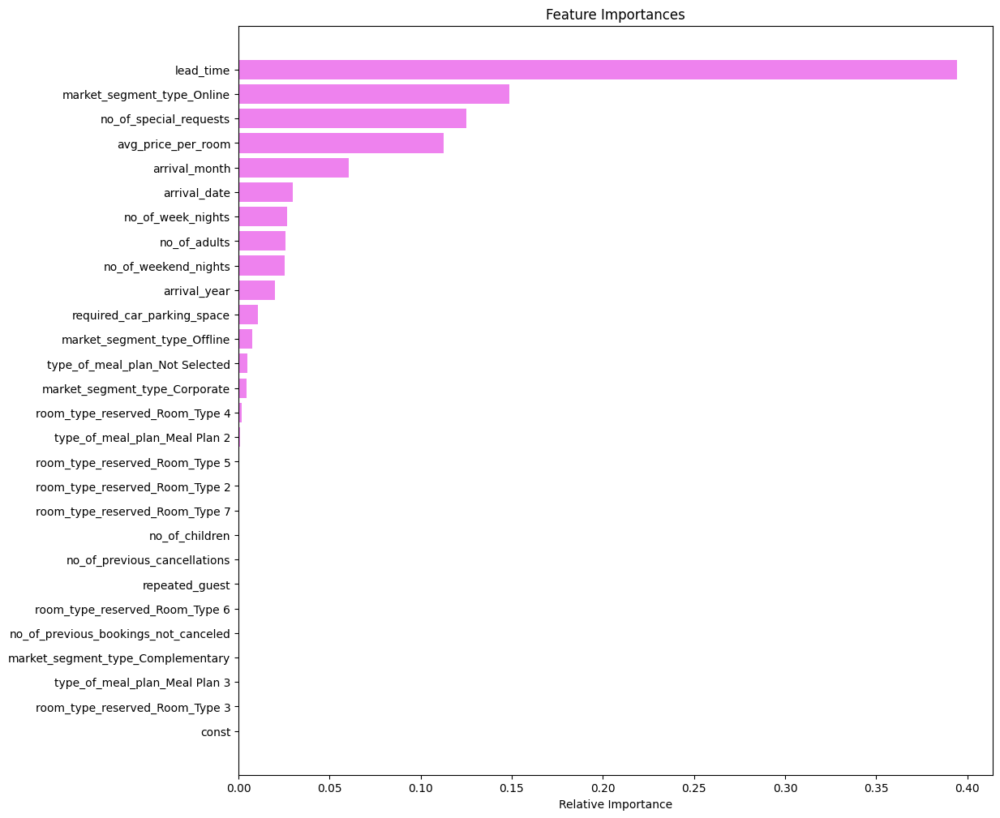

In [ ]:
plt.figure(figsize=(12, 12))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="violet", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

* Similar to the pre pruned tree, `lead-time` and `market_segment_type_online` are the most important features.

## Model Performance Comparison

In [ ]:
# training performance comparison

models_train_comp_df = pd.concat(
    [
        decision_tree_perf_train_without.T,
        decision_tree_perf_train.T,
        decision_tree_tune_perf_train.T,
        decision_tree_post_perf_train.T,
    ],
    axis=1,
)
models_train_comp_df.columns = [
    "Decision Tree without class_weight",
    "Decision Tree with class_weight",
    "Decision Tree (Pre-Pruning)",
    "Decision Tree (Post-Pruning)",
]
print("Training performance comparison:")
models_train_comp_df

Training performance comparison:


,Decision Tree without class_weight,Decision Tree with class_weight,Decision Tree (Pre-Pruning),Decision Tree (Post-Pruning)
Accuracy,0.99421,0.99311,0.83262,0.89197
Recall,0.98661,0.99510,0.78764,0.88832
Precision,0.99578,0.98415,0.72696,0.80418
F1,0.99117,0.98960,0.75608,0.84416


In [ ]:
# testing performance comparison

models_test_comp_df = pd.concat(
    [
        decision_tree_perf_test_without.T,
        decision_tree_perf_test.T,
        decision_tree_tune_perf_test.T,
        decision_tree_post_test.T,
    ],
    axis=1,
)
models_test_comp_df.columns = [
    "Decision Tree without class_weight",
    "Decision Tree with class_weight",
    "Decision Tree (Pre-Pruning)",
    "Decision Tree (Post-Pruning)",
]
print("Test set performance comparison:")
models_test_comp_df

Test set performance comparison:


,Decision Tree without class_weight,Decision Tree with class_weight,Decision Tree (Pre-Pruning),Decision Tree (Post-Pruning)
Accuracy,0.86925,0.86897,0.83635,0.86934
Recall,0.80892,0.80977,0.78393,0.84725
Precision,0.79161,0.79047,0.73023,0.77146
F1,0.80017,0.80000,0.75613,0.80758


** Decision tree models with pre-pruning and post-pruning both are giving equally high recall scores on both training and test sets.
* The best f1 scores are in the decision tree with post pruning, this also gave the best Accuracy, Recall and comparable precision scores.
* For the decision tree we will choose the post pruning method

*** Comparing the results of Logistic Regression and Decision Trees

In [ ]:
# testing performance comparison - logistic regression

models_test_comp_df = pd.concat(
    [
        log_reg_model_test_perf.T,
        log_reg_model_test_perf_threshold_auc_roc.T,
        log_reg_model_test_perf_threshold_curve.T,
    ],
    axis=1,
)
models_test_comp_df.columns = [
    "Logistic Regression-default Threshold (0.5)",
    "Logistic Regression-0.37 Threshold",
    "Logistic Regression-0.41 Threshold",
]

print("Testing performance comparison:")
models_test_comp_df

Testing performance comparison:


,Logistic Regression-default Threshold (0.5),Logistic Regression-0.37 Threshold,Logistic Regression-0.41 Threshold
Accuracy,0.80456,0.79647,0.80355
Recall,0.63118,0.74759,0.71408
Precision,0.72861,0.66507,0.68980
F1,0.67640,0.70392,0.70173


* We previously determined that the model with a a threshold of 0.37 (the AUC-ROC Threshold) is giving the best F1 score. This is the best model using the logistic regression approach.
* Comparing this to the post pruning decision tree, we see that the post pruning decision tree is the best method to get the best overall scores in f1 and and the other performance measurements

### Conclusions
In this analysis we created various models to predict hotel booking cancellations using both logistic regression and decision trees.  We used various approaches such as default thresholds, AUC-ROC curves and Precision-Recall curve to determine the best threshold for our logistic regression model.  For decision trees, we used hyperparamentes, gini impurity and CCP alpha to get the best models from the pre pruning and post pruning trees.  

We decided that both False Positives and False Negatives were important to reduce as both the increase of operational expenses and the loss of opportunity were not cost effective options for INN Hotels.  For this reason, although we measured all performance metrics:  Accuracy, Precision, Recall and F1, we aimed to maximize the F1 score as this gives the higher the chances of reducing both False Negatives and False Positives and identifying both the classes correctly.  While doing this we also kept an eye on the other perfomrance metrics Accuracy, Precision and Recall values as we wanted the best model to perform well in those metrics.

For logistic regression, the AUC-ROC threshold of 0.37 gave the best performance with an F1 score of 0.70392 and Precision and Recall scores of 0.66507 and 0.74759 respectively, indicating the model performed well.  However the decision tree post pruning method gave the overall best model with an F1 score of 0.80758, a Precision and Recall of 0.77146 and 0.84725 respectively.  The decision tree post pruning model was chosen as the best anf final model given the data provided.  Above shows multiple paths which can be used to determine if a booking will be cancelled.  An example of this is:
>if the `lead_time` <= 151.50 and `no_of_special_requests` <= 0.50 and `market_segment_type_Online` <= 0.50 and `lead_time` <= 90.50 and `no_of_weekend_nights` >  0.50 and `lead_time` <= 68.50 and `arrival_month` <=sns.pairplot(data, hue="Risk")
plt.show() 9.50 and `avg_price_per_room` >  63.29 and `no_of_weekend_nights` >  3.50 then then booking would most likely be cancelled

This modellng process can be improved by adding more data, variables and providing more information to help with outlier treatments and incorrect data.  For example some bookings were made with 0 adults and there was not enough information to determine if this was explinable.  Frequent maintenance of the model is necessary as the hotel industry of very dynamic and data intensive.

## Actionable Insights and Recommendations

> What profitable policies for cancellations and refunds can the hotel adopt?
* INN hotel can offer a price matching strategy for bookings which may be cancelled because the guest found a cheaper option.
* INN Hotels can also look at having non-refundable rates and rebooking opportunities, additionally the hotel can offer credit for future stay (loyalty programs)
*  INN Hotel can adjust its cancellation fees to be increasing as the cancellation date gets closer to the arrival date.  This would help increase the lead time for cancellation and give the hotel time to rebook the room at a full price.
*  We see from the data that coorporate and complementary bookings have high rates of cancellations, the hotel can prevent these booking from being cancelled or maybe a penalty for not using the booking, as these rooms could have been used for a paying guest.
*  Finally Inn Hotels should review their cancellation policies.
  >What other recommedations would you suggest to the hotel?
* As the most important features was lead time, market segment online, price per room and number of special requests it is important to focus on these in the future to minimize booking cancellations
* Online market segment consisted of 64% of the bookings yet then had the highest room price rates.  INN hotels can attract more clients by promotions for onloine bookings and working with booking websites such as Expedia and Booking.com to promote their hotel rooms.
* Peak months are from August to October and off peak months are November to July.  INN Hotels can offer packages and incentives to attract more guests for off peak season.  For example, they can offer staycations, weekend getaways and focus on other offerings from the hotel such as spa day, ladies night at the bar etc.
* Using the peak and off peak months INN Hotel can better allocate staff and resources
* As the hotel industry is rapidly changing and online bookings become more preffered, competition increases, this provides a vast amount of data which can be modelled to predict hotel cancellations with more accuracy.  Data is in real time and models can be created that changes prices by the minute based on demand, for this reason I recommend tha INN Hotels have inhouse data scientist team.